In [1]:
import numpy as np
import  matplotlib.pyplot as plt
from tensorflow import random
from tensorflow import keras
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Dense,Dropout,BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import  mean_squared_error
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import seaborn as sns
import shap
import h5py
import joblib
from imblearn.over_sampling import SMOTE,ADASYN

D:\Anaconda1\envs\pttf\lib\site-packages\shap\utils\_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
D:\Anaconda1\envs\pttf\lib\site-packages\shap\utils\_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def delta_minimization_order(all_masks, max_swap_size=100, nu

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.


## Training set test set partition

In [2]:
np.random.seed(27)
data_train = pd.read_excel('6727917b8b56afe32a5e11aebb983810_54897e9cb4261c7c432bc769194d905e_8.xlsx')
data_test = pd.read_excel("Liver injury (around the Lake) - Predictive data (removal of suspicious samples - Zhai Yang review).xlsx")                           

In [11]:
data_test.isnull().sum()

编号                                     0
Age                                    0
Sex                                    0
Surgery                                0
Time from onset to hospitalization     0
Hypertension                           0
Diabetes mellitus                      0
Coronary heart disease                 0
Cerebral infarction/hemorrhage         0
GCS                                    0
Hemostatics                            0
Proton pump inhibitors                 0
Expectorants                           0
Dehydrant                              0
Valproate                              0
Analgesics and sedatives               0
Human Albumin                          0
Cephalosporins                         0
Additive enzyme inhibitors             0
Carbapenems                            0
Vancomycin                             0
Tigecycline                            0
Linezolid                              0
GGT                                    0
ALB             

In [3]:
#Missing value filling
from fancyimpute import IterativeImputer
mice_imputer = IterativeImputer()
data_test.iloc[:, :] = mice_imputer.fit_transform(data_test)

In [7]:
feature_data , target = data_train.drop(columns='Whether there is liver damage').drop(columns='Hepatoprotectants'),data_train['Whether there is liver damage']

### Feature selection

In [5]:
from sklearn.feature_selection import SelectFromModel, SelectKBest, RFE
from sklearn.ensemble import RandomForestClassifier

In [6]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
featureNames = feature_data.columns
scaler = StandardScaler()
feature_data = scaler.fit_transform(feature_data)
clf = LinearSVC()

model = RFE(clf,n_features_to_select=9)
model.fit(feature_data,target)
select_feature = list(np.array(featureNames)[model.support_])
print('choosed features:\n',select_feature)

Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to conve

choosed features:
 ['Sex', 'Analgesics and sedatives', 'Human Albumin', 'Additive enzyme inhibitors', 'ALB', 'ALT', 'ALKP', 'GLB', 'TP']


Liblinear failed to converge, increase the number of iterations.


### Data standardization and outlier processing

In [1]:
feature_data = feature_data[select_feature]
X_test, y_test = data_test.drop(columns='Whether there is liver damage'),data_test['Whether there is liver damage']
X_test = X_test[select_feature]
for val in feature_data.columns:
    if np.std(feature_data[val],ddof=1) > 100:
        eps=0.001
        feature_data[val] = np.log(feature_data.pop(val)+eps)
for val in X_test.columns:
    if np.std(X_test[val],ddof=1) > 100:
        eps=0.001
        X_test[val] = np.log(X_test.pop(val)+eps)
X_train, y_train=feature_data, target
coltrainx = X_train.columns
coltestx =  X_test.columns             

NameError: name 'feature_data' is not defined

In [9]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train=pd.DataFrame(data=X_train,columns=coltrainx)
X_test=pd.DataFrame(data=X_test,columns=coltrainx)

In [10]:
from collections import Counter
Counter(y_test)

Counter({0.0: 204, 1.0: 10})

## The training set balances data

In [11]:
oversample = ADASYN(random_state = 1,sampling_strategy = {1:276})#,sampling_strategy = {1:276}
X_train, y_train = oversample.fit_resample(X_train, y_train)

## Hyperparameter optimization

### Neural network

In [75]:
def objective_keras(trial):
    train_x,test_x,train_y,test_y = X_train, X_test, y_train, y_test
    param ={'units':trial.suggest_int('units',10,50), 
            'batch_size':trial.suggest_int('batch_size',20,50)}
    model = Sequential()
    model.add(BatchNormalization(input_dim=9)) 
    model.add(Dense(param['units'],  
                kernel_initializer='random_uniform',   
                activation='relu',                     
                kernel_regularizer=regularizers.l1_l2(l1=0.01, l2=0.01),  
                use_bias=True))   
    model.add(Dropout(0.1)) # dropout
    model.add(Dense(1,use_bias=True))  
    model.compile(optimizer='adam', loss='mse')
    history = model.fit(train_x, 
                        train_y, 
                        epochs=500,             
                        batch_size=param['batch_size'],           
                        validation_split=0.1,   
                        callbacks=[EarlyStopping(monitor='val_loss', patience=20)],    
                        verbose=False)    
 
    
    print("Verification set optimal results：",min(history.history['val_loss']))
    pred_y = model.predict(test_x)[:,0]
    auc =roc_auc_score(test_y ,pred_y)
    return auc

In [76]:
import optuna
study_keras=optuna.create_study(direction='maximize')
n_trials=200
study_keras.optimize(objective_keras, n_trials=n_trials)

[I 2023-08-20 11:10:33,663] A new study created in memory with name: no-name-c7209f88-0654-4f98-bfc5-7888c30f8e07


验证集最优结果： 0.5331246256828308
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:10:40,212] Trial 0 finished with value: 0.6654166666666668 and parameters: {'units': 48, 'batch_size': 25}. Best is trial 0 with value: 0.6654166666666668.


验证集最优结果： 0.5749226212501526
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:10:43,122] Trial 1 finished with value: 0.6575 and parameters: {'units': 12, 'batch_size': 29}. Best is trial 0 with value: 0.6654166666666668.


验证集最优结果： 0.5809612274169922
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:10:45,789] Trial 2 finished with value: 0.6687500000000001 and parameters: {'units': 33, 'batch_size': 32}. Best is trial 2 with value: 0.6687500000000001.


验证集最优结果： 0.5683473348617554
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:10:49,290] Trial 3 finished with value: 0.6645833333333334 and parameters: {'units': 39, 'batch_size': 38}. Best is trial 2 with value: 0.6687500000000001.


验证集最优结果： 0.5558397173881531
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:10:54,125] Trial 4 finished with value: 0.7016666666666667 and parameters: {'units': 17, 'batch_size': 31}. Best is trial 4 with value: 0.7016666666666667.


验证集最优结果： 0.5790470242500305
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:10:57,129] Trial 5 finished with value: 0.6495833333333334 and parameters: {'units': 13, 'batch_size': 41}. Best is trial 4 with value: 0.7016666666666667.


验证集最优结果： 0.5484168529510498
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:03,143] Trial 6 finished with value: 0.69125 and parameters: {'units': 13, 'batch_size': 28}. Best is trial 4 with value: 0.7016666666666667.


验证集最优结果： 0.5589231848716736
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:11:06,336] Trial 7 finished with value: 0.6933333333333334 and parameters: {'units': 35, 'batch_size': 22}. Best is trial 4 with value: 0.7016666666666667.


验证集最优结果： 0.5792413353919983
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:10,573] Trial 8 finished with value: 0.68 and parameters: {'units': 20, 'batch_size': 40}. Best is trial 4 with value: 0.7016666666666667.


验证集最优结果： 0.5674903392791748
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:11:14,405] Trial 9 finished with value: 0.6895833333333333 and parameters: {'units': 50, 'batch_size': 29}. Best is trial 4 with value: 0.7016666666666667.


验证集最优结果： 0.5764371156692505
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:11:18,050] Trial 10 finished with value: 0.6849999999999999 and parameters: {'units': 24, 'batch_size': 47}. Best is trial 4 with value: 0.7016666666666667.


验证集最优结果： 0.5747267007827759
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:22,058] Trial 11 finished with value: 0.7066666666666667 and parameters: {'units': 34, 'batch_size': 20}. Best is trial 11 with value: 0.7066666666666667.


验证集最优结果： 0.5726222991943359
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:25,059] Trial 12 finished with value: 0.6545833333333334 and parameters: {'units': 26, 'batch_size': 20}. Best is trial 11 with value: 0.7066666666666667.


验证集最优结果： 0.586575448513031
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:28,958] Trial 13 finished with value: 0.7025 and parameters: {'units': 41, 'batch_size': 47}. Best is trial 11 with value: 0.7066666666666667.


验证集最优结果： 0.5774176716804504
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:31,615] Trial 14 finished with value: 0.6841666666666667 and parameters: {'units': 42, 'batch_size': 49}. Best is trial 11 with value: 0.7066666666666667.


验证集最优结果： 0.5827202200889587
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:34,784] Trial 15 finished with value: 0.66 and parameters: {'units': 41, 'batch_size': 45}. Best is trial 11 with value: 0.7066666666666667.


验证集最优结果： 0.5759922862052917
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:38,648] Trial 16 finished with value: 0.71375 and parameters: {'units': 29, 'batch_size': 35}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5700191259384155
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:44,926] Trial 17 finished with value: 0.6695833333333333 and parameters: {'units': 29, 'batch_size': 35}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5536287426948547
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:48,009] Trial 18 finished with value: 0.65625 and parameters: {'units': 33, 'batch_size': 24}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5761623978614807
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:11:53,345] Trial 19 finished with value: 0.6583333333333333 and parameters: {'units': 28, 'batch_size': 36}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5772604942321777
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:11:57,807] Trial 20 finished with value: 0.66375 and parameters: {'units': 22, 'batch_size': 43}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5895512104034424
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:00,950] Trial 21 finished with value: 0.6854166666666667 and parameters: {'units': 37, 'batch_size': 34}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5723522305488586
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:05,858] Trial 22 finished with value: 0.6620833333333334 and parameters: {'units': 45, 'batch_size': 45}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5895182490348816
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:09,564] Trial 23 finished with value: 0.65375 and parameters: {'units': 31, 'batch_size': 50}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.571061909198761
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:12:13,337] Trial 24 finished with value: 0.68625 and parameters: {'units': 43, 'batch_size': 26}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5748539566993713
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:16,881] Trial 25 finished with value: 0.7133333333333333 and parameters: {'units': 36, 'batch_size': 39}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5859653353691101
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:12:20,321] Trial 26 finished with value: 0.6445833333333334 and parameters: {'units': 37, 'batch_size': 38}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5708678364753723
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:25,038] Trial 27 finished with value: 0.71125 and parameters: {'units': 32, 'batch_size': 32}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5511099696159363
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:28,804] Trial 28 finished with value: 0.6716666666666666 and parameters: {'units': 27, 'batch_size': 33}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5899468660354614
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:32,048] Trial 29 finished with value: 0.6854166666666668 and parameters: {'units': 30, 'batch_size': 37}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5678703188896179
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:36,287] Trial 30 finished with value: 0.6954166666666667 and parameters: {'units': 46, 'batch_size': 40}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5814909338951111
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:41,138] Trial 31 finished with value: 0.6558333333333334 and parameters: {'units': 33, 'batch_size': 26}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5815318822860718
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:44,234] Trial 32 finished with value: 0.6575000000000001 and parameters: {'units': 36, 'batch_size': 31}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5757007002830505
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:49,383] Trial 33 finished with value: 0.6758333333333334 and parameters: {'units': 32, 'batch_size': 20}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5733093023300171
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:54,049] Trial 34 finished with value: 0.7095833333333333 and parameters: {'units': 39, 'batch_size': 42}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5864472389221191
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:12:56,915] Trial 35 finished with value: 0.6754166666666667 and parameters: {'units': 25, 'batch_size': 41}. Best is trial 16 with value: 0.71375.


验证集最优结果： 0.5792891383171082
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:13:02,567] Trial 36 finished with value: 0.7175 and parameters: {'units': 38, 'batch_size': 39}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5606967806816101
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:13:07,717] Trial 37 finished with value: 0.6858333333333334 and parameters: {'units': 39, 'batch_size': 38}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5794289112091064
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:13:10,903] Trial 38 finished with value: 0.7020833333333334 and parameters: {'units': 30, 'batch_size': 32}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5728685259819031
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:13:14,898] Trial 39 finished with value: 0.7025 and parameters: {'units': 18, 'batch_size': 29}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5747940540313721
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:13:21,668] Trial 40 finished with value: 0.6783333333333332 and parameters: {'units': 38, 'batch_size': 35}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5888000130653381
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:13:25,360] Trial 41 finished with value: 0.6558333333333334 and parameters: {'units': 35, 'batch_size': 42}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5877512693405151
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:13:30,203] Trial 42 finished with value: 0.7020833333333334 and parameters: {'units': 39, 'batch_size': 39}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5796347260475159
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:13:34,053] Trial 43 finished with value: 0.7016666666666667 and parameters: {'units': 45, 'batch_size': 44}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.589442789554596
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:13:36,797] Trial 44 finished with value: 0.6533333333333333 and parameters: {'units': 35, 'batch_size': 37}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5744298100471497
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:13:41,233] Trial 45 finished with value: 0.68875 and parameters: {'units': 40, 'batch_size': 40}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5766913294792175
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:13:44,662] Trial 46 finished with value: 0.675 and parameters: {'units': 10, 'batch_size': 42}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5661528706550598
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:13:49,873] Trial 47 finished with value: 0.6937500000000001 and parameters: {'units': 48, 'batch_size': 33}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5916542410850525
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:13:53,795] Trial 48 finished with value: 0.6933333333333335 and parameters: {'units': 23, 'batch_size': 36}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5708891153335571
8/8 [==============================] - 0s 1ms/step


[I 2023-08-20 11:13:57,091] Trial 49 finished with value: 0.655 and parameters: {'units': 32, 'batch_size': 29}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5728932619094849
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:14:03,381] Trial 50 finished with value: 0.66375 and parameters: {'units': 43, 'batch_size': 39}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5640428066253662
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:14:07,584] Trial 51 finished with value: 0.6625 and parameters: {'units': 34, 'batch_size': 22}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5797144770622253
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:14:11,830] Trial 52 finished with value: 0.6641666666666668 and parameters: {'units': 28, 'batch_size': 46}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5874682664871216
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:14:14,482] Trial 53 finished with value: 0.6808333333333334 and parameters: {'units': 37, 'batch_size': 43}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5607275366783142
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:14:22,888] Trial 54 finished with value: 0.67125 and parameters: {'units': 34, 'batch_size': 27}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5784806609153748
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:14:26,435] Trial 55 finished with value: 0.6920833333333334 and parameters: {'units': 32, 'batch_size': 36}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5755314826965332
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:14:30,233] Trial 56 finished with value: 0.68125 and parameters: {'units': 41, 'batch_size': 24}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5628474354743958
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:14:34,827] Trial 57 finished with value: 0.6508333333333334 and parameters: {'units': 36, 'batch_size': 31}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5717676281929016
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:14:38,436] Trial 58 finished with value: 0.6758333333333335 and parameters: {'units': 29, 'batch_size': 41}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5647565722465515
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:14:43,623] Trial 59 finished with value: 0.6895833333333334 and parameters: {'units': 26, 'batch_size': 34}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5769569873809814
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:14:48,813] Trial 60 finished with value: 0.6712500000000001 and parameters: {'units': 38, 'batch_size': 22}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5681857466697693
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:14:52,016] Trial 61 finished with value: 0.6683333333333334 and parameters: {'units': 42, 'batch_size': 47}. Best is trial 36 with value: 0.7175.


验证集最优结果： 0.5781373381614685
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:14:55,531] Trial 62 finished with value: 0.7204166666666667 and parameters: {'units': 40, 'batch_size': 48}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5777154564857483
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:00,031] Trial 63 finished with value: 0.6612499999999999 and parameters: {'units': 36, 'batch_size': 49}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5816876292228699
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:05,266] Trial 64 finished with value: 0.6770833333333334 and parameters: {'units': 40, 'batch_size': 39}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5868349075317383
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:15:08,488] Trial 65 finished with value: 0.6862499999999999 and parameters: {'units': 34, 'batch_size': 37}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5800381898880005
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:11,940] Trial 66 finished with value: 0.6733333333333333 and parameters: {'units': 38, 'batch_size': 48}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5716476440429688
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:17,220] Trial 67 finished with value: 0.68125 and parameters: {'units': 31, 'batch_size': 45}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5854297280311584
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:15:20,002] Trial 68 finished with value: 0.6895833333333333 and parameters: {'units': 43, 'batch_size': 43}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5722568035125732
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:24,283] Trial 69 finished with value: 0.6683333333333333 and parameters: {'units': 40, 'batch_size': 42}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5731732249259949
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:15:26,970] Trial 70 finished with value: 0.7154166666666667 and parameters: {'units': 33, 'batch_size': 35}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5642608404159546
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:15:32,923] Trial 71 finished with value: 0.6704166666666667 and parameters: {'units': 33, 'batch_size': 35}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5671092867851257
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:36,781] Trial 72 finished with value: 0.7108333333333333 and parameters: {'units': 31, 'batch_size': 34}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5445582866668701
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:40,813] Trial 73 finished with value: 0.6608333333333333 and parameters: {'units': 31, 'batch_size': 33}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5609691143035889
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:45,940] Trial 74 finished with value: 0.6804166666666667 and parameters: {'units': 29, 'batch_size': 34}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5665358901023865
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:15:52,487] Trial 75 finished with value: 0.665 and parameters: {'units': 35, 'batch_size': 32}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5781548619270325
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:15:55,908] Trial 76 finished with value: 0.6816666666666666 and parameters: {'units': 37, 'batch_size': 34}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5775035619735718
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:16:00,501] Trial 77 finished with value: 0.6583333333333332 and parameters: {'units': 28, 'batch_size': 31}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5768383741378784
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:16:04,312] Trial 78 finished with value: 0.7050000000000001 and parameters: {'units': 30, 'batch_size': 30}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5807031393051147
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:16:08,109] Trial 79 finished with value: 0.6691666666666666 and parameters: {'units': 32, 'batch_size': 37}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5713135600090027
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:16:11,158] Trial 80 finished with value: 0.6470833333333332 and parameters: {'units': 39, 'batch_size': 36}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5820848345756531
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:16:14,454] Trial 81 finished with value: 0.6829166666666667 and parameters: {'units': 33, 'batch_size': 38}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5818284749984741
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:16:17,782] Trial 82 finished with value: 0.6895833333333333 and parameters: {'units': 36, 'batch_size': 35}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5753664970397949
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:16:23,530] Trial 83 finished with value: 0.6674999999999999 and parameters: {'units': 34, 'batch_size': 40}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5794248580932617
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:16:27,030] Trial 84 finished with value: 0.6958333333333333 and parameters: {'units': 27, 'batch_size': 50}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5735825896263123
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:16:29,968] Trial 85 finished with value: 0.6533333333333334 and parameters: {'units': 31, 'batch_size': 38}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5856778621673584
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:16:33,328] Trial 86 finished with value: 0.6941666666666667 and parameters: {'units': 38, 'batch_size': 46}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5553475022315979
8/8 [==============================] - 0s 424us/step


[I 2023-08-20 11:16:38,556] Trial 87 finished with value: 0.6933333333333334 and parameters: {'units': 35, 'batch_size': 21}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5866919755935669
8/8 [==============================] - 0s 1ms/step


[I 2023-08-20 11:16:43,201] Trial 88 finished with value: 0.6679166666666666 and parameters: {'units': 33, 'batch_size': 33}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5778902173042297
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:16:47,938] Trial 89 finished with value: 0.6787500000000001 and parameters: {'units': 29, 'batch_size': 39}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5765188336372375
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:16:51,127] Trial 90 finished with value: 0.6683333333333333 and parameters: {'units': 42, 'batch_size': 36}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5738348364830017
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:16:56,439] Trial 91 finished with value: 0.6658333333333334 and parameters: {'units': 31, 'batch_size': 30}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5595889091491699
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:17:00,192] Trial 92 finished with value: 0.6670833333333334 and parameters: {'units': 30, 'batch_size': 28}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5702269673347473
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:17:04,774] Trial 93 finished with value: 0.6925 and parameters: {'units': 27, 'batch_size': 32}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5751675963401794
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:17:08,994] Trial 94 finished with value: 0.6766666666666667 and parameters: {'units': 30, 'batch_size': 30}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5665303468704224
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:17:14,992] Trial 95 finished with value: 0.71 and parameters: {'units': 25, 'batch_size': 24}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5651368498802185
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:17:20,398] Trial 96 finished with value: 0.6645833333333333 and parameters: {'units': 22, 'batch_size': 24}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.551083505153656
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:17:26,288] Trial 97 finished with value: 0.6599999999999999 and parameters: {'units': 37, 'batch_size': 23}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5683488249778748
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:17:32,740] Trial 98 finished with value: 0.6654166666666667 and parameters: {'units': 24, 'batch_size': 26}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5724769234657288
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:17:36,490] Trial 99 finished with value: 0.6908333333333333 and parameters: {'units': 16, 'batch_size': 44}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5778319835662842
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:17:39,552] Trial 100 finished with value: 0.6775 and parameters: {'units': 40, 'batch_size': 41}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5486226677894592
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:17:44,239] Trial 101 finished with value: 0.6979166666666667 and parameters: {'units': 32, 'batch_size': 21}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5922848582267761
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:17:46,910] Trial 102 finished with value: 0.6675000000000001 and parameters: {'units': 20, 'batch_size': 34}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5700459480285645
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:17:51,863] Trial 103 finished with value: 0.68125 and parameters: {'units': 26, 'batch_size': 35}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5677354335784912
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:17:55,474] Trial 104 finished with value: 0.6845833333333333 and parameters: {'units': 25, 'batch_size': 23}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5585185885429382
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:18:00,537] Trial 105 finished with value: 0.6645833333333334 and parameters: {'units': 35, 'batch_size': 25}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5619086027145386
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:18:04,319] Trial 106 finished with value: 0.6879166666666666 and parameters: {'units': 34, 'batch_size': 20}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5749713778495789
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:18:10,818] Trial 107 finished with value: 0.6966666666666667 and parameters: {'units': 36, 'batch_size': 33}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5785771608352661
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:18:14,443] Trial 108 finished with value: 0.6908333333333333 and parameters: {'units': 28, 'batch_size': 28}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5611757636070251
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:18:18,531] Trial 109 finished with value: 0.6754166666666667 and parameters: {'units': 33, 'batch_size': 30}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5742541551589966
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:18:24,188] Trial 110 finished with value: 0.7041666666666666 and parameters: {'units': 30, 'batch_size': 32}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5862045288085938
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:18:26,906] Trial 111 finished with value: 0.6566666666666667 and parameters: {'units': 30, 'batch_size': 32}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5807126760482788
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:18:30,327] Trial 112 finished with value: 0.6670833333333334 and parameters: {'units': 32, 'batch_size': 31}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5758472681045532
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:18:33,312] Trial 113 finished with value: 0.6654166666666668 and parameters: {'units': 41, 'batch_size': 34}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5776724219322205
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:18:37,000] Trial 114 finished with value: 0.6833333333333333 and parameters: {'units': 29, 'batch_size': 37}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5688112378120422
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:18:41,109] Trial 115 finished with value: 0.6970833333333334 and parameters: {'units': 39, 'batch_size': 33}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5677703022956848
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:18:44,875] Trial 116 finished with value: 0.6954166666666667 and parameters: {'units': 38, 'batch_size': 35}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5672563910484314
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:18:53,059] Trial 117 finished with value: 0.7083333333333334 and parameters: {'units': 27, 'batch_size': 36}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5712541341781616
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:19:00,161] Trial 118 finished with value: 0.6954166666666667 and parameters: {'units': 24, 'batch_size': 36}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5770389437675476
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:19:05,100] Trial 119 finished with value: 0.6620833333333334 and parameters: {'units': 25, 'batch_size': 38}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5839148163795471
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:19:08,446] Trial 120 finished with value: 0.665 and parameters: {'units': 27, 'batch_size': 37}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5667676329612732
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:19:13,887] Trial 121 finished with value: 0.6729166666666667 and parameters: {'units': 31, 'batch_size': 34}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5769526362419128
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:19:21,841] Trial 122 finished with value: 0.6775000000000001 and parameters: {'units': 26, 'batch_size': 32}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5765447616577148
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:19:26,800] Trial 123 finished with value: 0.7091666666666667 and parameters: {'units': 30, 'batch_size': 40}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5819649696350098
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:19:30,831] Trial 124 finished with value: 0.7170833333333334 and parameters: {'units': 28, 'batch_size': 40}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5798949003219604
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:19:34,661] Trial 125 finished with value: 0.6570833333333334 and parameters: {'units': 28, 'batch_size': 40}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5728980898857117
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:19:39,134] Trial 126 finished with value: 0.6525000000000001 and parameters: {'units': 27, 'batch_size': 41}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5781601071357727
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:19:43,977] Trial 127 finished with value: 0.6650000000000001 and parameters: {'units': 33, 'batch_size': 39}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.574745237827301
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:19:49,339] Trial 128 finished with value: 0.6916666666666668 and parameters: {'units': 29, 'batch_size': 40}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5728604793548584
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:19:53,875] Trial 129 finished with value: 0.6954166666666667 and parameters: {'units': 23, 'batch_size': 39}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5609686970710754
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:19:57,658] Trial 130 finished with value: 0.6608333333333334 and parameters: {'units': 36, 'batch_size': 41}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5742908716201782
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:20:02,771] Trial 131 finished with value: 0.6625 and parameters: {'units': 30, 'batch_size': 38}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5760431289672852
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:20:07,775] Trial 132 finished with value: 0.6699999999999999 and parameters: {'units': 29, 'batch_size': 36}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5859392881393433
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:20:11,605] Trial 133 finished with value: 0.665 and parameters: {'units': 32, 'batch_size': 42}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5841192603111267
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:20:16,140] Trial 134 finished with value: 0.6679166666666667 and parameters: {'units': 28, 'batch_size': 40}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5818443894386292
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:20:20,329] Trial 135 finished with value: 0.65625 and parameters: {'units': 31, 'batch_size': 48}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.574952244758606
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:20:23,846] Trial 136 finished with value: 0.7133333333333334 and parameters: {'units': 34, 'batch_size': 43}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5698776245117188
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:20:28,990] Trial 137 finished with value: 0.6666666666666667 and parameters: {'units': 37, 'batch_size': 45}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5766042470932007
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:20:33,258] Trial 138 finished with value: 0.6687500000000001 and parameters: {'units': 34, 'batch_size': 43}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5790570974349976
8/8 [==============================] - 0s 1ms/step


[I 2023-08-20 11:20:38,262] Trial 139 finished with value: 0.6875 and parameters: {'units': 35, 'batch_size': 44}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5715611577033997
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:20:42,196] Trial 140 finished with value: 0.6687500000000001 and parameters: {'units': 44, 'batch_size': 43}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5704925060272217
8/8 [==============================] - 0s 4ms/step


[I 2023-08-20 11:20:47,418] Trial 141 finished with value: 0.6575000000000001 and parameters: {'units': 31, 'batch_size': 42}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5827245116233826
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:20:50,863] Trial 142 finished with value: 0.6608333333333334 and parameters: {'units': 34, 'batch_size': 41}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5721150636672974
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:20:54,046] Trial 143 finished with value: 0.6854166666666666 and parameters: {'units': 33, 'batch_size': 39}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5757213830947876
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:20:58,327] Trial 144 finished with value: 0.6600000000000001 and parameters: {'units': 38, 'batch_size': 37}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5782546401023865
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:21:04,607] Trial 145 finished with value: 0.6975 and parameters: {'units': 32, 'batch_size': 40}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5423653721809387
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:21:09,326] Trial 146 finished with value: 0.7195833333333332 and parameters: {'units': 26, 'batch_size': 25}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5704008936882019
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:21:13,279] Trial 147 finished with value: 0.69625 and parameters: {'units': 26, 'batch_size': 27}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5496233105659485
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:21:19,451] Trial 148 finished with value: 0.6779166666666666 and parameters: {'units': 24, 'batch_size': 22}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5714009404182434
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:21:25,653] Trial 149 finished with value: 0.6645833333333334 and parameters: {'units': 25, 'batch_size': 21}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5640665888786316
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:21:30,059] Trial 150 finished with value: 0.6983333333333334 and parameters: {'units': 40, 'batch_size': 23}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5712521076202393
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:21:35,199] Trial 151 finished with value: 0.6725 and parameters: {'units': 28, 'batch_size': 35}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5578215718269348
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:21:40,153] Trial 152 finished with value: 0.6775 and parameters: {'units': 27, 'batch_size': 26}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5560627579689026
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:21:44,215] Trial 153 finished with value: 0.6804166666666667 and parameters: {'units': 26, 'batch_size': 25}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5623111724853516
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:21:50,714] Trial 154 finished with value: 0.6683333333333333 and parameters: {'units': 29, 'batch_size': 42}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.575610876083374
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:21:54,902] Trial 155 finished with value: 0.6750000000000002 and parameters: {'units': 30, 'batch_size': 36}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5734772682189941
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:21:59,057] Trial 156 finished with value: 0.6625 and parameters: {'units': 39, 'batch_size': 34}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5788702368736267
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:22:03,556] Trial 157 finished with value: 0.6733333333333333 and parameters: {'units': 28, 'batch_size': 29}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5746219158172607
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:22:07,168] Trial 158 finished with value: 0.6620833333333334 and parameters: {'units': 35, 'batch_size': 38}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5730140805244446
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:22:11,745] Trial 159 finished with value: 0.6683333333333333 and parameters: {'units': 36, 'batch_size': 46}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5569916367530823
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:22:16,432] Trial 160 finished with value: 0.6425 and parameters: {'units': 41, 'batch_size': 20}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5747853517532349
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:22:21,024] Trial 161 finished with value: 0.70125 and parameters: {'units': 30, 'batch_size': 33}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5680662989616394
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:22:24,414] Trial 162 finished with value: 0.6929166666666667 and parameters: {'units': 32, 'batch_size': 31}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5793153047561646
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:22:27,945] Trial 163 finished with value: 0.6820833333333333 and parameters: {'units': 29, 'batch_size': 32}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5745946764945984
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:22:33,850] Trial 164 finished with value: 0.7166666666666667 and parameters: {'units': 31, 'batch_size': 30}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5635223984718323
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:22:38,412] Trial 165 finished with value: 0.6745833333333333 and parameters: {'units': 31, 'batch_size': 28}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5866295695304871
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:22:42,615] Trial 166 finished with value: 0.6729166666666666 and parameters: {'units': 33, 'batch_size': 30}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.573566734790802
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:22:45,677] Trial 167 finished with value: 0.6900000000000001 and parameters: {'units': 32, 'batch_size': 39}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5681653022766113
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:22:51,707] Trial 168 finished with value: 0.68375 and parameters: {'units': 37, 'batch_size': 35}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5482465028762817
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:22:56,737] Trial 169 finished with value: 0.6779166666666666 and parameters: {'units': 27, 'batch_size': 27}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5553994178771973
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:23:00,533] Trial 170 finished with value: 0.6941666666666667 and parameters: {'units': 34, 'batch_size': 30}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5836919546127319
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:23:04,064] Trial 171 finished with value: 0.6558333333333333 and parameters: {'units': 31, 'batch_size': 32}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5769003033638
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:23:07,111] Trial 172 finished with value: 0.6625000000000001 and parameters: {'units': 29, 'batch_size': 33}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5636579990386963
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:23:11,672] Trial 173 finished with value: 0.6841666666666667 and parameters: {'units': 28, 'batch_size': 31}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.545051634311676
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:23:15,296] Trial 174 finished with value: 0.6520833333333333 and parameters: {'units': 30, 'batch_size': 24}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5754375457763672
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:23:18,843] Trial 175 finished with value: 0.6904166666666667 and parameters: {'units': 30, 'batch_size': 35}. Best is trial 62 with value: 0.7204166666666667.


验证集最优结果： 0.5899960994720459
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:23:22,248] Trial 176 finished with value: 0.7220833333333334 and parameters: {'units': 25, 'batch_size': 49}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5767396688461304
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:23:27,388] Trial 177 finished with value: 0.68875 and parameters: {'units': 23, 'batch_size': 48}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5798118114471436
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:23:30,059] Trial 178 finished with value: 0.6979166666666666 and parameters: {'units': 25, 'batch_size': 49}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5678958892822266
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:23:35,152] Trial 179 finished with value: 0.6791666666666667 and parameters: {'units': 26, 'batch_size': 49}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.550534188747406
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:23:38,838] Trial 180 finished with value: 0.655 and parameters: {'units': 39, 'batch_size': 25}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5704366564750671
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:23:44,337] Trial 181 finished with value: 0.6570833333333335 and parameters: {'units': 27, 'batch_size': 50}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5742928385734558
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:23:48,915] Trial 182 finished with value: 0.6970833333333333 and parameters: {'units': 31, 'batch_size': 29}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5646312832832336
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:23:53,664] Trial 183 finished with value: 0.70375 and parameters: {'units': 34, 'batch_size': 40}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5702978372573853
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:24:00,741] Trial 184 finished with value: 0.6920833333333334 and parameters: {'units': 33, 'batch_size': 47}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5887604355812073
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:24:03,381] Trial 185 finished with value: 0.6645833333333334 and parameters: {'units': 25, 'batch_size': 34}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5764697790145874
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:24:07,588] Trial 186 finished with value: 0.7158333333333333 and parameters: {'units': 32, 'batch_size': 41}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5816864967346191
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:24:11,228] Trial 187 finished with value: 0.6879166666666667 and parameters: {'units': 32, 'batch_size': 41}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5768532156944275
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:24:14,010] Trial 188 finished with value: 0.6741666666666668 and parameters: {'units': 35, 'batch_size': 42}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5739454030990601
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:24:16,868] Trial 189 finished with value: 0.6520833333333335 and parameters: {'units': 33, 'batch_size': 40}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5746898055076599
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:24:21,228] Trial 190 finished with value: 0.6954166666666667 and parameters: {'units': 24, 'batch_size': 41}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5835409164428711
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:24:24,774] Trial 191 finished with value: 0.6733333333333333 and parameters: {'units': 31, 'batch_size': 39}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5782660841941833
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:24:27,477] Trial 192 finished with value: 0.6641666666666667 and parameters: {'units': 30, 'batch_size': 43}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5768010020256042
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:24:30,789] Trial 193 finished with value: 0.6891666666666667 and parameters: {'units': 29, 'batch_size': 41}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5804400444030762
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:24:35,007] Trial 194 finished with value: 0.6562499999999999 and parameters: {'units': 31, 'batch_size': 36}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5803104043006897
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:24:38,210] Trial 195 finished with value: 0.6954166666666667 and parameters: {'units': 32, 'batch_size': 40}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5777625441551208
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:24:41,570] Trial 196 finished with value: 0.6625 and parameters: {'units': 28, 'batch_size': 48}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.573739767074585
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:24:45,710] Trial 197 finished with value: 0.6841666666666666 and parameters: {'units': 26, 'batch_size': 38}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5787450075149536
8/8 [==============================] - 0s 0s/step


[I 2023-08-20 11:24:50,632] Trial 198 finished with value: 0.6629166666666667 and parameters: {'units': 22, 'batch_size': 34}. Best is trial 176 with value: 0.7220833333333334.


验证集最优结果： 0.5836539268493652
8/8 [==============================] - 0s 2ms/step


[I 2023-08-20 11:24:54,428] Trial 199 finished with value: 0.6679166666666666 and parameters: {'units': 38, 'batch_size': 49}. Best is trial 176 with value: 0.7220833333333334.


In [13]:
param_keras=study_keras.best_params
param_keras

In [78]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_keras)

In [79]:
from optuna.visualization import plot_slice
plot_slice(study_keras)

In [80]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study_keras)

### catboost

In [13]:
from catboost import CatBoostRegressor
def objective_catboost(trial):
    X_traincatboost, X_testcatboost, y_traincatboost, y_testcatboost= X_train, X_test, y_train, y_test
    
    param ={'loss_function':trial.suggest_categorical('loss_function', ['RMSE', 'MultiRMSE','MAE']),
          'iterations': trial.suggest_int('iterations',50,200), 
           'learning_rate':trial.suggest_loguniform('learning_rate',0.001, 0.9),
           'depth':trial.suggest_int('depth',4,10),
           'bagging_temperature':trial.suggest_loguniform('bagging_temperature',1e-06,1)}

    cat=CatBoostRegressor(**param)
    cat.fit(X_traincatboost, y_traincatboost)
    pred_lgb=cat.predict(X_testcatboost)
    auc =roc_auc_score(y_testcatboost, pred_lgb)
    return auc

In [14]:
import optuna
study_catboost=optuna.create_study(direction='maximize')
n_trials=200
study_catboost.optimize(objective_catboost, n_trials=n_trials)

[I 2023-08-20 10:39:56,101] A new study created in memory with name: no-name-74cb5b2c-f0d6-447e-932c-f3c798a8c263
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:39:56,484] Trial 0 finished with value: 0.68625 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 111, 'learning_rate': 0.11069515252087248, 'depth': 5, 'bagging_temperature': 2.3572173691371314e-05}. Best is trial 0 with value: 0.68625.


0:	learn: 0.4083726	total: 146ms	remaining: 16.1s
1:	learn: 0.4008406	total: 148ms	remaining: 8.04s
2:	learn: 0.3939045	total: 149ms	remaining: 5.35s
3:	learn: 0.3878885	total: 150ms	remaining: 4.01s
4:	learn: 0.3824174	total: 151ms	remaining: 3.2s
5:	learn: 0.3775132	total: 152ms	remaining: 2.66s
6:	learn: 0.3728318	total: 153ms	remaining: 2.27s
7:	learn: 0.3688415	total: 154ms	remaining: 1.99s
8:	learn: 0.3649439	total: 155ms	remaining: 1.76s
9:	learn: 0.3619479	total: 156ms	remaining: 1.58s
10:	learn: 0.3588048	total: 157ms	remaining: 1.43s
11:	learn: 0.3563808	total: 159ms	remaining: 1.31s
12:	learn: 0.3543798	total: 160ms	remaining: 1.2s
13:	learn: 0.3519320	total: 161ms	remaining: 1.11s
14:	learn: 0.3502088	total: 162ms	remaining: 1.03s
15:	learn: 0.3488385	total: 163ms	remaining: 966ms
16:	learn: 0.3473106	total: 164ms	remaining: 906ms
17:	learn: 0.3452918	total: 165ms	remaining: 852ms
18:	learn: 0.3441681	total: 166ms	remaining: 804ms
19:	learn: 0.3431238	total: 167ms	remaining

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:39:56,610] Trial 1 finished with value: 0.6625 and parameters: {'loss_function': 'MAE', 'iterations': 63, 'learning_rate': 0.030796194089303175, 'depth': 6, 'bagging_temperature': 2.57708116372111e-05}. Best is trial 0 with value: 0.68625.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., lo

28:	learn: 0.2020312	total: 44.4ms	remaining: 52ms
29:	learn: 0.2010950	total: 46.1ms	remaining: 50.7ms
30:	learn: 0.2006628	total: 47.6ms	remaining: 49.2ms
31:	learn: 0.1998058	total: 49.1ms	remaining: 47.6ms
32:	learn: 0.1995030	total: 50.5ms	remaining: 45.9ms
33:	learn: 0.1987832	total: 52ms	remaining: 44.3ms
34:	learn: 0.1984760	total: 53.4ms	remaining: 42.7ms
35:	learn: 0.1977804	total: 55ms	remaining: 41.2ms
36:	learn: 0.1974087	total: 56.4ms	remaining: 39.6ms
37:	learn: 0.1966226	total: 57.8ms	remaining: 38ms
38:	learn: 0.1960511	total: 59.2ms	remaining: 36.4ms
39:	learn: 0.1955752	total: 60.5ms	remaining: 34.8ms
40:	learn: 0.1949987	total: 61.8ms	remaining: 33.2ms
41:	learn: 0.1944580	total: 63.2ms	remaining: 31.6ms
42:	learn: 0.1939079	total: 64.6ms	remaining: 30ms
43:	learn: 0.1934063	total: 65.9ms	remaining: 28.4ms
44:	learn: 0.1928175	total: 67.3ms	remaining: 26.9ms
45:	learn: 0.1925826	total: 68.6ms	remaining: 25.4ms
46:	learn: 0.1920446	total: 70.1ms	remaining: 23.8ms
47:

[I 2023-08-20 10:39:57,259] Trial 2 finished with value: 0.7695833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 113, 'learning_rate': 0.12782025813833525, 'depth': 9, 'bagging_temperature': 0.004117296408762792}. Best is trial 2 with value: 0.7695833333333334.


98:	learn: 0.0979977	total: 514ms	remaining: 72.7ms
99:	learn: 0.0971772	total: 520ms	remaining: 67.5ms
100:	learn: 0.0970203	total: 525ms	remaining: 62.4ms
101:	learn: 0.0966740	total: 531ms	remaining: 57.3ms
102:	learn: 0.0963192	total: 537ms	remaining: 52.2ms
103:	learn: 0.0958635	total: 543ms	remaining: 47ms
104:	learn: 0.0957802	total: 548ms	remaining: 41.7ms
105:	learn: 0.0957249	total: 553ms	remaining: 36.5ms
106:	learn: 0.0955406	total: 558ms	remaining: 31.3ms
107:	learn: 0.0955293	total: 563ms	remaining: 26.1ms
108:	learn: 0.0952747	total: 569ms	remaining: 20.9ms
109:	learn: 0.0949026	total: 575ms	remaining: 15.7ms
110:	learn: 0.0940423	total: 581ms	remaining: 10.5ms
111:	learn: 0.0937403	total: 586ms	remaining: 5.23ms
112:	learn: 0.0933534	total: 592ms	remaining: 0us
0:	learn: 0.2250576	total: 1.36ms	remaining: 203ms
1:	learn: 0.2247941	total: 2.46ms	remaining: 182ms
2:	learn: 0.2239305	total: 3.58ms	remaining: 175ms
3:	learn: 0.2226140	total: 4.79ms	remaining: 175ms
4:	learn

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:39:57,501] Trial 3 finished with value: 0.64125 and parameters: {'loss_function': 'MAE', 'iterations': 150, 'learning_rate': 0.04078531300634513, 'depth': 5, 'bagging_temperature': 0.0003896020334415085}. Best is trial 2 with value: 0.7695833333333334.


75:	learn: 0.1840065	total: 83.1ms	remaining: 80.9ms
76:	learn: 0.1839479	total: 84.5ms	remaining: 80.1ms
77:	learn: 0.1836641	total: 85.9ms	remaining: 79.3ms
78:	learn: 0.1834560	total: 87.1ms	remaining: 78.3ms
79:	learn: 0.1831915	total: 88.4ms	remaining: 77.4ms
80:	learn: 0.1831400	total: 89.6ms	remaining: 76.3ms
81:	learn: 0.1827977	total: 90.9ms	remaining: 75.4ms
82:	learn: 0.1823434	total: 92.1ms	remaining: 74.3ms
83:	learn: 0.1822463	total: 93.2ms	remaining: 73.2ms
84:	learn: 0.1820526	total: 94.3ms	remaining: 72.1ms
85:	learn: 0.1818396	total: 104ms	remaining: 77.2ms
86:	learn: 0.1816858	total: 105ms	remaining: 75.9ms
87:	learn: 0.1809889	total: 106ms	remaining: 74.7ms
88:	learn: 0.1809476	total: 107ms	remaining: 73.6ms
89:	learn: 0.1807340	total: 109ms	remaining: 72.4ms
90:	learn: 0.1807005	total: 110ms	remaining: 71.3ms
91:	learn: 0.1804959	total: 112ms	remaining: 70.5ms
92:	learn: 0.1801815	total: 113ms	remaining: 69.5ms
93:	learn: 0.1800547	total: 115ms	remaining: 68.4ms
94

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


10:	learn: 0.4165536	total: 71.4ms	remaining: 1.09s
11:	learn: 0.4163891	total: 80ms	remaining: 1.11s
12:	learn: 0.4162060	total: 87.2ms	remaining: 1.11s
13:	learn: 0.4160058	total: 94.8ms	remaining: 1.12s
14:	learn: 0.4158259	total: 103ms	remaining: 1.12s
15:	learn: 0.4156269	total: 110ms	remaining: 1.12s
16:	learn: 0.4154370	total: 114ms	remaining: 1.08s
17:	learn: 0.4152731	total: 122ms	remaining: 1.09s
18:	learn: 0.4151032	total: 130ms	remaining: 1.09s
19:	learn: 0.4149146	total: 137ms	remaining: 1.09s
20:	learn: 0.4147249	total: 145ms	remaining: 1.09s
21:	learn: 0.4145435	total: 153ms	remaining: 1.09s
22:	learn: 0.4143602	total: 160ms	remaining: 1.08s
23:	learn: 0.4141749	total: 167ms	remaining: 1.08s
24:	learn: 0.4140051	total: 173ms	remaining: 1.07s
25:	learn: 0.4138325	total: 181ms	remaining: 1.07s
26:	learn: 0.4136566	total: 188ms	remaining: 1.06s
27:	learn: 0.4134851	total: 195ms	remaining: 1.05s
28:	learn: 0.4132985	total: 201ms	remaining: 1.04s
29:	learn: 0.4131021	total: 2

[I 2023-08-20 10:39:58,505] Trial 4 finished with value: 0.7429166666666667 and parameters: {'loss_function': 'RMSE', 'iterations': 179, 'learning_rate': 0.001741123753133171, 'depth': 9, 'bagging_temperature': 0.12294812804296443}. Best is trial 2 with value: 0.7695833333333334.


169:	learn: 0.3907971	total: 891ms	remaining: 47.2ms
170:	learn: 0.3906678	total: 896ms	remaining: 41.9ms
171:	learn: 0.3905276	total: 901ms	remaining: 36.7ms
172:	learn: 0.3903855	total: 907ms	remaining: 31.4ms
173:	learn: 0.3902279	total: 911ms	remaining: 26.2ms
174:	learn: 0.3900792	total: 915ms	remaining: 20.9ms
175:	learn: 0.3899334	total: 920ms	remaining: 15.7ms
176:	learn: 0.3897716	total: 924ms	remaining: 10.4ms
177:	learn: 0.3896211	total: 928ms	remaining: 5.21ms
178:	learn: 0.3894878	total: 932ms	remaining: 0us
0:	learn: 0.4092625	total: 1.48ms	remaining: 108ms
1:	learn: 0.4006408	total: 2.83ms	remaining: 102ms
2:	learn: 0.3946531	total: 4.22ms	remaining: 100ms
3:	learn: 0.3888295	total: 5.6ms	remaining: 98ms
4:	learn: 0.3829366	total: 7.08ms	remaining: 97.7ms
5:	learn: 0.3773585	total: 8.55ms	remaining: 96.9ms
6:	learn: 0.3731681	total: 10.1ms	remaining: 97ms
7:	learn: 0.3697576	total: 11.7ms	remaining: 96.2ms
8:	learn: 0.3656055	total: 13.2ms	remaining: 95.2ms
9:	learn: 0.3

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:39:58,654] Trial 5 finished with value: 0.71125 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 74, 'learning_rate': 0.09959984285173767, 'depth': 6, 'bagging_temperature': 0.04718952831796571}. Best is trial 2 with value: 0.7695833333333334.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use sugge

0:	learn: 0.3850235	total: 1.36ms	remaining: 186ms
1:	learn: 0.3680983	total: 2.64ms	remaining: 180ms
2:	learn: 0.3549276	total: 3.83ms	remaining: 173ms
3:	learn: 0.3476314	total: 5.19ms	remaining: 174ms
4:	learn: 0.3421747	total: 6.16ms	remaining: 164ms
5:	learn: 0.3366703	total: 14.6ms	remaining: 321ms
6:	learn: 0.3334185	total: 15.8ms	remaining: 296ms
7:	learn: 0.3303738	total: 17.1ms	remaining: 278ms
8:	learn: 0.3276962	total: 18.2ms	remaining: 261ms
9:	learn: 0.3227065	total: 19.5ms	remaining: 249ms
10:	learn: 0.3204508	total: 20.8ms	remaining: 241ms
11:	learn: 0.3180773	total: 22ms	remaining: 231ms
12:	learn: 0.3168335	total: 23.2ms	remaining: 223ms
13:	learn: 0.3159322	total: 24.3ms	remaining: 215ms
14:	learn: 0.3132321	total: 25.3ms	remaining: 208ms
15:	learn: 0.3127935	total: 25.8ms	remaining: 197ms
16:	learn: 0.3089740	total: 27.2ms	remaining: 193ms
17:	learn: 0.3074085	total: 28.5ms	remaining: 190ms
18:	learn: 0.3041968	total: 29.6ms	remaining: 185ms
19:	learn: 0.3019541	tot

[I 2023-08-20 10:39:58,863] Trial 6 finished with value: 0.67125 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 138, 'learning_rate': 0.417260383040305, 'depth': 5, 'bagging_temperature': 2.4598582709547224e-05}. Best is trial 2 with value: 0.7695833333333334.


133:	learn: 0.1665643	total: 158ms	remaining: 4.72ms
134:	learn: 0.1658191	total: 159ms	remaining: 3.54ms
135:	learn: 0.1656362	total: 161ms	remaining: 2.36ms
136:	learn: 0.1650417	total: 162ms	remaining: 1.18ms
137:	learn: 0.1643845	total: 163ms	remaining: 0us
0:	learn: 0.1769257	total: 7.76ms	remaining: 605ms
1:	learn: 0.1682318	total: 14.9ms	remaining: 574ms
2:	learn: 0.1609791	total: 21.5ms	remaining: 544ms
3:	learn: 0.1465708	total: 28.3ms	remaining: 531ms
4:	learn: 0.1406747	total: 35ms	remaining: 517ms
5:	learn: 0.1373874	total: 41.9ms	remaining: 509ms
6:	learn: 0.1314442	total: 48.6ms	remaining: 500ms
7:	learn: 0.1189598	total: 55.4ms	remaining: 491ms
8:	learn: 0.1133950	total: 62.1ms	remaining: 483ms
9:	learn: 0.1117980	total: 68.5ms	remaining: 473ms
10:	learn: 0.1101158	total: 75.5ms	remaining: 467ms
11:	learn: 0.1077041	total: 82.1ms	remaining: 459ms
12:	learn: 0.1019132	total: 88.8ms	remaining: 451ms
13:	learn: 0.0977840	total: 95.6ms	remaining: 444ms
14:	learn: 0.0972546	t

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


27:	learn: 0.0730118	total: 176ms	remaining: 320ms
28:	learn: 0.0728004	total: 181ms	remaining: 312ms
29:	learn: 0.0707850	total: 188ms	remaining: 306ms
30:	learn: 0.0686242	total: 193ms	remaining: 299ms
31:	learn: 0.0675098	total: 198ms	remaining: 291ms
32:	learn: 0.0667828	total: 203ms	remaining: 283ms
33:	learn: 0.0667812	total: 208ms	remaining: 275ms
34:	learn: 0.0622678	total: 212ms	remaining: 267ms
35:	learn: 0.0622273	total: 216ms	remaining: 259ms
36:	learn: 0.0614185	total: 221ms	remaining: 251ms
37:	learn: 0.0610551	total: 225ms	remaining: 243ms
38:	learn: 0.0592835	total: 230ms	remaining: 236ms
39:	learn: 0.0579655	total: 235ms	remaining: 229ms
40:	learn: 0.0569859	total: 239ms	remaining: 222ms
41:	learn: 0.0568206	total: 244ms	remaining: 215ms
42:	learn: 0.0554288	total: 248ms	remaining: 208ms
43:	learn: 0.0553663	total: 253ms	remaining: 201ms
44:	learn: 0.0552132	total: 257ms	remaining: 194ms
45:	learn: 0.0537232	total: 262ms	remaining: 188ms
46:	learn: 0.0522850	total: 266

[I 2023-08-20 10:39:59,331] Trial 7 finished with value: 0.62625 and parameters: {'loss_function': 'MAE', 'iterations': 79, 'learning_rate': 0.8777904634324254, 'depth': 9, 'bagging_temperature': 1.3336160035863024e-05}. Best is trial 2 with value: 0.7695833333333334.


68:	learn: 0.0436272	total: 374ms	remaining: 54.2ms
69:	learn: 0.0436125	total: 380ms	remaining: 48.8ms
70:	learn: 0.0429353	total: 385ms	remaining: 43.4ms
71:	learn: 0.0419188	total: 390ms	remaining: 38ms
72:	learn: 0.0419102	total: 395ms	remaining: 32.5ms
73:	learn: 0.0418098	total: 399ms	remaining: 27ms
74:	learn: 0.0416649	total: 404ms	remaining: 21.5ms
75:	learn: 0.0416571	total: 408ms	remaining: 16.1ms
76:	learn: 0.0415645	total: 413ms	remaining: 10.7ms
77:	learn: 0.0408907	total: 418ms	remaining: 5.35ms
78:	learn: 0.0403202	total: 422ms	remaining: 0us
0:	learn: 0.2233013	total: 1.07ms	remaining: 200ms
1:	learn: 0.2199051	total: 2.1ms	remaining: 194ms
2:	learn: 0.2161203	total: 3.04ms	remaining: 186ms
3:	learn: 0.2136011	total: 3.96ms	remaining: 181ms
4:	learn: 0.2115600	total: 4.96ms	remaining: 181ms
5:	learn: 0.2110396	total: 5.91ms	remaining: 178ms
6:	learn: 0.2098158	total: 6.86ms	remaining: 176ms
7:	learn: 0.2079285	total: 7.85ms	remaining: 176ms
8:	learn: 0.2070945	total: 8

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:39:59,539] Trial 8 finished with value: 0.6229166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 187, 'learning_rate': 0.1616512550133147, 'depth': 4, 'bagging_temperature': 2.6061207961504013e-06}. Best is trial 2 with value: 0.7695833333333334.


143:	learn: 0.1489071	total: 123ms	remaining: 36.6ms
144:	learn: 0.1488699	total: 124ms	remaining: 35.8ms
145:	learn: 0.1488195	total: 124ms	remaining: 35ms
146:	learn: 0.1487695	total: 125ms	remaining: 34.1ms
147:	learn: 0.1486687	total: 126ms	remaining: 33.2ms
148:	learn: 0.1486368	total: 127ms	remaining: 32.4ms
149:	learn: 0.1486175	total: 128ms	remaining: 31.5ms
150:	learn: 0.1485622	total: 129ms	remaining: 30.7ms
151:	learn: 0.1484558	total: 129ms	remaining: 29.8ms
152:	learn: 0.1483706	total: 130ms	remaining: 28.9ms
153:	learn: 0.1483636	total: 131ms	remaining: 28.1ms
154:	learn: 0.1483631	total: 132ms	remaining: 27.2ms
155:	learn: 0.1483294	total: 132ms	remaining: 26.3ms
156:	learn: 0.1482790	total: 133ms	remaining: 25.5ms
157:	learn: 0.1482561	total: 134ms	remaining: 24.6ms
158:	learn: 0.1480086	total: 135ms	remaining: 23.7ms
159:	learn: 0.1479999	total: 136ms	remaining: 22.9ms
160:	learn: 0.1476169	total: 136ms	remaining: 22ms
161:	learn: 0.1476109	total: 137ms	remaining: 21.2

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:39:59,779] Trial 9 finished with value: 0.6849999999999999 and parameters: {'loss_function': 'RMSE', 'iterations': 157, 'learning_rate': 0.26532431931965716, 'depth': 6, 'bagging_temperature': 0.00014101392486562706}. Best is trial 2 with value: 0.7695833333333334.


102:	learn: 0.1989490	total: 124ms	remaining: 65.1ms
103:	learn: 0.1980496	total: 126ms	remaining: 64ms
104:	learn: 0.1960151	total: 127ms	remaining: 62.9ms
105:	learn: 0.1946526	total: 128ms	remaining: 61.7ms
106:	learn: 0.1933580	total: 130ms	remaining: 60.6ms
107:	learn: 0.1922140	total: 131ms	remaining: 59.4ms
108:	learn: 0.1914857	total: 132ms	remaining: 58.2ms
109:	learn: 0.1911739	total: 133ms	remaining: 57ms
110:	learn: 0.1903417	total: 135ms	remaining: 55.9ms
111:	learn: 0.1884846	total: 136ms	remaining: 54.8ms
112:	learn: 0.1872032	total: 138ms	remaining: 53.7ms
113:	learn: 0.1867347	total: 139ms	remaining: 52.5ms
114:	learn: 0.1866508	total: 141ms	remaining: 51.4ms
115:	learn: 0.1861805	total: 142ms	remaining: 50.2ms
116:	learn: 0.1845376	total: 143ms	remaining: 49ms
117:	learn: 0.1843393	total: 145ms	remaining: 47.8ms
118:	learn: 0.1830931	total: 146ms	remaining: 46.6ms
119:	learn: 0.1828993	total: 147ms	remaining: 45.4ms
120:	learn: 0.1819998	total: 148ms	remaining: 44.2ms

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


3:	learn: 0.2241813	total: 67.3ms	remaining: 1.77s
4:	learn: 0.2237456	total: 84.8ms	remaining: 1.76s
5:	learn: 0.2232510	total: 101ms	remaining: 1.74s
6:	learn: 0.2227458	total: 118ms	remaining: 1.72s
7:	learn: 0.2225095	total: 121ms	remaining: 1.53s
8:	learn: 0.2219940	total: 137ms	remaining: 1.52s
9:	learn: 0.2215226	total: 154ms	remaining: 1.53s
10:	learn: 0.2208824	total: 172ms	remaining: 1.53s
11:	learn: 0.2202802	total: 192ms	remaining: 1.55s
12:	learn: 0.2197221	total: 209ms	remaining: 1.54s
13:	learn: 0.2191891	total: 224ms	remaining: 1.52s
14:	learn: 0.2185488	total: 239ms	remaining: 1.5s
15:	learn: 0.2179677	total: 255ms	remaining: 1.48s
16:	learn: 0.2178136	total: 257ms	remaining: 1.39s
17:	learn: 0.2174870	total: 271ms	remaining: 1.37s
18:	learn: 0.2167824	total: 287ms	remaining: 1.36s
19:	learn: 0.2161318	total: 304ms	remaining: 1.35s
20:	learn: 0.2154973	total: 321ms	remaining: 1.34s
21:	learn: 0.2149817	total: 337ms	remaining: 1.33s
22:	learn: 0.2144273	total: 353ms	rem

[I 2023-08-20 10:40:01,238] Trial 10 finished with value: 0.7233333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 109, 'learning_rate': 0.008427200797558118, 'depth': 10, 'bagging_temperature': 0.004739472313840576}. Best is trial 2 with value: 0.7695833333333334.


102:	learn: 0.1790441	total: 1.3s	remaining: 75.9ms
103:	learn: 0.1786297	total: 1.31s	remaining: 63.2ms
104:	learn: 0.1782360	total: 1.33s	remaining: 50.6ms
105:	learn: 0.1778850	total: 1.34s	remaining: 37.9ms
106:	learn: 0.1775685	total: 1.35s	remaining: 25.2ms
107:	learn: 0.1771947	total: 1.36s	remaining: 12.6ms
108:	learn: 0.1768036	total: 1.37s	remaining: 0us
0:	learn: 0.4184027	total: 3.28ms	remaining: 607ms
1:	learn: 0.4182873	total: 6.04ms	remaining: 555ms
2:	learn: 0.4181557	total: 8.89ms	remaining: 542ms
3:	learn: 0.4180416	total: 11.8ms	remaining: 536ms
4:	learn: 0.4179302	total: 14.4ms	remaining: 523ms
5:	learn: 0.4178168	total: 16.8ms	remaining: 505ms
6:	learn: 0.4177117	total: 19.3ms	remaining: 494ms
7:	learn: 0.4175915	total: 21.9ms	remaining: 486ms
8:	learn: 0.4174579	total: 24.4ms	remaining: 480ms
9:	learn: 0.4173395	total: 26.9ms	remaining: 473ms
10:	learn: 0.4172465	total: 29.6ms	remaining: 472ms
11:	learn: 0.4171330	total: 32.3ms	remaining: 469ms
12:	learn: 0.417010

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


27:	learn: 0.4153784	total: 73.1ms	remaining: 413ms
28:	learn: 0.4152630	total: 76.5ms	remaining: 414ms
29:	learn: 0.4151496	total: 79.5ms	remaining: 413ms
30:	learn: 0.4150471	total: 83.3ms	remaining: 416ms
31:	learn: 0.4149339	total: 86.1ms	remaining: 414ms
32:	learn: 0.4148165	total: 89.2ms	remaining: 413ms
33:	learn: 0.4146983	total: 92.5ms	remaining: 413ms
34:	learn: 0.4145801	total: 95.9ms	remaining: 414ms
35:	learn: 0.4144595	total: 99ms	remaining: 413ms
36:	learn: 0.4143592	total: 102ms	remaining: 411ms
37:	learn: 0.4142534	total: 105ms	remaining: 408ms
38:	learn: 0.4141404	total: 108ms	remaining: 405ms
39:	learn: 0.4140231	total: 110ms	remaining: 403ms
40:	learn: 0.4138978	total: 113ms	remaining: 401ms
41:	learn: 0.4137925	total: 116ms	remaining: 398ms
42:	learn: 0.4136837	total: 119ms	remaining: 395ms
43:	learn: 0.4135793	total: 122ms	remaining: 393ms
44:	learn: 0.4134706	total: 124ms	remaining: 390ms
45:	learn: 0.4133882	total: 127ms	remaining: 387ms
46:	learn: 0.4132910	tot

[I 2023-08-20 10:40:01,800] Trial 11 finished with value: 0.7370833333333333 and parameters: {'loss_function': 'RMSE', 'iterations': 186, 'learning_rate': 0.001114901447106998, 'depth': 8, 'bagging_temperature': 0.4164651846813575}. Best is trial 2 with value: 0.7695833333333334.


177:	learn: 0.4002101	total: 467ms	remaining: 21ms
178:	learn: 0.4001209	total: 470ms	remaining: 18.4ms
179:	learn: 0.4000392	total: 472ms	remaining: 15.7ms
180:	learn: 0.3999557	total: 475ms	remaining: 13.1ms
181:	learn: 0.3998727	total: 478ms	remaining: 10.5ms
182:	learn: 0.3997841	total: 481ms	remaining: 7.89ms
183:	learn: 0.3996872	total: 485ms	remaining: 5.27ms
184:	learn: 0.3996062	total: 487ms	remaining: 2.63ms
185:	learn: 0.3994982	total: 490ms	remaining: 0us
0:	learn: 0.4176687	total: 2.8ms	remaining: 277ms
1:	learn: 0.4168447	total: 5.25ms	remaining: 257ms
2:	learn: 0.4159122	total: 8.12ms	remaining: 263ms
3:	learn: 0.4151101	total: 10.9ms	remaining: 263ms
4:	learn: 0.4143353	total: 13.7ms	remaining: 259ms
5:	learn: 0.4135547	total: 16.5ms	remaining: 259ms
6:	learn: 0.4128300	total: 19.3ms	remaining: 257ms
7:	learn: 0.4120051	total: 22.5ms	remaining: 258ms
8:	learn: 0.4110967	total: 25.4ms	remaining: 257ms
9:	learn: 0.4102906	total: 28.2ms	remaining: 254ms
10:	learn: 0.409665

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:40:02,119] Trial 12 finished with value: 0.7495833333333334 and parameters: {'loss_function': 'RMSE', 'iterations': 100, 'learning_rate': 0.008040294932000815, 'depth': 8, 'bagging_temperature': 0.006858602071023583}. Best is trial 2 with value: 0.7695833333333334.


49:	learn: 0.3844458	total: 130ms	remaining: 130ms
50:	learn: 0.3839761	total: 133ms	remaining: 128ms
51:	learn: 0.3833144	total: 136ms	remaining: 126ms
52:	learn: 0.3827897	total: 139ms	remaining: 124ms
53:	learn: 0.3821365	total: 143ms	remaining: 122ms
54:	learn: 0.3815562	total: 146ms	remaining: 119ms
55:	learn: 0.3809620	total: 149ms	remaining: 117ms
56:	learn: 0.3803580	total: 152ms	remaining: 115ms
57:	learn: 0.3797701	total: 155ms	remaining: 112ms
58:	learn: 0.3793023	total: 157ms	remaining: 109ms
59:	learn: 0.3788619	total: 160ms	remaining: 107ms
60:	learn: 0.3783546	total: 162ms	remaining: 104ms
61:	learn: 0.3778576	total: 165ms	remaining: 101ms
62:	learn: 0.3774277	total: 168ms	remaining: 98.4ms
63:	learn: 0.3769032	total: 170ms	remaining: 95.6ms
64:	learn: 0.3763632	total: 173ms	remaining: 92.9ms
65:	learn: 0.3757989	total: 175ms	remaining: 90.3ms
66:	learn: 0.3754062	total: 178ms	remaining: 87.7ms
67:	learn: 0.3749451	total: 181ms	remaining: 85ms
68:	learn: 0.3744711	total:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.4098868	total: 25.5ms	remaining: 249ms
9:	learn: 0.4089561	total: 28.8ms	remaining: 250ms
10:	learn: 0.4082339	total: 31.8ms	remaining: 249ms
11:	learn: 0.4072469	total: 35.1ms	remaining: 249ms
12:	learn: 0.4063264	total: 38.3ms	remaining: 247ms
13:	learn: 0.4054177	total: 41.3ms	remaining: 245ms
14:	learn: 0.4045561	total: 43.9ms	remaining: 240ms
15:	learn: 0.4037781	total: 46.8ms	remaining: 237ms
16:	learn: 0.4027716	total: 49.5ms	remaining: 233ms
17:	learn: 0.4020459	total: 52.4ms	remaining: 230ms
18:	learn: 0.4012599	total: 55.3ms	remaining: 227ms
19:	learn: 0.4005291	total: 58.1ms	remaining: 224ms
20:	learn: 0.3997106	total: 60.8ms	remaining: 220ms
21:	learn: 0.3989536	total: 63.8ms	remaining: 217ms
22:	learn: 0.3981549	total: 66.4ms	remaining: 214ms
23:	learn: 0.3972932	total: 69.3ms	remaining: 211ms
24:	learn: 0.3964029	total: 72.6ms	remaining: 209ms
25:	learn: 0.3956151	total: 75.4ms	remaining: 206ms
26:	learn: 0.3949005	total: 78.3ms	remaining: 203ms
27:	learn: 0.3

[I 2023-08-20 10:40:02,434] Trial 13 finished with value: 0.7445833333333333 and parameters: {'loss_function': 'RMSE', 'iterations': 97, 'learning_rate': 0.009410325740712572, 'depth': 8, 'bagging_temperature': 0.006999724500120626}. Best is trial 2 with value: 0.7695833333333334.


80:	learn: 0.3631078	total: 218ms	remaining: 43ms
81:	learn: 0.3626921	total: 220ms	remaining: 40.3ms
82:	learn: 0.3621158	total: 223ms	remaining: 37.6ms
83:	learn: 0.3616595	total: 226ms	remaining: 34.9ms
84:	learn: 0.3612914	total: 228ms	remaining: 32.2ms
85:	learn: 0.3608777	total: 231ms	remaining: 29.6ms
86:	learn: 0.3604481	total: 234ms	remaining: 26.9ms
87:	learn: 0.3599147	total: 237ms	remaining: 24.2ms
88:	learn: 0.3594291	total: 239ms	remaining: 21.5ms
89:	learn: 0.3590425	total: 242ms	remaining: 18.8ms
90:	learn: 0.3586982	total: 243ms	remaining: 16ms
91:	learn: 0.3582358	total: 246ms	remaining: 13.3ms
92:	learn: 0.3577598	total: 248ms	remaining: 10.7ms
93:	learn: 0.3574172	total: 251ms	remaining: 8ms
94:	learn: 0.3569582	total: 253ms	remaining: 5.33ms
95:	learn: 0.3565871	total: 255ms	remaining: 2.66ms
96:	learn: 0.3561722	total: 258ms	remaining: 0us
0:	learn: 0.4172753	total: 3.16ms	remaining: 385ms
1:	learn: 0.4160765	total: 5.81ms	remaining: 352ms
2:	learn: 0.4147249	tota

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


35:	learn: 0.3827187	total: 108ms	remaining: 261ms
36:	learn: 0.3819991	total: 111ms	remaining: 259ms
37:	learn: 0.3812146	total: 115ms	remaining: 257ms
38:	learn: 0.3805024	total: 118ms	remaining: 254ms
39:	learn: 0.3797837	total: 121ms	remaining: 252ms
40:	learn: 0.3789144	total: 124ms	remaining: 249ms
41:	learn: 0.3781278	total: 128ms	remaining: 246ms
42:	learn: 0.3772962	total: 131ms	remaining: 244ms
43:	learn: 0.3765965	total: 134ms	remaining: 241ms
44:	learn: 0.3757265	total: 137ms	remaining: 238ms
45:	learn: 0.3750144	total: 140ms	remaining: 235ms
46:	learn: 0.3743722	total: 143ms	remaining: 232ms
47:	learn: 0.3737325	total: 146ms	remaining: 229ms
48:	learn: 0.3729647	total: 150ms	remaining: 226ms
49:	learn: 0.3721777	total: 154ms	remaining: 225ms
50:	learn: 0.3716012	total: 157ms	remaining: 221ms
51:	learn: 0.3708844	total: 160ms	remaining: 218ms
52:	learn: 0.3703146	total: 163ms	remaining: 215ms
53:	learn: 0.3697450	total: 165ms	remaining: 211ms
54:	learn: 0.3690276	total: 169

[I 2023-08-20 10:40:02,895] Trial 14 finished with value: 0.7325 and parameters: {'loss_function': 'RMSE', 'iterations': 123, 'learning_rate': 0.011763922888910401, 'depth': 8, 'bagging_temperature': 0.0028805226385346275}. Best is trial 2 with value: 0.7695833333333334.


99:	learn: 0.3453007	total: 314ms	remaining: 72.2ms
100:	learn: 0.3448877	total: 317ms	remaining: 69.2ms
101:	learn: 0.3445147	total: 320ms	remaining: 66ms
102:	learn: 0.3441805	total: 323ms	remaining: 62.8ms
103:	learn: 0.3436123	total: 326ms	remaining: 59.6ms
104:	learn: 0.3431283	total: 330ms	remaining: 56.5ms
105:	learn: 0.3426117	total: 333ms	remaining: 53.4ms
106:	learn: 0.3422391	total: 335ms	remaining: 50.1ms
107:	learn: 0.3418064	total: 338ms	remaining: 46.9ms
108:	learn: 0.3413627	total: 341ms	remaining: 43.7ms
109:	learn: 0.3409786	total: 343ms	remaining: 40.6ms
110:	learn: 0.3406073	total: 346ms	remaining: 37.4ms
111:	learn: 0.3403056	total: 349ms	remaining: 34.3ms
112:	learn: 0.3396832	total: 351ms	remaining: 31.1ms
113:	learn: 0.3393050	total: 354ms	remaining: 27.9ms
114:	learn: 0.3389443	total: 357ms	remaining: 24.8ms
115:	learn: 0.3386186	total: 359ms	remaining: 21.7ms
116:	learn: 0.3383174	total: 362ms	remaining: 18.6ms
117:	learn: 0.3378774	total: 365ms	remaining: 15.

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.1981814	total: 98.5ms	remaining: 919ms
9:	learn: 0.1961888	total: 112ms	remaining: 932ms
10:	learn: 0.1931340	total: 123ms	remaining: 920ms
11:	learn: 0.1890497	total: 135ms	remaining: 909ms
12:	learn: 0.1868043	total: 146ms	remaining: 900ms
13:	learn: 0.1849713	total: 158ms	remaining: 889ms
14:	learn: 0.1825259	total: 169ms	remaining: 880ms
15:	learn: 0.1805562	total: 181ms	remaining: 872ms
16:	learn: 0.1783220	total: 194ms	remaining: 867ms
17:	learn: 0.1768180	total: 206ms	remaining: 859ms
18:	learn: 0.1742215	total: 217ms	remaining: 846ms
19:	learn: 0.1724697	total: 228ms	remaining: 834ms
20:	learn: 0.1698785	total: 239ms	remaining: 821ms
21:	learn: 0.1674758	total: 251ms	remaining: 809ms
22:	learn: 0.1657576	total: 262ms	remaining: 797ms
23:	learn: 0.1646092	total: 273ms	remaining: 784ms
24:	learn: 0.1630173	total: 284ms	remaining: 773ms
25:	learn: 0.1610485	total: 295ms	remaining: 761ms
26:	learn: 0.1595857	total: 306ms	remaining: 749ms
27:	learn: 0.1578479	total: 319m

[I 2023-08-20 10:40:04,091] Trial 15 finished with value: 0.75125 and parameters: {'loss_function': 'MAE', 'iterations': 93, 'learning_rate': 0.057636376556131935, 'depth': 10, 'bagging_temperature': 0.017628272208355257}. Best is trial 2 with value: 0.7695833333333334.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2228714	total: 14.1ms	remaining: 1.2s
1:	learn: 0.2187191	total: 27.7ms	remaining: 1.16s
2:	learn: 0.2144264	total: 42.1ms	remaining: 1.16s
3:	learn: 0.2107603	total: 56.2ms	remaining: 1.15s
4:	learn: 0.2080324	total: 68.7ms	remaining: 1.11s
5:	learn: 0.2050665	total: 81.5ms	remaining: 1.09s
6:	learn: 0.2016066	total: 93.5ms	remaining: 1.05s
7:	learn: 0.2004082	total: 95.7ms	remaining: 933ms
8:	learn: 0.1972698	total: 107ms	remaining: 914ms
9:	learn: 0.1952714	total: 120ms	remaining: 911ms
10:	learn: 0.1917604	total: 134ms	remaining: 911ms
11:	learn: 0.1877840	total: 148ms	remaining: 910ms
12:	learn: 0.1853231	total: 160ms	remaining: 901ms
13:	learn: 0.1831656	total: 173ms	remaining: 892ms
14:	learn: 0.1799809	total: 186ms	remaining: 882ms
15:	learn: 0.1774380	total: 201ms	remaining: 879ms
16:	learn: 0.1759962	total: 203ms	remaining: 823ms
17:	learn: 0.1739960	total: 215ms	remaining: 814ms
18:	learn: 0.1712774	total: 229ms	remaining: 809ms
19:	learn: 0.1695004	total: 243ms	

[I 2023-08-20 10:40:05,157] Trial 16 finished with value: 0.74 and parameters: {'loss_function': 'MAE', 'iterations': 86, 'learning_rate': 0.062185686469862084, 'depth': 10, 'bagging_temperature': 0.026989572760660604}. Best is trial 2 with value: 0.7695833333333334.


71:	learn: 0.1149554	total: 841ms	remaining: 164ms
72:	learn: 0.1143134	total: 854ms	remaining: 152ms
73:	learn: 0.1136442	total: 865ms	remaining: 140ms
74:	learn: 0.1123767	total: 876ms	remaining: 129ms
75:	learn: 0.1116944	total: 887ms	remaining: 117ms
76:	learn: 0.1111426	total: 898ms	remaining: 105ms
77:	learn: 0.1103684	total: 909ms	remaining: 93.3ms
78:	learn: 0.1100757	total: 920ms	remaining: 81.5ms
79:	learn: 0.1094835	total: 932ms	remaining: 69.9ms
80:	learn: 0.1087929	total: 943ms	remaining: 58.2ms
81:	learn: 0.1084114	total: 954ms	remaining: 46.6ms
82:	learn: 0.1076891	total: 966ms	remaining: 34.9ms
83:	learn: 0.1071348	total: 976ms	remaining: 23.2ms
84:	learn: 0.1067070	total: 988ms	remaining: 11.6ms
85:	learn: 0.1056898	total: 999ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2230275	total: 11.2ms	remaining: 1.43s
1:	learn: 0.2190513	total: 22.8ms	remaining: 1.45s
2:	learn: 0.2149318	total: 33.8ms	remaining: 1.42s
3:	learn: 0.2114036	total: 45.1ms	remaining: 1.41s
4:	learn: 0.2087733	total: 56.5ms	remaining: 1.4s
5:	learn: 0.2059071	total: 67.8ms	remaining: 1.39s
6:	learn: 0.2025624	total: 78.7ms	remaining: 1.37s
7:	learn: 0.2013980	total: 80.8ms	remaining: 1.22s
8:	learn: 0.1983550	total: 91.6ms	remaining: 1.22s
9:	learn: 0.1964108	total: 103ms	remaining: 1.22s
10:	learn: 0.1930039	total: 114ms	remaining: 1.23s
11:	learn: 0.1891428	total: 126ms	remaining: 1.22s
12:	learn: 0.1867412	total: 137ms	remaining: 1.22s
13:	learn: 0.1846290	total: 148ms	remaining: 1.22s
14:	learn: 0.1815204	total: 160ms	remaining: 1.22s
15:	learn: 0.1790235	total: 172ms	remaining: 1.21s
16:	learn: 0.1776004	total: 174ms	remaining: 1.15s
17:	learn: 0.1756378	total: 186ms	remaining: 1.15s
18:	learn: 0.1729700	total: 197ms	remaining: 1.14s
19:	learn: 0.1712169	total: 209ms

[I 2023-08-20 10:40:06,717] Trial 17 finished with value: 0.7770833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 129, 'learning_rate': 0.05945945229614295, 'depth': 10, 'bagging_temperature': 0.0004236646750700372}. Best is trial 17 with value: 0.7770833333333333.


128:	learn: 0.0921137	total: 1.46s	remaining: 0us
0:	learn: 0.2115625	total: 5.91ms	remaining: 762ms
1:	learn: 0.2036359	total: 11.1ms	remaining: 708ms
2:	learn: 0.1929191	total: 16.6ms	remaining: 702ms
3:	learn: 0.1817284	total: 22ms	remaining: 693ms
4:	learn: 0.1756144	total: 27.1ms	remaining: 678ms
5:	learn: 0.1727439	total: 32.3ms	remaining: 667ms
6:	learn: 0.1629297	total: 37.4ms	remaining: 656ms
7:	learn: 0.1567826	total: 42.3ms	remaining: 644ms
8:	learn: 0.1537956	total: 46.7ms	remaining: 628ms
9:	learn: 0.1505824	total: 51.2ms	remaining: 614ms
10:	learn: 0.1485283	total: 55.6ms	remaining: 601ms
11:	learn: 0.1453870	total: 60ms	remaining: 590ms
12:	learn: 0.1421743	total: 64.5ms	remaining: 581ms
13:	learn: 0.1401348	total: 69.2ms	remaining: 574ms
14:	learn: 0.1376684	total: 73.9ms	remaining: 567ms
15:	learn: 0.1352105	total: 78.3ms	remaining: 558ms
16:	learn: 0.1333035	total: 82.7ms	remaining: 550ms
17:	learn: 0.1319879	total: 87.3ms	remaining: 543ms
18:	learn: 0.1294857	total: 

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


28:	learn: 0.1119053	total: 139ms	remaining: 486ms
29:	learn: 0.1115964	total: 145ms	remaining: 485ms
30:	learn: 0.1105408	total: 151ms	remaining: 482ms
31:	learn: 0.1101288	total: 156ms	remaining: 478ms
32:	learn: 0.1095520	total: 162ms	remaining: 476ms
33:	learn: 0.1088329	total: 167ms	remaining: 471ms
34:	learn: 0.1084832	total: 172ms	remaining: 466ms
35:	learn: 0.1081062	total: 176ms	remaining: 460ms
36:	learn: 0.1073100	total: 181ms	remaining: 455ms
37:	learn: 0.1043286	total: 186ms	remaining: 450ms
38:	learn: 0.1036391	total: 190ms	remaining: 444ms
39:	learn: 0.1029297	total: 195ms	remaining: 439ms
40:	learn: 0.1015040	total: 200ms	remaining: 433ms
41:	learn: 0.1005239	total: 204ms	remaining: 428ms
42:	learn: 0.1000543	total: 209ms	remaining: 422ms
43:	learn: 0.0992078	total: 213ms	remaining: 416ms
44:	learn: 0.0975599	total: 218ms	remaining: 411ms
45:	learn: 0.0956431	total: 222ms	remaining: 406ms
46:	learn: 0.0942444	total: 227ms	remaining: 400ms
47:	learn: 0.0935165	total: 231

[I 2023-08-20 10:40:07,522] Trial 18 finished with value: 0.65 and parameters: {'loss_function': 'MAE', 'iterations': 130, 'learning_rate': 0.2636357448432388, 'depth': 9, 'bagging_temperature': 0.0007314414931941725}. Best is trial 17 with value: 0.7770833333333333.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2250159	total: 6.05ms	remaining: 963ms
1:	learn: 0.2240651	total: 11.5ms	remaining: 910ms
2:	learn: 0.2225974	total: 16.6ms	remaining: 867ms
3:	learn: 0.2210733	total: 21.7ms	remaining: 845ms
4:	learn: 0.2198212	total: 26.7ms	remaining: 829ms
5:	learn: 0.2184041	total: 31.9ms	remaining: 818ms
6:	learn: 0.2166838	total: 37.3ms	remaining: 815ms
7:	learn: 0.2151269	total: 42.3ms	remaining: 804ms
8:	learn: 0.2138921	total: 47.1ms	remaining: 791ms
9:	learn: 0.2126973	total: 52.6ms	remaining: 788ms
10:	learn: 0.2115705	total: 57.3ms	remaining: 777ms
11:	learn: 0.2103207	total: 62.1ms	remaining: 766ms
12:	learn: 0.2088352	total: 67.1ms	remaining: 759ms
13:	learn: 0.2080726	total: 72ms	remaining: 751ms
14:	learn: 0.2068524	total: 76.8ms	remaining: 743ms
15:	learn: 0.2054304	total: 81.9ms	remaining: 737ms
16:	learn: 0.2047950	total: 87.1ms	remaining: 733ms
17:	learn: 0.2034871	total: 92.8ms	remaining: 732ms
18:	learn: 0.2022253	total: 98.2ms	remaining: 729ms
19:	learn: 0.2011982	tot

[I 2023-08-20 10:40:08,338] Trial 19 finished with value: 0.7483333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 160, 'learning_rate': 0.025088769796374272, 'depth': 9, 'bagging_temperature': 0.0015468266627327678}. Best is trial 17 with value: 0.7770833333333333.


126:	learn: 0.1406920	total: 584ms	remaining: 152ms
127:	learn: 0.1401829	total: 589ms	remaining: 147ms
128:	learn: 0.1400261	total: 594ms	remaining: 143ms
129:	learn: 0.1397530	total: 600ms	remaining: 138ms
130:	learn: 0.1396535	total: 605ms	remaining: 134ms
131:	learn: 0.1391274	total: 609ms	remaining: 129ms
132:	learn: 0.1388972	total: 614ms	remaining: 125ms
133:	learn: 0.1384244	total: 619ms	remaining: 120ms
134:	learn: 0.1382115	total: 623ms	remaining: 115ms
135:	learn: 0.1379452	total: 628ms	remaining: 111ms
136:	learn: 0.1377106	total: 632ms	remaining: 106ms
137:	learn: 0.1371704	total: 637ms	remaining: 102ms
138:	learn: 0.1366288	total: 641ms	remaining: 96.9ms
139:	learn: 0.1363284	total: 646ms	remaining: 92.2ms
140:	learn: 0.1360333	total: 650ms	remaining: 87.6ms
141:	learn: 0.1359530	total: 654ms	remaining: 82.9ms
142:	learn: 0.1357551	total: 659ms	remaining: 78.3ms
143:	learn: 0.1355509	total: 663ms	remaining: 73.7ms
144:	learn: 0.1350522	total: 668ms	remaining: 69.1ms
145:	

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:40:08,500] Trial 20 finished with value: 0.6583333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 50, 'learning_rate': 0.10188315398972726, 'depth': 7, 'bagging_temperature': 0.00017589994987450257}. Best is trial 17 with value: 0.7770833333333333.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0.

0:	learn: 0.2211995	total: 2.46ms	remaining: 121ms
1:	learn: 0.2175761	total: 4.76ms	remaining: 114ms
2:	learn: 0.2143100	total: 6.91ms	remaining: 108ms
3:	learn: 0.2112212	total: 9.09ms	remaining: 104ms
4:	learn: 0.2072268	total: 11.4ms	remaining: 102ms
5:	learn: 0.2050445	total: 13.4ms	remaining: 98.4ms
6:	learn: 0.2011831	total: 15.5ms	remaining: 95.2ms
7:	learn: 0.1990669	total: 17.5ms	remaining: 92.1ms
8:	learn: 0.1968206	total: 19.6ms	remaining: 89.5ms
9:	learn: 0.1934919	total: 21.8ms	remaining: 87.2ms
10:	learn: 0.1914378	total: 23.9ms	remaining: 84.7ms
11:	learn: 0.1892657	total: 26ms	remaining: 82.3ms
12:	learn: 0.1866577	total: 28.1ms	remaining: 80.1ms
13:	learn: 0.1839598	total: 30.1ms	remaining: 77.4ms
14:	learn: 0.1824616	total: 32.2ms	remaining: 75.1ms
15:	learn: 0.1807977	total: 34.3ms	remaining: 72.9ms
16:	learn: 0.1788933	total: 36.4ms	remaining: 70.6ms
17:	learn: 0.1779402	total: 38.3ms	remaining: 68.1ms
18:	learn: 0.1769465	total: 40.3ms	remaining: 65.8ms
19:	learn:

[I 2023-08-20 10:40:09,988] Trial 21 finished with value: 0.7395833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 119, 'learning_rate': 0.05468913082748099, 'depth': 10, 'bagging_temperature': 0.018986807402190064}. Best is trial 17 with value: 0.7770833333333333.


113:	learn: 0.1010429	total: 1.33s	remaining: 58.3ms
114:	learn: 0.1005301	total: 1.34s	remaining: 46.7ms
115:	learn: 0.1003103	total: 1.36s	remaining: 35.1ms
116:	learn: 0.1000246	total: 1.37s	remaining: 23.4ms
117:	learn: 0.0998452	total: 1.38s	remaining: 11.7ms
118:	learn: 0.0995350	total: 1.39s	remaining: 0us
0:	learn: 0.2228914	total: 13.6ms	remaining: 1.88s
1:	learn: 0.2187615	total: 27.1ms	remaining: 1.85s
2:	learn: 0.2144908	total: 40.9ms	remaining: 1.86s
3:	learn: 0.2108422	total: 54.6ms	remaining: 1.84s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.2081267	total: 68.2ms	remaining: 1.83s
5:	learn: 0.2051734	total: 81.9ms	remaining: 1.81s
6:	learn: 0.2017280	total: 94.9ms	remaining: 1.79s
7:	learn: 0.2005339	total: 97.4ms	remaining: 1.59s
8:	learn: 0.1974076	total: 111ms	remaining: 1.6s
9:	learn: 0.1954160	total: 122ms	remaining: 1.57s
10:	learn: 0.1919180	total: 133ms	remaining: 1.55s
11:	learn: 0.1879561	total: 144ms	remaining: 1.52s
12:	learn: 0.1855026	total: 155ms	remaining: 1.5s
13:	learn: 0.1833508	total: 166ms	remaining: 1.48s
14:	learn: 0.1801756	total: 178ms	remaining: 1.47s
15:	learn: 0.1776383	total: 192ms	remaining: 1.48s
16:	learn: 0.1761991	total: 194ms	remaining: 1.39s
17:	learn: 0.1742035	total: 206ms	remaining: 1.39s
18:	learn: 0.1714912	total: 217ms	remaining: 1.37s
19:	learn: 0.1697171	total: 228ms	remaining: 1.36s
20:	learn: 0.1677055	total: 240ms	remaining: 1.35s
21:	learn: 0.1654173	total: 252ms	remaining: 1.34s
22:	learn: 0.1636824	total: 263ms	remaining: 1.33s
23:	learn: 0.1620895	total: 275ms	r

[I 2023-08-20 10:40:11,768] Trial 22 finished with value: 0.7441666666666666 and parameters: {'loss_function': 'MAE', 'iterations': 139, 'learning_rate': 0.061837437816827816, 'depth': 10, 'bagging_temperature': 0.0011462415343528993}. Best is trial 17 with value: 0.7770833333333333.


125:	learn: 0.0909271	total: 1.53s	remaining: 158ms
126:	learn: 0.0907533	total: 1.54s	remaining: 146ms
127:	learn: 0.0905198	total: 1.55s	remaining: 134ms
128:	learn: 0.0901220	total: 1.56s	remaining: 121ms
129:	learn: 0.0897104	total: 1.57s	remaining: 109ms
130:	learn: 0.0893684	total: 1.59s	remaining: 96.9ms
131:	learn: 0.0890302	total: 1.6s	remaining: 84.7ms
132:	learn: 0.0889338	total: 1.61s	remaining: 72.6ms
133:	learn: 0.0888040	total: 1.62s	remaining: 60.5ms
134:	learn: 0.0885503	total: 1.63s	remaining: 48.4ms
135:	learn: 0.0882946	total: 1.65s	remaining: 36.3ms
136:	learn: 0.0880250	total: 1.66s	remaining: 24.2ms
137:	learn: 0.0878458	total: 1.67s	remaining: 12.1ms
138:	learn: 0.0873020	total: 1.68s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2252413	total: 10.5ms	remaining: 973ms
1:	learn: 0.2238225	total: 21.2ms	remaining: 975ms
2:	learn: 0.2223070	total: 31.7ms	remaining: 961ms
3:	learn: 0.2209565	total: 42.1ms	remaining: 947ms
4:	learn: 0.2199216	total: 52.9ms	remaining: 941ms
5:	learn: 0.2187582	total: 63.1ms	remaining: 925ms
6:	learn: 0.2173915	total: 73.5ms	remaining: 913ms
7:	learn: 0.2168804	total: 75.4ms	remaining: 811ms
8:	learn: 0.2152479	total: 88ms	remaining: 832ms
9:	learn: 0.2143223	total: 100ms	remaining: 841ms
10:	learn: 0.2129307	total: 111ms	remaining: 838ms
11:	learn: 0.2111200	total: 123ms	remaining: 843ms
12:	learn: 0.2100103	total: 134ms	remaining: 834ms
13:	learn: 0.2090574	total: 144ms	remaining: 825ms
14:	learn: 0.2078654	total: 157ms	remaining: 825ms
15:	learn: 0.2067675	total: 169ms	remaining: 823ms
16:	learn: 0.2060446	total: 171ms	remaining: 773ms
17:	learn: 0.2051534	total: 183ms	remaining: 774ms
18:	learn: 0.2036397	total: 198ms	remaining: 780ms
19:	learn: 0.2024907	total: 210ms	

[I 2023-08-20 10:40:12,894] Trial 23 finished with value: 0.7537499999999999 and parameters: {'loss_function': 'MAE', 'iterations': 94, 'learning_rate': 0.02078196111789179, 'depth': 10, 'bagging_temperature': 0.016521051022908215}. Best is trial 17 with value: 0.7770833333333333.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2251596	total: 5.38ms	remaining: 564ms
1:	learn: 0.2243034	total: 10.6ms	remaining: 553ms
2:	learn: 0.2229800	total: 15.4ms	remaining: 527ms
3:	learn: 0.2216052	total: 20ms	remaining: 510ms
4:	learn: 0.2204714	total: 24.6ms	remaining: 497ms
5:	learn: 0.2191873	total: 29.4ms	remaining: 489ms
6:	learn: 0.2176278	total: 34.2ms	remaining: 483ms
7:	learn: 0.2162121	total: 38.8ms	remaining: 476ms
8:	learn: 0.2150855	total: 44.1ms	remaining: 475ms
9:	learn: 0.2136810	total: 48.5ms	remaining: 466ms
10:	learn: 0.2126460	total: 53.3ms	remaining: 460ms
11:	learn: 0.2114727	total: 58ms	remaining: 455ms
12:	learn: 0.2101633	total: 62.5ms	remaining: 447ms
13:	learn: 0.2093165	total: 67ms	remaining: 440ms
14:	learn: 0.2086765	total: 71.7ms	remaining: 435ms
15:	learn: 0.2072107	total: 76.3ms	remaining: 429ms
16:	learn: 0.2061504	total: 80.8ms	remaining: 423ms
17:	learn: 0.2051431	total: 85.4ms	remaining: 418ms
18:	learn: 0.2041671	total: 90ms	remaining: 412ms
19:	learn: 0.2034776	total: 94

[I 2023-08-20 10:40:13,447] Trial 24 finished with value: 0.6945833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 106, 'learning_rate': 0.022541464437169503, 'depth': 9, 'bagging_temperature': 0.0024110623402935423}. Best is trial 17 with value: 0.7770833333333333.


85:	learn: 0.1601196	total: 392ms	remaining: 91.2ms
86:	learn: 0.1598474	total: 398ms	remaining: 86.8ms
87:	learn: 0.1593220	total: 404ms	remaining: 82.6ms
88:	learn: 0.1587920	total: 410ms	remaining: 78.3ms
89:	learn: 0.1582538	total: 415ms	remaining: 73.9ms
90:	learn: 0.1577479	total: 420ms	remaining: 69.3ms
91:	learn: 0.1574035	total: 425ms	remaining: 64.7ms
92:	learn: 0.1570382	total: 430ms	remaining: 60.1ms
93:	learn: 0.1566704	total: 434ms	remaining: 55.4ms
94:	learn: 0.1563171	total: 439ms	remaining: 50.8ms
95:	learn: 0.1559179	total: 443ms	remaining: 46.2ms
96:	learn: 0.1554734	total: 448ms	remaining: 41.5ms
97:	learn: 0.1550748	total: 452ms	remaining: 36.9ms
98:	learn: 0.1545019	total: 457ms	remaining: 32.3ms
99:	learn: 0.1540946	total: 461ms	remaining: 27.7ms
100:	learn: 0.1534382	total: 465ms	remaining: 23ms
101:	learn: 0.1531921	total: 470ms	remaining: 18.4ms
102:	learn: 0.1527095	total: 474ms	remaining: 13.8ms
103:	learn: 0.1525979	total: 478ms	remaining: 9.2ms
104:	learn:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.4090322	total: 65.3ms	remaining: 1.23s
6:	learn: 0.4076153	total: 77.6ms	remaining: 1.24s
7:	learn: 0.4059755	total: 89.7ms	remaining: 1.24s
8:	learn: 0.4044658	total: 101ms	remaining: 1.23s
9:	learn: 0.4028799	total: 112ms	remaining: 1.22s
10:	learn: 0.4016131	total: 123ms	remaining: 1.2s
11:	learn: 0.4002882	total: 133ms	remaining: 1.19s
12:	learn: 0.3990212	total: 144ms	remaining: 1.18s
13:	learn: 0.3975234	total: 155ms	remaining: 1.16s
14:	learn: 0.3963432	total: 166ms	remaining: 1.15s
15:	learn: 0.3948446	total: 180ms	remaining: 1.16s
16:	learn: 0.3934498	total: 194ms	remaining: 1.16s
17:	learn: 0.3919621	total: 206ms	remaining: 1.15s
18:	learn: 0.3905660	total: 218ms	remaining: 1.15s
19:	learn: 0.3893440	total: 229ms	remaining: 1.13s
20:	learn: 0.3878743	total: 240ms	remaining: 1.12s
21:	learn: 0.3866007	total: 251ms	remaining: 1.1s
22:	learn: 0.3853212	total: 261ms	remaining: 1.09s
23:	learn: 0.3839626	total: 273ms	remaining: 1.08s
24:	learn: 0.3828577	total: 287ms	r

[I 2023-08-20 10:40:14,850] Trial 25 finished with value: 0.755 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 119, 'learning_rate': 0.014853856159394533, 'depth': 10, 'bagging_temperature': 0.1811124051559494}. Best is trial 17 with value: 0.7770833333333333.


101:	learn: 0.3191923	total: 1.14s	remaining: 190ms
102:	learn: 0.3186589	total: 1.15s	remaining: 179ms
103:	learn: 0.3180830	total: 1.16s	remaining: 168ms
104:	learn: 0.3175158	total: 1.17s	remaining: 156ms
105:	learn: 0.3170396	total: 1.18s	remaining: 145ms
106:	learn: 0.3163681	total: 1.19s	remaining: 134ms
107:	learn: 0.3158061	total: 1.2s	remaining: 123ms
108:	learn: 0.3153621	total: 1.22s	remaining: 112ms
109:	learn: 0.3147511	total: 1.23s	remaining: 100ms
110:	learn: 0.3140213	total: 1.24s	remaining: 89.2ms
111:	learn: 0.3135864	total: 1.25s	remaining: 78ms
112:	learn: 0.3130762	total: 1.26s	remaining: 66.9ms
113:	learn: 0.3127966	total: 1.26s	remaining: 55.3ms
114:	learn: 0.3124328	total: 1.27s	remaining: 44.2ms
115:	learn: 0.3118967	total: 1.28s	remaining: 33.1ms
116:	learn: 0.3114188	total: 1.29s	remaining: 22.1ms
117:	learn: 0.3108463	total: 1.3s	remaining: 11ms
118:	learn: 0.3103090	total: 1.31s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.4180502	total: 5.64ms	remaining: 767ms
1:	learn: 0.4175813	total: 11.7ms	remaining: 790ms
2:	learn: 0.4170898	total: 17.5ms	remaining: 782ms
3:	learn: 0.4165647	total: 20.2ms	remaining: 671ms
4:	learn: 0.4161032	total: 25.3ms	remaining: 669ms
5:	learn: 0.4156044	total: 30ms	remaining: 655ms
6:	learn: 0.4151333	total: 35.3ms	remaining: 656ms
7:	learn: 0.4146734	total: 40.8ms	remaining: 658ms
8:	learn: 0.4142474	total: 46.1ms	remaining: 655ms
9:	learn: 0.4138361	total: 47.9ms	remaining: 608ms
10:	learn: 0.4133387	total: 52.8ms	remaining: 604ms
11:	learn: 0.4129223	total: 58.4ms	remaining: 609ms
12:	learn: 0.4123852	total: 64.7ms	remaining: 617ms
13:	learn: 0.4118926	total: 70.2ms	remaining: 617ms
14:	learn: 0.4114590	total: 75ms	remaining: 610ms
15:	learn: 0.4109816	total: 80.2ms	remaining: 606ms
16:	learn: 0.4106579	total: 85ms	remaining: 600ms
17:	learn: 0.4101619	total: 90.9ms	remaining: 601ms
18:	learn: 0.4098725	total: 92ms	remaining: 572ms
19:	learn: 0.4093824	total: 97

[I 2023-08-20 10:40:15,574] Trial 26 finished with value: 0.7412500000000001 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 137, 'learning_rate': 0.004644050757321713, 'depth': 9, 'bagging_temperature': 0.5664856281712565}. Best is trial 17 with value: 0.7770833333333333.


126:	learn: 0.3702037	total: 617ms	remaining: 48.6ms
127:	learn: 0.3699327	total: 623ms	remaining: 43.8ms
128:	learn: 0.3698224	total: 623ms	remaining: 38.7ms
129:	learn: 0.3694907	total: 630ms	remaining: 33.9ms
130:	learn: 0.3692736	total: 635ms	remaining: 29.1ms
131:	learn: 0.3690134	total: 640ms	remaining: 24.2ms
132:	learn: 0.3687966	total: 641ms	remaining: 19.3ms
133:	learn: 0.3686402	total: 642ms	remaining: 14.4ms
134:	learn: 0.3682914	total: 647ms	remaining: 9.59ms
135:	learn: 0.3680157	total: 652ms	remaining: 4.79ms
136:	learn: 0.3676862	total: 657ms	remaining: 0us
0:	learn: 0.4168355	total: 2.19ms	remaining: 370ms
1:	learn: 0.4153348	total: 4.33ms	remaining: 364ms
2:	learn: 0.4140430	total: 6.36ms	remaining: 354ms
3:	learn: 0.4125618	total: 8.6ms	remaining: 357ms
4:	learn: 0.4109483	total: 10.7ms	remaining: 353ms
5:	learn: 0.4093322	total: 12.9ms	remaining: 351ms
6:	learn: 0.4077291	total: 14.9ms	remaining: 347ms
7:	learn: 0.4064041	total: 17ms	remaining: 344ms
8:	learn: 0.404

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


57:	learn: 0.3587014	total: 116ms	remaining: 224ms
58:	learn: 0.3580151	total: 118ms	remaining: 222ms
59:	learn: 0.3572678	total: 120ms	remaining: 220ms
60:	learn: 0.3566894	total: 122ms	remaining: 217ms
61:	learn: 0.3558528	total: 124ms	remaining: 215ms
62:	learn: 0.3554045	total: 125ms	remaining: 213ms
63:	learn: 0.3547603	total: 127ms	remaining: 211ms
64:	learn: 0.3540824	total: 129ms	remaining: 209ms
65:	learn: 0.3533554	total: 131ms	remaining: 207ms
66:	learn: 0.3527121	total: 133ms	remaining: 205ms
67:	learn: 0.3522014	total: 135ms	remaining: 202ms
68:	learn: 0.3516364	total: 137ms	remaining: 200ms
69:	learn: 0.3512219	total: 138ms	remaining: 198ms
70:	learn: 0.3506492	total: 140ms	remaining: 196ms
71:	learn: 0.3500973	total: 142ms	remaining: 193ms
72:	learn: 0.3494718	total: 144ms	remaining: 192ms
73:	learn: 0.3488369	total: 146ms	remaining: 190ms
74:	learn: 0.3483828	total: 148ms	remaining: 188ms
75:	learn: 0.3478747	total: 150ms	remaining: 186ms
76:	learn: 0.3473478	total: 152

[I 2023-08-20 10:40:15,977] Trial 27 finished with value: 0.7345833333333333 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 170, 'learning_rate': 0.016449357094798004, 'depth': 7, 'bagging_temperature': 0.1037514268383361}. Best is trial 17 with value: 0.7770833333333333.


163:	learn: 0.3173785	total: 308ms	remaining: 11.3ms
164:	learn: 0.3171599	total: 310ms	remaining: 9.39ms
165:	learn: 0.3168187	total: 312ms	remaining: 7.51ms
166:	learn: 0.3165822	total: 314ms	remaining: 5.64ms
167:	learn: 0.3163952	total: 316ms	remaining: 3.76ms
168:	learn: 0.3161540	total: 318ms	remaining: 1.88ms
169:	learn: 0.3159742	total: 320ms	remaining: 0us
0:	learn: 0.4015039	total: 11.3ms	remaining: 1.31s
1:	learn: 0.3868772	total: 22.3ms	remaining: 1.28s
2:	learn: 0.3759532	total: 34ms	remaining: 1.29s
3:	learn: 0.3659922	total: 45.3ms	remaining: 1.28s
4:	learn: 0.3574907	total: 56.6ms	remaining: 1.27s
5:	learn: 0.3476053	total: 67.9ms	remaining: 1.26s
6:	learn: 0.3410885	total: 79.2ms	remaining: 1.24s
7:	learn: 0.3356460	total: 89.8ms	remaining: 1.22s
8:	learn: 0.3294190	total: 101ms	remaining: 1.21s
9:	learn: 0.3227923	total: 111ms	remaining: 1.19s
10:	learn: 0.3187236	total: 122ms	remaining: 1.18s
11:	learn: 0.3131228	total: 133ms	remaining: 1.16s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


12:	learn: 0.3090317	total: 144ms	remaining: 1.15s
13:	learn: 0.3031966	total: 156ms	remaining: 1.15s
14:	learn: 0.3013708	total: 163ms	remaining: 1.11s
15:	learn: 0.2961448	total: 176ms	remaining: 1.11s
16:	learn: 0.2930706	total: 188ms	remaining: 1.1s
17:	learn: 0.2883484	total: 200ms	remaining: 1.1s
18:	learn: 0.2854571	total: 212ms	remaining: 1.09s
19:	learn: 0.2842566	total: 216ms	remaining: 1.05s
20:	learn: 0.2821005	total: 227ms	remaining: 1.04s
21:	learn: 0.2790734	total: 239ms	remaining: 1.03s
22:	learn: 0.2769690	total: 250ms	remaining: 1.02s
23:	learn: 0.2736939	total: 261ms	remaining: 1.01s
24:	learn: 0.2711139	total: 272ms	remaining: 1s
25:	learn: 0.2687777	total: 284ms	remaining: 992ms
26:	learn: 0.2647827	total: 295ms	remaining: 983ms
27:	learn: 0.2633691	total: 306ms	remaining: 971ms
28:	learn: 0.2618725	total: 316ms	remaining: 959ms
29:	learn: 0.2605399	total: 327ms	remaining: 949ms
30:	learn: 0.2570156	total: 337ms	remaining: 936ms
31:	learn: 0.2550314	total: 349ms	re

[I 2023-08-20 10:40:17,500] Trial 28 finished with value: 0.7158333333333333 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 117, 'learning_rate': 0.14589014471877482, 'depth': 10, 'bagging_temperature': 0.21503491359898474}. Best is trial 17 with value: 0.7770833333333333.


110:	learn: 0.1441084	total: 1.39s	remaining: 74.9ms
111:	learn: 0.1432607	total: 1.4s	remaining: 62.3ms
112:	learn: 0.1426556	total: 1.41s	remaining: 49.9ms
113:	learn: 0.1417000	total: 1.42s	remaining: 37.3ms
114:	learn: 0.1411633	total: 1.43s	remaining: 24.9ms
115:	learn: 0.1399255	total: 1.44s	remaining: 12.4ms
116:	learn: 0.1392183	total: 1.45s	remaining: 0us
0:	learn: 0.4146189	total: 6.39ms	remaining: 824ms
1:	learn: 0.4112239	total: 12ms	remaining: 767ms
2:	learn: 0.4078999	total: 17.2ms	remaining: 729ms
3:	learn: 0.4040733	total: 22.7ms	remaining: 714ms
4:	learn: 0.4012211	total: 28.2ms	remaining: 704ms
5:	learn: 0.3978711	total: 33.6ms	remaining: 694ms
6:	learn: 0.3948484	total: 38.9ms	remaining: 683ms
7:	learn: 0.3917062	total: 44ms	remaining: 671ms
8:	learn: 0.3886553	total: 48.6ms	remaining: 654ms
9:	learn: 0.3862507	total: 53.4ms	remaining: 640ms
10:	learn: 0.3835337	total: 58.2ms	remaining: 629ms
11:	learn: 0.3808170	total: 62.9ms	remaining: 618ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


12:	learn: 0.3777270	total: 67.6ms	remaining: 609ms
13:	learn: 0.3755556	total: 73.4ms	remaining: 608ms
14:	learn: 0.3737155	total: 76.2ms	remaining: 584ms
15:	learn: 0.3713522	total: 82.6ms	remaining: 588ms
16:	learn: 0.3694300	total: 87.9ms	remaining: 584ms
17:	learn: 0.3673412	total: 92.9ms	remaining: 578ms
18:	learn: 0.3649383	total: 97.8ms	remaining: 571ms
19:	learn: 0.3631153	total: 103ms	remaining: 564ms
20:	learn: 0.3610198	total: 107ms	remaining: 556ms
21:	learn: 0.3595664	total: 110ms	remaining: 540ms
22:	learn: 0.3578596	total: 115ms	remaining: 536ms
23:	learn: 0.3564582	total: 120ms	remaining: 531ms
24:	learn: 0.3556209	total: 121ms	remaining: 508ms
25:	learn: 0.3535529	total: 125ms	remaining: 501ms
26:	learn: 0.3517659	total: 130ms	remaining: 496ms
27:	learn: 0.3504414	total: 135ms	remaining: 491ms
28:	learn: 0.3486210	total: 139ms	remaining: 485ms
29:	learn: 0.3470294	total: 144ms	remaining: 480ms
30:	learn: 0.3453933	total: 150ms	remaining: 478ms
31:	learn: 0.3439000	tot

[I 2023-08-20 10:40:18,208] Trial 29 finished with value: 0.7429166666666668 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 130, 'learning_rate': 0.03362022037594883, 'depth': 9, 'bagging_temperature': 0.06340082267254801}. Best is trial 17 with value: 0.7770833333333333.


96:	learn: 0.2874494	total: 462ms	remaining: 157ms
97:	learn: 0.2869003	total: 467ms	remaining: 153ms
98:	learn: 0.2862524	total: 472ms	remaining: 148ms
99:	learn: 0.2859293	total: 479ms	remaining: 144ms
100:	learn: 0.2856214	total: 484ms	remaining: 139ms
101:	learn: 0.2850010	total: 489ms	remaining: 134ms
102:	learn: 0.2844996	total: 494ms	remaining: 129ms
103:	learn: 0.2836519	total: 498ms	remaining: 125ms
104:	learn: 0.2827670	total: 503ms	remaining: 120ms
105:	learn: 0.2822706	total: 508ms	remaining: 115ms
106:	learn: 0.2818548	total: 513ms	remaining: 110ms
107:	learn: 0.2810904	total: 518ms	remaining: 105ms
108:	learn: 0.2807654	total: 523ms	remaining: 101ms
109:	learn: 0.2805511	total: 525ms	remaining: 95.5ms
110:	learn: 0.2800278	total: 530ms	remaining: 90.8ms
111:	learn: 0.2796432	total: 535ms	remaining: 86ms
112:	learn: 0.2791705	total: 539ms	remaining: 81.1ms
113:	learn: 0.2786364	total: 544ms	remaining: 76.4ms
114:	learn: 0.2782574	total: 549ms	remaining: 71.6ms
115:	learn: 

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.4147026	total: 3.37ms	remaining: 377ms
1:	learn: 0.4114138	total: 6.54ms	remaining: 363ms
2:	learn: 0.4075188	total: 9.62ms	remaining: 353ms
3:	learn: 0.4040807	total: 12.5ms	remaining: 342ms
4:	learn: 0.4009380	total: 15.8ms	remaining: 340ms
5:	learn: 0.3976140	total: 18.8ms	remaining: 335ms
6:	learn: 0.3948869	total: 21.8ms	remaining: 330ms
7:	learn: 0.3921286	total: 24.8ms	remaining: 325ms
8:	learn: 0.3893648	total: 27.8ms	remaining: 321ms
9:	learn: 0.3870980	total: 29.3ms	remaining: 302ms
10:	learn: 0.3844680	total: 32.4ms	remaining: 301ms
11:	learn: 0.3819112	total: 35.3ms	remaining: 297ms
12:	learn: 0.3795797	total: 38.1ms	remaining: 293ms
13:	learn: 0.3770993	total: 41.1ms	remaining: 291ms
14:	learn: 0.3749559	total: 44.1ms	remaining: 288ms
15:	learn: 0.3728243	total: 47.1ms	remaining: 286ms
16:	learn: 0.3707273	total: 50ms	remaining: 282ms
17:	learn: 0.3683680	total: 52.7ms	remaining: 278ms
18:	learn: 0.3669398	total: 55.6ms	remaining: 275ms
19:	learn: 0.3645892	tot

[I 2023-08-20 10:40:18,594] Trial 30 finished with value: 0.7466666666666667 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 113, 'learning_rate': 0.03883209175258732, 'depth': 8, 'bagging_temperature': 0.6672729561130207}. Best is trial 17 with value: 0.7770833333333333.


58:	learn: 0.3162371	total: 169ms	remaining: 155ms
59:	learn: 0.3152951	total: 172ms	remaining: 152ms
60:	learn: 0.3148533	total: 176ms	remaining: 150ms
61:	learn: 0.3141571	total: 178ms	remaining: 147ms
62:	learn: 0.3134692	total: 183ms	remaining: 145ms
63:	learn: 0.3127947	total: 186ms	remaining: 142ms
64:	learn: 0.3119811	total: 189ms	remaining: 139ms
65:	learn: 0.3110212	total: 192ms	remaining: 137ms
66:	learn: 0.3102119	total: 195ms	remaining: 134ms
67:	learn: 0.3095916	total: 198ms	remaining: 131ms
68:	learn: 0.3089558	total: 201ms	remaining: 128ms
69:	learn: 0.3081188	total: 204ms	remaining: 125ms
70:	learn: 0.3073828	total: 207ms	remaining: 122ms
71:	learn: 0.3065415	total: 210ms	remaining: 119ms
72:	learn: 0.3056685	total: 212ms	remaining: 116ms
73:	learn: 0.3052317	total: 215ms	remaining: 113ms
74:	learn: 0.3043302	total: 218ms	remaining: 111ms
75:	learn: 0.3037219	total: 221ms	remaining: 108ms
76:	learn: 0.3032418	total: 224ms	remaining: 105ms
77:	learn: 0.3026546	total: 227

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2253198	total: 10.8ms	remaining: 928ms
1:	learn: 0.2239935	total: 22.4ms	remaining: 951ms
2:	learn: 0.2225755	total: 33.4ms	remaining: 934ms
3:	learn: 0.2213100	total: 44.3ms	remaining: 919ms
4:	learn: 0.2203393	total: 54.9ms	remaining: 900ms
5:	learn: 0.2192470	total: 65.7ms	remaining: 887ms
6:	learn: 0.2179632	total: 76ms	remaining: 868ms
7:	learn: 0.2174820	total: 78ms	remaining: 771ms
8:	learn: 0.2159483	total: 88.4ms	remaining: 766ms
9:	learn: 0.2150756	total: 98.7ms	remaining: 760ms
10:	learn: 0.2137642	total: 109ms	remaining: 755ms
11:	learn: 0.2120594	total: 120ms	remaining: 748ms
12:	learn: 0.2110106	total: 131ms	remaining: 743ms
13:	learn: 0.2101082	total: 141ms	remaining: 737ms
14:	learn: 0.2090001	total: 152ms	remaining: 732ms
15:	learn: 0.2077794	total: 164ms	remaining: 726ms
16:	learn: 0.2073039	total: 166ms	remaining: 682ms
17:	learn: 0.2064819	total: 176ms	remaining: 677ms
18:	learn: 0.2049185	total: 187ms	remaining: 668ms
19:	learn: 0.2037229	total: 198ms	r

[I 2023-08-20 10:40:19,549] Trial 31 finished with value: 0.7320833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 87, 'learning_rate': 0.01941137497918174, 'depth': 10, 'bagging_temperature': 0.010004936372833385}. Best is trial 17 with value: 0.7770833333333333.


79:	learn: 0.1584595	total: 814ms	remaining: 71.2ms
80:	learn: 0.1583920	total: 815ms	remaining: 60.4ms
81:	learn: 0.1578757	total: 827ms	remaining: 50.4ms
82:	learn: 0.1572227	total: 837ms	remaining: 40.3ms
83:	learn: 0.1569172	total: 840ms	remaining: 30ms
84:	learn: 0.1562977	total: 850ms	remaining: 20ms
85:	learn: 0.1557320	total: 861ms	remaining: 10ms
86:	learn: 0.1549717	total: 871ms	remaining: 0us
0:	learn: 0.2256126	total: 10.4ms	remaining: 1.09s
1:	learn: 0.2246332	total: 20.6ms	remaining: 1.07s
2:	learn: 0.2235818	total: 31.3ms	remaining: 1.07s
3:	learn: 0.2226387	total: 41.5ms	remaining: 1.06s
4:	learn: 0.2219126	total: 51.6ms	remaining: 1.04s
5:	learn: 0.2210922	total: 62.2ms	remaining: 1.04s
6:	learn: 0.2201270	total: 72.8ms	remaining: 1.03s
7:	learn: 0.2197618	total: 74.8ms	remaining: 916ms
8:	learn: 0.2186073	total: 84.8ms	remaining: 914ms
9:	learn: 0.2179417	total: 95.6ms	remaining: 918ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


10:	learn: 0.2169435	total: 107ms	remaining: 922ms
11:	learn: 0.2156499	total: 120ms	remaining: 941ms
12:	learn: 0.2148424	total: 131ms	remaining: 937ms
13:	learn: 0.2141432	total: 141ms	remaining: 929ms
14:	learn: 0.2132883	total: 152ms	remaining: 921ms
15:	learn: 0.2123416	total: 162ms	remaining: 911ms
16:	learn: 0.2119659	total: 164ms	remaining: 860ms
17:	learn: 0.2113213	total: 176ms	remaining: 858ms
18:	learn: 0.2101780	total: 187ms	remaining: 854ms
19:	learn: 0.2091204	total: 197ms	remaining: 848ms
20:	learn: 0.2080662	total: 207ms	remaining: 839ms
21:	learn: 0.2069731	total: 217ms	remaining: 830ms
22:	learn: 0.2060634	total: 234ms	remaining: 843ms
23:	learn: 0.2053024	total: 246ms	remaining: 839ms
24:	learn: 0.2047038	total: 256ms	remaining: 831ms
25:	learn: 0.2038364	total: 268ms	remaining: 825ms
26:	learn: 0.2028535	total: 281ms	remaining: 821ms
27:	learn: 0.2019850	total: 293ms	remaining: 815ms
28:	learn: 0.2010791	total: 303ms	remaining: 806ms
29:	learn: 0.2004037	total: 316

[I 2023-08-20 10:40:20,774] Trial 32 finished with value: 0.7633333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 106, 'learning_rate': 0.01429597330216908, 'depth': 10, 'bagging_temperature': 0.046361736236302596}. Best is trial 17 with value: 0.7770833333333333.


103:	learn: 0.1595439	total: 1.13s	remaining: 21.7ms
104:	learn: 0.1590039	total: 1.14s	remaining: 10.8ms
105:	learn: 0.1584360	total: 1.15s	remaining: 0us
0:	learn: 0.2256109	total: 10.7ms	remaining: 1.13s
1:	learn: 0.2246296	total: 21ms	remaining: 1.1s
2:	learn: 0.2235761	total: 31.1ms	remaining: 1.08s
3:	learn: 0.2226312	total: 41.4ms	remaining: 1.07s
4:	learn: 0.2219037	total: 51.7ms	remaining: 1.05s
5:	learn: 0.2210817	total: 61.6ms	remaining: 1.04s
6:	learn: 0.2201146	total: 72.2ms	remaining: 1.03s
7:	learn: 0.2197487	total: 74.2ms	remaining: 918ms
8:	learn: 0.2185921	total: 84.5ms	remaining: 920ms
9:	learn: 0.2179253	total: 95.1ms	remaining: 923ms
10:	learn: 0.2169253	total: 106ms	remaining: 922ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.2156293	total: 117ms	remaining: 924ms
12:	learn: 0.2148204	total: 128ms	remaining: 926ms
13:	learn: 0.2141199	total: 140ms	remaining: 929ms
14:	learn: 0.2132635	total: 151ms	remaining: 925ms
15:	learn: 0.2123152	total: 161ms	remaining: 917ms
16:	learn: 0.2119389	total: 163ms	remaining: 864ms
17:	learn: 0.2112932	total: 175ms	remaining: 865ms
18:	learn: 0.2101479	total: 186ms	remaining: 862ms
19:	learn: 0.2090885	total: 197ms	remaining: 855ms
20:	learn: 0.2080326	total: 207ms	remaining: 847ms
21:	learn: 0.2069376	total: 217ms	remaining: 837ms
22:	learn: 0.2060265	total: 228ms	remaining: 833ms
23:	learn: 0.2052642	total: 239ms	remaining: 825ms
24:	learn: 0.2046647	total: 249ms	remaining: 817ms
25:	learn: 0.2037960	total: 259ms	remaining: 808ms
26:	learn: 0.2028116	total: 269ms	remaining: 798ms
27:	learn: 0.2019417	total: 279ms	remaining: 787ms
28:	learn: 0.2010345	total: 296ms	remaining: 796ms
29:	learn: 0.2003581	total: 307ms	remaining: 789ms
30:	learn: 0.1994799	total: 319

[I 2023-08-20 10:40:21,971] Trial 33 finished with value: 0.7662500000000001 and parameters: {'loss_function': 'MAE', 'iterations': 107, 'learning_rate': 0.014324839681047676, 'depth': 10, 'bagging_temperature': 0.21552149947468893}. Best is trial 17 with value: 0.7770833333333333.


92:	learn: 0.1646668	total: 963ms	remaining: 145ms
93:	learn: 0.1640729	total: 975ms	remaining: 135ms
94:	learn: 0.1636907	total: 986ms	remaining: 124ms
95:	learn: 0.1632463	total: 996ms	remaining: 114ms
96:	learn: 0.1627800	total: 1.01s	remaining: 104ms
97:	learn: 0.1622937	total: 1.02s	remaining: 93.3ms
98:	learn: 0.1620504	total: 1.02s	remaining: 82.9ms
99:	learn: 0.1615841	total: 1.03s	remaining: 72.5ms
100:	learn: 0.1611508	total: 1.05s	remaining: 62.1ms
101:	learn: 0.1607228	total: 1.06s	remaining: 51.8ms
102:	learn: 0.1601463	total: 1.07s	remaining: 41.4ms
103:	learn: 0.1597260	total: 1.08s	remaining: 31.1ms
104:	learn: 0.1593782	total: 1.09s	remaining: 20.7ms
105:	learn: 0.1588448	total: 1.1s	remaining: 10.3ms
106:	learn: 0.1581885	total: 1.11s	remaining: 0us
0:	learn: 0.2245718	total: 5.54ms	remaining: 565ms
1:	learn: 0.2233309	total: 10.4ms	remaining: 525ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


2:	learn: 0.2214242	total: 15.4ms	remaining: 515ms
3:	learn: 0.2194456	total: 20.9ms	remaining: 518ms
4:	learn: 0.2178398	total: 26.7ms	remaining: 523ms
5:	learn: 0.2160266	total: 32ms	remaining: 518ms
6:	learn: 0.2138276	total: 37.3ms	remaining: 512ms
7:	learn: 0.2118565	total: 42.8ms	remaining: 508ms
8:	learn: 0.2103088	total: 47.5ms	remaining: 496ms
9:	learn: 0.2088204	total: 52.4ms	remaining: 488ms
10:	learn: 0.2074206	total: 57.2ms	remaining: 479ms
11:	learn: 0.2058683	total: 62.4ms	remaining: 473ms
12:	learn: 0.2040344	total: 67.5ms	remaining: 468ms
13:	learn: 0.2031048	total: 72.6ms	remaining: 461ms
14:	learn: 0.2016116	total: 77.9ms	remaining: 457ms
15:	learn: 0.1999850	total: 83.2ms	remaining: 453ms
16:	learn: 0.1992110	total: 88.5ms	remaining: 448ms
17:	learn: 0.1978173	total: 94.2ms	remaining: 445ms
18:	learn: 0.1959109	total: 99.5ms	remaining: 440ms
19:	learn: 0.1950822	total: 104ms	remaining: 432ms
20:	learn: 0.1939067	total: 109ms	remaining: 425ms
21:	learn: 0.1931540	tot

[I 2023-08-20 10:40:22,529] Trial 34 finished with value: 0.7670833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 103, 'learning_rate': 0.03296451931325422, 'depth': 9, 'bagging_temperature': 0.05836531406784788}. Best is trial 17 with value: 0.7770833333333333.


88:	learn: 0.1441446	total: 423ms	remaining: 66.6ms
89:	learn: 0.1435044	total: 429ms	remaining: 62ms
90:	learn: 0.1430033	total: 435ms	remaining: 57.3ms
91:	learn: 0.1427772	total: 440ms	remaining: 52.6ms
92:	learn: 0.1424005	total: 445ms	remaining: 47.8ms
93:	learn: 0.1419710	total: 449ms	remaining: 43ms
94:	learn: 0.1416389	total: 454ms	remaining: 38.2ms
95:	learn: 0.1413576	total: 458ms	remaining: 33.4ms
96:	learn: 0.1409783	total: 463ms	remaining: 28.6ms
97:	learn: 0.1406033	total: 467ms	remaining: 23.8ms
98:	learn: 0.1402859	total: 471ms	remaining: 19ms
99:	learn: 0.1400330	total: 476ms	remaining: 14.3ms
100:	learn: 0.1395102	total: 480ms	remaining: 9.51ms
101:	learn: 0.1390608	total: 485ms	remaining: 4.75ms
102:	learn: 0.1387172	total: 489ms	remaining: 0us
0:	learn: 0.2242939	total: 5.21ms	remaining: 777ms
1:	learn: 0.2228738	total: 9.7ms	remaining: 718ms
2:	learn: 0.2206975	total: 14.3ms	remaining: 702ms
3:	learn: 0.2184403	total: 19.4ms	remaining: 707ms
4:	learn: 0.2166224	tot

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


18:	learn: 0.1922708	total: 90ms	remaining: 620ms
19:	learn: 0.1913818	total: 95.5ms	remaining: 621ms
20:	learn: 0.1901138	total: 101ms	remaining: 618ms
21:	learn: 0.1893118	total: 107ms	remaining: 621ms
22:	learn: 0.1879476	total: 112ms	remaining: 616ms
23:	learn: 0.1862387	total: 117ms	remaining: 612ms
24:	learn: 0.1850837	total: 121ms	remaining: 605ms
25:	learn: 0.1836609	total: 126ms	remaining: 601ms
26:	learn: 0.1828313	total: 130ms	remaining: 594ms
27:	learn: 0.1821220	total: 135ms	remaining: 589ms
28:	learn: 0.1808262	total: 140ms	remaining: 583ms
29:	learn: 0.1794816	total: 144ms	remaining: 578ms
30:	learn: 0.1783195	total: 149ms	remaining: 572ms
31:	learn: 0.1771774	total: 155ms	remaining: 573ms
32:	learn: 0.1761606	total: 161ms	remaining: 570ms
33:	learn: 0.1746554	total: 167ms	remaining: 570ms
34:	learn: 0.1740454	total: 172ms	remaining: 564ms
35:	learn: 0.1727684	total: 177ms	remaining: 559ms
36:	learn: 0.1720350	total: 181ms	remaining: 554ms
37:	learn: 0.1714890	total: 186

[I 2023-08-20 10:40:23,322] Trial 35 finished with value: 0.6987500000000001 and parameters: {'loss_function': 'MAE', 'iterations': 150, 'learning_rate': 0.037890974702820296, 'depth': 9, 'bagging_temperature': 0.07404187338022376}. Best is trial 17 with value: 0.7770833333333333.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2211022	total: 5.48ms	remaining: 373ms
1:	learn: 0.2177366	total: 10.5ms	remaining: 352ms
2:	learn: 0.2127394	total: 15.4ms	remaining: 338ms
3:	learn: 0.2075770	total: 20.3ms	remaining: 330ms
4:	learn: 0.2037787	total: 25ms	remaining: 320ms
5:	learn: 0.1995519	total: 29.7ms	remaining: 312ms
6:	learn: 0.1944430	total: 34.8ms	remaining: 309ms
7:	learn: 0.1902036	total: 39.7ms	remaining: 302ms
8:	learn: 0.1871171	total: 44.3ms	remaining: 296ms
9:	learn: 0.1843023	total: 49ms	remaining: 289ms
10:	learn: 0.1816997	total: 53.5ms	remaining: 282ms
11:	learn: 0.1780663	total: 58ms	remaining: 276ms
12:	learn: 0.1757998	total: 62.8ms	remaining: 270ms
13:	learn: 0.1724521	total: 67.2ms	remaining: 264ms
14:	learn: 0.1706770	total: 71.5ms	remaining: 257ms
15:	learn: 0.1675324	total: 76.1ms	remaining: 252ms
16:	learn: 0.1654478	total: 81ms	remaining: 248ms
17:	learn: 0.1630086	total: 85.5ms	remaining: 242ms
18:	learn: 0.1600696	total: 90.3ms	remaining: 238ms
19:	learn: 0.1587934	total: 94

[I 2023-08-20 10:40:23,716] Trial 36 finished with value: 0.6958333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 69, 'learning_rate': 0.09448485937131067, 'depth': 9, 'bagging_temperature': 0.24458609009091564}. Best is trial 17 with value: 0.7770833333333333.


44:	learn: 0.1287071	total: 211ms	remaining: 112ms
45:	learn: 0.1276249	total: 216ms	remaining: 108ms
46:	learn: 0.1272004	total: 221ms	remaining: 103ms
47:	learn: 0.1268464	total: 226ms	remaining: 99ms
48:	learn: 0.1259908	total: 231ms	remaining: 94.2ms
49:	learn: 0.1248954	total: 236ms	remaining: 89.5ms
50:	learn: 0.1244450	total: 240ms	remaining: 84.8ms
51:	learn: 0.1242347	total: 244ms	remaining: 79.9ms
52:	learn: 0.1241138	total: 249ms	remaining: 75.1ms
53:	learn: 0.1235826	total: 253ms	remaining: 70.3ms
54:	learn: 0.1228066	total: 258ms	remaining: 65.6ms
55:	learn: 0.1221227	total: 262ms	remaining: 60.9ms
56:	learn: 0.1214658	total: 267ms	remaining: 56.1ms
57:	learn: 0.1212214	total: 272ms	remaining: 51.5ms
58:	learn: 0.1207164	total: 277ms	remaining: 47ms
59:	learn: 0.1200207	total: 283ms	remaining: 42.4ms
60:	learn: 0.1198962	total: 288ms	remaining: 37.8ms
61:	learn: 0.1193035	total: 294ms	remaining: 33.2ms
62:	learn: 0.1190761	total: 300ms	remaining: 28.5ms
63:	learn: 0.118424

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


7:	learn: 0.2142972	total: 25.3ms	remaining: 392ms
8:	learn: 0.2135061	total: 26.9ms	remaining: 368ms
9:	learn: 0.2122233	total: 30.2ms	remaining: 369ms
10:	learn: 0.2109363	total: 33.4ms	remaining: 368ms
11:	learn: 0.2094946	total: 36.5ms	remaining: 365ms
12:	learn: 0.2080194	total: 40.1ms	remaining: 367ms
13:	learn: 0.2069619	total: 43.3ms	remaining: 365ms
14:	learn: 0.2052125	total: 46.4ms	remaining: 362ms
15:	learn: 0.2038151	total: 49.4ms	remaining: 358ms
16:	learn: 0.2030126	total: 52.2ms	remaining: 353ms
17:	learn: 0.2015511	total: 55.3ms	remaining: 350ms
18:	learn: 0.2010023	total: 58.3ms	remaining: 347ms
19:	learn: 0.1997304	total: 61.1ms	remaining: 342ms
20:	learn: 0.1991152	total: 63ms	remaining: 333ms
21:	learn: 0.1979243	total: 65.8ms	remaining: 329ms
22:	learn: 0.1967465	total: 68.6ms	remaining: 325ms
23:	learn: 0.1958151	total: 71.8ms	remaining: 323ms
24:	learn: 0.1947935	total: 74.8ms	remaining: 320ms
25:	learn: 0.1938640	total: 77.8ms	remaining: 317ms
26:	learn: 0.1929

[I 2023-08-20 10:40:24,181] Trial 37 finished with value: 0.70625 and parameters: {'loss_function': 'MAE', 'iterations': 132, 'learning_rate': 0.031782129005223314, 'depth': 8, 'bagging_temperature': 0.9677941951777645}. Best is trial 17 with value: 0.7770833333333333.


69:	learn: 0.1619607	total: 223ms	remaining: 198ms
70:	learn: 0.1616283	total: 227ms	remaining: 195ms
71:	learn: 0.1611306	total: 230ms	remaining: 191ms
72:	learn: 0.1603632	total: 233ms	remaining: 188ms
73:	learn: 0.1599899	total: 236ms	remaining: 185ms
74:	learn: 0.1597869	total: 239ms	remaining: 182ms
75:	learn: 0.1595829	total: 243ms	remaining: 179ms
76:	learn: 0.1587710	total: 245ms	remaining: 175ms
77:	learn: 0.1586023	total: 248ms	remaining: 172ms
78:	learn: 0.1581939	total: 251ms	remaining: 169ms
79:	learn: 0.1577180	total: 254ms	remaining: 165ms
80:	learn: 0.1572040	total: 257ms	remaining: 162ms
81:	learn: 0.1570051	total: 260ms	remaining: 159ms
82:	learn: 0.1564507	total: 263ms	remaining: 155ms
83:	learn: 0.1559273	total: 266ms	remaining: 152ms
84:	learn: 0.1556135	total: 268ms	remaining: 148ms
85:	learn: 0.1553444	total: 271ms	remaining: 145ms
86:	learn: 0.1551767	total: 274ms	remaining: 142ms
87:	learn: 0.1548570	total: 277ms	remaining: 139ms
88:	learn: 0.1547345	total: 280

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2225243	total: 5.22ms	remaining: 423ms
1:	learn: 0.2199997	total: 10.2ms	remaining: 407ms
2:	learn: 0.2161977	total: 15.3ms	remaining: 403ms
3:	learn: 0.2122647	total: 20.4ms	remaining: 399ms
4:	learn: 0.2092502	total: 25.7ms	remaining: 396ms
5:	learn: 0.2058778	total: 31ms	remaining: 392ms
6:	learn: 0.2018005	total: 36.3ms	remaining: 389ms
7:	learn: 0.1983069	total: 41.6ms	remaining: 385ms
8:	learn: 0.1956854	total: 47ms	remaining: 381ms
9:	learn: 0.1932386	total: 52.4ms	remaining: 377ms
10:	learn: 0.1909511	total: 57.6ms	remaining: 372ms
11:	learn: 0.1884176	total: 62.5ms	remaining: 365ms
12:	learn: 0.1855086	total: 67.4ms	remaining: 358ms
13:	learn: 0.1841139	total: 72.2ms	remaining: 351ms
14:	learn: 0.1818350	total: 77.5ms	remaining: 346ms
15:	learn: 0.1792749	total: 82.4ms	remaining: 340ms
16:	learn: 0.1781900	total: 87.3ms	remaining: 334ms
17:	learn: 0.1760839	total: 92.2ms	remaining: 328ms
18:	learn: 0.1732059	total: 97.1ms	remaining: 322ms
19:	learn: 0.1721442	total

[I 2023-08-20 10:40:24,662] Trial 38 finished with value: 0.78375 and parameters: {'loss_function': 'MAE', 'iterations': 82, 'learning_rate': 0.06926797706148478, 'depth': 9, 'bagging_temperature': 0.0005001195652656744}. Best is trial 38 with value: 0.78375.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:40:24,829] Trial 39 finished with value: 0.71 and parameters: {'loss_function': 'MAE', 'iterations': 59, 'learning_rate': 0.08617205734889338, 'depth': 7, 'bagging_temperature': 0.00046255899340254123}. Best is trial 38 with value: 0.78375.


80:	learn: 0.1230546	total: 394ms	remaining: 4.86ms
81:	learn: 0.1226179	total: 400ms	remaining: 0us
0:	learn: 0.2220062	total: 2.21ms	remaining: 128ms
1:	learn: 0.2189108	total: 4.37ms	remaining: 125ms
2:	learn: 0.2160840	total: 6.65ms	remaining: 124ms
3:	learn: 0.2133665	total: 8.97ms	remaining: 123ms
4:	learn: 0.2098620	total: 11.1ms	remaining: 120ms
5:	learn: 0.2079333	total: 13.3ms	remaining: 117ms
6:	learn: 0.2044843	total: 15.5ms	remaining: 115ms
7:	learn: 0.2025554	total: 17.7ms	remaining: 113ms
8:	learn: 0.2004677	total: 20ms	remaining: 111ms
9:	learn: 0.1974339	total: 22.2ms	remaining: 109ms
10:	learn: 0.1954869	total: 24.5ms	remaining: 107ms
11:	learn: 0.1934984	total: 26.7ms	remaining: 104ms
12:	learn: 0.1910720	total: 28.9ms	remaining: 102ms
13:	learn: 0.1885305	total: 31.1ms	remaining: 100ms
14:	learn: 0.1870800	total: 33.1ms	remaining: 97ms
15:	learn: 0.1854602	total: 35.2ms	remaining: 94.6ms
16:	learn: 0.1836004	total: 37.4ms	remaining: 92.3ms
17:	learn: 0.1826495	total

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2184386	total: 5.5ms	remaining: 429ms
1:	learn: 0.2136105	total: 10.5ms	remaining: 403ms
2:	learn: 0.2066285	total: 15ms	remaining: 379ms
3:	learn: 0.1994208	total: 19.5ms	remaining: 366ms
4:	learn: 0.1945211	total: 24.1ms	remaining: 357ms
5:	learn: 0.1891069	total: 28.9ms	remaining: 352ms
6:	learn: 0.1821169	total: 33.7ms	remaining: 347ms
7:	learn: 0.1771171	total: 38.4ms	remaining: 341ms
8:	learn: 0.1735028	total: 43ms	remaining: 334ms
9:	learn: 0.1702572	total: 47.6ms	remaining: 328ms
10:	learn: 0.1674326	total: 52ms	remaining: 322ms
11:	learn: 0.1627101	total: 56.5ms	remaining: 315ms
12:	learn: 0.1591587	total: 61.5ms	remaining: 312ms
13:	learn: 0.1558796	total: 66.1ms	remaining: 307ms
14:	learn: 0.1542107	total: 70.6ms	remaining: 301ms
15:	learn: 0.1506565	total: 75.3ms	remaining: 296ms
16:	learn: 0.1479463	total: 79.9ms	remaining: 291ms
17:	learn: 0.1459211	total: 84.3ms	remaining: 286ms
18:	learn: 0.1434502	total: 88.7ms	remaining: 280ms
19:	learn: 0.1417674	total: 9

[I 2023-08-20 10:40:25,268] Trial 40 finished with value: 0.6991666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 79, 'learning_rate': 0.14171414889710732, 'depth': 9, 'bagging_temperature': 0.00012279806607042748}. Best is trial 38 with value: 0.78375.


45:	learn: 0.1109941	total: 219ms	remaining: 157ms
46:	learn: 0.1106333	total: 225ms	remaining: 153ms
47:	learn: 0.1096134	total: 230ms	remaining: 149ms
48:	learn: 0.1093351	total: 236ms	remaining: 144ms
49:	learn: 0.1086785	total: 241ms	remaining: 140ms
50:	learn: 0.1080321	total: 246ms	remaining: 135ms
51:	learn: 0.1078651	total: 250ms	remaining: 130ms
52:	learn: 0.1074084	total: 255ms	remaining: 125ms
53:	learn: 0.1061865	total: 259ms	remaining: 120ms
54:	learn: 0.1055159	total: 264ms	remaining: 115ms
55:	learn: 0.1050259	total: 269ms	remaining: 110ms
56:	learn: 0.1046478	total: 273ms	remaining: 105ms
57:	learn: 0.1039449	total: 277ms	remaining: 100ms
58:	learn: 0.1037055	total: 282ms	remaining: 95.5ms
59:	learn: 0.1029960	total: 286ms	remaining: 90.7ms
60:	learn: 0.1028760	total: 291ms	remaining: 85.9ms
61:	learn: 0.1025694	total: 296ms	remaining: 81.1ms
62:	learn: 0.1024153	total: 301ms	remaining: 76.3ms
63:	learn: 0.1022156	total: 305ms	remaining: 71.5ms
64:	learn: 0.1020060	tota

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2221245	total: 5.51ms	remaining: 556ms
1:	learn: 0.2193592	total: 10.9ms	remaining: 543ms
2:	learn: 0.2152113	total: 15.7ms	remaining: 519ms
3:	learn: 0.2109224	total: 21.2ms	remaining: 519ms
4:	learn: 0.2076724	total: 26ms	remaining: 504ms
5:	learn: 0.2040423	total: 30.6ms	remaining: 490ms
6:	learn: 0.1996544	total: 35.2ms	remaining: 478ms
7:	learn: 0.1959283	total: 40ms	remaining: 470ms
8:	learn: 0.1931564	total: 44.8ms	remaining: 463ms
9:	learn: 0.1905853	total: 49.5ms	remaining: 456ms
10:	learn: 0.1882150	total: 54.3ms	remaining: 449ms
11:	learn: 0.1848826	total: 58.8ms	remaining: 441ms
12:	learn: 0.1827465	total: 63.5ms	remaining: 435ms
13:	learn: 0.1796707	total: 68.3ms	remaining: 430ms
14:	learn: 0.1784889	total: 73.1ms	remaining: 424ms
15:	learn: 0.1753441	total: 78.5ms	remaining: 422ms
16:	learn: 0.1732985	total: 83.3ms	remaining: 417ms
17:	learn: 0.1709240	total: 87.9ms	remaining: 410ms
18:	learn: 0.1681425	total: 93.1ms	remaining: 407ms
19:	learn: 0.1665464	total

[I 2023-08-20 10:40:25,843] Trial 41 finished with value: 0.7125 and parameters: {'loss_function': 'MAE', 'iterations': 102, 'learning_rate': 0.07635797807347765, 'depth': 9, 'bagging_temperature': 0.0003657649996252507}. Best is trial 38 with value: 0.78375.


84:	learn: 0.1151448	total: 410ms	remaining: 82ms
85:	learn: 0.1149552	total: 415ms	remaining: 77.3ms
86:	learn: 0.1143303	total: 421ms	remaining: 72.5ms
87:	learn: 0.1141209	total: 427ms	remaining: 67.9ms
88:	learn: 0.1139796	total: 432ms	remaining: 63.1ms
89:	learn: 0.1130688	total: 436ms	remaining: 58.2ms
90:	learn: 0.1126991	total: 441ms	remaining: 53.3ms
91:	learn: 0.1121696	total: 446ms	remaining: 48.5ms
92:	learn: 0.1114061	total: 450ms	remaining: 43.6ms
93:	learn: 0.1108289	total: 455ms	remaining: 38.7ms
94:	learn: 0.1103150	total: 460ms	remaining: 33.9ms
95:	learn: 0.1098052	total: 464ms	remaining: 29ms
96:	learn: 0.1095407	total: 469ms	remaining: 24.2ms
97:	learn: 0.1087544	total: 473ms	remaining: 19.3ms
98:	learn: 0.1085648	total: 478ms	remaining: 14.5ms
99:	learn: 0.1081895	total: 483ms	remaining: 9.65ms
100:	learn: 0.1077255	total: 487ms	remaining: 4.82ms
101:	learn: 0.1074057	total: 492ms	remaining: 0us
0:	learn: 0.2255441	total: 1.06ms	remaining: 91.4ms
1:	learn: 0.22446

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:40:25,993] Trial 42 finished with value: 0.595 and parameters: {'loss_function': 'MAE', 'iterations': 87, 'learning_rate': 0.04580936031695674, 'depth': 4, 'bagging_temperature': 0.0030869418658660695}. Best is trial 38 with value: 0.78375.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., l

71:	learn: 0.1911607	total: 68.6ms	remaining: 14.3ms
72:	learn: 0.1910896	total: 69.6ms	remaining: 13.4ms
73:	learn: 0.1903751	total: 70.7ms	remaining: 12.4ms
74:	learn: 0.1899738	total: 71.7ms	remaining: 11.5ms
75:	learn: 0.1897397	total: 72.6ms	remaining: 10.5ms
76:	learn: 0.1894074	total: 73.6ms	remaining: 9.56ms
77:	learn: 0.1893124	total: 74.6ms	remaining: 8.6ms
78:	learn: 0.1892538	total: 75.5ms	remaining: 7.65ms
79:	learn: 0.1892273	total: 76.5ms	remaining: 6.7ms
80:	learn: 0.1889573	total: 77.5ms	remaining: 5.74ms
81:	learn: 0.1887999	total: 78.4ms	remaining: 4.78ms
82:	learn: 0.1887059	total: 79.4ms	remaining: 3.83ms
83:	learn: 0.1883586	total: 80.4ms	remaining: 2.87ms
84:	learn: 0.1878113	total: 81.3ms	remaining: 1.91ms
85:	learn: 0.1874801	total: 82.3ms	remaining: 956us
86:	learn: 0.1872748	total: 83.3ms	remaining: 0us
0:	learn: 0.2222489	total: 4.98ms	remaining: 985ms
1:	learn: 0.2195582	total: 9.44ms	remaining: 929ms
2:	learn: 0.2155171	total: 13.9ms	remaining: 907ms
3:	le

157:	learn: 0.0935121	total: 736ms	remaining: 191ms
158:	learn: 0.0933365	total: 742ms	remaining: 187ms
159:	learn: 0.0932568	total: 747ms	remaining: 182ms
160:	learn: 0.0930791	total: 753ms	remaining: 178ms
161:	learn: 0.0930179	total: 758ms	remaining: 173ms
162:	learn: 0.0929301	total: 762ms	remaining: 168ms
163:	learn: 0.0927819	total: 767ms	remaining: 164ms
164:	learn: 0.0925215	total: 772ms	remaining: 159ms
165:	learn: 0.0922040	total: 776ms	remaining: 154ms
166:	learn: 0.0921497	total: 781ms	remaining: 150ms
167:	learn: 0.0917585	total: 786ms	remaining: 145ms
168:	learn: 0.0913356	total: 790ms	remaining: 140ms
169:	learn: 0.0908979	total: 795ms	remaining: 136ms
170:	learn: 0.0906483	total: 800ms	remaining: 131ms
171:	learn: 0.0904979	total: 804ms	remaining: 126ms
172:	learn: 0.0903365	total: 809ms	remaining: 122ms
173:	learn: 0.0900763	total: 813ms	remaining: 117ms
174:	learn: 0.0899029	total: 818ms	remaining: 112ms
175:	learn: 0.0898675	total: 822ms	remaining: 107ms
176:	learn: 

[I 2023-08-20 10:40:27,022] Trial 43 finished with value: 0.7508333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 199, 'learning_rate': 0.07415136027764456, 'depth': 9, 'bagging_temperature': 0.04257810488441348}. Best is trial 38 with value: 0.78375.


198:	learn: 0.0871638	total: 938ms	remaining: 0us
0:	learn: 0.2238743	total: 3.34ms	remaining: 367ms
1:	learn: 0.2217615	total: 6.49ms	remaining: 354ms
2:	learn: 0.2194543	total: 9.52ms	remaining: 343ms
3:	learn: 0.2175974	total: 12.4ms	remaining: 330ms
4:	learn: 0.2151415	total: 15.3ms	remaining: 325ms
5:	learn: 0.2126070	total: 18.4ms	remaining: 322ms
6:	learn: 0.2109547	total: 21.7ms	remaining: 323ms
7:	learn: 0.2096437	total: 24.8ms	remaining: 319ms
8:	learn: 0.2086070	total: 26.3ms	remaining: 298ms
9:	learn: 0.2069315	total: 29.4ms	remaining: 297ms
10:	learn: 0.2052594	total: 32.5ms	remaining: 295ms
11:	learn: 0.2033921	total: 35.7ms	remaining: 294ms
12:	learn: 0.2014727	total: 38.8ms	remaining: 293ms
13:	learn: 0.2001261	total: 41.9ms	remaining: 291ms
14:	learn: 0.1978692	total: 45ms	remaining: 288ms
15:	learn: 0.1960992	total: 48.3ms	remaining: 287ms
16:	learn: 0.1951118	total: 51.4ms	remaining: 284ms
17:	learn: 0.1932623	total: 54.7ms	remaining: 282ms
18:	learn: 0.1926133	total

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


39:	learn: 0.1719455	total: 124ms	remaining: 219ms
40:	learn: 0.1715300	total: 127ms	remaining: 218ms
41:	learn: 0.1702886	total: 131ms	remaining: 215ms
42:	learn: 0.1694557	total: 134ms	remaining: 213ms
43:	learn: 0.1684119	total: 138ms	remaining: 210ms
44:	learn: 0.1674196	total: 142ms	remaining: 208ms
45:	learn: 0.1661727	total: 145ms	remaining: 205ms
46:	learn: 0.1648645	total: 148ms	remaining: 201ms
47:	learn: 0.1642462	total: 151ms	remaining: 198ms
48:	learn: 0.1633770	total: 154ms	remaining: 195ms
49:	learn: 0.1625764	total: 157ms	remaining: 192ms
50:	learn: 0.1614897	total: 160ms	remaining: 189ms
51:	learn: 0.1607762	total: 163ms	remaining: 185ms
52:	learn: 0.1598938	total: 167ms	remaining: 182ms
53:	learn: 0.1591980	total: 170ms	remaining: 179ms
54:	learn: 0.1587887	total: 173ms	remaining: 176ms
55:	learn: 0.1583257	total: 176ms	remaining: 173ms
56:	learn: 0.1575954	total: 179ms	remaining: 169ms
57:	learn: 0.1568862	total: 182ms	remaining: 166ms
58:	learn: 0.1562495	total: 185

[I 2023-08-20 10:40:27,433] Trial 44 finished with value: 0.6683333333333332 and parameters: {'loss_function': 'MAE', 'iterations': 111, 'learning_rate': 0.045331534539618086, 'depth': 8, 'bagging_temperature': 0.0015371133469830496}. Best is trial 38 with value: 0.78375.


108:	learn: 0.1372334	total: 321ms	remaining: 5.88ms
109:	learn: 0.1371177	total: 324ms	remaining: 2.94ms
110:	learn: 0.1369766	total: 327ms	remaining: 0us
0:	learn: 0.2254932	total: 1.4ms	remaining: 199ms
1:	learn: 0.2253109	total: 2.49ms	remaining: 176ms
2:	learn: 0.2247076	total: 3.62ms	remaining: 169ms
3:	learn: 0.2238038	total: 4.75ms	remaining: 165ms
4:	learn: 0.2228826	total: 5.91ms	remaining: 163ms
5:	learn: 0.2220837	total: 7.21ms	remaining: 165ms
6:	learn: 0.2214515	total: 8.52ms	remaining: 166ms
7:	learn: 0.2208574	total: 9.88ms	remaining: 167ms
8:	learn: 0.2200906	total: 11.1ms	remaining: 166ms
9:	learn: 0.2194909	total: 12.4ms	remaining: 165ms
10:	learn: 0.2189439	total: 13.7ms	remaining: 164ms
11:	learn: 0.2182990	total: 14.9ms	remaining: 162ms
12:	learn: 0.2172201	total: 16.1ms	remaining: 161ms
13:	learn: 0.2165840	total: 17.3ms	remaining: 160ms
14:	learn: 0.2159374	total: 18.6ms	remaining: 159ms
15:	learn: 0.2154259	total: 19.8ms	remaining: 157ms
16:	learn: 0.2146729	to

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:40:27,650] Trial 45 finished with value: 0.7583333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 143, 'learning_rate': 0.027849017401704177, 'depth': 5, 'bagging_temperature': 0.3043903037721058}. Best is trial 38 with value: 0.78375.


113:	learn: 0.1846147	total: 121ms	remaining: 30.8ms
114:	learn: 0.1842501	total: 122ms	remaining: 29.8ms
115:	learn: 0.1842005	total: 123ms	remaining: 28.7ms
116:	learn: 0.1841270	total: 125ms	remaining: 27.7ms
117:	learn: 0.1840795	total: 126ms	remaining: 26.6ms
118:	learn: 0.1839975	total: 127ms	remaining: 25.6ms
119:	learn: 0.1837373	total: 128ms	remaining: 24.5ms
120:	learn: 0.1831723	total: 129ms	remaining: 23.4ms
121:	learn: 0.1830771	total: 130ms	remaining: 22.4ms
122:	learn: 0.1830341	total: 131ms	remaining: 21.3ms
123:	learn: 0.1829377	total: 132ms	remaining: 20.3ms
124:	learn: 0.1829027	total: 133ms	remaining: 19.2ms
125:	learn: 0.1828272	total: 135ms	remaining: 18.1ms
126:	learn: 0.1824228	total: 136ms	remaining: 17.1ms
127:	learn: 0.1819812	total: 137ms	remaining: 16ms
128:	learn: 0.1819637	total: 138ms	remaining: 15ms
129:	learn: 0.1818950	total: 139ms	remaining: 13.9ms
130:	learn: 0.1818096	total: 140ms	remaining: 12.8ms
131:	learn: 0.1817357	total: 141ms	remaining: 11.8

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


10:	learn: 0.3334360	total: 122ms	remaining: 778ms
11:	learn: 0.3292699	total: 135ms	remaining: 775ms
12:	learn: 0.3257807	total: 147ms	remaining: 767ms
13:	learn: 0.3230080	total: 158ms	remaining: 758ms
14:	learn: 0.3179816	total: 170ms	remaining: 747ms
15:	learn: 0.3128313	total: 184ms	remaining: 749ms
16:	learn: 0.3105743	total: 198ms	remaining: 744ms
17:	learn: 0.3080278	total: 210ms	remaining: 736ms
18:	learn: 0.3061766	total: 213ms	remaining: 696ms
19:	learn: 0.3028500	total: 224ms	remaining: 682ms
20:	learn: 0.2980128	total: 233ms	remaining: 667ms
21:	learn: 0.2949981	total: 243ms	remaining: 653ms
22:	learn: 0.2920289	total: 253ms	remaining: 639ms
23:	learn: 0.2895915	total: 263ms	remaining: 624ms
24:	learn: 0.2878440	total: 273ms	remaining: 611ms
25:	learn: 0.2861112	total: 283ms	remaining: 598ms
26:	learn: 0.2831599	total: 292ms	remaining: 584ms
27:	learn: 0.2808995	total: 302ms	remaining: 572ms
28:	learn: 0.2780615	total: 312ms	remaining: 559ms
29:	learn: 0.2761863	total: 322

[I 2023-08-20 10:40:28,520] Trial 46 finished with value: 0.75875 and parameters: {'loss_function': 'RMSE', 'iterations': 81, 'learning_rate': 0.10555198701058924, 'depth': 10, 'bagging_temperature': 0.10073379275844654}. Best is trial 38 with value: 0.78375.


73:	learn: 0.2147069	total: 750ms	remaining: 70.9ms
74:	learn: 0.2138491	total: 761ms	remaining: 60.9ms
75:	learn: 0.2132803	total: 771ms	remaining: 50.8ms
76:	learn: 0.2126317	total: 781ms	remaining: 40.6ms
77:	learn: 0.2111939	total: 792ms	remaining: 30.5ms
78:	learn: 0.2103578	total: 802ms	remaining: 20.3ms
79:	learn: 0.2084027	total: 812ms	remaining: 10.1ms
80:	learn: 0.2083574	total: 813ms	remaining: 0us
0:	learn: 0.2148892	total: 10.7ms	remaining: 738ms
1:	learn: 0.2024430	total: 20.9ms	remaining: 712ms
2:	learn: 0.1909898	total: 31.4ms	remaining: 702ms
3:	learn: 0.1825783	total: 41.6ms	remaining: 687ms
4:	learn: 0.1768648	total: 52.4ms	remaining: 681ms
5:	learn: 0.1700135	total: 62.9ms	remaining: 671ms
6:	learn: 0.1661124	total: 73.3ms	remaining: 660ms
7:	learn: 0.1644552	total: 75.3ms	remaining: 584ms
8:	learn: 0.1618790	total: 85.6ms	remaining: 580ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.1598190	total: 91.4ms	remaining: 549ms
10:	learn: 0.1559143	total: 103ms	remaining: 553ms
11:	learn: 0.1517682	total: 115ms	remaining: 555ms
12:	learn: 0.1485700	total: 126ms	remaining: 551ms
13:	learn: 0.1457223	total: 136ms	remaining: 545ms
14:	learn: 0.1401925	total: 146ms	remaining: 536ms
15:	learn: 0.1372078	total: 157ms	remaining: 531ms
16:	learn: 0.1366471	total: 161ms	remaining: 503ms
17:	learn: 0.1335084	total: 173ms	remaining: 500ms
18:	learn: 0.1298505	total: 185ms	remaining: 497ms
19:	learn: 0.1282871	total: 195ms	remaining: 488ms
20:	learn: 0.1248838	total: 205ms	remaining: 479ms
21:	learn: 0.1236551	total: 216ms	remaining: 471ms
22:	learn: 0.1219458	total: 226ms	remaining: 462ms
23:	learn: 0.1210982	total: 237ms	remaining: 454ms
24:	learn: 0.1197666	total: 247ms	remaining: 445ms
25:	learn: 0.1168969	total: 257ms	remaining: 435ms
26:	learn: 0.1158660	total: 267ms	remaining: 426ms
27:	learn: 0.1140279	total: 278ms	remaining: 417ms
28:	learn: 0.1117091	total: 288

[I 2023-08-20 10:40:29,321] Trial 47 finished with value: 0.7300000000000001 and parameters: {'loss_function': 'MAE', 'iterations': 70, 'learning_rate': 0.20163874379597332, 'depth': 10, 'bagging_temperature': 0.004562133566908001}. Best is trial 38 with value: 0.78375.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:40:29,550] Trial 48 finished with value: 0.69875 and parameters: {'loss_function': 'MAE', 'iterations': 124, 'learning_rate': 0.027672210203517348, 'depth': 6, 'bagging_temperature': 0.009345443467747254}. Best is trial 38 with value: 0.78375.


0:	learn: 0.2253827	total: 1.62ms	remaining: 199ms
1:	learn: 0.2243441	total: 3.31ms	remaining: 202ms
2:	learn: 0.2240767	total: 4.82ms	remaining: 194ms
3:	learn: 0.2230706	total: 6.41ms	remaining: 192ms
4:	learn: 0.2225022	total: 7.89ms	remaining: 188ms
5:	learn: 0.2210203	total: 9.31ms	remaining: 183ms
6:	learn: 0.2201843	total: 10.8ms	remaining: 181ms
7:	learn: 0.2195511	total: 12.2ms	remaining: 177ms
8:	learn: 0.2188127	total: 13.7ms	remaining: 175ms
9:	learn: 0.2182931	total: 15.2ms	remaining: 174ms
10:	learn: 0.2170322	total: 16.7ms	remaining: 172ms
11:	learn: 0.2158896	total: 18.1ms	remaining: 169ms
12:	learn: 0.2149778	total: 19.6ms	remaining: 168ms
13:	learn: 0.2145696	total: 21.1ms	remaining: 166ms
14:	learn: 0.2135377	total: 22.7ms	remaining: 165ms
15:	learn: 0.2125574	total: 24.2ms	remaining: 163ms
16:	learn: 0.2118231	total: 25.7ms	remaining: 162ms
17:	learn: 0.2108636	total: 27.2ms	remaining: 160ms
18:	learn: 0.2100226	total: 28.8ms	remaining: 159ms
19:	learn: 0.2093370	t

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2196040	total: 5.38ms	remaining: 533ms
1:	learn: 0.2153978	total: 10.3ms	remaining: 506ms
2:	learn: 0.2092445	total: 15ms	remaining: 484ms
3:	learn: 0.2028923	total: 20ms	remaining: 481ms
4:	learn: 0.1984202	total: 25.1ms	remaining: 477ms
5:	learn: 0.1934658	total: 30.2ms	remaining: 473ms
6:	learn: 0.1871040	total: 35.3ms	remaining: 469ms
7:	learn: 0.1824296	total: 40.6ms	remaining: 466ms
8:	learn: 0.1789743	total: 45.6ms	remaining: 462ms
9:	learn: 0.1758079	total: 50.9ms	remaining: 458ms
10:	learn: 0.1729974	total: 55.8ms	remaining: 451ms
11:	learn: 0.1689087	total: 61ms	remaining: 447ms
12:	learn: 0.1655275	total: 66.2ms	remaining: 443ms
13:	learn: 0.1626770	total: 71.2ms	remaining: 438ms
14:	learn: 0.1607859	total: 76.1ms	remaining: 431ms
15:	learn: 0.1574340	total: 81.3ms	remaining: 427ms
16:	learn: 0.1548260	total: 86.4ms	remaining: 422ms
17:	learn: 0.1511824	total: 91.4ms	remaining: 416ms
18:	learn: 0.1483360	total: 96.2ms	remaining: 410ms
19:	learn: 0.1471229	total: 

[I 2023-08-20 10:40:30,107] Trial 49 finished with value: 0.6983333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 100, 'learning_rate': 0.12104949887989626, 'depth': 9, 'bagging_temperature': 0.14154907916082926}. Best is trial 38 with value: 0.78375.


81:	learn: 0.0968918	total: 397ms	remaining: 87.2ms
82:	learn: 0.0966705	total: 403ms	remaining: 82.5ms
83:	learn: 0.0964384	total: 408ms	remaining: 77.7ms
84:	learn: 0.0962123	total: 414ms	remaining: 73ms
85:	learn: 0.0960337	total: 419ms	remaining: 68.2ms
86:	learn: 0.0957300	total: 424ms	remaining: 63.3ms
87:	learn: 0.0955126	total: 429ms	remaining: 58.5ms
88:	learn: 0.0952316	total: 433ms	remaining: 53.5ms
89:	learn: 0.0950523	total: 438ms	remaining: 48.6ms
90:	learn: 0.0941807	total: 442ms	remaining: 43.7ms
91:	learn: 0.0937180	total: 447ms	remaining: 38.9ms
92:	learn: 0.0929538	total: 452ms	remaining: 34ms
93:	learn: 0.0926229	total: 456ms	remaining: 29.1ms
94:	learn: 0.0922738	total: 461ms	remaining: 24.2ms
95:	learn: 0.0921829	total: 465ms	remaining: 19.4ms
96:	learn: 0.0919972	total: 470ms	remaining: 14.5ms
97:	learn: 0.0914936	total: 475ms	remaining: 9.69ms
98:	learn: 0.0908776	total: 479ms	remaining: 4.84ms
99:	learn: 0.0906756	total: 483ms	remaining: 0us
0:	learn: 0.4133251

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


20:	learn: 0.3499492	total: 60.7ms	remaining: 214ms
21:	learn: 0.3482588	total: 64.7ms	remaining: 215ms
22:	learn: 0.3462746	total: 67.7ms	remaining: 212ms
23:	learn: 0.3444772	total: 70.6ms	remaining: 209ms
24:	learn: 0.3430817	total: 73.7ms	remaining: 206ms
25:	learn: 0.3412360	total: 76.8ms	remaining: 204ms
26:	learn: 0.3397238	total: 80ms	remaining: 201ms
27:	learn: 0.3386571	total: 83ms	remaining: 199ms
28:	learn: 0.3367558	total: 85.8ms	remaining: 195ms
29:	learn: 0.3350022	total: 89.1ms	remaining: 193ms
30:	learn: 0.3331655	total: 92.2ms	remaining: 190ms
31:	learn: 0.3316033	total: 95.1ms	remaining: 187ms
32:	learn: 0.3300487	total: 98ms	remaining: 184ms
33:	learn: 0.3288124	total: 101ms	remaining: 181ms
34:	learn: 0.3276051	total: 104ms	remaining: 178ms
35:	learn: 0.3262247	total: 107ms	remaining: 175ms
36:	learn: 0.3251499	total: 110ms	remaining: 172ms
37:	learn: 0.3241125	total: 113ms	remaining: 169ms
38:	learn: 0.3233033	total: 116ms	remaining: 166ms
39:	learn: 0.3219473	tot

[I 2023-08-20 10:40:30,460] Trial 50 finished with value: 0.7333333333333334 and parameters: {'loss_function': 'RMSE', 'iterations': 95, 'learning_rate': 0.04961499932707264, 'depth': 8, 'bagging_temperature': 6.093839472988184e-05}. Best is trial 38 with value: 0.78375.


87:	learn: 0.2869987	total: 260ms	remaining: 20.7ms
88:	learn: 0.2861747	total: 263ms	remaining: 17.8ms
89:	learn: 0.2857741	total: 266ms	remaining: 14.8ms
90:	learn: 0.2850620	total: 270ms	remaining: 11.8ms
91:	learn: 0.2842135	total: 273ms	remaining: 8.89ms
92:	learn: 0.2838553	total: 276ms	remaining: 5.94ms
93:	learn: 0.2834015	total: 279ms	remaining: 2.97ms
94:	learn: 0.2828311	total: 282ms	remaining: 0us
0:	learn: 0.2257117	total: 10.8ms	remaining: 1.13s
1:	learn: 0.2248501	total: 21.6ms	remaining: 1.13s
2:	learn: 0.2239239	total: 32.5ms	remaining: 1.12s
3:	learn: 0.2230917	total: 43.8ms	remaining: 1.11s
4:	learn: 0.2224501	total: 54.4ms	remaining: 1.1s
5:	learn: 0.2217243	total: 65.1ms	remaining: 1.08s
6:	learn: 0.2208699	total: 75.9ms	remaining: 1.07s
7:	learn: 0.2205457	total: 78.1ms	remaining: 957ms
8:	learn: 0.2197245	total: 88.8ms	remaining: 957ms
9:	learn: 0.2191689	total: 99.2ms	remaining: 953ms
10:	learn: 0.2182342	total: 109ms	remaining: 945ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.2171578	total: 120ms	remaining: 943ms
12:	learn: 0.2164299	total: 133ms	remaining: 953ms
13:	learn: 0.2154038	total: 145ms	remaining: 954ms
14:	learn: 0.2145486	total: 156ms	remaining: 949ms
15:	learn: 0.2136749	total: 167ms	remaining: 939ms
16:	learn: 0.2131569	total: 169ms	remaining: 883ms
17:	learn: 0.2124880	total: 179ms	remaining: 873ms
18:	learn: 0.2115050	total: 190ms	remaining: 870ms
19:	learn: 0.2108441	total: 201ms	remaining: 864ms
20:	learn: 0.2101402	total: 212ms	remaining: 859ms
21:	learn: 0.2098187	total: 214ms	remaining: 819ms
22:	learn: 0.2089020	total: 225ms	remaining: 812ms
23:	learn: 0.2082126	total: 235ms	remaining: 803ms
24:	learn: 0.2075794	total: 246ms	remaining: 796ms
25:	learn: 0.2069883	total: 256ms	remaining: 789ms
26:	learn: 0.2063312	total: 267ms	remaining: 781ms
27:	learn: 0.2054355	total: 277ms	remaining: 772ms
28:	learn: 0.2046524	total: 287ms	remaining: 762ms
29:	learn: 0.2037082	total: 297ms	remaining: 753ms
30:	learn: 0.2031792	total: 308

[I 2023-08-20 10:40:31,609] Trial 51 finished with value: 0.6845833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 106, 'learning_rate': 0.012564928956534178, 'depth': 10, 'bagging_temperature': 0.03616196575696163}. Best is trial 38 with value: 0.78375.


96:	learn: 0.1673583	total: 962ms	remaining: 89.2ms
97:	learn: 0.1667207	total: 975ms	remaining: 79.6ms
98:	learn: 0.1662649	total: 985ms	remaining: 69.6ms
99:	learn: 0.1658654	total: 995ms	remaining: 59.7ms
100:	learn: 0.1654180	total: 1s	remaining: 49.8ms
101:	learn: 0.1649719	total: 1.01s	remaining: 39.8ms
102:	learn: 0.1645918	total: 1.03s	remaining: 29.9ms
103:	learn: 0.1641680	total: 1.04s	remaining: 19.9ms
104:	learn: 0.1637876	total: 1.05s	remaining: 9.97ms
105:	learn: 0.1633696	total: 1.06s	remaining: 0us
0:	learn: 0.2225832	total: 10.6ms	remaining: 1.2s
1:	learn: 0.2181068	total: 20.8ms	remaining: 1.16s
2:	learn: 0.2134977	total: 30.8ms	remaining: 1.14s
3:	learn: 0.2095820	total: 41ms	remaining: 1.13s
4:	learn: 0.2066787	total: 51.3ms	remaining: 1.12s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.2035350	total: 62.8ms	remaining: 1.13s
6:	learn: 0.1998698	total: 75.1ms	remaining: 1.15s
7:	learn: 0.1986123	total: 77.2ms	remaining: 1.02s
8:	learn: 0.1942526	total: 87.8ms	remaining: 1.02s
9:	learn: 0.1920770	total: 98.2ms	remaining: 1.02s
10:	learn: 0.1888601	total: 109ms	remaining: 1.02s
11:	learn: 0.1843039	total: 120ms	remaining: 1.02s
12:	learn: 0.1811040	total: 130ms	remaining: 1.01s
13:	learn: 0.1791664	total: 141ms	remaining: 1s
14:	learn: 0.1763598	total: 151ms	remaining: 993ms
15:	learn: 0.1737166	total: 161ms	remaining: 985ms
16:	learn: 0.1728769	total: 163ms	remaining: 928ms
17:	learn: 0.1713517	total: 174ms	remaining: 928ms
18:	learn: 0.1684826	total: 186ms	remaining: 932ms
19:	learn: 0.1671110	total: 197ms	remaining: 925ms
20:	learn: 0.1647777	total: 207ms	remaining: 916ms
21:	learn: 0.1630183	total: 217ms	remaining: 908ms
22:	learn: 0.1611961	total: 227ms	remaining: 899ms
23:	learn: 0.1596594	total: 237ms	remaining: 890ms
24:	learn: 0.1586234	total: 248ms	

[I 2023-08-20 10:40:32,854] Trial 52 finished with value: 0.7362500000000001 and parameters: {'loss_function': 'MAE', 'iterations': 114, 'learning_rate': 0.06722178110208825, 'depth': 10, 'bagging_temperature': 0.055879338669608515}. Best is trial 38 with value: 0.78375.


107:	learn: 0.0971831	total: 1.09s	remaining: 60.6ms
108:	learn: 0.0970069	total: 1.1s	remaining: 50.5ms
109:	learn: 0.0968610	total: 1.11s	remaining: 40.3ms
110:	learn: 0.0963722	total: 1.12s	remaining: 30.2ms
111:	learn: 0.0958795	total: 1.13s	remaining: 20.2ms
112:	learn: 0.0953880	total: 1.14s	remaining: 10.1ms
113:	learn: 0.0951094	total: 1.15s	remaining: 0us
0:	learn: 0.2260728	total: 10.9ms	remaining: 1.15s
1:	learn: 0.2256423	total: 21.4ms	remaining: 1.11s
2:	learn: 0.2251773	total: 31.8ms	remaining: 1.09s
3:	learn: 0.2247568	total: 41.9ms	remaining: 1.07s
4:	learn: 0.2244312	total: 52ms	remaining: 1.05s
5:	learn: 0.2240609	total: 62.4ms	remaining: 1.04s
6:	learn: 0.2236821	total: 73.1ms	remaining: 1.03s
7:	learn: 0.2235044	total: 75ms	remaining: 919ms
8:	learn: 0.2231167	total: 85.3ms	remaining: 919ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.2227620	total: 96.5ms	remaining: 926ms
10:	learn: 0.2222918	total: 109ms	remaining: 944ms
11:	learn: 0.2218376	total: 120ms	remaining: 941ms
12:	learn: 0.2213851	total: 130ms	remaining: 933ms
13:	learn: 0.2210230	total: 140ms	remaining: 922ms
14:	learn: 0.2205999	total: 151ms	remaining: 914ms
15:	learn: 0.2200790	total: 161ms	remaining: 905ms
16:	learn: 0.2197997	total: 163ms	remaining: 851ms
17:	learn: 0.2194491	total: 173ms	remaining: 848ms
18:	learn: 0.2189858	total: 185ms	remaining: 847ms
19:	learn: 0.2185291	total: 195ms	remaining: 840ms
20:	learn: 0.2180536	total: 205ms	remaining: 831ms
21:	learn: 0.2176005	total: 216ms	remaining: 824ms
22:	learn: 0.2171793	total: 226ms	remaining: 814ms
23:	learn: 0.2168470	total: 236ms	remaining: 805ms
24:	learn: 0.2165393	total: 247ms	remaining: 800ms
25:	learn: 0.2160126	total: 257ms	remaining: 790ms
26:	learn: 0.2155060	total: 267ms	remaining: 781ms
27:	learn: 0.2149840	total: 277ms	remaining: 772ms
28:	learn: 0.2145536	total: 287

[I 2023-08-20 10:40:34,025] Trial 53 finished with value: 0.7358333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 106, 'learning_rate': 0.0062567109770158644, 'depth': 10, 'bagging_temperature': 0.025221210553173216}. Best is trial 38 with value: 0.78375.


91:	learn: 0.1919135	total: 959ms	remaining: 146ms
92:	learn: 0.1917327	total: 961ms	remaining: 134ms
93:	learn: 0.1914069	total: 973ms	remaining: 124ms
94:	learn: 0.1910616	total: 984ms	remaining: 114ms
95:	learn: 0.1907077	total: 994ms	remaining: 104ms
96:	learn: 0.1903404	total: 1s	remaining: 93.2ms
97:	learn: 0.1900211	total: 1.01s	remaining: 82.9ms
98:	learn: 0.1896424	total: 1.02s	remaining: 72.5ms
99:	learn: 0.1893029	total: 1.03s	remaining: 62.1ms
100:	learn: 0.1890376	total: 1.04s	remaining: 51.8ms
101:	learn: 0.1888239	total: 1.05s	remaining: 41.2ms
102:	learn: 0.1885190	total: 1.06s	remaining: 30.9ms
103:	learn: 0.1881656	total: 1.07s	remaining: 20.6ms
104:	learn: 0.1877956	total: 1.08s	remaining: 10.3ms
105:	learn: 0.1875116	total: 1.09s	remaining: 0us
0:	learn: 0.2253666	total: 5.24ms	remaining: 644ms
1:	learn: 0.2246475	total: 9.96ms	remaining: 608ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


2:	learn: 0.2235338	total: 15.1ms	remaining: 609ms
3:	learn: 0.2223764	total: 21ms	remaining: 630ms
4:	learn: 0.2214166	total: 26.4ms	remaining: 629ms
5:	learn: 0.2203282	total: 32.4ms	remaining: 637ms
6:	learn: 0.2190057	total: 37.6ms	remaining: 628ms
7:	learn: 0.2177998	total: 42.8ms	remaining: 620ms
8:	learn: 0.2168356	total: 47.7ms	remaining: 609ms
9:	learn: 0.2156331	total: 52.6ms	remaining: 599ms
10:	learn: 0.2147440	total: 57.5ms	remaining: 591ms
11:	learn: 0.2137351	total: 62.7ms	remaining: 586ms
12:	learn: 0.2126058	total: 67.7ms	remaining: 578ms
13:	learn: 0.2118704	total: 72.4ms	remaining: 569ms
14:	learn: 0.2110496	total: 77.4ms	remaining: 562ms
15:	learn: 0.2096725	total: 82.5ms	remaining: 557ms
16:	learn: 0.2091511	total: 87.2ms	remaining: 549ms
17:	learn: 0.2083015	total: 92.1ms	remaining: 543ms
18:	learn: 0.2071775	total: 97ms	remaining: 536ms
19:	learn: 0.2064399	total: 102ms	remaining: 530ms
20:	learn: 0.2055049	total: 107ms	remaining: 523ms
21:	learn: 0.2050573	total

[I 2023-08-20 10:40:34,739] Trial 54 finished with value: 0.7466666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 124, 'learning_rate': 0.018870806265535892, 'depth': 9, 'bagging_temperature': 0.0008294070770615494}. Best is trial 38 with value: 0.78375.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2242801	total: 11.6ms	remaining: 1.04s
1:	learn: 0.2217375	total: 23.3ms	remaining: 1.02s
2:	learn: 0.2190573	total: 35.5ms	remaining: 1.03s
3:	learn: 0.2167094	total: 47.3ms	remaining: 1.02s
4:	learn: 0.2149316	total: 59.4ms	remaining: 1.01s
5:	learn: 0.2129599	total: 70.9ms	remaining: 993ms
6:	learn: 0.2106511	total: 82.5ms	remaining: 979ms
7:	learn: 0.2098139	total: 84.6ms	remaining: 867ms
8:	learn: 0.2076605	total: 96.9ms	remaining: 873ms
9:	learn: 0.2062473	total: 110ms	remaining: 879ms
10:	learn: 0.2038198	total: 123ms	remaining: 886ms
11:	learn: 0.2010503	total: 136ms	remaining: 885ms
12:	learn: 0.1992581	total: 149ms	remaining: 883ms
13:	learn: 0.1976397	total: 161ms	remaining: 872ms
14:	learn: 0.1953118	total: 173ms	remaining: 863ms
15:	learn: 0.1933518	total: 185ms	remaining: 854ms
16:	learn: 0.1921978	total: 187ms	remaining: 801ms
17:	learn: 0.1906573	total: 198ms	remaining: 791ms
18:	learn: 0.1885632	total: 210ms	remaining: 783ms
19:	learn: 0.1871236	total: 221m

[I 2023-08-20 10:40:35,918] Trial 55 finished with value: 0.7695833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 90, 'learning_rate': 0.03757562489560638, 'depth': 10, 'bagging_temperature': 0.3082883558576871}. Best is trial 38 with value: 0.78375.


87:	learn: 0.1253206	total: 1.06s	remaining: 24.1ms
88:	learn: 0.1248179	total: 1.07s	remaining: 12.1ms
89:	learn: 0.1246554	total: 1.09s	remaining: 0us
0:	learn: 0.2236382	total: 6.01ms	remaining: 529ms
1:	learn: 0.2218013	total: 12ms	remaining: 523ms
2:	learn: 0.2190043	total: 17.9ms	remaining: 512ms
3:	learn: 0.2161065	total: 23.8ms	remaining: 505ms
4:	learn: 0.2138148	total: 29.8ms	remaining: 501ms
5:	learn: 0.2112385	total: 35.8ms	remaining: 495ms
6:	learn: 0.2081196	total: 40.8ms	remaining: 477ms
7:	learn: 0.2053805	total: 46ms	remaining: 465ms
8:	learn: 0.2032742	total: 51.1ms	remaining: 455ms
9:	learn: 0.2012750	total: 56.6ms	remaining: 447ms
10:	learn: 0.1994032	total: 61.8ms	remaining: 438ms
11:	learn: 0.1973281	total: 66.7ms	remaining: 428ms
12:	learn: 0.1949080	total: 72ms	remaining: 421ms
13:	learn: 0.1937127	total: 77.6ms	remaining: 416ms
14:	learn: 0.1917778	total: 82.8ms	remaining: 408ms
15:	learn: 0.1896481	total: 87.9ms	remaining: 401ms
16:	learn: 0.1886845	total: 93m

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


20:	learn: 0.1820175	total: 114ms	remaining: 371ms
21:	learn: 0.1811380	total: 120ms	remaining: 366ms
22:	learn: 0.1796072	total: 127ms	remaining: 363ms
23:	learn: 0.1776591	total: 132ms	remaining: 357ms
24:	learn: 0.1764075	total: 137ms	remaining: 351ms
25:	learn: 0.1747673	total: 142ms	remaining: 345ms
26:	learn: 0.1739007	total: 148ms	remaining: 339ms
27:	learn: 0.1731648	total: 153ms	remaining: 332ms
28:	learn: 0.1720459	total: 158ms	remaining: 326ms
29:	learn: 0.1703814	total: 163ms	remaining: 320ms
30:	learn: 0.1695748	total: 168ms	remaining: 314ms
31:	learn: 0.1687545	total: 173ms	remaining: 308ms
32:	learn: 0.1674440	total: 179ms	remaining: 303ms
33:	learn: 0.1656319	total: 186ms	remaining: 300ms
34:	learn: 0.1650316	total: 191ms	remaining: 295ms
35:	learn: 0.1638653	total: 196ms	remaining: 288ms
36:	learn: 0.1632525	total: 201ms	remaining: 282ms
37:	learn: 0.1622636	total: 206ms	remaining: 276ms
38:	learn: 0.1615934	total: 210ms	remaining: 270ms
39:	learn: 0.1607024	total: 216

[I 2023-08-20 10:40:36,433] Trial 56 finished with value: 0.7470833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 89, 'learning_rate': 0.049517629933884456, 'depth': 9, 'bagging_temperature': 0.2961816716317925}. Best is trial 38 with value: 0.78375.


56:	learn: 0.1465295	total: 306ms	remaining: 172ms
57:	learn: 0.1457989	total: 312ms	remaining: 167ms
58:	learn: 0.1450021	total: 318ms	remaining: 162ms
59:	learn: 0.1443157	total: 323ms	remaining: 156ms
60:	learn: 0.1438094	total: 328ms	remaining: 151ms
61:	learn: 0.1433120	total: 332ms	remaining: 145ms
62:	learn: 0.1427380	total: 337ms	remaining: 139ms
63:	learn: 0.1423787	total: 342ms	remaining: 133ms
64:	learn: 0.1417916	total: 346ms	remaining: 128ms
65:	learn: 0.1406446	total: 351ms	remaining: 122ms
66:	learn: 0.1396682	total: 356ms	remaining: 117ms
67:	learn: 0.1387550	total: 361ms	remaining: 111ms
68:	learn: 0.1385705	total: 365ms	remaining: 106ms
69:	learn: 0.1383761	total: 370ms	remaining: 100ms
70:	learn: 0.1379936	total: 374ms	remaining: 94.9ms
71:	learn: 0.1376259	total: 379ms	remaining: 89.5ms
72:	learn: 0.1374252	total: 383ms	remaining: 84ms
73:	learn: 0.1371620	total: 388ms	remaining: 78.6ms
74:	learn: 0.1366257	total: 392ms	remaining: 73.2ms
75:	learn: 0.1361729	total: 

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2221115	total: 11.2ms	remaining: 818ms
1:	learn: 0.2171090	total: 22ms	remaining: 792ms
2:	learn: 0.2119921	total: 32.4ms	remaining: 768ms
3:	learn: 0.2076824	total: 43.7ms	remaining: 765ms
4:	learn: 0.2045052	total: 54.6ms	remaining: 754ms
5:	learn: 0.2010881	total: 65.4ms	remaining: 741ms
6:	learn: 0.1971075	total: 75.9ms	remaining: 727ms
7:	learn: 0.1957628	total: 78.1ms	remaining: 645ms
8:	learn: 0.1922030	total: 88.7ms	remaining: 640ms
9:	learn: 0.1898760	total: 99ms	remaining: 634ms
10:	learn: 0.1864326	total: 109ms	remaining: 626ms
11:	learn: 0.1829031	total: 119ms	remaining: 617ms
12:	learn: 0.1806608	total: 130ms	remaining: 610ms
13:	learn: 0.1777179	total: 141ms	remaining: 603ms
14:	learn: 0.1746689	total: 151ms	remaining: 595ms
15:	learn: 0.1718982	total: 163ms	remaining: 592ms
16:	learn: 0.1707791	total: 166ms	remaining: 555ms
17:	learn: 0.1692953	total: 176ms	remaining: 548ms
18:	learn: 0.1658341	total: 186ms	remaining: 539ms
19:	learn: 0.1638944	total: 196ms	r

[I 2023-08-20 10:40:37,311] Trial 57 finished with value: 0.7162499999999999 and parameters: {'loss_function': 'MAE', 'iterations': 74, 'learning_rate': 0.07546115729675261, 'depth': 10, 'bagging_temperature': 0.14863010631413895}. Best is trial 38 with value: 0.78375.


58:	learn: 0.1147702	total: 634ms	remaining: 161ms
59:	learn: 0.1138845	total: 646ms	remaining: 151ms
60:	learn: 0.1132602	total: 656ms	remaining: 140ms
61:	learn: 0.1130464	total: 663ms	remaining: 128ms
62:	learn: 0.1127990	total: 673ms	remaining: 118ms
63:	learn: 0.1120831	total: 685ms	remaining: 107ms
64:	learn: 0.1115401	total: 695ms	remaining: 96.3ms
65:	learn: 0.1110997	total: 706ms	remaining: 85.5ms
66:	learn: 0.1095534	total: 715ms	remaining: 74.7ms
67:	learn: 0.1091748	total: 726ms	remaining: 64ms
68:	learn: 0.1084642	total: 736ms	remaining: 53.3ms
69:	learn: 0.1077437	total: 746ms	remaining: 42.6ms
70:	learn: 0.1069670	total: 756ms	remaining: 31.9ms
71:	learn: 0.1063542	total: 766ms	remaining: 21.3ms
72:	learn: 0.1055613	total: 777ms	remaining: 10.6ms
73:	learn: 0.1043304	total: 788ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2250001	total: 3.9ms	remaining: 355ms
1:	learn: 0.2238023	total: 7.37ms	remaining: 332ms
2:	learn: 0.2224688	total: 10.8ms	remaining: 319ms
3:	learn: 0.2213806	total: 14.3ms	remaining: 314ms
4:	learn: 0.2199278	total: 17.6ms	remaining: 306ms
5:	learn: 0.2184232	total: 21.1ms	remaining: 302ms
6:	learn: 0.2174124	total: 24.5ms	remaining: 297ms
7:	learn: 0.2166030	total: 27.8ms	remaining: 292ms
8:	learn: 0.2159457	total: 29.5ms	remaining: 272ms
9:	learn: 0.2148781	total: 32.8ms	remaining: 269ms
10:	learn: 0.2138042	total: 36.2ms	remaining: 266ms
11:	learn: 0.2125989	total: 39.5ms	remaining: 264ms
12:	learn: 0.2113680	total: 42.6ms	remaining: 259ms
13:	learn: 0.2104766	total: 45.6ms	remaining: 254ms
14:	learn: 0.2090101	total: 48.7ms	remaining: 250ms
15:	learn: 0.2078287	total: 51.5ms	remaining: 245ms
16:	learn: 0.2072737	total: 54.5ms	remaining: 240ms
17:	learn: 0.2060251	total: 57.6ms	remaining: 237ms
18:	learn: 0.2055284	total: 60.6ms	remaining: 233ms
19:	learn: 0.2044330	to

[I 2023-08-20 10:40:37,655] Trial 58 finished with value: 0.7400000000000001 and parameters: {'loss_function': 'MAE', 'iterations': 92, 'learning_rate': 0.02536992051221919, 'depth': 8, 'bagging_temperature': 0.5224726046971608}. Best is trial 38 with value: 0.78375.


64:	learn: 0.1746297	total: 197ms	remaining: 81.7ms
65:	learn: 0.1743682	total: 200ms	remaining: 78.8ms
66:	learn: 0.1738647	total: 203ms	remaining: 75.8ms
67:	learn: 0.1733642	total: 206ms	remaining: 72.9ms
68:	learn: 0.1728179	total: 210ms	remaining: 69.9ms
69:	learn: 0.1722625	total: 213ms	remaining: 67.1ms
70:	learn: 0.1719805	total: 217ms	remaining: 64.1ms
71:	learn: 0.1716315	total: 220ms	remaining: 61.1ms
72:	learn: 0.1710702	total: 223ms	remaining: 58ms
73:	learn: 0.1706500	total: 226ms	remaining: 55ms
74:	learn: 0.1703032	total: 229ms	remaining: 51.9ms
75:	learn: 0.1700209	total: 232ms	remaining: 48.8ms
76:	learn: 0.1697211	total: 235ms	remaining: 45.8ms
77:	learn: 0.1692228	total: 238ms	remaining: 42.7ms
78:	learn: 0.1689077	total: 241ms	remaining: 39.7ms
79:	learn: 0.1683197	total: 244ms	remaining: 36.6ms
80:	learn: 0.1674123	total: 247ms	remaining: 33.5ms
81:	learn: 0.1672607	total: 249ms	remaining: 30.4ms
82:	learn: 0.1665760	total: 252ms	remaining: 27.4ms
83:	learn: 0.165

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


6:	learn: 0.3934179	total: 69.8ms	remaining: 748ms
7:	learn: 0.3904335	total: 81.3ms	remaining: 752ms
8:	learn: 0.3874095	total: 92.5ms	remaining: 750ms
9:	learn: 0.3843773	total: 103ms	remaining: 739ms
10:	learn: 0.3813663	total: 112ms	remaining: 725ms
11:	learn: 0.3786670	total: 122ms	remaining: 710ms
12:	learn: 0.3759758	total: 132ms	remaining: 698ms
13:	learn: 0.3738049	total: 142ms	remaining: 688ms
14:	learn: 0.3708964	total: 153ms	remaining: 682ms
15:	learn: 0.3683843	total: 164ms	remaining: 678ms
16:	learn: 0.3659255	total: 175ms	remaining: 668ms
17:	learn: 0.3634198	total: 185ms	remaining: 659ms
18:	learn: 0.3615524	total: 188ms	remaining: 623ms
19:	learn: 0.3591607	total: 198ms	remaining: 614ms
20:	learn: 0.3568080	total: 203ms	remaining: 590ms
21:	learn: 0.3543107	total: 213ms	remaining: 580ms
22:	learn: 0.3520349	total: 223ms	remaining: 571ms
23:	learn: 0.3501862	total: 233ms	remaining: 562ms
24:	learn: 0.3484143	total: 242ms	remaining: 553ms
25:	learn: 0.3464434	total: 253m

[I 2023-08-20 10:40:38,511] Trial 59 finished with value: 0.74375 and parameters: {'loss_function': 'RMSE', 'iterations': 82, 'learning_rate': 0.03474610804028682, 'depth': 10, 'bagging_temperature': 0.34915684768663985}. Best is trial 38 with value: 0.78375.


71:	learn: 0.2925203	total: 692ms	remaining: 96.1ms
72:	learn: 0.2917031	total: 703ms	remaining: 86.6ms
73:	learn: 0.2912570	total: 714ms	remaining: 77.2ms
74:	learn: 0.2911145	total: 715ms	remaining: 66.8ms
75:	learn: 0.2902819	total: 725ms	remaining: 57.3ms
76:	learn: 0.2896767	total: 735ms	remaining: 47.7ms
77:	learn: 0.2890291	total: 745ms	remaining: 38.2ms
78:	learn: 0.2880079	total: 755ms	remaining: 28.7ms
79:	learn: 0.2872507	total: 765ms	remaining: 19.1ms
80:	learn: 0.2868630	total: 775ms	remaining: 9.57ms
81:	learn: 0.2864049	total: 785ms	remaining: 0us
0:	learn: 0.2241445	total: 5.39ms	remaining: 529ms
1:	learn: 0.2226286	total: 10.3ms	remaining: 500ms
2:	learn: 0.2203090	total: 15.1ms	remaining: 483ms
3:	learn: 0.2179038	total: 19.9ms	remaining: 474ms
4:	learn: 0.2159746	total: 24.9ms	remaining: 468ms
5:	learn: 0.2138007	total: 29.7ms	remaining: 460ms
6:	learn: 0.2111667	total: 34.4ms	remaining: 452ms
7:	learn: 0.2088276	total: 39.3ms	remaining: 447ms
8:	learn: 0.2070085	tot

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


10:	learn: 0.2036376	total: 54.1ms	remaining: 433ms
11:	learn: 0.2018283	total: 59.5ms	remaining: 431ms
12:	learn: 0.1997033	total: 64.4ms	remaining: 426ms
13:	learn: 0.1986390	total: 70.3ms	remaining: 427ms
14:	learn: 0.1969229	total: 75.7ms	remaining: 424ms
15:	learn: 0.1950466	total: 80.7ms	remaining: 419ms
16:	learn: 0.1941735	total: 85.5ms	remaining: 412ms
17:	learn: 0.1925763	total: 90.3ms	remaining: 406ms
18:	learn: 0.1903958	total: 95.1ms	remaining: 401ms
19:	learn: 0.1894792	total: 99.5ms	remaining: 393ms
20:	learn: 0.1881675	total: 104ms	remaining: 386ms
21:	learn: 0.1873435	total: 109ms	remaining: 381ms
22:	learn: 0.1859345	total: 113ms	remaining: 374ms
23:	learn: 0.1841628	total: 118ms	remaining: 369ms
24:	learn: 0.1829792	total: 123ms	remaining: 364ms
25:	learn: 0.1815007	total: 127ms	remaining: 358ms
26:	learn: 0.1806578	total: 132ms	remaining: 352ms
27:	learn: 0.1799382	total: 137ms	remaining: 347ms
28:	learn: 0.1788807	total: 141ms	remaining: 341ms
29:	learn: 0.1773394	

[I 2023-08-20 10:40:39,072] Trial 60 finished with value: 0.73875 and parameters: {'loss_function': 'MAE', 'iterations': 99, 'learning_rate': 0.0405401334180615, 'depth': 9, 'bagging_temperature': 0.9674252520336036}. Best is trial 38 with value: 0.78375.


93:	learn: 0.1356359	total: 455ms	remaining: 24.2ms
94:	learn: 0.1352207	total: 460ms	remaining: 19.4ms
95:	learn: 0.1348796	total: 466ms	remaining: 14.6ms
96:	learn: 0.1343005	total: 472ms	remaining: 9.74ms
97:	learn: 0.1340635	total: 477ms	remaining: 4.87ms
98:	learn: 0.1337409	total: 482ms	remaining: 0us
0:	learn: 0.2231184	total: 10.7ms	remaining: 1.11s
1:	learn: 0.2192452	total: 21.3ms	remaining: 1.1s
2:	learn: 0.2152272	total: 32.2ms	remaining: 1.09s
3:	learn: 0.2117803	total: 42.7ms	remaining: 1.08s
4:	learn: 0.2092078	total: 52.9ms	remaining: 1.06s
5:	learn: 0.2064009	total: 63ms	remaining: 1.04s
6:	learn: 0.2031247	total: 73.2ms	remaining: 1.02s
7:	learn: 0.2019807	total: 75.4ms	remaining: 914ms
8:	learn: 0.1989948	total: 86.3ms	remaining: 921ms
9:	learn: 0.1970834	total: 96.7ms	remaining: 919ms
10:	learn: 0.1937389	total: 107ms	remaining: 914ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.1899468	total: 118ms	remaining: 913ms
12:	learn: 0.1875814	total: 129ms	remaining: 916ms
13:	learn: 0.1854971	total: 141ms	remaining: 918ms
14:	learn: 0.1824348	total: 152ms	remaining: 914ms
15:	learn: 0.1799665	total: 163ms	remaining: 905ms
16:	learn: 0.1785568	total: 165ms	remaining: 852ms
17:	learn: 0.1766174	total: 177ms	remaining: 856ms
18:	learn: 0.1739809	total: 189ms	remaining: 855ms
19:	learn: 0.1722430	total: 200ms	remaining: 849ms
20:	learn: 0.1702764	total: 210ms	remaining: 841ms
21:	learn: 0.1680419	total: 221ms	remaining: 832ms
22:	learn: 0.1663352	total: 231ms	remaining: 823ms
23:	learn: 0.1647746	total: 241ms	remaining: 814ms
24:	learn: 0.1632722	total: 252ms	remaining: 806ms
25:	learn: 0.1616402	total: 262ms	remaining: 796ms
26:	learn: 0.1595924	total: 272ms	remaining: 787ms
27:	learn: 0.1580040	total: 283ms	remaining: 779ms
28:	learn: 0.1562430	total: 294ms	remaining: 769ms
29:	learn: 0.1542530	total: 304ms	remaining: 759ms
30:	learn: 0.1525999	total: 314

[I 2023-08-20 10:40:40,262] Trial 61 finished with value: 0.7583333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 105, 'learning_rate': 0.05787035772766015, 'depth': 10, 'bagging_temperature': 0.12051934325138114}. Best is trial 38 with value: 0.78375.


92:	learn: 0.1056375	total: 968ms	remaining: 125ms
93:	learn: 0.1052177	total: 981ms	remaining: 115ms
94:	learn: 0.1046230	total: 992ms	remaining: 104ms
95:	learn: 0.1041823	total: 1s	remaining: 94ms
96:	learn: 0.1035195	total: 1.01s	remaining: 83.6ms
97:	learn: 0.1027283	total: 1.03s	remaining: 73.3ms
98:	learn: 0.1024248	total: 1.04s	remaining: 62.9ms
99:	learn: 0.1019165	total: 1.05s	remaining: 52.4ms
100:	learn: 0.1009892	total: 1.06s	remaining: 42ms
101:	learn: 0.1008370	total: 1.07s	remaining: 31.5ms
102:	learn: 0.1004067	total: 1.08s	remaining: 21ms
103:	learn: 0.0999240	total: 1.09s	remaining: 10.5ms
104:	learn: 0.0992086	total: 1.1s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2256101	total: 11.1ms	remaining: 1.31s
1:	learn: 0.2246277	total: 23.2ms	remaining: 1.35s
2:	learn: 0.2235732	total: 35.7ms	remaining: 1.38s
3:	learn: 0.2226273	total: 48.4ms	remaining: 1.39s
4:	learn: 0.2218992	total: 59.7ms	remaining: 1.36s
5:	learn: 0.2210764	total: 70.6ms	remaining: 1.33s
6:	learn: 0.2201084	total: 80.8ms	remaining: 1.29s
7:	learn: 0.2197421	total: 82.8ms	remaining: 1.15s
8:	learn: 0.2185844	total: 93.6ms	remaining: 1.14s
9:	learn: 0.2179169	total: 104ms	remaining: 1.13s
10:	learn: 0.2169160	total: 114ms	remaining: 1.12s
11:	learn: 0.2156188	total: 124ms	remaining: 1.11s
12:	learn: 0.2148092	total: 134ms	remaining: 1.09s
13:	learn: 0.2141081	total: 144ms	remaining: 1.08s
14:	learn: 0.2132510	total: 154ms	remaining: 1.07s
15:	learn: 0.2123018	total: 165ms	remaining: 1.06s
16:	learn: 0.2119252	total: 167ms	remaining: 1s
17:	learn: 0.2112789	total: 178ms	remaining: 1s
18:	learn: 0.2101327	total: 190ms	remaining: 999ms
19:	learn: 0.2090724	total: 200ms	rema

[I 2023-08-20 10:40:41,583] Trial 62 finished with value: 0.7679166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 119, 'learning_rate': 0.01433946908081642, 'depth': 10, 'bagging_temperature': 0.03411908534319848}. Best is trial 38 with value: 0.78375.


102:	learn: 0.1601030	total: 1.07s	remaining: 166ms
103:	learn: 0.1596827	total: 1.08s	remaining: 156ms
104:	learn: 0.1593348	total: 1.09s	remaining: 146ms
105:	learn: 0.1588012	total: 1.1s	remaining: 135ms
106:	learn: 0.1581447	total: 1.11s	remaining: 125ms
107:	learn: 0.1576885	total: 1.12s	remaining: 114ms
108:	learn: 0.1574017	total: 1.13s	remaining: 104ms
109:	learn: 0.1568559	total: 1.14s	remaining: 93.6ms
110:	learn: 0.1564345	total: 1.15s	remaining: 83.2ms
111:	learn: 0.1560657	total: 1.16s	remaining: 72.8ms
112:	learn: 0.1557115	total: 1.18s	remaining: 62.4ms
113:	learn: 0.1551767	total: 1.19s	remaining: 52ms
114:	learn: 0.1547555	total: 1.2s	remaining: 41.6ms
115:	learn: 0.1543251	total: 1.21s	remaining: 31.2ms
116:	learn: 0.1538474	total: 1.22s	remaining: 20.8ms
117:	learn: 0.1534345	total: 1.23s	remaining: 10.4ms
118:	learn: 0.1530301	total: 1.24s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2258492	total: 10.6ms	remaining: 1.24s
1:	learn: 0.2251515	total: 21.3ms	remaining: 1.23s
2:	learn: 0.2244001	total: 31.5ms	remaining: 1.21s
3:	learn: 0.2237232	total: 42.1ms	remaining: 1.2s
4:	learn: 0.2232006	total: 53.1ms	remaining: 1.2s
5:	learn: 0.2226081	total: 64.4ms	remaining: 1.2s
6:	learn: 0.2220037	total: 76.1ms	remaining: 1.21s
7:	learn: 0.2217216	total: 78.4ms	remaining: 1.08s
8:	learn: 0.2209790	total: 89.2ms	remaining: 1.08s
9:	learn: 0.2204923	total: 99.8ms	remaining: 1.08s
10:	learn: 0.2197685	total: 110ms	remaining: 1.07s
11:	learn: 0.2190602	total: 120ms	remaining: 1.06s
12:	learn: 0.2184364	total: 131ms	remaining: 1.05s
13:	learn: 0.2176595	total: 141ms	remaining: 1.05s
14:	learn: 0.2169488	total: 152ms	remaining: 1.04s
15:	learn: 0.2161755	total: 164ms	remaining: 1.04s
16:	learn: 0.2157426	total: 166ms	remaining: 984ms
17:	learn: 0.2152361	total: 177ms	remaining: 986ms
18:	learn: 0.2144317	total: 188ms	remaining: 981ms
19:	learn: 0.2139540	total: 198ms	

[I 2023-08-20 10:40:42,874] Trial 63 finished with value: 0.70375 and parameters: {'loss_function': 'MAE', 'iterations': 118, 'learning_rate': 0.010162223032280766, 'depth': 10, 'bagging_temperature': 0.09227089469231577}. Best is trial 38 with value: 0.78375.


101:	learn: 0.1722552	total: 1.04s	remaining: 163ms
102:	learn: 0.1718121	total: 1.05s	remaining: 153ms
103:	learn: 0.1714548	total: 1.06s	remaining: 143ms
104:	learn: 0.1712979	total: 1.06s	remaining: 131ms
105:	learn: 0.1708711	total: 1.07s	remaining: 121ms
106:	learn: 0.1704243	total: 1.08s	remaining: 111ms
107:	learn: 0.1700799	total: 1.09s	remaining: 101ms
108:	learn: 0.1698119	total: 1.1s	remaining: 91.1ms
109:	learn: 0.1693765	total: 1.11s	remaining: 81ms
110:	learn: 0.1690474	total: 1.12s	remaining: 70.9ms
111:	learn: 0.1686569	total: 1.13s	remaining: 60.7ms
112:	learn: 0.1682547	total: 1.14s	remaining: 50.6ms
113:	learn: 0.1679574	total: 1.15s	remaining: 40.5ms
114:	learn: 0.1675625	total: 1.16s	remaining: 30.4ms
115:	learn: 0.1671976	total: 1.17s	remaining: 20.3ms
116:	learn: 0.1669438	total: 1.18s	remaining: 10.1ms
117:	learn: 0.1666219	total: 1.2s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2251487	total: 10.8ms	remaining: 1.42s
1:	learn: 0.2236206	total: 21.4ms	remaining: 1.4s
2:	learn: 0.2219905	total: 31.9ms	remaining: 1.38s
3:	learn: 0.2205402	total: 42.3ms	remaining: 1.36s
4:	learn: 0.2194302	total: 52.6ms	remaining: 1.35s
5:	learn: 0.2181840	total: 63ms	remaining: 1.33s
6:	learn: 0.2167204	total: 73.5ms	remaining: 1.32s
7:	learn: 0.2161747	total: 75.4ms	remaining: 1.18s
8:	learn: 0.2144270	total: 85.8ms	remaining: 1.18s
9:	learn: 0.2134404	total: 96.8ms	remaining: 1.19s
10:	learn: 0.2119559	total: 108ms	remaining: 1.19s
11:	learn: 0.2100223	total: 118ms	remaining: 1.19s
12:	learn: 0.2088428	total: 128ms	remaining: 1.19s
13:	learn: 0.2078320	total: 139ms	remaining: 1.18s
14:	learn: 0.2065667	total: 150ms	remaining: 1.18s
15:	learn: 0.2054016	total: 161ms	remaining: 1.18s
16:	learn: 0.2048800	total: 163ms	remaining: 1.11s
17:	learn: 0.2039736	total: 175ms	remaining: 1.12s
18:	learn: 0.2022184	total: 186ms	remaining: 1.12s
19:	learn: 0.2010010	total: 197ms	

[I 2023-08-20 10:40:44,337] Trial 64 finished with value: 0.7675000000000001 and parameters: {'loss_function': 'MAE', 'iterations': 133, 'learning_rate': 0.02240100223954456, 'depth': 10, 'bagging_temperature': 0.18583026721930032}. Best is trial 38 with value: 0.78375.


119:	learn: 0.1340498	total: 1.23s	remaining: 134ms
120:	learn: 0.1336050	total: 1.25s	remaining: 124ms
121:	learn: 0.1332586	total: 1.26s	remaining: 113ms
122:	learn: 0.1330054	total: 1.27s	remaining: 103ms
123:	learn: 0.1325593	total: 1.28s	remaining: 92.9ms
124:	learn: 0.1322871	total: 1.29s	remaining: 82.5ms
125:	learn: 0.1317533	total: 1.3s	remaining: 72.2ms
126:	learn: 0.1314193	total: 1.31s	remaining: 62ms
127:	learn: 0.1309906	total: 1.32s	remaining: 51.6ms
128:	learn: 0.1305838	total: 1.33s	remaining: 41.3ms
129:	learn: 0.1300328	total: 1.34s	remaining: 31ms
130:	learn: 0.1298440	total: 1.35s	remaining: 20.7ms
131:	learn: 0.1294881	total: 1.36s	remaining: 10.3ms
132:	learn: 0.1291108	total: 1.37s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2251000	total: 10.6ms	remaining: 1.39s
1:	learn: 0.2235146	total: 21.2ms	remaining: 1.39s
2:	learn: 0.2218245	total: 31.8ms	remaining: 1.38s
3:	learn: 0.2203221	total: 41.9ms	remaining: 1.35s
4:	learn: 0.2191729	total: 52.2ms	remaining: 1.34s
5:	learn: 0.2178835	total: 62.5ms	remaining: 1.32s
6:	learn: 0.2163696	total: 73ms	remaining: 1.31s
7:	learn: 0.2158060	total: 75ms	remaining: 1.17s
8:	learn: 0.2139985	total: 85.3ms	remaining: 1.17s
9:	learn: 0.2129803	total: 95.3ms	remaining: 1.17s
10:	learn: 0.2114478	total: 106ms	remaining: 1.18s
11:	learn: 0.2094506	total: 116ms	remaining: 1.17s
12:	learn: 0.2082353	total: 126ms	remaining: 1.16s
13:	learn: 0.2071950	total: 137ms	remaining: 1.16s
14:	learn: 0.2058921	total: 148ms	remaining: 1.16s
15:	learn: 0.2046926	total: 160ms	remaining: 1.17s
16:	learn: 0.2041571	total: 162ms	remaining: 1.1s
17:	learn: 0.2032258	total: 174ms	remaining: 1.11s
18:	learn: 0.2014186	total: 185ms	remaining: 1.11s
19:	learn: 0.2001685	total: 195ms	re

[I 2023-08-20 10:40:45,824] Trial 65 finished with value: 0.72125 and parameters: {'loss_function': 'MAE', 'iterations': 133, 'learning_rate': 0.023251785932165984, 'depth': 10, 'bagging_temperature': 0.013337315127435868}. Best is trial 38 with value: 0.78375.


119:	learn: 0.1315845	total: 1.24s	remaining: 135ms
120:	learn: 0.1313059	total: 1.25s	remaining: 124ms
121:	learn: 0.1310020	total: 1.27s	remaining: 114ms
122:	learn: 0.1308624	total: 1.28s	remaining: 104ms
123:	learn: 0.1303173	total: 1.29s	remaining: 93.7ms
124:	learn: 0.1299873	total: 1.3s	remaining: 83.3ms
125:	learn: 0.1297455	total: 1.31s	remaining: 72.9ms
126:	learn: 0.1293408	total: 1.32s	remaining: 62.5ms
127:	learn: 0.1289951	total: 1.33s	remaining: 52.1ms
128:	learn: 0.1286613	total: 1.34s	remaining: 41.7ms
129:	learn: 0.1283857	total: 1.36s	remaining: 31.3ms
130:	learn: 0.1282067	total: 1.37s	remaining: 20.9ms
131:	learn: 0.1280103	total: 1.38s	remaining: 10.4ms
132:	learn: 0.1276130	total: 1.39s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2247658	total: 6ms	remaining: 869ms
1:	learn: 0.2236511	total: 11.4ms	remaining: 820ms
2:	learn: 0.2219349	total: 17.5ms	remaining: 834ms
3:	learn: 0.2201534	total: 22.8ms	remaining: 810ms
4:	learn: 0.2186999	total: 28.2ms	remaining: 795ms
5:	learn: 0.2170570	total: 34ms	remaining: 793ms
6:	learn: 0.2150636	total: 39.6ms	remaining: 785ms
7:	learn: 0.2132695	total: 45.2ms	remaining: 779ms
8:	learn: 0.2118544	total: 50.8ms	remaining: 773ms
9:	learn: 0.2104899	total: 56.5ms	remaining: 768ms
10:	learn: 0.2092052	total: 62.1ms	remaining: 763ms
11:	learn: 0.2077804	total: 67.4ms	remaining: 753ms
12:	learn: 0.2060926	total: 72.3ms	remaining: 739ms
13:	learn: 0.2052324	total: 77.6ms	remaining: 732ms
14:	learn: 0.2038530	total: 83ms	remaining: 725ms
15:	learn: 0.2023523	total: 88.5ms	remaining: 719ms
16:	learn: 0.2016311	total: 94.3ms	remaining: 716ms
17:	learn: 0.2003418	total: 99.8ms	remaining: 710ms
18:	learn: 0.1985762	total: 106ms	remaining: 707ms
19:	learn: 0.1977971	total: 11

[I 2023-08-20 10:40:46,675] Trial 66 finished with value: 0.7495833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 146, 'learning_rate': 0.029524549770907016, 'depth': 9, 'bagging_temperature': 0.06748307017757636}. Best is trial 38 with value: 0.78375.


110:	learn: 0.1397937	total: 585ms	remaining: 184ms
111:	learn: 0.1394447	total: 590ms	remaining: 179ms
112:	learn: 0.1393021	total: 595ms	remaining: 174ms
113:	learn: 0.1387414	total: 601ms	remaining: 169ms
114:	learn: 0.1386334	total: 606ms	remaining: 163ms
115:	learn: 0.1383397	total: 610ms	remaining: 158ms
116:	learn: 0.1378693	total: 615ms	remaining: 153ms
117:	learn: 0.1373538	total: 620ms	remaining: 147ms
118:	learn: 0.1370125	total: 625ms	remaining: 142ms
119:	learn: 0.1364520	total: 630ms	remaining: 136ms
120:	learn: 0.1359342	total: 634ms	remaining: 131ms
121:	learn: 0.1356762	total: 639ms	remaining: 126ms
122:	learn: 0.1350930	total: 644ms	remaining: 120ms
123:	learn: 0.1349448	total: 648ms	remaining: 115ms
124:	learn: 0.1346809	total: 653ms	remaining: 110ms
125:	learn: 0.1342698	total: 657ms	remaining: 104ms
126:	learn: 0.1339365	total: 662ms	remaining: 99ms
127:	learn: 0.1336762	total: 666ms	remaining: 93.7ms
128:	learn: 0.1335262	total: 670ms	remaining: 88.3ms
129:	learn:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2233459	total: 5.57ms	remaining: 858ms
1:	learn: 0.2213260	total: 11ms	remaining: 842ms
2:	learn: 0.2182593	total: 15.9ms	remaining: 807ms
3:	learn: 0.2150836	total: 20.9ms	remaining: 788ms
4:	learn: 0.2125924	total: 25.9ms	remaining: 777ms
5:	learn: 0.2097955	total: 31.4ms	remaining: 780ms
6:	learn: 0.2064112	total: 36.9ms	remaining: 780ms
7:	learn: 0.2034580	total: 42.3ms	remaining: 776ms
8:	learn: 0.2012017	total: 47.5ms	remaining: 770ms
9:	learn: 0.1990694	total: 53.2ms	remaining: 772ms
10:	learn: 0.1970745	total: 58.7ms	remaining: 768ms
11:	learn: 0.1948633	total: 64.8ms	remaining: 772ms
12:	learn: 0.1922951	total: 70.7ms	remaining: 772ms
13:	learn: 0.1910367	total: 76.8ms	remaining: 774ms
14:	learn: 0.1889947	total: 83.1ms	remaining: 775ms
15:	learn: 0.1867369	total: 89.1ms	remaining: 774ms
16:	learn: 0.1857323	total: 95.2ms	remaining: 773ms
17:	learn: 0.1838389	total: 101ms	remaining: 771ms
18:	learn: 0.1812569	total: 107ms	remaining: 764ms
19:	learn: 0.1802387	total

[I 2023-08-20 10:40:47,519] Trial 67 finished with value: 0.7525000000000001 and parameters: {'loss_function': 'MAE', 'iterations': 155, 'learning_rate': 0.0547006003974683, 'depth': 9, 'bagging_temperature': 0.028851487773407458}. Best is trial 38 with value: 0.78375.


121:	learn: 0.1160328	total: 608ms	remaining: 164ms
122:	learn: 0.1152732	total: 613ms	remaining: 160ms
123:	learn: 0.1149152	total: 618ms	remaining: 155ms
124:	learn: 0.1147055	total: 624ms	remaining: 150ms
125:	learn: 0.1143255	total: 628ms	remaining: 145ms
126:	learn: 0.1142225	total: 633ms	remaining: 140ms
127:	learn: 0.1137291	total: 638ms	remaining: 135ms
128:	learn: 0.1135310	total: 642ms	remaining: 129ms
129:	learn: 0.1134025	total: 647ms	remaining: 124ms
130:	learn: 0.1128771	total: 652ms	remaining: 119ms
131:	learn: 0.1125173	total: 656ms	remaining: 114ms
132:	learn: 0.1123461	total: 661ms	remaining: 109ms
133:	learn: 0.1116694	total: 665ms	remaining: 104ms
134:	learn: 0.1113973	total: 670ms	remaining: 99.2ms
135:	learn: 0.1109511	total: 674ms	remaining: 94.2ms
136:	learn: 0.1106315	total: 679ms	remaining: 89.2ms
137:	learn: 0.1101505	total: 683ms	remaining: 84.1ms
138:	learn: 0.1099804	total: 687ms	remaining: 79.1ms
139:	learn: 0.1097546	total: 692ms	remaining: 74.1ms
140:	l

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2253985	total: 11.1ms	remaining: 1.4s
1:	learn: 0.2241654	total: 22ms	remaining: 1.38s
2:	learn: 0.2228455	total: 32.8ms	remaining: 1.35s
3:	learn: 0.2216659	total: 43.5ms	remaining: 1.34s
4:	learn: 0.2207602	total: 54.6ms	remaining: 1.33s
5:	learn: 0.2197399	total: 65.6ms	remaining: 1.32s
6:	learn: 0.2185405	total: 76.6ms	remaining: 1.31s
7:	learn: 0.2180897	total: 78.5ms	remaining: 1.17s
8:	learn: 0.2166563	total: 89.3ms	remaining: 1.17s
9:	learn: 0.2158378	total: 99.4ms	remaining: 1.16s
10:	learn: 0.2146085	total: 109ms	remaining: 1.15s
11:	learn: 0.2130118	total: 120ms	remaining: 1.15s
12:	learn: 0.2120256	total: 130ms	remaining: 1.14s
13:	learn: 0.2111757	total: 140ms	remaining: 1.13s
14:	learn: 0.2101332	total: 152ms	remaining: 1.13s
15:	learn: 0.2089831	total: 164ms	remaining: 1.14s
16:	learn: 0.2085329	total: 167ms	remaining: 1.08s
17:	learn: 0.2077562	total: 177ms	remaining: 1.07s
18:	learn: 0.2063669	total: 188ms	remaining: 1.07s
19:	learn: 0.2050889	total: 198ms	

[I 2023-08-20 10:40:48,924] Trial 68 finished with value: 0.7312500000000001 and parameters: {'loss_function': 'MAE', 'iterations': 127, 'learning_rate': 0.018035706624397147, 'depth': 10, 'bagging_temperature': 0.021693243585339278}. Best is trial 38 with value: 0.78375.


122:	learn: 0.1420884	total: 1.26s	remaining: 41ms
123:	learn: 0.1416770	total: 1.27s	remaining: 30.8ms
124:	learn: 0.1412376	total: 1.28s	remaining: 20.6ms
125:	learn: 0.1408939	total: 1.29s	remaining: 10.3ms
126:	learn: 0.1405542	total: 1.31s	remaining: 0us
0:	learn: 0.4083681	total: 5.46ms	remaining: 742ms
1:	learn: 0.4000464	total: 10.4ms	remaining: 702ms
2:	learn: 0.3921889	total: 15.4ms	remaining: 686ms
3:	learn: 0.3835775	total: 20.2ms	remaining: 673ms
4:	learn: 0.3773870	total: 25.2ms	remaining: 666ms
5:	learn: 0.3716889	total: 30.4ms	remaining: 663ms
6:	learn: 0.3660362	total: 35.3ms	remaining: 656ms
7:	learn: 0.3599608	total: 40.6ms	remaining: 654ms
8:	learn: 0.3558230	total: 45.5ms	remaining: 647ms
9:	learn: 0.3517428	total: 50.6ms	remaining: 642ms
10:	learn: 0.3475060	total: 55.5ms	remaining: 636ms
11:	learn: 0.3439357	total: 60.4ms	remaining: 629ms
12:	learn: 0.3387479	total: 65.3ms	remaining: 623ms
13:	learn: 0.3340374	total: 70.3ms	remaining: 618ms
14:	learn: 0.3306439	t

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


19:	learn: 0.3151283	total: 100ms	remaining: 587ms
20:	learn: 0.3129129	total: 106ms	remaining: 588ms
21:	learn: 0.3117059	total: 110ms	remaining: 572ms
22:	learn: 0.3097965	total: 115ms	remaining: 572ms
23:	learn: 0.3076017	total: 132ms	remaining: 622ms
24:	learn: 0.3060235	total: 137ms	remaining: 612ms
25:	learn: 0.3040195	total: 141ms	remaining: 604ms
26:	learn: 0.3027568	total: 146ms	remaining: 596ms
27:	learn: 0.3010182	total: 152ms	remaining: 590ms
28:	learn: 0.2990545	total: 157ms	remaining: 584ms
29:	learn: 0.2973028	total: 163ms	remaining: 581ms
30:	learn: 0.2959064	total: 169ms	remaining: 576ms
31:	learn: 0.2952888	total: 172ms	remaining: 563ms
32:	learn: 0.2935406	total: 177ms	remaining: 557ms
33:	learn: 0.2915365	total: 182ms	remaining: 550ms
34:	learn: 0.2903654	total: 187ms	remaining: 546ms
35:	learn: 0.2884923	total: 192ms	remaining: 540ms
36:	learn: 0.2874270	total: 198ms	remaining: 534ms
37:	learn: 0.2865214	total: 203ms	remaining: 528ms
38:	learn: 0.2847902	total: 208

[I 2023-08-20 10:40:49,717] Trial 69 finished with value: 0.735 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 137, 'learning_rate': 0.08874250471670182, 'depth': 9, 'bagging_temperature': 0.005983675838401439}. Best is trial 38 with value: 0.78375.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2243372	total: 10.8ms	remaining: 1.29s
1:	learn: 0.2218609	total: 22.7ms	remaining: 1.35s
2:	learn: 0.2192485	total: 34ms	remaining: 1.33s
3:	learn: 0.2169575	total: 44.9ms	remaining: 1.31s
4:	learn: 0.2152217	total: 55.9ms	remaining: 1.3s
5:	learn: 0.2132949	total: 66.4ms	remaining: 1.27s
6:	learn: 0.2110384	total: 77.1ms	remaining: 1.25s
7:	learn: 0.2102187	total: 79.2ms	remaining: 1.12s
8:	learn: 0.2081115	total: 90.4ms	remaining: 1.13s
9:	learn: 0.2067270	total: 101ms	remaining: 1.12s
10:	learn: 0.2043508	total: 112ms	remaining: 1.12s
11:	learn: 0.2016390	total: 122ms	remaining: 1.11s
12:	learn: 0.1998810	total: 133ms	remaining: 1.11s
13:	learn: 0.1982914	total: 143ms	remaining: 1.09s
14:	learn: 0.1960074	total: 154ms	remaining: 1.09s
15:	learn: 0.1940803	total: 165ms	remaining: 1.08s
16:	learn: 0.1929438	total: 168ms	remaining: 1.02s
17:	learn: 0.1914288	total: 180ms	remaining: 1.03s
18:	learn: 0.1893694	total: 192ms	remaining: 1.03s
19:	learn: 0.1879506	total: 204ms	r

[I 2023-08-20 10:40:51,057] Trial 70 finished with value: 0.7541666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 121, 'learning_rate': 0.036577329244517696, 'depth': 10, 'bagging_temperature': 0.16408967976841504}. Best is trial 38 with value: 0.78375.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2255576	total: 10.7ms	remaining: 1.21s
1:	learn: 0.2245129	total: 21.7ms	remaining: 1.21s
2:	learn: 0.2233922	total: 31.9ms	remaining: 1.18s
3:	learn: 0.2223879	total: 42.5ms	remaining: 1.17s
4:	learn: 0.2216153	total: 53.3ms	remaining: 1.16s
5:	learn: 0.2207430	total: 63.9ms	remaining: 1.15s
6:	learn: 0.2197168	total: 74.4ms	remaining: 1.14s
7:	learn: 0.2193293	total: 76.3ms	remaining: 1.01s
8:	learn: 0.2183462	total: 86.6ms	remaining: 1.01s
9:	learn: 0.2176400	total: 97.3ms	remaining: 1.01s
10:	learn: 0.2166616	total: 108ms	remaining: 1.01s
11:	learn: 0.2155061	total: 119ms	remaining: 1.01s
12:	learn: 0.2146248	total: 129ms	remaining: 1s
13:	learn: 0.2138728	total: 140ms	remaining: 996ms
14:	learn: 0.2129431	total: 150ms	remaining: 990ms
15:	learn: 0.2119279	total: 161ms	remaining: 986ms
16:	learn: 0.2111142	total: 173ms	remaining: 988ms
17:	learn: 0.2103156	total: 184ms	remaining: 981ms
18:	learn: 0.2091497	total: 195ms	remaining: 973ms
19:	learn: 0.2082753	total: 207ms	

[I 2023-08-20 10:40:52,347] Trial 71 finished with value: 0.7075 and parameters: {'loss_function': 'MAE', 'iterations': 114, 'learning_rate': 0.015257030867512915, 'depth': 10, 'bagging_temperature': 0.20159574484124945}. Best is trial 38 with value: 0.78375.


98:	learn: 0.1598209	total: 1.04s	remaining: 158ms
99:	learn: 0.1595611	total: 1.05s	remaining: 147ms
100:	learn: 0.1591779	total: 1.06s	remaining: 137ms
101:	learn: 0.1587049	total: 1.07s	remaining: 126ms
102:	learn: 0.1581512	total: 1.08s	remaining: 116ms
103:	learn: 0.1578541	total: 1.09s	remaining: 105ms
104:	learn: 0.1572892	total: 1.1s	remaining: 94.8ms
105:	learn: 0.1568010	total: 1.12s	remaining: 84.3ms
106:	learn: 0.1564172	total: 1.13s	remaining: 73.8ms
107:	learn: 0.1560231	total: 1.14s	remaining: 63.2ms
108:	learn: 0.1555786	total: 1.15s	remaining: 52.7ms
109:	learn: 0.1552834	total: 1.16s	remaining: 42.1ms
110:	learn: 0.1549230	total: 1.17s	remaining: 31.6ms
111:	learn: 0.1544580	total: 1.18s	remaining: 21.1ms
112:	learn: 0.1543014	total: 1.19s	remaining: 10.5ms
113:	learn: 0.1540248	total: 1.2s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2257741	total: 10.7ms	remaining: 1.35s
1:	learn: 0.2249869	total: 21.5ms	remaining: 1.34s
2:	learn: 0.2241400	total: 32.2ms	remaining: 1.33s
3:	learn: 0.2233780	total: 42.8ms	remaining: 1.31s
4:	learn: 0.2227903	total: 53.1ms	remaining: 1.3s
5:	learn: 0.2221247	total: 63.3ms	remaining: 1.28s
6:	learn: 0.2214464	total: 73.9ms	remaining: 1.27s
7:	learn: 0.2211303	total: 75.9ms	remaining: 1.13s
8:	learn: 0.2202970	total: 86.6ms	remaining: 1.14s
9:	learn: 0.2197523	total: 96.7ms	remaining: 1.13s
10:	learn: 0.2189415	total: 107ms	remaining: 1.13s
11:	learn: 0.2181492	total: 118ms	remaining: 1.13s
12:	learn: 0.2174520	total: 128ms	remaining: 1.12s
13:	learn: 0.2165845	total: 138ms	remaining: 1.12s
14:	learn: 0.2157914	total: 149ms	remaining: 1.11s
15:	learn: 0.2149295	total: 160ms	remaining: 1.11s
16:	learn: 0.2144482	total: 163ms	remaining: 1.05s
17:	learn: 0.2138853	total: 174ms	remaining: 1.05s
18:	learn: 0.2129898	total: 184ms	remaining: 1.04s
19:	learn: 0.2124608	total: 194m

[I 2023-08-20 10:40:53,766] Trial 72 finished with value: 0.7183333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 127, 'learning_rate': 0.011473843087482236, 'depth': 10, 'bagging_temperature': 0.33608478537588277}. Best is trial 38 with value: 0.78375.


119:	learn: 0.1588088	total: 1.26s	remaining: 73.4ms
120:	learn: 0.1584639	total: 1.27s	remaining: 62.9ms
121:	learn: 0.1581751	total: 1.28s	remaining: 52.5ms
122:	learn: 0.1578805	total: 1.29s	remaining: 42ms
123:	learn: 0.1575824	total: 1.3s	remaining: 31.5ms
124:	learn: 0.1573143	total: 1.31s	remaining: 21ms
125:	learn: 0.1569812	total: 1.32s	remaining: 10.5ms
126:	learn: 0.1565552	total: 1.33s	remaining: 0us
0:	learn: 0.2251965	total: 11ms	remaining: 1.22s
1:	learn: 0.2237247	total: 21.5ms	remaining: 1.18s
2:	learn: 0.2221537	total: 32.1ms	remaining: 1.17s
3:	learn: 0.2207548	total: 43ms	remaining: 1.16s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.2196834	total: 54.8ms	remaining: 1.17s
5:	learn: 0.2184798	total: 66.9ms	remaining: 1.18s
6:	learn: 0.2170660	total: 78.3ms	remaining: 1.18s
7:	learn: 0.2165381	total: 80.3ms	remaining: 1.04s
8:	learn: 0.2148496	total: 90.7ms	remaining: 1.04s
9:	learn: 0.2138943	total: 101ms	remaining: 1.03s
10:	learn: 0.2124574	total: 112ms	remaining: 1.02s
11:	learn: 0.2105869	total: 122ms	remaining: 1.01s
12:	learn: 0.2094432	total: 132ms	remaining: 1s
13:	learn: 0.2084619	total: 142ms	remaining: 995ms
14:	learn: 0.2072341	total: 153ms	remaining: 992ms
15:	learn: 0.2061034	total: 166ms	remaining: 997ms
16:	learn: 0.2053613	total: 168ms	remaining: 940ms
17:	learn: 0.2044454	total: 179ms	remaining: 936ms
18:	learn: 0.2028867	total: 190ms	remaining: 929ms
19:	learn: 0.2017062	total: 200ms	remaining: 921ms
20:	learn: 0.2004916	total: 211ms	remaining: 912ms
21:	learn: 0.1990929	total: 221ms	remaining: 903ms
22:	learn: 0.1979924	total: 231ms	remaining: 895ms
23:	learn: 0.1969115	total: 241ms	r

[I 2023-08-20 10:40:54,998] Trial 73 finished with value: 0.7858333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 112, 'learning_rate': 0.02156585811087065, 'depth': 10, 'bagging_temperature': 0.07220641049136113}. Best is trial 73 with value: 0.7858333333333334.


107:	learn: 0.1410155	total: 1.11s	remaining: 41.1ms
108:	learn: 0.1407994	total: 1.12s	remaining: 30.9ms
109:	learn: 0.1402615	total: 1.13s	remaining: 20.6ms
110:	learn: 0.1396014	total: 1.14s	remaining: 10.3ms
111:	learn: 0.1392820	total: 1.15s	remaining: 0us
0:	learn: 0.2251691	total: 10.3ms	remaining: 1.13s
1:	learn: 0.2236651	total: 21.1ms	remaining: 1.14s
2:	learn: 0.2220603	total: 32.6ms	remaining: 1.16s
3:	learn: 0.2206320	total: 43.8ms	remaining: 1.16s
4:	learn: 0.2195385	total: 54.6ms	remaining: 1.15s
5:	learn: 0.2183104	total: 65.1ms	remaining: 1.13s
6:	learn: 0.2168681	total: 75.6ms	remaining: 1.11s
7:	learn: 0.2163300	total: 77.5ms	remaining: 988ms
8:	learn: 0.2146076	total: 87.9ms	remaining: 986ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.2136343	total: 99.5ms	remaining: 995ms
10:	learn: 0.2121701	total: 112ms	remaining: 1s
11:	learn: 0.2102634	total: 123ms	remaining: 1.01s
12:	learn: 0.2090992	total: 134ms	remaining: 998ms
13:	learn: 0.2081010	total: 145ms	remaining: 991ms
14:	learn: 0.2068516	total: 155ms	remaining: 982ms
15:	learn: 0.2057011	total: 167ms	remaining: 983ms
16:	learn: 0.2051855	total: 170ms	remaining: 928ms
17:	learn: 0.2042898	total: 181ms	remaining: 923ms
18:	learn: 0.2025566	total: 191ms	remaining: 916ms
19:	learn: 0.2013533	total: 202ms	remaining: 908ms
20:	learn: 0.2000513	total: 212ms	remaining: 899ms
21:	learn: 0.1989780	total: 223ms	remaining: 892ms
22:	learn: 0.1980125	total: 233ms	remaining: 882ms
23:	learn: 0.1970011	total: 243ms	remaining: 872ms
24:	learn: 0.1961756	total: 254ms	remaining: 863ms
25:	learn: 0.1951435	total: 264ms	remaining: 853ms
26:	learn: 0.1937871	total: 274ms	remaining: 843ms
27:	learn: 0.1923549	total: 285ms	remaining: 834ms
28:	learn: 0.1910998	total: 295ms	

[I 2023-08-20 10:40:56,208] Trial 74 finished with value: 0.7654166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 110, 'learning_rate': 0.02204367504354116, 'depth': 10, 'bagging_temperature': 0.03769826149432561}. Best is trial 73 with value: 0.7858333333333334.


93:	learn: 0.1480596	total: 950ms	remaining: 162ms
94:	learn: 0.1478693	total: 962ms	remaining: 152ms
95:	learn: 0.1472390	total: 974ms	remaining: 142ms
96:	learn: 0.1465500	total: 984ms	remaining: 132ms
97:	learn: 0.1458086	total: 994ms	remaining: 122ms
98:	learn: 0.1453512	total: 1s	remaining: 112ms
99:	learn: 0.1450267	total: 1.01s	remaining: 101ms
100:	learn: 0.1447880	total: 1.02s	remaining: 91.3ms
101:	learn: 0.1444246	total: 1.03s	remaining: 81.2ms
102:	learn: 0.1440238	total: 1.04s	remaining: 71.1ms
103:	learn: 0.1433507	total: 1.06s	remaining: 61ms
104:	learn: 0.1429941	total: 1.07s	remaining: 50.8ms
105:	learn: 0.1424592	total: 1.08s	remaining: 40.7ms
106:	learn: 0.1419634	total: 1.09s	remaining: 30.5ms
107:	learn: 0.1415211	total: 1.1s	remaining: 20.3ms
108:	learn: 0.1413348	total: 1.11s	remaining: 10.2ms
109:	learn: 0.1409605	total: 1.12s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2239575	total: 5.42ms	remaining: 721ms
1:	learn: 0.2223224	total: 10.4ms	remaining: 686ms
2:	learn: 0.2198249	total: 15.1ms	remaining: 660ms
3:	learn: 0.2172361	total: 19.9ms	remaining: 647ms
4:	learn: 0.2151705	total: 24.7ms	remaining: 638ms
5:	learn: 0.2128448	total: 29.5ms	remaining: 630ms
6:	learn: 0.2100280	total: 34.4ms	remaining: 624ms
7:	learn: 0.2075367	total: 39.2ms	remaining: 617ms
8:	learn: 0.2056072	total: 44ms	remaining: 611ms
9:	learn: 0.2037676	total: 48.8ms	remaining: 606ms
10:	learn: 0.2020430	total: 53.5ms	remaining: 599ms
11:	learn: 0.2001308	total: 58.2ms	remaining: 592ms
12:	learn: 0.1978908	total: 62.8ms	remaining: 584ms
13:	learn: 0.1967747	total: 67.4ms	remaining: 578ms
14:	learn: 0.1949726	total: 72.2ms	remaining: 573ms
15:	learn: 0.1929976	total: 77.2ms	remaining: 569ms
16:	learn: 0.1920880	total: 81.9ms	remaining: 564ms
17:	learn: 0.1904123	total: 86.6ms	remaining: 558ms
18:	learn: 0.1881257	total: 94.4ms	remaining: 572ms
19:	learn: 0.1871787	tot

[I 2023-08-20 10:40:56,983] Trial 75 finished with value: 0.7400000000000001 and parameters: {'loss_function': 'MAE', 'iterations': 134, 'learning_rate': 0.04385632081473018, 'depth': 9, 'bagging_temperature': 0.06569395353092466}. Best is trial 73 with value: 0.7858333333333334.


113:	learn: 0.1271244	total: 594ms	remaining: 104ms
114:	learn: 0.1267500	total: 599ms	remaining: 99ms
115:	learn: 0.1264602	total: 605ms	remaining: 93.8ms
116:	learn: 0.1262358	total: 611ms	remaining: 88.7ms
117:	learn: 0.1259906	total: 616ms	remaining: 83.5ms
118:	learn: 0.1258563	total: 621ms	remaining: 78.2ms
119:	learn: 0.1252062	total: 626ms	remaining: 73ms
120:	learn: 0.1248525	total: 630ms	remaining: 67.7ms
121:	learn: 0.1246365	total: 635ms	remaining: 62.5ms
122:	learn: 0.1243404	total: 640ms	remaining: 57.2ms
123:	learn: 0.1242518	total: 645ms	remaining: 52ms
124:	learn: 0.1237038	total: 649ms	remaining: 46.7ms
125:	learn: 0.1236104	total: 654ms	remaining: 41.5ms
126:	learn: 0.1232172	total: 659ms	remaining: 36.3ms
127:	learn: 0.1230273	total: 664ms	remaining: 31.1ms
128:	learn: 0.1228982	total: 669ms	remaining: 25.9ms
129:	learn: 0.1225579	total: 673ms	remaining: 20.7ms
130:	learn: 0.1224662	total: 678ms	remaining: 15.5ms
131:	learn: 0.1221616	total: 683ms	remaining: 10.3ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


6:	learn: 0.3997495	total: 33.6ms	remaining: 523ms
7:	learn: 0.3978582	total: 35.6ms	remaining: 481ms
8:	learn: 0.3956072	total: 40.6ms	remaining: 483ms
9:	learn: 0.3933794	total: 45.7ms	remaining: 484ms
10:	learn: 0.3910982	total: 47.9ms	remaining: 457ms
11:	learn: 0.3884593	total: 52.6ms	remaining: 456ms
12:	learn: 0.3862689	total: 57.6ms	remaining: 456ms
13:	learn: 0.3841617	total: 62.4ms	remaining: 454ms
14:	learn: 0.3822875	total: 67.1ms	remaining: 452ms
15:	learn: 0.3799326	total: 71.5ms	remaining: 447ms
16:	learn: 0.3777207	total: 76.2ms	remaining: 444ms
17:	learn: 0.3755393	total: 81ms	remaining: 441ms
18:	learn: 0.3735528	total: 85.6ms	remaining: 437ms
19:	learn: 0.3716040	total: 90.9ms	remaining: 436ms
20:	learn: 0.3698729	total: 95.3ms	remaining: 431ms
21:	learn: 0.3677736	total: 100ms	remaining: 427ms
22:	learn: 0.3659956	total: 105ms	remaining: 425ms
23:	learn: 0.3642203	total: 110ms	remaining: 421ms
24:	learn: 0.3623030	total: 114ms	remaining: 417ms
25:	learn: 0.3606240	t

[I 2023-08-20 10:40:57,585] Trial 76 finished with value: 0.7404166666666666 and parameters: {'loss_function': 'RMSE', 'iterations': 116, 'learning_rate': 0.02819278189898156, 'depth': 9, 'bagging_temperature': 0.10707385704670325}. Best is trial 73 with value: 0.7858333333333334.


96:	learn: 0.2984273	total: 438ms	remaining: 85.8ms
97:	learn: 0.2980452	total: 443ms	remaining: 81.4ms
98:	learn: 0.2977027	total: 448ms	remaining: 76.9ms
99:	learn: 0.2974037	total: 453ms	remaining: 72.4ms
100:	learn: 0.2966244	total: 458ms	remaining: 68.1ms
101:	learn: 0.2962084	total: 463ms	remaining: 63.6ms
102:	learn: 0.2958147	total: 468ms	remaining: 59ms
103:	learn: 0.2953812	total: 472ms	remaining: 54.5ms
104:	learn: 0.2948728	total: 477ms	remaining: 50ms
105:	learn: 0.2942153	total: 482ms	remaining: 45.5ms
106:	learn: 0.2939705	total: 487ms	remaining: 40.9ms
107:	learn: 0.2934885	total: 491ms	remaining: 36.4ms
108:	learn: 0.2924041	total: 496ms	remaining: 31.8ms
109:	learn: 0.2920002	total: 500ms	remaining: 27.3ms
110:	learn: 0.2913788	total: 505ms	remaining: 22.7ms
111:	learn: 0.2907641	total: 509ms	remaining: 18.2ms
112:	learn: 0.2901516	total: 514ms	remaining: 13.6ms
113:	learn: 0.2898946	total: 518ms	remaining: 9.09ms
114:	learn: 0.2893190	total: 523ms	remaining: 4.54ms
1

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


6:	learn: 0.2009738	total: 73.4ms	remaining: 881ms
7:	learn: 0.1997535	total: 76.1ms	remaining: 790ms
8:	learn: 0.1965532	total: 87.7ms	remaining: 799ms
9:	learn: 0.1945198	total: 98.6ms	remaining: 799ms
10:	learn: 0.1909411	total: 109ms	remaining: 794ms
11:	learn: 0.1868900	total: 120ms	remaining: 787ms
12:	learn: 0.1843913	total: 131ms	remaining: 783ms
13:	learn: 0.1822053	total: 141ms	remaining: 775ms
14:	learn: 0.1789720	total: 151ms	remaining: 766ms
15:	learn: 0.1764006	total: 162ms	remaining: 761ms
16:	learn: 0.1749458	total: 164ms	remaining: 715ms
17:	learn: 0.1729219	total: 176ms	remaining: 714ms
18:	learn: 0.1701716	total: 186ms	remaining: 707ms
19:	learn: 0.1683801	total: 197ms	remaining: 699ms
20:	learn: 0.1663467	total: 207ms	remaining: 691ms
21:	learn: 0.1640323	total: 218ms	remaining: 683ms
22:	learn: 0.1622848	total: 228ms	remaining: 675ms
23:	learn: 0.1606764	total: 240ms	remaining: 669ms
24:	learn: 0.1591468	total: 250ms	remaining: 659ms
25:	learn: 0.1574812	total: 260

[I 2023-08-20 10:40:58,619] Trial 77 finished with value: 0.7529166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 91, 'learning_rate': 0.06400794290803466, 'depth': 10, 'bagging_temperature': 0.04751792734137329}. Best is trial 73 with value: 0.7858333333333334.


85:	learn: 0.1030828	total: 887ms	remaining: 51.5ms
86:	learn: 0.1027319	total: 899ms	remaining: 41.3ms
87:	learn: 0.1017132	total: 910ms	remaining: 31ms
88:	learn: 0.1013907	total: 921ms	remaining: 20.7ms
89:	learn: 0.1010759	total: 931ms	remaining: 10.3ms
90:	learn: 0.1006312	total: 941ms	remaining: 0us
0:	learn: 0.2246515	total: 3.36ms	remaining: 342ms
1:	learn: 0.2231678	total: 6.43ms	remaining: 325ms
2:	learn: 0.2215259	total: 9.68ms	remaining: 323ms
3:	learn: 0.2201917	total: 12.7ms	remaining: 315ms
4:	learn: 0.2184157	total: 15.6ms	remaining: 307ms
5:	learn: 0.2165785	total: 18.7ms	remaining: 302ms
6:	learn: 0.2153556	total: 21.9ms	remaining: 300ms
7:	learn: 0.2143793	total: 24.7ms	remaining: 293ms
8:	learn: 0.2135928	total: 26.3ms	remaining: 274ms
9:	learn: 0.2123175	total: 29.1ms	remaining: 271ms
10:	learn: 0.2110378	total: 32.1ms	remaining: 269ms
11:	learn: 0.2096042	total: 35.3ms	remaining: 267ms
12:	learn: 0.2081375	total: 38.3ms	remaining: 265ms
13:	learn: 0.2070856	total:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


28:	learn: 0.1913468	total: 85.4ms	remaining: 218ms
29:	learn: 0.1908119	total: 88.8ms	remaining: 216ms
30:	learn: 0.1901838	total: 92.2ms	remaining: 214ms
31:	learn: 0.1894697	total: 95.5ms	remaining: 212ms
32:	learn: 0.1887366	total: 99ms	remaining: 210ms
33:	learn: 0.1876877	total: 102ms	remaining: 208ms
34:	learn: 0.1873391	total: 105ms	remaining: 205ms
35:	learn: 0.1859911	total: 108ms	remaining: 202ms
36:	learn: 0.1854168	total: 111ms	remaining: 198ms
37:	learn: 0.1844596	total: 114ms	remaining: 195ms
38:	learn: 0.1837100	total: 117ms	remaining: 192ms
39:	learn: 0.1828637	total: 120ms	remaining: 189ms
40:	learn: 0.1821454	total: 122ms	remaining: 185ms
41:	learn: 0.1814344	total: 125ms	remaining: 182ms
42:	learn: 0.1805301	total: 128ms	remaining: 179ms
43:	learn: 0.1795972	total: 132ms	remaining: 176ms
44:	learn: 0.1786372	total: 134ms	remaining: 173ms
45:	learn: 0.1774829	total: 137ms	remaining: 170ms
46:	learn: 0.1764232	total: 140ms	remaining: 167ms
47:	learn: 0.1755500	total: 

[I 2023-08-20 10:40:58,995] Trial 78 finished with value: 0.70375 and parameters: {'loss_function': 'MAE', 'iterations': 103, 'learning_rate': 0.031550532320827565, 'depth': 8, 'bagging_temperature': 0.0006061961981063264}. Best is trial 73 with value: 0.7858333333333334.


95:	learn: 0.1529547	total: 288ms	remaining: 21ms
96:	learn: 0.1527174	total: 291ms	remaining: 18ms
97:	learn: 0.1524910	total: 294ms	remaining: 15ms
98:	learn: 0.1523966	total: 297ms	remaining: 12ms
99:	learn: 0.1522173	total: 301ms	remaining: 9.03ms
100:	learn: 0.1520235	total: 304ms	remaining: 6.02ms
101:	learn: 0.1517852	total: 307ms	remaining: 3.01ms
102:	learn: 0.1515918	total: 310ms	remaining: 0us
0:	learn: 0.2251128	total: 10.5ms	remaining: 1s
1:	learn: 0.2235424	total: 21.6ms	remaining: 1.03s
2:	learn: 0.2218681	total: 32.6ms	remaining: 1.02s
3:	learn: 0.2203793	total: 43.4ms	remaining: 1.01s
4:	learn: 0.2192404	total: 53.9ms	remaining: 992ms
5:	learn: 0.2179623	total: 64.2ms	remaining: 974ms
6:	learn: 0.2164616	total: 74.1ms	remaining: 952ms
7:	learn: 0.2159027	total: 76.1ms	remaining: 847ms
8:	learn: 0.2141108	total: 86.3ms	remaining: 844ms
9:	learn: 0.2131009	total: 96.4ms	remaining: 838ms
10:	learn: 0.2115809	total: 106ms	remaining: 831ms
11:	learn: 0.2096004	total: 117ms	

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


12:	learn: 0.2083944	total: 127ms	remaining: 821ms
13:	learn: 0.2073618	total: 138ms	remaining: 816ms
14:	learn: 0.2060687	total: 150ms	remaining: 817ms
15:	learn: 0.2048782	total: 160ms	remaining: 810ms
16:	learn: 0.2043463	total: 162ms	remaining: 761ms
17:	learn: 0.2034215	total: 173ms	remaining: 760ms
18:	learn: 0.2017828	total: 185ms	remaining: 759ms
19:	learn: 0.2005430	total: 196ms	remaining: 753ms
20:	learn: 0.1991940	total: 206ms	remaining: 746ms
21:	learn: 0.1976017	total: 216ms	remaining: 738ms
22:	learn: 0.1965422	total: 226ms	remaining: 729ms
23:	learn: 0.1954787	total: 237ms	remaining: 720ms
24:	learn: 0.1946335	total: 247ms	remaining: 711ms
25:	learn: 0.1935120	total: 257ms	remaining: 702ms
26:	learn: 0.1921259	total: 268ms	remaining: 694ms
27:	learn: 0.1907213	total: 278ms	remaining: 685ms
28:	learn: 0.1893443	total: 288ms	remaining: 676ms
29:	learn: 0.1884428	total: 298ms	remaining: 666ms
30:	learn: 0.1874242	total: 308ms	remaining: 657ms
31:	learn: 0.1863866	total: 319

[I 2023-08-20 10:41:00,087] Trial 79 finished with value: 0.745 and parameters: {'loss_function': 'MAE', 'iterations': 97, 'learning_rate': 0.02302841318215317, 'depth': 10, 'bagging_temperature': 0.014301935069034901}. Best is trial 73 with value: 0.7858333333333334.


93:	learn: 0.1439673	total: 976ms	remaining: 31.1ms
94:	learn: 0.1434170	total: 988ms	remaining: 20.8ms
95:	learn: 0.1430346	total: 1s	remaining: 10.4ms
96:	learn: 0.1425156	total: 1.01s	remaining: 0us
0:	learn: 0.4164407	total: 11ms	remaining: 1.55s
1:	learn: 0.4145214	total: 21.6ms	remaining: 1.51s
2:	learn: 0.4126066	total: 32.2ms	remaining: 1.49s
3:	learn: 0.4108887	total: 43.1ms	remaining: 1.49s
4:	learn: 0.4094241	total: 54ms	remaining: 1.48s
5:	learn: 0.4076017	total: 64.7ms	remaining: 1.47s
6:	learn: 0.4059746	total: 75ms	remaining: 1.45s
7:	learn: 0.4040907	total: 85.7ms	remaining: 1.44s
8:	learn: 0.4024370	total: 96.6ms	remaining: 1.43s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.4006200	total: 108ms	remaining: 1.42s
10:	learn: 0.3991870	total: 119ms	remaining: 1.42s
11:	learn: 0.3978203	total: 131ms	remaining: 1.42s
12:	learn: 0.3961842	total: 143ms	remaining: 1.42s
13:	learn: 0.3944785	total: 153ms	remaining: 1.4s
14:	learn: 0.3931037	total: 165ms	remaining: 1.4s
15:	learn: 0.3915710	total: 177ms	remaining: 1.4s
16:	learn: 0.3900004	total: 189ms	remaining: 1.39s
17:	learn: 0.3884607	total: 199ms	remaining: 1.37s
18:	learn: 0.3868813	total: 210ms	remaining: 1.36s
19:	learn: 0.3855152	total: 221ms	remaining: 1.35s
20:	learn: 0.3838599	total: 232ms	remaining: 1.34s
21:	learn: 0.3824336	total: 243ms	remaining: 1.32s
22:	learn: 0.3810111	total: 253ms	remaining: 1.31s
23:	learn: 0.3794939	total: 264ms	remaining: 1.3s
24:	learn: 0.3782566	total: 275ms	remaining: 1.28s
25:	learn: 0.3768096	total: 286ms	remaining: 1.27s
26:	learn: 0.3754734	total: 296ms	remaining: 1.26s
27:	learn: 0.3742130	total: 308ms	remaining: 1.25s
28:	learn: 0.3730544	total: 321ms	re

[I 2023-08-20 10:41:01,675] Trial 80 finished with value: 0.75125 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 142, 'learning_rate': 0.0173122945769979, 'depth': 10, 'bagging_temperature': 0.0012332178385089448}. Best is trial 73 with value: 0.7858333333333334.


125:	learn: 0.2991516	total: 1.32s	remaining: 168ms
126:	learn: 0.2985819	total: 1.33s	remaining: 158ms
127:	learn: 0.2982781	total: 1.34s	remaining: 147ms
128:	learn: 0.2974904	total: 1.35s	remaining: 137ms
129:	learn: 0.2969743	total: 1.37s	remaining: 126ms
130:	learn: 0.2966331	total: 1.38s	remaining: 116ms
131:	learn: 0.2961605	total: 1.39s	remaining: 105ms
132:	learn: 0.2955352	total: 1.4s	remaining: 94.7ms
133:	learn: 0.2953607	total: 1.4s	remaining: 83.6ms
134:	learn: 0.2948927	total: 1.41s	remaining: 73.1ms
135:	learn: 0.2944408	total: 1.42s	remaining: 62.7ms
136:	learn: 0.2938944	total: 1.43s	remaining: 52.3ms
137:	learn: 0.2934932	total: 1.44s	remaining: 41.8ms
138:	learn: 0.2930338	total: 1.45s	remaining: 31.4ms
139:	learn: 0.2926401	total: 1.46s	remaining: 20.9ms
140:	learn: 0.2921039	total: 1.47s	remaining: 10.5ms
141:	learn: 0.2917015	total: 1.49s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2252717	total: 10.3ms	remaining: 1.12s
1:	learn: 0.2238888	total: 21.2ms	remaining: 1.14s
2:	learn: 0.2224110	total: 31.4ms	remaining: 1.12s
3:	learn: 0.2210934	total: 42ms	remaining: 1.11s
4:	learn: 0.2200833	total: 52.6ms	remaining: 1.1s
5:	learn: 0.2189474	total: 62.8ms	remaining: 1.09s
6:	learn: 0.2176127	total: 73.1ms	remaining: 1.07s
7:	learn: 0.2171131	total: 75.1ms	remaining: 957ms
8:	learn: 0.2155188	total: 85.3ms	remaining: 957ms
9:	learn: 0.2146136	total: 95.1ms	remaining: 951ms
10:	learn: 0.2132529	total: 105ms	remaining: 945ms
11:	learn: 0.2114830	total: 115ms	remaining: 940ms
12:	learn: 0.2103967	total: 125ms	remaining: 933ms
13:	learn: 0.2094632	total: 135ms	remaining: 927ms
14:	learn: 0.2083159	total: 146ms	remaining: 923ms
15:	learn: 0.2070531	total: 157ms	remaining: 922ms
16:	learn: 0.2065627	total: 159ms	remaining: 871ms
17:	learn: 0.2057140	total: 171ms	remaining: 872ms
18:	learn: 0.2040961	total: 181ms	remaining: 868ms
19:	learn: 0.2028614	total: 191ms	

[I 2023-08-20 10:41:02,877] Trial 81 finished with value: 0.7466666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 110, 'learning_rate': 0.02025069935243608, 'depth': 10, 'bagging_temperature': 0.1848413201136234}. Best is trial 73 with value: 0.7858333333333334.


102:	learn: 0.1448495	total: 1.04s	remaining: 70.4ms
103:	learn: 0.1444192	total: 1.05s	remaining: 60.5ms
104:	learn: 0.1439497	total: 1.06s	remaining: 50.5ms
105:	learn: 0.1435936	total: 1.07s	remaining: 40.4ms
106:	learn: 0.1432143	total: 1.08s	remaining: 30.3ms
107:	learn: 0.1430117	total: 1.09s	remaining: 20.2ms
108:	learn: 0.1425495	total: 1.1s	remaining: 10.1ms
109:	learn: 0.1421456	total: 1.11s	remaining: 0us
0:	learn: 0.2255759	total: 10.6ms	remaining: 870ms
1:	learn: 0.2245528	total: 21.1ms	remaining: 853ms
2:	learn: 0.2234552	total: 31.4ms	remaining: 838ms
3:	learn: 0.2224712	total: 42ms	remaining: 829ms
4:	learn: 0.2217140	total: 52.3ms	remaining: 815ms
5:	learn: 0.2208588	total: 62.7ms	remaining: 804ms
6:	learn: 0.2198528	total: 73.1ms	remaining: 793ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


7:	learn: 0.2194727	total: 75.7ms	remaining: 710ms
8:	learn: 0.2182697	total: 87.3ms	remaining: 718ms
9:	learn: 0.2175772	total: 99ms	remaining: 722ms
10:	learn: 0.2165386	total: 109ms	remaining: 716ms
11:	learn: 0.2151920	total: 120ms	remaining: 710ms
12:	learn: 0.2143529	total: 130ms	remaining: 701ms
13:	learn: 0.2136269	total: 141ms	remaining: 695ms
14:	learn: 0.2127389	total: 151ms	remaining: 686ms
15:	learn: 0.2117560	total: 163ms	remaining: 684ms
16:	learn: 0.2113669	total: 166ms	remaining: 643ms
17:	learn: 0.2106986	total: 177ms	remaining: 639ms
18:	learn: 0.2095117	total: 187ms	remaining: 631ms
19:	learn: 0.2084148	total: 198ms	remaining: 623ms
20:	learn: 0.2073216	total: 208ms	remaining: 614ms
21:	learn: 0.2061876	total: 219ms	remaining: 608ms
22:	learn: 0.2052457	total: 231ms	remaining: 604ms
23:	learn: 0.2044577	total: 243ms	remaining: 597ms
24:	learn: 0.2038397	total: 254ms	remaining: 590ms
25:	learn: 0.2029544	total: 266ms	remaining: 583ms
26:	learn: 0.2019367	total: 278ms

[I 2023-08-20 10:41:03,834] Trial 82 finished with value: 0.7425 and parameters: {'loss_function': 'MAE', 'iterations': 83, 'learning_rate': 0.014937880276934204, 'depth': 10, 'bagging_temperature': 0.4120486664669954}. Best is trial 73 with value: 0.7858333333333334.


65:	learn: 0.1761173	total: 708ms	remaining: 182ms
66:	learn: 0.1754116	total: 720ms	remaining: 172ms
67:	learn: 0.1749105	total: 731ms	remaining: 161ms
68:	learn: 0.1743960	total: 742ms	remaining: 151ms
69:	learn: 0.1738970	total: 752ms	remaining: 140ms
70:	learn: 0.1734259	total: 763ms	remaining: 129ms
71:	learn: 0.1729890	total: 773ms	remaining: 118ms
72:	learn: 0.1726020	total: 783ms	remaining: 107ms
73:	learn: 0.1718907	total: 793ms	remaining: 96.5ms
74:	learn: 0.1714290	total: 803ms	remaining: 85.7ms
75:	learn: 0.1706471	total: 814ms	remaining: 75ms
76:	learn: 0.1700123	total: 824ms	remaining: 64.2ms
77:	learn: 0.1696483	total: 835ms	remaining: 53.5ms
78:	learn: 0.1691019	total: 845ms	remaining: 42.8ms
79:	learn: 0.1688490	total: 855ms	remaining: 32.1ms
80:	learn: 0.1685379	total: 865ms	remaining: 21.4ms
81:	learn: 0.1679589	total: 875ms	remaining: 10.7ms
82:	learn: 0.1674682	total: 885ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2242732	total: 10.5ms	remaining: 1.25s
1:	learn: 0.2217226	total: 21.1ms	remaining: 1.25s
2:	learn: 0.2190342	total: 31.7ms	remaining: 1.24s
3:	learn: 0.2166794	total: 41.9ms	remaining: 1.21s
4:	learn: 0.2148966	total: 52.4ms	remaining: 1.21s
5:	learn: 0.2129194	total: 62.4ms	remaining: 1.18s
6:	learn: 0.2106043	total: 72.5ms	remaining: 1.17s
7:	learn: 0.2097651	total: 74.3ms	remaining: 1.04s
8:	learn: 0.2076061	total: 84.5ms	remaining: 1.04s
9:	learn: 0.2061895	total: 95ms	remaining: 1.04s
10:	learn: 0.2037558	total: 105ms	remaining: 1.04s
11:	learn: 0.2009794	total: 116ms	remaining: 1.04s
12:	learn: 0.1991831	total: 127ms	remaining: 1.04s
13:	learn: 0.1975612	total: 137ms	remaining: 1.03s
14:	learn: 0.1952281	total: 147ms	remaining: 1.03s
15:	learn: 0.1932642	total: 158ms	remaining: 1.03s
16:	learn: 0.1921081	total: 160ms	remaining: 969ms
17:	learn: 0.1905645	total: 172ms	remaining: 975ms
18:	learn: 0.1884663	total: 183ms	remaining: 972ms
19:	learn: 0.1870243	total: 193ms

[I 2023-08-20 10:41:05,152] Trial 83 finished with value: 0.7591666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 120, 'learning_rate': 0.03769634116379253, 'depth': 10, 'bagging_temperature': 0.07621276115916664}. Best is trial 73 with value: 0.7858333333333334.


103:	learn: 0.1172133	total: 1.06s	remaining: 164ms
104:	learn: 0.1168677	total: 1.08s	remaining: 154ms
105:	learn: 0.1166380	total: 1.09s	remaining: 144ms
106:	learn: 0.1162413	total: 1.1s	remaining: 133ms
107:	learn: 0.1159277	total: 1.11s	remaining: 123ms
108:	learn: 0.1156790	total: 1.12s	remaining: 113ms
109:	learn: 0.1152917	total: 1.13s	remaining: 103ms
110:	learn: 0.1146745	total: 1.14s	remaining: 92.4ms
111:	learn: 0.1143139	total: 1.15s	remaining: 82.1ms
112:	learn: 0.1140484	total: 1.16s	remaining: 71.8ms
113:	learn: 0.1135842	total: 1.17s	remaining: 61.6ms
114:	learn: 0.1130962	total: 1.18s	remaining: 51.3ms
115:	learn: 0.1126413	total: 1.19s	remaining: 41ms
116:	learn: 0.1124372	total: 1.2s	remaining: 30.8ms
117:	learn: 0.1120400	total: 1.21s	remaining: 20.5ms
118:	learn: 0.1118377	total: 1.22s	remaining: 10.3ms
119:	learn: 0.1118221	total: 1.22s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2256781	total: 5.39ms	remaining: 582ms
1:	learn: 0.2251670	total: 10.8ms	remaining: 578ms
2:	learn: 0.2243730	total: 15.6ms	remaining: 552ms
3:	learn: 0.2235473	total: 21ms	remaining: 551ms
4:	learn: 0.2228568	total: 26ms	remaining: 540ms
5:	learn: 0.2220725	total: 31.1ms	remaining: 534ms
6:	learn: 0.2211187	total: 35.9ms	remaining: 524ms
7:	learn: 0.2202431	total: 40.9ms	remaining: 517ms
8:	learn: 0.2195369	total: 45.8ms	remaining: 508ms
9:	learn: 0.2186569	total: 50.7ms	remaining: 502ms
10:	learn: 0.2180141	total: 55.4ms	remaining: 494ms
11:	learn: 0.2171700	total: 60.4ms	remaining: 488ms
12:	learn: 0.2162774	total: 65.1ms	remaining: 481ms
13:	learn: 0.2156426	total: 69.9ms	remaining: 475ms
14:	learn: 0.2152591	total: 75ms	remaining: 470ms
15:	learn: 0.2144403	total: 80ms	remaining: 465ms
16:	learn: 0.2137972	total: 85ms	remaining: 460ms
17:	learn: 0.2131029	total: 89.6ms	remaining: 453ms
18:	learn: 0.2123160	total: 94.8ms	remaining: 449ms
19:	learn: 0.2114148	total: 99.3

[I 2023-08-20 10:41:05,759] Trial 84 finished with value: 0.75875 and parameters: {'loss_function': 'MAE', 'iterations': 109, 'learning_rate': 0.013348341706338068, 'depth': 9, 'bagging_temperature': 0.24493757940198538}. Best is trial 73 with value: 0.7858333333333334.


81:	learn: 0.1775313	total: 403ms	remaining: 133ms
82:	learn: 0.1771318	total: 408ms	remaining: 128ms
83:	learn: 0.1766736	total: 414ms	remaining: 123ms
84:	learn: 0.1761602	total: 419ms	remaining: 118ms
85:	learn: 0.1759180	total: 424ms	remaining: 113ms
86:	learn: 0.1754410	total: 429ms	remaining: 109ms
87:	learn: 0.1751923	total: 434ms	remaining: 104ms
88:	learn: 0.1748401	total: 439ms	remaining: 98.6ms
89:	learn: 0.1745035	total: 443ms	remaining: 93.6ms
90:	learn: 0.1741576	total: 448ms	remaining: 88.6ms
91:	learn: 0.1736779	total: 453ms	remaining: 83.7ms
92:	learn: 0.1733455	total: 458ms	remaining: 78.7ms
93:	learn: 0.1729338	total: 462ms	remaining: 73.8ms
94:	learn: 0.1723339	total: 467ms	remaining: 68.8ms
95:	learn: 0.1720341	total: 472ms	remaining: 63.9ms
96:	learn: 0.1716172	total: 477ms	remaining: 59ms
97:	learn: 0.1712805	total: 482ms	remaining: 54.1ms
98:	learn: 0.1707946	total: 487ms	remaining: 49.2ms
99:	learn: 0.1702339	total: 492ms	remaining: 44.3ms
100:	learn: 0.1698208

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


7:	learn: 0.2187333	total: 18.4ms	remaining: 271ms
8:	learn: 0.2178763	total: 20.8ms	remaining: 270ms
9:	learn: 0.2166835	total: 22.9ms	remaining: 266ms
10:	learn: 0.2158187	total: 25.1ms	remaining: 262ms
11:	learn: 0.2150208	total: 27.4ms	remaining: 260ms
12:	learn: 0.2139920	total: 29.6ms	remaining: 257ms
13:	learn: 0.2129829	total: 31.7ms	remaining: 254ms
14:	learn: 0.2122410	total: 34ms	remaining: 252ms
15:	learn: 0.2114051	total: 36.4ms	remaining: 250ms
16:	learn: 0.2108548	total: 38.5ms	remaining: 247ms
17:	learn: 0.2103093	total: 40.8ms	remaining: 245ms
18:	learn: 0.2096730	total: 42.8ms	remaining: 241ms
19:	learn: 0.2088962	total: 44.9ms	remaining: 238ms
20:	learn: 0.2084325	total: 47ms	remaining: 235ms
21:	learn: 0.2075542	total: 49.2ms	remaining: 232ms
22:	learn: 0.2071197	total: 51.3ms	remaining: 230ms
23:	learn: 0.2064156	total: 53.4ms	remaining: 227ms
24:	learn: 0.2054994	total: 55.3ms	remaining: 224ms
25:	learn: 0.2045376	total: 57.4ms	remaining: 221ms
26:	learn: 0.203943

[I 2023-08-20 10:41:06,102] Trial 85 finished with value: 0.60875 and parameters: {'loss_function': 'MAE', 'iterations': 126, 'learning_rate': 0.02449828434936417, 'depth': 7, 'bagging_temperature': 0.08955723022438739}. Best is trial 73 with value: 0.7858333333333334.


109:	learn: 0.1692252	total: 224ms	remaining: 32.6ms
110:	learn: 0.1687805	total: 226ms	remaining: 30.6ms
111:	learn: 0.1685215	total: 228ms	remaining: 28.5ms
112:	learn: 0.1683880	total: 230ms	remaining: 26.5ms
113:	learn: 0.1681134	total: 232ms	remaining: 24.4ms
114:	learn: 0.1680157	total: 234ms	remaining: 22.4ms
115:	learn: 0.1678589	total: 236ms	remaining: 20.4ms
116:	learn: 0.1675316	total: 238ms	remaining: 18.3ms
117:	learn: 0.1673581	total: 241ms	remaining: 16.3ms
118:	learn: 0.1670367	total: 243ms	remaining: 14.3ms
119:	learn: 0.1668941	total: 245ms	remaining: 12.2ms
120:	learn: 0.1667788	total: 247ms	remaining: 10.2ms
121:	learn: 0.1665290	total: 249ms	remaining: 8.17ms
122:	learn: 0.1663540	total: 251ms	remaining: 6.13ms
123:	learn: 0.1660298	total: 253ms	remaining: 4.09ms
124:	learn: 0.1658676	total: 256ms	remaining: 2.04ms
125:	learn: 0.1655716	total: 258ms	remaining: 0us
0:	learn: 0.2236058	total: 11.5ms	remaining: 847ms
1:	learn: 0.2202872	total: 21.9ms	remaining: 799ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.1944117	total: 120ms	remaining: 629ms
12:	learn: 0.1922602	total: 132ms	remaining: 629ms
13:	learn: 0.1903451	total: 143ms	remaining: 621ms
14:	learn: 0.1875568	total: 153ms	remaining: 613ms
15:	learn: 0.1852676	total: 164ms	remaining: 604ms
16:	learn: 0.1839438	total: 166ms	remaining: 567ms
17:	learn: 0.1821467	total: 178ms	remaining: 563ms
18:	learn: 0.1797034	total: 191ms	remaining: 562ms
19:	learn: 0.1780648	total: 202ms	remaining: 556ms
20:	learn: 0.1762200	total: 214ms	remaining: 550ms
21:	learn: 0.1741270	total: 224ms	remaining: 541ms
22:	learn: 0.1725034	total: 235ms	remaining: 531ms
23:	learn: 0.1710298	total: 245ms	remaining: 521ms
24:	learn: 0.1695881	total: 255ms	remaining: 511ms
25:	learn: 0.1680300	total: 266ms	remaining: 502ms
26:	learn: 0.1660655	total: 277ms	remaining: 493ms
27:	learn: 0.1645351	total: 289ms	remaining: 485ms
28:	learn: 0.1628353	total: 300ms	remaining: 476ms
29:	learn: 0.1609207	total: 312ms	remaining: 468ms
30:	learn: 0.1593080	total: 324

[I 2023-08-20 10:41:06,979] Trial 86 finished with value: 0.7754166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 75, 'learning_rate': 0.04935560854518758, 'depth': 10, 'bagging_temperature': 0.0021486583203175103}. Best is trial 73 with value: 0.7858333333333334.


69:	learn: 0.1231196	total: 754ms	remaining: 53.9ms
70:	learn: 0.1223161	total: 766ms	remaining: 43.2ms
71:	learn: 0.1218091	total: 777ms	remaining: 32.4ms
72:	learn: 0.1215112	total: 788ms	remaining: 21.6ms
73:	learn: 0.1205665	total: 799ms	remaining: 10.8ms
74:	learn: 0.1197606	total: 809ms	remaining: 0us
0:	learn: 0.2236043	total: 5.29ms	remaining: 317ms
1:	learn: 0.2217461	total: 9.91ms	remaining: 292ms
2:	learn: 0.2189176	total: 15.1ms	remaining: 292ms
3:	learn: 0.2159874	total: 20.4ms	remaining: 290ms
4:	learn: 0.2136721	total: 24.9ms	remaining: 278ms
5:	learn: 0.2110698	total: 29.8ms	remaining: 273ms
6:	learn: 0.2079197	total: 34.4ms	remaining: 265ms
7:	learn: 0.2051551	total: 39.1ms	remaining: 259ms
8:	learn: 0.2030308	total: 43.9ms	remaining: 254ms
9:	learn: 0.2010156	total: 48.8ms	remaining: 249ms
10:	learn: 0.1991290	total: 53.4ms	remaining: 243ms
11:	learn: 0.1970374	total: 58.5ms	remaining: 239ms
12:	learn: 0.1945994	total: 63.1ms	remaining: 233ms
13:	learn: 0.1933964	tota

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


17:	learn: 0.1865260	total: 86.7ms	remaining: 207ms
18:	learn: 0.1840599	total: 92.6ms	remaining: 205ms
19:	learn: 0.1830670	total: 98.2ms	remaining: 201ms
20:	learn: 0.1816290	total: 104ms	remaining: 198ms
21:	learn: 0.1807467	total: 109ms	remaining: 194ms
22:	learn: 0.1792093	total: 115ms	remaining: 189ms
23:	learn: 0.1772512	total: 120ms	remaining: 185ms
24:	learn: 0.1759964	total: 125ms	remaining: 179ms
25:	learn: 0.1743467	total: 130ms	remaining: 175ms
26:	learn: 0.1734795	total: 134ms	remaining: 169ms
27:	learn: 0.1727434	total: 139ms	remaining: 164ms
28:	learn: 0.1716215	total: 143ms	remaining: 158ms
29:	learn: 0.1699502	total: 148ms	remaining: 153ms
30:	learn: 0.1691427	total: 153ms	remaining: 148ms
31:	learn: 0.1683213	total: 159ms	remaining: 144ms
32:	learn: 0.1670051	total: 164ms	remaining: 139ms
33:	learn: 0.1651838	total: 169ms	remaining: 135ms
34:	learn: 0.1633465	total: 175ms	remaining: 130ms
35:	learn: 0.1618244	total: 180ms	remaining: 125ms
36:	learn: 0.1612171	total: 

[I 2023-08-20 10:41:07,353] Trial 87 finished with value: 0.7425 and parameters: {'loss_function': 'MAE', 'iterations': 61, 'learning_rate': 0.05011853511919868, 'depth': 9, 'bagging_temperature': 0.002740493043163794}. Best is trial 73 with value: 0.7858333333333334.


58:	learn: 0.1436868	total: 288ms	remaining: 9.75ms
59:	learn: 0.1431195	total: 293ms	remaining: 4.89ms
60:	learn: 0.1427694	total: 299ms	remaining: 0us
0:	learn: 0.2226189	total: 10.2ms	remaining: 764ms
1:	learn: 0.2181825	total: 20.3ms	remaining: 749ms
2:	learn: 0.2136124	total: 30.5ms	remaining: 743ms
3:	learn: 0.2097273	total: 40.7ms	remaining: 733ms
4:	learn: 0.2068454	total: 50.9ms	remaining: 723ms
5:	learn: 0.2037232	total: 60.8ms	remaining: 709ms
6:	learn: 0.2000829	total: 70.7ms	remaining: 697ms
7:	learn: 0.1988325	total: 72.3ms	remaining: 615ms
8:	learn: 0.1955463	total: 82.2ms	remaining: 612ms
9:	learn: 0.1934651	total: 92.2ms	remaining: 608ms
10:	learn: 0.1897930	total: 102ms	remaining: 604ms
11:	learn: 0.1856388	total: 112ms	remaining: 600ms
12:	learn: 0.1830887	total: 122ms	remaining: 593ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


13:	learn: 0.1808643	total: 133ms	remaining: 587ms
14:	learn: 0.1775650	total: 144ms	remaining: 584ms
15:	learn: 0.1749558	total: 156ms	remaining: 583ms
16:	learn: 0.1734842	total: 158ms	remaining: 547ms
17:	learn: 0.1714287	total: 169ms	remaining: 543ms
18:	learn: 0.1686360	total: 180ms	remaining: 540ms
19:	learn: 0.1668259	total: 192ms	remaining: 537ms
20:	learn: 0.1647690	total: 202ms	remaining: 530ms
21:	learn: 0.1624258	total: 212ms	remaining: 522ms
22:	learn: 0.1606653	total: 223ms	remaining: 513ms
23:	learn: 0.1590401	total: 233ms	remaining: 505ms
24:	learn: 0.1575024	total: 243ms	remaining: 496ms
25:	learn: 0.1558266	total: 254ms	remaining: 488ms
26:	learn: 0.1537305	total: 264ms	remaining: 479ms
27:	learn: 0.1516592	total: 274ms	remaining: 470ms
28:	learn: 0.1497178	total: 284ms	remaining: 461ms
29:	learn: 0.1482594	total: 295ms	remaining: 453ms
30:	learn: 0.1461554	total: 305ms	remaining: 443ms
31:	learn: 0.1447983	total: 315ms	remaining: 434ms
32:	learn: 0.1428463	total: 326

[I 2023-08-20 10:41:08,199] Trial 88 finished with value: 0.7483333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 76, 'learning_rate': 0.06659797571334207, 'depth': 10, 'bagging_temperature': 0.0003303816173912713}. Best is trial 73 with value: 0.7858333333333334.


73:	learn: 0.1105245	total: 753ms	remaining: 20.4ms
74:	learn: 0.1100747	total: 765ms	remaining: 10.2ms
75:	learn: 0.1098533	total: 776ms	remaining: 0us
0:	learn: 0.2240239	total: 11ms	remaining: 932ms
1:	learn: 0.2211853	total: 21ms	remaining: 882ms
2:	learn: 0.2182036	total: 31.3ms	remaining: 867ms
3:	learn: 0.2156035	total: 41.7ms	remaining: 854ms
4:	learn: 0.2136410	total: 51.7ms	remaining: 838ms
5:	learn: 0.2114723	total: 61.9ms	remaining: 825ms
6:	learn: 0.2089348	total: 72ms	remaining: 813ms
7:	learn: 0.2080223	total: 73.9ms	remaining: 720ms
8:	learn: 0.2056679	total: 84ms	remaining: 719ms
9:	learn: 0.2041312	total: 94.2ms	remaining: 716ms
10:	learn: 0.2014810	total: 105ms	remaining: 713ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.1984621	total: 116ms	remaining: 714ms
12:	learn: 0.1965241	total: 128ms	remaining: 717ms
13:	learn: 0.1947837	total: 138ms	remaining: 712ms
14:	learn: 0.1922688	total: 149ms	remaining: 706ms
15:	learn: 0.1901715	total: 160ms	remaining: 699ms
16:	learn: 0.1889451	total: 162ms	remaining: 658ms
17:	learn: 0.1872980	total: 173ms	remaining: 654ms
18:	learn: 0.1850586	total: 185ms	remaining: 653ms
19:	learn: 0.1835338	total: 196ms	remaining: 646ms
20:	learn: 0.1818255	total: 206ms	remaining: 639ms
21:	learn: 0.1798890	total: 217ms	remaining: 631ms
22:	learn: 0.1783667	total: 227ms	remaining: 623ms
23:	learn: 0.1769913	total: 238ms	remaining: 614ms
24:	learn: 0.1756289	total: 248ms	remaining: 605ms
25:	learn: 0.1741615	total: 258ms	remaining: 596ms
26:	learn: 0.1723041	total: 268ms	remaining: 587ms
27:	learn: 0.1708513	total: 279ms	remaining: 577ms
28:	learn: 0.1692335	total: 289ms	remaining: 568ms
29:	learn: 0.1674194	total: 299ms	remaining: 559ms
30:	learn: 0.1658750	total: 309

[I 2023-08-20 10:41:09,140] Trial 89 finished with value: 0.7625 and parameters: {'loss_function': 'MAE', 'iterations': 86, 'learning_rate': 0.04205130105744892, 'depth': 10, 'bagging_temperature': 0.00232227346978667}. Best is trial 73 with value: 0.7858333333333334.


72:	learn: 0.1292931	total: 743ms	remaining: 132ms
73:	learn: 0.1285432	total: 756ms	remaining: 123ms
74:	learn: 0.1276190	total: 767ms	remaining: 112ms
75:	learn: 0.1271243	total: 777ms	remaining: 102ms
76:	learn: 0.1265401	total: 787ms	remaining: 92ms
77:	learn: 0.1261934	total: 797ms	remaining: 81.8ms
78:	learn: 0.1256865	total: 808ms	remaining: 71.6ms
79:	learn: 0.1252523	total: 818ms	remaining: 61.3ms
80:	learn: 0.1252177	total: 819ms	remaining: 50.5ms
81:	learn: 0.1246959	total: 829ms	remaining: 40.4ms
82:	learn: 0.1242444	total: 839ms	remaining: 30.3ms
83:	learn: 0.1238253	total: 850ms	remaining: 20.2ms
84:	learn: 0.1232224	total: 860ms	remaining: 10.1ms
85:	learn: 0.1229074	total: 870ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.4059955	total: 5.42ms	remaining: 282ms
1:	learn: 0.3961509	total: 10.9ms	remaining: 277ms
2:	learn: 0.3855287	total: 16.1ms	remaining: 269ms
3:	learn: 0.3765325	total: 22ms	remaining: 270ms
4:	learn: 0.3690112	total: 27ms	remaining: 259ms
5:	learn: 0.3625182	total: 31.7ms	remaining: 248ms
6:	learn: 0.3566553	total: 36.3ms	remaining: 239ms
7:	learn: 0.3526316	total: 38.2ms	remaining: 215ms
8:	learn: 0.3461625	total: 42.7ms	remaining: 209ms
9:	learn: 0.3416618	total: 47.2ms	remaining: 203ms
10:	learn: 0.3377591	total: 49.1ms	remaining: 188ms
11:	learn: 0.3342514	total: 54.1ms	remaining: 185ms
12:	learn: 0.3302391	total: 58.6ms	remaining: 180ms
13:	learn: 0.3268294	total: 63.5ms	remaining: 177ms
14:	learn: 0.3232572	total: 68.1ms	remaining: 172ms
15:	learn: 0.3189548	total: 72.6ms	remaining: 168ms
16:	learn: 0.3146633	total: 77ms	remaining: 163ms
17:	learn: 0.3099410	total: 81.3ms	remaining: 158ms
18:	learn: 0.3066416	total: 85.7ms	remaining: 153ms
19:	learn: 0.3041800	total: 

[I 2023-08-20 10:41:09,455] Trial 90 finished with value: 0.7504166666666666 and parameters: {'loss_function': 'RMSE', 'iterations': 53, 'learning_rate': 0.12239827827414529, 'depth': 9, 'bagging_temperature': 0.029172333718426268}. Best is trial 73 with value: 0.7858333333333334.


46:	learn: 0.2563847	total: 208ms	remaining: 26.6ms
47:	learn: 0.2554611	total: 214ms	remaining: 22.3ms
48:	learn: 0.2540035	total: 219ms	remaining: 17.9ms
49:	learn: 0.2521840	total: 225ms	remaining: 13.5ms
50:	learn: 0.2511883	total: 231ms	remaining: 9.04ms
51:	learn: 0.2494662	total: 235ms	remaining: 4.53ms
52:	learn: 0.2481797	total: 240ms	remaining: 0us
0:	learn: 0.2246745	total: 10.5ms	remaining: 800ms
1:	learn: 0.2225906	total: 21.3ms	remaining: 798ms
2:	learn: 0.2203820	total: 33.1ms	remaining: 817ms
3:	learn: 0.2184334	total: 44.9ms	remaining: 820ms
4:	learn: 0.2169508	total: 56ms	remaining: 807ms
5:	learn: 0.2152973	total: 68.2ms	remaining: 807ms
6:	learn: 0.2133586	total: 82.8ms	remaining: 829ms
7:	learn: 0.2126467	total: 84.8ms	remaining: 732ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.2108238	total: 97.6ms	remaining: 737ms
9:	learn: 0.2096174	total: 111ms	remaining: 743ms
10:	learn: 0.2075573	total: 123ms	remaining: 736ms
11:	learn: 0.2052014	total: 135ms	remaining: 729ms
12:	learn: 0.2036580	total: 147ms	remaining: 722ms
13:	learn: 0.2022523	total: 159ms	remaining: 716ms
14:	learn: 0.2002441	total: 173ms	remaining: 716ms
15:	learn: 0.1985285	total: 186ms	remaining: 711ms
16:	learn: 0.1975046	total: 189ms	remaining: 667ms
17:	learn: 0.1961535	total: 201ms	remaining: 658ms
18:	learn: 0.1943176	total: 213ms	remaining: 650ms
19:	learn: 0.1930366	total: 225ms	remaining: 642ms
20:	learn: 0.1914059	total: 238ms	remaining: 635ms
21:	learn: 0.1897958	total: 252ms	remaining: 631ms
22:	learn: 0.1884983	total: 266ms	remaining: 625ms
23:	learn: 0.1873365	total: 282ms	remaining: 623ms
24:	learn: 0.1863470	total: 296ms	remaining: 617ms
25:	learn: 0.1850326	total: 312ms	remaining: 612ms
26:	learn: 0.1838023	total: 328ms	remaining: 607ms
27:	learn: 0.1820292	total: 342m

[I 2023-08-20 10:41:10,492] Trial 91 finished with value: 0.7695833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 77, 'learning_rate': 0.03068435403221828, 'depth': 10, 'bagging_temperature': 0.2371183980176747}. Best is trial 73 with value: 0.7858333333333334.


76:	learn: 0.1396692	total: 947ms	remaining: 0us
0:	learn: 0.2245093	total: 11.2ms	remaining: 762ms
1:	learn: 0.2222328	total: 22.6ms	remaining: 757ms
2:	learn: 0.2198255	total: 33.7ms	remaining: 741ms
3:	learn: 0.2177080	total: 45ms	remaining: 731ms
4:	learn: 0.2161001	total: 56.2ms	remaining: 719ms
5:	learn: 0.2143110	total: 67.2ms	remaining: 706ms
6:	learn: 0.2122146	total: 78.1ms	remaining: 692ms
7:	learn: 0.2114488	total: 80ms	remaining: 610ms
8:	learn: 0.2094842	total: 91.2ms	remaining: 608ms
9:	learn: 0.2081887	total: 103ms	remaining: 605ms
10:	learn: 0.2059709	total: 114ms	remaining: 599ms
11:	learn: 0.2034372	total: 125ms	remaining: 592ms
12:	learn: 0.2017859	total: 135ms	remaining: 583ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


13:	learn: 0.2002872	total: 146ms	remaining: 573ms
14:	learn: 0.1981402	total: 158ms	remaining: 568ms
15:	learn: 0.1963171	total: 171ms	remaining: 566ms
16:	learn: 0.1952353	total: 173ms	remaining: 530ms
17:	learn: 0.1938009	total: 186ms	remaining: 528ms
18:	learn: 0.1918514	total: 199ms	remaining: 524ms
19:	learn: 0.1904997	total: 212ms	remaining: 519ms
20:	learn: 0.1889948	total: 225ms	remaining: 514ms
21:	learn: 0.1872897	total: 237ms	remaining: 506ms
22:	learn: 0.1859286	total: 248ms	remaining: 497ms
23:	learn: 0.1847026	total: 260ms	remaining: 487ms
24:	learn: 0.1834722	total: 271ms	remaining: 477ms
25:	learn: 0.1821512	total: 283ms	remaining: 468ms
26:	learn: 0.1804714	total: 294ms	remaining: 457ms
27:	learn: 0.1791515	total: 305ms	remaining: 447ms
28:	learn: 0.1776746	total: 316ms	remaining: 436ms
29:	learn: 0.1760286	total: 327ms	remaining: 426ms
30:	learn: 0.1746094	total: 339ms	remaining: 416ms
31:	learn: 0.1732318	total: 351ms	remaining: 405ms
32:	learn: 0.1716582	total: 363

[I 2023-08-20 10:41:11,334] Trial 92 finished with value: 0.7658333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 69, 'learning_rate': 0.03357145644357504, 'depth': 10, 'bagging_temperature': 0.13472139870690394}. Best is trial 73 with value: 0.7858333333333334.


68:	learn: 0.1410778	total: 764ms	remaining: 0us
0:	learn: 0.2232460	total: 11ms	remaining: 729ms
1:	learn: 0.2195173	total: 22.2ms	remaining: 723ms
2:	learn: 0.2156426	total: 33.2ms	remaining: 709ms
3:	learn: 0.2123108	total: 44.5ms	remaining: 700ms
4:	learn: 0.2098203	total: 55.9ms	remaining: 693ms
5:	learn: 0.2070980	total: 67.5ms	remaining: 686ms
6:	learn: 0.2039195	total: 79.1ms	remaining: 678ms
7:	learn: 0.2028050	total: 80.9ms	remaining: 597ms
8:	learn: 0.1990235	total: 92.3ms	remaining: 595ms
9:	learn: 0.1970733	total: 104ms	remaining: 593ms
10:	learn: 0.1940871	total: 115ms	remaining: 586ms
11:	learn: 0.1901012	total: 127ms	remaining: 582ms
12:	learn: 0.1878967	total: 139ms	remaining: 576ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


13:	learn: 0.1860919	total: 150ms	remaining: 569ms
14:	learn: 0.1836912	total: 163ms	remaining: 564ms
15:	learn: 0.1817507	total: 176ms	remaining: 562ms
16:	learn: 0.1795538	total: 189ms	remaining: 556ms
17:	learn: 0.1780680	total: 200ms	remaining: 545ms
18:	learn: 0.1755127	total: 211ms	remaining: 533ms
19:	learn: 0.1737798	total: 222ms	remaining: 521ms
20:	learn: 0.1712250	total: 233ms	remaining: 510ms
21:	learn: 0.1688530	total: 244ms	remaining: 499ms
22:	learn: 0.1671459	total: 256ms	remaining: 489ms
23:	learn: 0.1660033	total: 268ms	remaining: 480ms
24:	learn: 0.1644308	total: 280ms	remaining: 470ms
25:	learn: 0.1627336	total: 292ms	remaining: 460ms
26:	learn: 0.1613413	total: 303ms	remaining: 449ms
27:	learn: 0.1596304	total: 315ms	remaining: 439ms
28:	learn: 0.1575674	total: 326ms	remaining: 428ms
29:	learn: 0.1565163	total: 337ms	remaining: 415ms
30:	learn: 0.1547661	total: 347ms	remaining: 403ms
31:	learn: 0.1538582	total: 358ms	remaining: 391ms
32:	learn: 0.1529868	total: 370

[I 2023-08-20 10:41:12,130] Trial 93 finished with value: 0.7216666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 67, 'learning_rate': 0.05564225327830049, 'depth': 10, 'bagging_temperature': 0.0011774226009745165}. Best is trial 73 with value: 0.7858333333333334.


51:	learn: 0.1345972	total: 568ms	remaining: 164ms
52:	learn: 0.1341702	total: 579ms	remaining: 153ms
53:	learn: 0.1333679	total: 591ms	remaining: 142ms
54:	learn: 0.1321861	total: 601ms	remaining: 131ms
55:	learn: 0.1315313	total: 612ms	remaining: 120ms
56:	learn: 0.1309654	total: 623ms	remaining: 109ms
57:	learn: 0.1298283	total: 633ms	remaining: 98.2ms
58:	learn: 0.1293615	total: 643ms	remaining: 87.2ms
59:	learn: 0.1282058	total: 654ms	remaining: 76.3ms
60:	learn: 0.1275167	total: 664ms	remaining: 65.3ms
61:	learn: 0.1261537	total: 675ms	remaining: 54.4ms
62:	learn: 0.1258223	total: 686ms	remaining: 43.6ms
63:	learn: 0.1248555	total: 697ms	remaining: 32.7ms
64:	learn: 0.1239312	total: 707ms	remaining: 21.8ms
65:	learn: 0.1235334	total: 717ms	remaining: 10.9ms
66:	learn: 0.1226095	total: 728ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2216233	total: 10.7ms	remaining: 837ms
1:	learn: 0.2160811	total: 21.4ms	remaining: 823ms
2:	learn: 0.2104512	total: 31.9ms	remaining: 808ms
3:	learn: 0.2057518	total: 42.1ms	remaining: 789ms
4:	learn: 0.2023078	total: 52.5ms	remaining: 776ms
5:	learn: 0.1986296	total: 62.8ms	remaining: 764ms
6:	learn: 0.1943476	total: 73.4ms	remaining: 755ms
7:	learn: 0.1929244	total: 75.5ms	remaining: 670ms
8:	learn: 0.1891287	total: 86ms	remaining: 669ms
9:	learn: 0.1866818	total: 96.7ms	remaining: 667ms
10:	learn: 0.1830330	total: 107ms	remaining: 663ms
11:	learn: 0.1793026	total: 118ms	remaining: 656ms
12:	learn: 0.1769734	total: 128ms	remaining: 651ms
13:	learn: 0.1739218	total: 139ms	remaining: 644ms
14:	learn: 0.1707511	total: 149ms	remaining: 636ms
15:	learn: 0.1678874	total: 161ms	remaining: 632ms
16:	learn: 0.1667439	total: 163ms	remaining: 593ms
17:	learn: 0.1652575	total: 175ms	remaining: 591ms
18:	learn: 0.1616191	total: 185ms	remaining: 585ms
19:	learn: 0.1596573	total: 196ms

[I 2023-08-20 10:41:13,044] Trial 94 finished with value: 0.7200000000000001 and parameters: {'loss_function': 'MAE', 'iterations': 79, 'learning_rate': 0.08399158353010076, 'depth': 10, 'bagging_temperature': 0.05720449745581644}. Best is trial 73 with value: 0.7858333333333334.


77:	learn: 0.0986253	total: 816ms	remaining: 10.5ms
78:	learn: 0.0974197	total: 827ms	remaining: 0us
0:	learn: 0.2247561	total: 10.7ms	remaining: 778ms
1:	learn: 0.2227674	total: 20.8ms	remaining: 749ms
2:	learn: 0.2206574	total: 32.3ms	remaining: 766ms
3:	learn: 0.2187931	total: 43.6ms	remaining: 763ms
4:	learn: 0.2173732	total: 54.9ms	remaining: 757ms
5:	learn: 0.2157878	total: 65.6ms	remaining: 743ms
6:	learn: 0.2139285	total: 76.8ms	remaining: 735ms
7:	learn: 0.2132439	total: 78.8ms	remaining: 650ms
8:	learn: 0.2110262	total: 90.4ms	remaining: 653ms
9:	learn: 0.2097967	total: 102ms	remaining: 654ms
10:	learn: 0.2080335	total: 114ms	remaining: 653ms
11:	learn: 0.2059837	total: 126ms	remaining: 648ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


12:	learn: 0.2051790	total: 137ms	remaining: 644ms
13:	learn: 0.2039370	total: 150ms	remaining: 644ms
14:	learn: 0.2021840	total: 164ms	remaining: 644ms
15:	learn: 0.2008304	total: 176ms	remaining: 639ms
16:	learn: 0.1991850	total: 188ms	remaining: 632ms
17:	learn: 0.1978215	total: 200ms	remaining: 623ms
18:	learn: 0.1959115	total: 212ms	remaining: 613ms
19:	learn: 0.1945973	total: 223ms	remaining: 602ms
20:	learn: 0.1928161	total: 235ms	remaining: 593ms
21:	learn: 0.1915633	total: 247ms	remaining: 583ms
22:	learn: 0.1903193	total: 257ms	remaining: 571ms
23:	learn: 0.1897198	total: 268ms	remaining: 559ms
24:	learn: 0.1887306	total: 279ms	remaining: 546ms
25:	learn: 0.1869982	total: 291ms	remaining: 536ms
26:	learn: 0.1858143	total: 302ms	remaining: 526ms
27:	learn: 0.1851209	total: 313ms	remaining: 515ms
28:	learn: 0.1837470	total: 324ms	remaining: 502ms
29:	learn: 0.1830015	total: 334ms	remaining: 490ms
30:	learn: 0.1815160	total: 344ms	remaining: 477ms
31:	learn: 0.1807043	total: 356

[I 2023-08-20 10:41:13,914] Trial 95 finished with value: 0.7833333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 74, 'learning_rate': 0.029259437178892823, 'depth': 10, 'bagging_temperature': 0.0017182998503056054}. Best is trial 73 with value: 0.7858333333333334.


73:	learn: 0.1461793	total: 793ms	remaining: 0us
0:	learn: 0.2248247	total: 11.2ms	remaining: 830ms
1:	learn: 0.2229162	total: 21.6ms	remaining: 789ms
2:	learn: 0.2208894	total: 32ms	remaining: 768ms
3:	learn: 0.2190964	total: 42.2ms	remaining: 750ms
4:	learn: 0.2177296	total: 52.9ms	remaining: 741ms
5:	learn: 0.2162021	total: 63.3ms	remaining: 728ms
6:	learn: 0.2144102	total: 75.3ms	remaining: 731ms
7:	learn: 0.2137490	total: 77.5ms	remaining: 649ms
8:	learn: 0.2120588	total: 89.7ms	remaining: 658ms
9:	learn: 0.2109367	total: 102ms	remaining: 660ms
10:	learn: 0.2090248	total: 113ms	remaining: 655ms
11:	learn: 0.2068362	total: 123ms	remaining: 647ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


12:	learn: 0.2053958	total: 135ms	remaining: 646ms
13:	learn: 0.2040795	total: 148ms	remaining: 644ms
14:	learn: 0.2022039	total: 159ms	remaining: 635ms
15:	learn: 0.2005928	total: 170ms	remaining: 626ms
16:	learn: 0.1996263	total: 172ms	remaining: 587ms
17:	learn: 0.1983562	total: 184ms	remaining: 583ms
18:	learn: 0.1966306	total: 197ms	remaining: 579ms
19:	learn: 0.1954196	total: 209ms	remaining: 575ms
20:	learn: 0.1938824	total: 222ms	remaining: 571ms
21:	learn: 0.1923634	total: 233ms	remaining: 562ms
22:	learn: 0.1911341	total: 244ms	remaining: 552ms
23:	learn: 0.1900329	total: 255ms	remaining: 542ms
24:	learn: 0.1890905	total: 266ms	remaining: 533ms
25:	learn: 0.1878422	total: 278ms	remaining: 523ms
26:	learn: 0.1866697	total: 289ms	remaining: 513ms
27:	learn: 0.1849854	total: 300ms	remaining: 503ms
28:	learn: 0.1835606	total: 311ms	remaining: 493ms
29:	learn: 0.1824734	total: 323ms	remaining: 484ms
30:	learn: 0.1811194	total: 334ms	remaining: 474ms
31:	learn: 0.1798341	total: 346

[I 2023-08-20 10:41:14,826] Trial 96 finished with value: 0.7858333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 75, 'learning_rate': 0.02806163448122232, 'depth': 10, 'bagging_temperature': 0.0018114786431224312}. Best is trial 73 with value: 0.7858333333333334.


69:	learn: 0.1477737	total: 770ms	remaining: 55ms
70:	learn: 0.1470711	total: 782ms	remaining: 44.1ms
71:	learn: 0.1465468	total: 794ms	remaining: 33.1ms
72:	learn: 0.1458834	total: 806ms	remaining: 22.1ms
73:	learn: 0.1450950	total: 818ms	remaining: 11.1ms
74:	learn: 0.1443049	total: 829ms	remaining: 0us
0:	learn: 0.2237828	total: 11.8ms	remaining: 862ms
1:	learn: 0.2206670	total: 23.2ms	remaining: 836ms
2:	learn: 0.2174049	total: 34.2ms	remaining: 808ms
3:	learn: 0.2145727	total: 44.8ms	remaining: 784ms
4:	learn: 0.2124414	total: 55.1ms	remaining: 760ms
5:	learn: 0.2100940	total: 65.1ms	remaining: 738ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


6:	learn: 0.2073495	total: 76.3ms	remaining: 730ms
7:	learn: 0.2063702	total: 78.6ms	remaining: 648ms
8:	learn: 0.2038360	total: 90ms	remaining: 650ms
9:	learn: 0.2021904	total: 102ms	remaining: 655ms
10:	learn: 0.1993418	total: 115ms	remaining: 659ms
11:	learn: 0.1961011	total: 127ms	remaining: 657ms
12:	learn: 0.1940365	total: 139ms	remaining: 651ms
13:	learn: 0.1921918	total: 150ms	remaining: 645ms
14:	learn: 0.1895147	total: 162ms	remaining: 637ms
15:	learn: 0.1873021	total: 175ms	remaining: 635ms
16:	learn: 0.1860166	total: 177ms	remaining: 595ms
17:	learn: 0.1842797	total: 190ms	remaining: 590ms
18:	learn: 0.1819180	total: 201ms	remaining: 581ms
19:	learn: 0.1803240	total: 212ms	remaining: 572ms
20:	learn: 0.1785330	total: 223ms	remaining: 562ms
21:	learn: 0.1765019	total: 234ms	remaining: 553ms
22:	learn: 0.1749175	total: 245ms	remaining: 542ms
23:	learn: 0.1734825	total: 256ms	remaining: 534ms
24:	learn: 0.1720709	total: 267ms	remaining: 524ms
25:	learn: 0.1705478	total: 279ms	

[I 2023-08-20 10:41:15,754] Trial 97 finished with value: 0.7525000000000001 and parameters: {'loss_function': 'MAE', 'iterations': 74, 'learning_rate': 0.04626273357730948, 'depth': 10, 'bagging_temperature': 0.0017949632548241799}. Best is trial 73 with value: 0.7858333333333334.


59:	learn: 0.1337894	total: 697ms	remaining: 163ms
60:	learn: 0.1331415	total: 710ms	remaining: 151ms
61:	learn: 0.1322142	total: 722ms	remaining: 140ms
62:	learn: 0.1319820	total: 734ms	remaining: 128ms
63:	learn: 0.1312365	total: 746ms	remaining: 117ms
64:	learn: 0.1308213	total: 759ms	remaining: 105ms
65:	learn: 0.1302217	total: 773ms	remaining: 93.7ms
66:	learn: 0.1290883	total: 785ms	remaining: 82ms
67:	learn: 0.1284112	total: 796ms	remaining: 70.3ms
68:	learn: 0.1278767	total: 808ms	remaining: 58.5ms
69:	learn: 0.1271771	total: 819ms	remaining: 46.8ms
70:	learn: 0.1266637	total: 830ms	remaining: 35.1ms
71:	learn: 0.1260645	total: 842ms	remaining: 23.4ms
72:	learn: 0.1253632	total: 852ms	remaining: 11.7ms
73:	learn: 0.1246112	total: 864ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2247954	total: 11.2ms	remaining: 717ms
1:	learn: 0.2228526	total: 22.9ms	remaining: 721ms
2:	learn: 0.2207902	total: 34.4ms	remaining: 711ms
3:	learn: 0.2189668	total: 45.7ms	remaining: 698ms
4:	learn: 0.2175773	total: 56.6ms	remaining: 680ms
5:	learn: 0.2160249	total: 67.9ms	remaining: 668ms
6:	learn: 0.2142042	total: 79.1ms	remaining: 655ms
7:	learn: 0.2135329	total: 80.9ms	remaining: 576ms
8:	learn: 0.2113610	total: 91.8ms	remaining: 571ms
9:	learn: 0.2101547	total: 103ms	remaining: 567ms
10:	learn: 0.2084254	total: 114ms	remaining: 558ms
11:	learn: 0.2064153	total: 125ms	remaining: 551ms
12:	learn: 0.2056245	total: 136ms	remaining: 544ms
13:	learn: 0.2044035	total: 148ms	remaining: 541ms
14:	learn: 0.2026819	total: 161ms	remaining: 536ms
15:	learn: 0.2013509	total: 172ms	remaining: 527ms
16:	learn: 0.1997331	total: 183ms	remaining: 518ms
17:	learn: 0.1983919	total: 196ms	remaining: 511ms
18:	learn: 0.1965145	total: 208ms	remaining: 504ms
19:	learn: 0.1952203	total: 220m

[I 2023-08-20 10:41:16,594] Trial 98 finished with value: 0.74125 and parameters: {'loss_function': 'MAE', 'iterations': 65, 'learning_rate': 0.02857321825871591, 'depth': 10, 'bagging_temperature': 0.004151964931537383}. Best is trial 73 with value: 0.7858333333333334.


53:	learn: 0.1602344	total: 618ms	remaining: 126ms
54:	learn: 0.1591791	total: 632ms	remaining: 115ms
55:	learn: 0.1583078	total: 645ms	remaining: 104ms
56:	learn: 0.1576361	total: 658ms	remaining: 92.3ms
57:	learn: 0.1569723	total: 670ms	remaining: 80.8ms
58:	learn: 0.1564740	total: 682ms	remaining: 69.4ms
59:	learn: 0.1557661	total: 695ms	remaining: 57.9ms
60:	learn: 0.1552657	total: 706ms	remaining: 46.3ms
61:	learn: 0.1542867	total: 718ms	remaining: 34.8ms
62:	learn: 0.1538154	total: 731ms	remaining: 23.2ms
63:	learn: 0.1528781	total: 744ms	remaining: 11.6ms
64:	learn: 0.1519494	total: 757ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.4137031	total: 12.7ms	remaining: 915ms
1:	learn: 0.4093386	total: 24.8ms	remaining: 879ms
2:	learn: 0.4050383	total: 36.1ms	remaining: 842ms
3:	learn: 0.4013024	total: 48ms	remaining: 827ms
4:	learn: 0.3973050	total: 59.3ms	remaining: 807ms
5:	learn: 0.3933638	total: 70.8ms	remaining: 791ms
6:	learn: 0.3900899	total: 82.4ms	remaining: 777ms
7:	learn: 0.3862536	total: 93.9ms	remaining: 763ms
8:	learn: 0.3829172	total: 105ms	remaining: 748ms
9:	learn: 0.3793771	total: 117ms	remaining: 735ms
10:	learn: 0.3767309	total: 128ms	remaining: 720ms
11:	learn: 0.3742343	total: 139ms	remaining: 707ms
12:	learn: 0.3714712	total: 152ms	remaining: 700ms
13:	learn: 0.3682652	total: 164ms	remaining: 691ms
14:	learn: 0.3658447	total: 176ms	remaining: 680ms
15:	learn: 0.3632782	total: 188ms	remaining: 668ms
16:	learn: 0.3605635	total: 200ms	remaining: 659ms
17:	learn: 0.3576523	total: 213ms	remaining: 650ms
18:	learn: 0.3548604	total: 225ms	remaining: 639ms
19:	learn: 0.3529788	total: 237ms	r

[I 2023-08-20 10:41:17,528] Trial 99 finished with value: 0.7312500000000001 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 73, 'learning_rate': 0.0402968749455406, 'depth': 10, 'bagging_temperature': 0.0008853683014219537}. Best is trial 73 with value: 0.7858333333333334.


70:	learn: 0.2843786	total: 812ms	remaining: 22.9ms
71:	learn: 0.2833485	total: 825ms	remaining: 11.5ms
72:	learn: 0.2823528	total: 838ms	remaining: 0us
0:	learn: 0.2208549	total: 12.2ms	remaining: 937ms
1:	learn: 0.2144743	total: 24.2ms	remaining: 921ms
2:	learn: 0.2080630	total: 36.2ms	remaining: 906ms
3:	learn: 0.2027868	total: 47.6ms	remaining: 880ms
4:	learn: 0.1989557	total: 58.8ms	remaining: 858ms
5:	learn: 0.1949094	total: 69.9ms	remaining: 838ms
6:	learn: 0.1902018	total: 80.9ms	remaining: 821ms
7:	learn: 0.1886767	total: 82.8ms	remaining: 725ms
8:	learn: 0.1845586	total: 94.2ms	remaining: 722ms
9:	learn: 0.1819622	total: 105ms	remaining: 716ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


10:	learn: 0.1780397	total: 116ms	remaining: 707ms
11:	learn: 0.1740467	total: 129ms	remaining: 709ms
12:	learn: 0.1716189	total: 141ms	remaining: 704ms
13:	learn: 0.1684491	total: 152ms	remaining: 696ms
14:	learn: 0.1651377	total: 164ms	remaining: 688ms
15:	learn: 0.1621725	total: 177ms	remaining: 684ms
16:	learn: 0.1610335	total: 179ms	remaining: 642ms
17:	learn: 0.1585418	total: 192ms	remaining: 639ms
18:	learn: 0.1547896	total: 203ms	remaining: 630ms
19:	learn: 0.1519137	total: 214ms	remaining: 620ms
20:	learn: 0.1491571	total: 225ms	remaining: 611ms
21:	learn: 0.1469439	total: 236ms	remaining: 601ms
22:	learn: 0.1448955	total: 247ms	remaining: 591ms
23:	learn: 0.1432633	total: 258ms	remaining: 581ms
24:	learn: 0.1421060	total: 269ms	remaining: 571ms
25:	learn: 0.1403121	total: 280ms	remaining: 561ms
26:	learn: 0.1379399	total: 291ms	remaining: 549ms
27:	learn: 0.1355696	total: 302ms	remaining: 539ms
28:	learn: 0.1337502	total: 314ms	remaining: 530ms
29:	learn: 0.1325545	total: 326

[I 2023-08-20 10:41:18,487] Trial 100 finished with value: 0.73625 and parameters: {'loss_function': 'MAE', 'iterations': 78, 'learning_rate': 0.09741573695992854, 'depth': 10, 'bagging_temperature': 0.00326185994016737}. Best is trial 73 with value: 0.7858333333333334.


67:	learn: 0.0984100	total: 755ms	remaining: 111ms
68:	learn: 0.0976525	total: 770ms	remaining: 100ms
69:	learn: 0.0969572	total: 782ms	remaining: 89.4ms
70:	learn: 0.0958456	total: 794ms	remaining: 78.2ms
71:	learn: 0.0955389	total: 805ms	remaining: 67.1ms
72:	learn: 0.0946901	total: 816ms	remaining: 55.9ms
73:	learn: 0.0941524	total: 828ms	remaining: 44.7ms
74:	learn: 0.0937305	total: 838ms	remaining: 33.5ms
75:	learn: 0.0926161	total: 849ms	remaining: 22.4ms
76:	learn: 0.0922366	total: 860ms	remaining: 11.2ms
77:	learn: 0.0919337	total: 872ms	remaining: 0us
0:	learn: 0.2253115	total: 11.3ms	remaining: 644ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


1:	learn: 0.2239754	total: 24.4ms	remaining: 684ms
2:	learn: 0.2225470	total: 37.4ms	remaining: 687ms
3:	learn: 0.2212725	total: 50.5ms	remaining: 681ms
4:	learn: 0.2202950	total: 63.9ms	remaining: 677ms
5:	learn: 0.2191951	total: 75.6ms	remaining: 655ms
6:	learn: 0.2179025	total: 86.9ms	remaining: 633ms
7:	learn: 0.2174181	total: 88.7ms	remaining: 554ms
8:	learn: 0.2161863	total: 100ms	remaining: 546ms
9:	learn: 0.2153071	total: 113ms	remaining: 541ms
10:	learn: 0.2140560	total: 124ms	remaining: 531ms
11:	learn: 0.2125094	total: 136ms	remaining: 521ms
12:	learn: 0.2115303	total: 148ms	remaining: 512ms
13:	learn: 0.2106186	total: 160ms	remaining: 502ms
14:	learn: 0.2096014	total: 173ms	remaining: 495ms
15:	learn: 0.2083159	total: 184ms	remaining: 484ms
16:	learn: 0.2072420	total: 196ms	remaining: 473ms
17:	learn: 0.2060594	total: 207ms	remaining: 461ms
18:	learn: 0.2048265	total: 219ms	remaining: 449ms
19:	learn: 0.2039168	total: 231ms	remaining: 439ms
20:	learn: 0.2028016	total: 245ms

[I 2023-08-20 10:41:19,239] Trial 101 finished with value: 0.7204166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 58, 'learning_rate': 0.019556512999158702, 'depth': 10, 'bagging_temperature': 0.002122055295356193}. Best is trial 73 with value: 0.7858333333333334.


55:	learn: 0.1738269	total: 665ms	remaining: 23.8ms
56:	learn: 0.1730785	total: 678ms	remaining: 11.9ms
57:	learn: 0.1724981	total: 691ms	remaining: 0us
0:	learn: 0.2250258	total: 12.3ms	remaining: 876ms
1:	learn: 0.2233533	total: 24ms	remaining: 841ms
2:	learn: 0.2215721	total: 35.7ms	remaining: 820ms
3:	learn: 0.2199908	total: 46.9ms	remaining: 797ms
4:	learn: 0.2187824	total: 57.9ms	remaining: 776ms
5:	learn: 0.2174279	total: 70.2ms	remaining: 772ms
6:	learn: 0.2158380	total: 82.1ms	remaining: 762ms
7:	learn: 0.2152476	total: 84.1ms	remaining: 673ms
8:	learn: 0.2133498	total: 96.5ms	remaining: 676ms
9:	learn: 0.2122844	total: 108ms	remaining: 669ms
10:	learn: 0.2107613	total: 119ms	remaining: 661ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.2089910	total: 131ms	remaining: 655ms
12:	learn: 0.2082856	total: 145ms	remaining: 657ms
13:	learn: 0.2071949	total: 158ms	remaining: 653ms
14:	learn: 0.2056658	total: 169ms	remaining: 643ms
15:	learn: 0.2044751	total: 181ms	remaining: 634ms
16:	learn: 0.2030282	total: 193ms	remaining: 625ms
17:	learn: 0.2018262	total: 206ms	remaining: 618ms
18:	learn: 0.2001493	total: 218ms	remaining: 609ms
19:	learn: 0.1990506	total: 230ms	remaining: 598ms
20:	learn: 0.1980423	total: 241ms	remaining: 586ms
21:	learn: 0.1965851	total: 253ms	remaining: 575ms
22:	learn: 0.1953194	total: 264ms	remaining: 562ms
23:	learn: 0.1941474	total: 275ms	remaining: 549ms
24:	learn: 0.1933686	total: 286ms	remaining: 538ms
25:	learn: 0.1918767	total: 297ms	remaining: 526ms
26:	learn: 0.1903048	total: 310ms	remaining: 516ms
27:	learn: 0.1892213	total: 320ms	remaining: 504ms
28:	learn: 0.1879689	total: 331ms	remaining: 491ms
29:	learn: 0.1873010	total: 343ms	remaining: 480ms
30:	learn: 0.1855757	total: 355

[I 2023-08-20 10:41:20,171] Trial 102 finished with value: 0.7129166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 72, 'learning_rate': 0.02454692241121409, 'depth': 10, 'bagging_temperature': 0.0013525883738943817}. Best is trial 73 with value: 0.7858333333333334.


65:	learn: 0.1588347	total: 773ms	remaining: 70.3ms
66:	learn: 0.1577937	total: 787ms	remaining: 58.7ms
67:	learn: 0.1573876	total: 799ms	remaining: 47ms
68:	learn: 0.1567894	total: 810ms	remaining: 35.2ms
69:	learn: 0.1560239	total: 821ms	remaining: 23.5ms
70:	learn: 0.1553850	total: 834ms	remaining: 11.7ms
71:	learn: 0.1548823	total: 845ms	remaining: 0us
0:	learn: 0.2246417	total: 11.5ms	remaining: 965ms
1:	learn: 0.2225194	total: 23.4ms	remaining: 969ms
2:	learn: 0.2202712	total: 34.5ms	remaining: 942ms
3:	learn: 0.2182888	total: 46.1ms	remaining: 934ms
4:	learn: 0.2167811	total: 58ms	remaining: 928ms
5:	learn: 0.2151004	total: 69.3ms	remaining: 912ms
6:	learn: 0.2131300	total: 80.7ms	remaining: 899ms
7:	learn: 0.2124072	total: 82.8ms	remaining: 797ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.2105558	total: 95.4ms	remaining: 806ms
9:	learn: 0.2093314	total: 108ms	remaining: 812ms
10:	learn: 0.2072395	total: 120ms	remaining: 807ms
11:	learn: 0.2048477	total: 131ms	remaining: 798ms
12:	learn: 0.2032824	total: 142ms	remaining: 789ms
13:	learn: 0.2018577	total: 153ms	remaining: 778ms
14:	learn: 0.1998214	total: 166ms	remaining: 775ms
15:	learn: 0.1980838	total: 178ms	remaining: 769ms
16:	learn: 0.1970480	total: 181ms	remaining: 722ms
17:	learn: 0.1956798	total: 192ms	remaining: 713ms
18:	learn: 0.1938207	total: 203ms	remaining: 704ms
19:	learn: 0.1925251	total: 214ms	remaining: 694ms
20:	learn: 0.1910853	total: 225ms	remaining: 684ms
21:	learn: 0.1894540	total: 236ms	remaining: 675ms
22:	learn: 0.1881464	total: 247ms	remaining: 665ms
23:	learn: 0.1869691	total: 258ms	remaining: 655ms
24:	learn: 0.1857836	total: 269ms	remaining: 645ms
25:	learn: 0.1845118	total: 279ms	remaining: 634ms
26:	learn: 0.1828927	total: 290ms	remaining: 624ms
27:	learn: 0.1816186	total: 303m

[I 2023-08-20 10:41:21,246] Trial 103 finished with value: 0.7462500000000001 and parameters: {'loss_function': 'MAE', 'iterations': 85, 'learning_rate': 0.03125839098160417, 'depth': 10, 'bagging_temperature': 0.0006820209228763644}. Best is trial 73 with value: 0.7858333333333334.


78:	learn: 0.1358006	total: 930ms	remaining: 70.6ms
79:	learn: 0.1354048	total: 943ms	remaining: 58.9ms
80:	learn: 0.1353487	total: 944ms	remaining: 46.6ms
81:	learn: 0.1348926	total: 957ms	remaining: 35ms
82:	learn: 0.1341883	total: 969ms	remaining: 23.3ms
83:	learn: 0.1339536	total: 972ms	remaining: 11.6ms
84:	learn: 0.1335580	total: 984ms	remaining: 0us
0:	learn: 0.2249350	total: 12.1ms	remaining: 1.57s
1:	learn: 0.2231558	total: 24.2ms	remaining: 1.55s
2:	learn: 0.2212634	total: 36.2ms	remaining: 1.53s
3:	learn: 0.2195861	total: 48.3ms	remaining: 1.52s
4:	learn: 0.2183058	total: 60.1ms	remaining: 1.5s
5:	learn: 0.2168726	total: 72.6ms	remaining: 1.5s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


6:	learn: 0.2151907	total: 85.1ms	remaining: 1.5s
7:	learn: 0.2145679	total: 87.5ms	remaining: 1.33s
8:	learn: 0.2129778	total: 101ms	remaining: 1.36s
9:	learn: 0.2119197	total: 114ms	remaining: 1.36s
10:	learn: 0.2101197	total: 125ms	remaining: 1.36s
11:	learn: 0.2080578	total: 137ms	remaining: 1.35s
12:	learn: 0.2066961	total: 151ms	remaining: 1.36s
13:	learn: 0.2054487	total: 164ms	remaining: 1.36s
14:	learn: 0.2036747	total: 178ms	remaining: 1.36s
15:	learn: 0.2022509	total: 191ms	remaining: 1.36s
16:	learn: 0.2013278	total: 193ms	remaining: 1.28s
17:	learn: 0.2001161	total: 206ms	remaining: 1.28s
18:	learn: 0.1984204	total: 219ms	remaining: 1.28s
19:	learn: 0.1972633	total: 231ms	remaining: 1.27s
20:	learn: 0.1957965	total: 244ms	remaining: 1.26s
21:	learn: 0.1943367	total: 256ms	remaining: 1.26s
22:	learn: 0.1931593	total: 269ms	remaining: 1.25s
23:	learn: 0.1921081	total: 281ms	remaining: 1.24s
24:	learn: 0.1912064	total: 294ms	remaining: 1.24s
25:	learn: 0.1900107	total: 307ms	

[I 2023-08-20 10:41:22,901] Trial 104 finished with value: 0.7504166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 130, 'learning_rate': 0.026133776871085156, 'depth': 10, 'bagging_temperature': 0.0020666575740530746}. Best is trial 73 with value: 0.7858333333333334.


126:	learn: 0.1253960	total: 1.52s	remaining: 36ms
127:	learn: 0.1249836	total: 1.53s	remaining: 24ms
128:	learn: 0.1246996	total: 1.55s	remaining: 12ms
129:	learn: 0.1244939	total: 1.56s	remaining: 0us
0:	learn: 0.2258889	total: 1.41ms	remaining: 106ms
1:	learn: 0.2257822	total: 2.68ms	remaining: 99ms
2:	learn: 0.2254263	total: 3.98ms	remaining: 96.9ms
3:	learn: 0.2249013	total: 5.37ms	remaining: 96.7ms
4:	learn: 0.2243591	total: 6.69ms	remaining: 95ms
5:	learn: 0.2238865	total: 8.01ms	remaining: 93.5ms
6:	learn: 0.2235096	total: 9.24ms	remaining: 91ms
7:	learn: 0.2231514	total: 10.4ms	remaining: 88.4ms
8:	learn: 0.2226842	total: 11.6ms	remaining: 86.2ms
9:	learn: 0.2223132	total: 12.9ms	remaining: 85.5ms
10:	learn: 0.2219770	total: 14.2ms	remaining: 83.9ms
11:	learn: 0.2215798	total: 15.4ms	remaining: 81.9ms
12:	learn: 0.2209129	total: 16.6ms	remaining: 80.6ms
13:	learn: 0.2205085	total: 17.8ms	remaining: 79ms
14:	learn: 0.2200954	total: 19ms	remaining: 77.5ms
15:	learn: 0.2197618	to

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:41:23,079] Trial 105 finished with value: 0.7195833333333332 and parameters: {'loss_function': 'MAE', 'iterations': 76, 'learning_rate': 0.01609773526601608, 'depth': 5, 'bagging_temperature': 0.0015544947048903468}. Best is trial 73 with value: 0.7858333333333334.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0.

57:	learn: 0.2067073	total: 74.3ms	remaining: 23.1ms
58:	learn: 0.2063275	total: 75.8ms	remaining: 21.8ms
59:	learn: 0.2058707	total: 77ms	remaining: 20.5ms
60:	learn: 0.2054679	total: 78.2ms	remaining: 19.2ms
61:	learn: 0.2052173	total: 79.4ms	remaining: 17.9ms
62:	learn: 0.2050135	total: 80.7ms	remaining: 16.7ms
63:	learn: 0.2045582	total: 81.9ms	remaining: 15.4ms
64:	learn: 0.2042630	total: 83.2ms	remaining: 14.1ms
65:	learn: 0.2040936	total: 84.5ms	remaining: 12.8ms
66:	learn: 0.2038716	total: 85.7ms	remaining: 11.5ms
67:	learn: 0.2036505	total: 87.2ms	remaining: 10.3ms
68:	learn: 0.2034187	total: 88.4ms	remaining: 8.97ms
69:	learn: 0.2030882	total: 89.7ms	remaining: 7.69ms
70:	learn: 0.2028551	total: 91ms	remaining: 6.41ms
71:	learn: 0.2027402	total: 92.2ms	remaining: 5.12ms
72:	learn: 0.2024083	total: 93.5ms	remaining: 3.84ms
73:	learn: 0.2020822	total: 94.8ms	remaining: 2.56ms
74:	learn: 0.2019423	total: 96.1ms	remaining: 1.28ms
75:	learn: 0.2018119	total: 97.3ms	remaining: 0us


[I 2023-08-20 10:41:24,134] Trial 106 finished with value: 0.7333333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 82, 'learning_rate': 0.020433879483639786, 'depth': 10, 'bagging_temperature': 0.0008764147356428823}. Best is trial 73 with value: 0.7858333333333334.


81:	learn: 0.1557597	total: 962ms	remaining: 0us
0:	learn: 0.2245327	total: 11.1ms	remaining: 981ms
1:	learn: 0.2222834	total: 22.5ms	remaining: 978ms
2:	learn: 0.2199041	total: 33.9ms	remaining: 970ms
3:	learn: 0.2178104	total: 46.1ms	remaining: 979ms
4:	learn: 0.2162201	total: 58.5ms	remaining: 983ms
5:	learn: 0.2144500	total: 70.9ms	remaining: 981ms
6:	learn: 0.2123756	total: 83.5ms	remaining: 978ms
7:	learn: 0.2116174	total: 85.4ms	remaining: 864ms
8:	learn: 0.2096725	total: 97.9ms	remaining: 870ms
9:	learn: 0.2083894	total: 110ms	remaining: 869ms
10:	learn: 0.2061936	total: 122ms	remaining: 863ms
11:	learn: 0.2036846	total: 133ms	remaining: 853ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


12:	learn: 0.2020483	total: 146ms	remaining: 853ms
13:	learn: 0.2005624	total: 159ms	remaining: 852ms
14:	learn: 0.1984346	total: 172ms	remaining: 848ms
15:	learn: 0.1966263	total: 185ms	remaining: 842ms
16:	learn: 0.1955523	total: 187ms	remaining: 790ms
17:	learn: 0.1941293	total: 198ms	remaining: 782ms
18:	learn: 0.1921955	total: 211ms	remaining: 776ms
19:	learn: 0.1908533	total: 222ms	remaining: 767ms
20:	learn: 0.1893596	total: 235ms	remaining: 760ms
21:	learn: 0.1876672	total: 247ms	remaining: 751ms
22:	learn: 0.1863153	total: 258ms	remaining: 741ms
23:	learn: 0.1850975	total: 270ms	remaining: 731ms
24:	learn: 0.1838748	total: 282ms	remaining: 721ms
25:	learn: 0.1825622	total: 293ms	remaining: 710ms
26:	learn: 0.1808927	total: 305ms	remaining: 700ms
27:	learn: 0.1795806	total: 317ms	remaining: 691ms
28:	learn: 0.1781120	total: 329ms	remaining: 680ms
29:	learn: 0.1764758	total: 341ms	remaining: 670ms
30:	learn: 0.1750641	total: 354ms	remaining: 662ms
31:	learn: 0.1736923	total: 367

[I 2023-08-20 10:41:25,284] Trial 107 finished with value: 0.7704166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 89, 'learning_rate': 0.03316287507743492, 'depth': 10, 'bagging_temperature': 0.0005780503283852846}. Best is trial 73 with value: 0.7858333333333334.


81:	learn: 0.1348290	total: 977ms	remaining: 83.4ms
82:	learn: 0.1341611	total: 991ms	remaining: 71.6ms
83:	learn: 0.1338047	total: 1s	remaining: 59.8ms
84:	learn: 0.1335304	total: 1.02s	remaining: 47.9ms
85:	learn: 0.1330395	total: 1.03s	remaining: 36ms
86:	learn: 0.1325271	total: 1.04s	remaining: 24ms
87:	learn: 0.1320378	total: 1.06s	remaining: 12ms
88:	learn: 0.1318642	total: 1.07s	remaining: 0us
0:	learn: 0.2235089	total: 12ms	remaining: 1.05s
1:	learn: 0.2200797	total: 23.4ms	remaining: 1.01s
2:	learn: 0.2165030	total: 35.1ms	remaining: 1s
3:	learn: 0.2134130	total: 46.5ms	remaining: 989ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.2110956	total: 58.9ms	remaining: 989ms
5:	learn: 0.2085530	total: 71.6ms	remaining: 991ms
6:	learn: 0.2055825	total: 84.7ms	remaining: 992ms
7:	learn: 0.2045320	total: 86.7ms	remaining: 878ms
8:	learn: 0.2018040	total: 98.7ms	remaining: 877ms
9:	learn: 0.2000430	total: 111ms	remaining: 874ms
10:	learn: 0.1969811	total: 123ms	remaining: 874ms
11:	learn: 0.1935029	total: 136ms	remaining: 872ms
12:	learn: 0.1913060	total: 149ms	remaining: 870ms
13:	learn: 0.1893545	total: 162ms	remaining: 867ms
14:	learn: 0.1865081	total: 175ms	remaining: 863ms
15:	learn: 0.1841797	total: 188ms	remaining: 857ms
16:	learn: 0.1828366	total: 190ms	remaining: 804ms
17:	learn: 0.1810087	total: 201ms	remaining: 794ms
18:	learn: 0.1785234	total: 213ms	remaining: 785ms
19:	learn: 0.1768624	total: 225ms	remaining: 775ms
20:	learn: 0.1749904	total: 236ms	remaining: 764ms
21:	learn: 0.1728660	total: 247ms	remaining: 754ms
22:	learn: 0.1712232	total: 259ms	remaining: 742ms
23:	learn: 0.1697302	total: 272m

[I 2023-08-20 10:41:26,479] Trial 108 finished with value: 0.7570833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 89, 'learning_rate': 0.05104773850669953, 'depth': 10, 'bagging_temperature': 0.0005696014804927236}. Best is trial 73 with value: 0.7858333333333334.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:41:26,650] Trial 109 finished with value: 0.7195833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 67, 'learning_rate': 0.0373330503967835, 'depth': 6, 'bagging_temperature': 0.0009917050878863987}. Best is trial 73 with value: 0.7858333333333334.
suggest_loguniform has been deprecated in v3.0.0. This

0:	learn: 0.2250167	total: 1.96ms	remaining: 129ms
1:	learn: 0.2236202	total: 3.85ms	remaining: 125ms
2:	learn: 0.2232650	total: 5.67ms	remaining: 121ms
3:	learn: 0.2219273	total: 7.35ms	remaining: 116ms
4:	learn: 0.2211774	total: 9.02ms	remaining: 112ms
5:	learn: 0.2192244	total: 10.6ms	remaining: 107ms
6:	learn: 0.2181392	total: 12.3ms	remaining: 105ms
7:	learn: 0.2173236	total: 14ms	remaining: 103ms
8:	learn: 0.2163802	total: 15.7ms	remaining: 101ms
9:	learn: 0.2157248	total: 17.4ms	remaining: 98.9ms
10:	learn: 0.2141109	total: 19ms	remaining: 96.6ms
11:	learn: 0.2126648	total: 20.6ms	remaining: 94.5ms
12:	learn: 0.2115180	total: 22.1ms	remaining: 91.9ms
13:	learn: 0.2110171	total: 23.7ms	remaining: 89.8ms
14:	learn: 0.2097330	total: 25.5ms	remaining: 88.3ms
15:	learn: 0.2085180	total: 27.3ms	remaining: 87ms
16:	learn: 0.2076093	total: 29.2ms	remaining: 85.9ms
17:	learn: 0.2064370	total: 30.9ms	remaining: 84.2ms
18:	learn: 0.2054310	total: 32.7ms	remaining: 82.6ms
19:	learn: 0.20461

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


1:	learn: 0.2190954	total: 25.4ms	remaining: 763ms
2:	learn: 0.2149989	total: 39.1ms	remaining: 769ms
3:	learn: 0.2114892	total: 51.4ms	remaining: 746ms
4:	learn: 0.2088720	total: 63.5ms	remaining: 724ms
5:	learn: 0.2060192	total: 76.6ms	remaining: 715ms
6:	learn: 0.2026900	total: 89.2ms	remaining: 701ms
7:	learn: 0.2015302	total: 91.4ms	remaining: 617ms
8:	learn: 0.1985002	total: 104ms	remaining: 610ms
9:	learn: 0.1965634	total: 116ms	remaining: 604ms
10:	learn: 0.1931705	total: 130ms	remaining: 603ms
11:	learn: 0.1893250	total: 143ms	remaining: 595ms
12:	learn: 0.1869315	total: 156ms	remaining: 586ms
13:	learn: 0.1848256	total: 168ms	remaining: 576ms
14:	learn: 0.1817274	total: 180ms	remaining: 564ms
15:	learn: 0.1792369	total: 195ms	remaining: 560ms
16:	learn: 0.1778168	total: 197ms	remaining: 521ms
17:	learn: 0.1758593	total: 210ms	remaining: 513ms
18:	learn: 0.1731986	total: 222ms	remaining: 503ms
19:	learn: 0.1714488	total: 236ms	remaining: 495ms
20:	learn: 0.1694676	total: 249ms

[I 2023-08-20 10:41:27,475] Trial 110 finished with value: 0.7279166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 62, 'learning_rate': 0.05909778619971858, 'depth': 10, 'bagging_temperature': 0.00043696212766889645}. Best is trial 73 with value: 0.7858333333333334.


54:	learn: 0.1264916	total: 659ms	remaining: 83.9ms
55:	learn: 0.1253076	total: 672ms	remaining: 72ms
56:	learn: 0.1249559	total: 679ms	remaining: 59.6ms
57:	learn: 0.1245418	total: 692ms	remaining: 47.7ms
58:	learn: 0.1241248	total: 704ms	remaining: 35.8ms
59:	learn: 0.1237376	total: 716ms	remaining: 23.9ms
60:	learn: 0.1232080	total: 728ms	remaining: 11.9ms
61:	learn: 0.1222484	total: 739ms	remaining: 0us
0:	learn: 0.2246880	total: 12.6ms	remaining: 1.2s
1:	learn: 0.2226197	total: 25.8ms	remaining: 1.21s
2:	learn: 0.2204273	total: 37.5ms	remaining: 1.16s
3:	learn: 0.2184925	total: 50.3ms	remaining: 1.16s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.2170202	total: 64.5ms	remaining: 1.17s
5:	learn: 0.2153778	total: 78.2ms	remaining: 1.17s
6:	learn: 0.2134522	total: 90.8ms	remaining: 1.15s
7:	learn: 0.2127447	total: 93.2ms	remaining: 1.02s
8:	learn: 0.2109335	total: 106ms	remaining: 1.03s
9:	learn: 0.2097345	total: 119ms	remaining: 1.02s
10:	learn: 0.2076875	total: 132ms	remaining: 1.02s
11:	learn: 0.2053463	total: 145ms	remaining: 1.01s
12:	learn: 0.2038119	total: 157ms	remaining: 1s
13:	learn: 0.2024140	total: 170ms	remaining: 997ms
14:	learn: 0.2004174	total: 183ms	remaining: 987ms
15:	learn: 0.1987109	total: 195ms	remaining: 973ms
16:	learn: 0.1976920	total: 197ms	remaining: 914ms
17:	learn: 0.1963479	total: 208ms	remaining: 903ms
18:	learn: 0.1945216	total: 220ms	remaining: 892ms
19:	learn: 0.1932465	total: 232ms	remaining: 882ms
20:	learn: 0.1916239	total: 244ms	remaining: 871ms
21:	learn: 0.1900217	total: 256ms	remaining: 860ms
22:	learn: 0.1887301	total: 268ms	remaining: 850ms
23:	learn: 0.1875735	total: 282ms	re

[I 2023-08-20 10:41:28,727] Trial 111 finished with value: 0.73375 and parameters: {'loss_function': 'MAE', 'iterations': 96, 'learning_rate': 0.030449871250623154, 'depth': 10, 'bagging_temperature': 0.0011373764906417406}. Best is trial 73 with value: 0.7858333333333334.


89:	learn: 0.1314320	total: 1.09s	remaining: 72.6ms
90:	learn: 0.1307046	total: 1.1s	remaining: 60.6ms
91:	learn: 0.1301272	total: 1.12s	remaining: 48.5ms
92:	learn: 0.1295438	total: 1.13s	remaining: 36.4ms
93:	learn: 0.1288844	total: 1.14s	remaining: 24.3ms
94:	learn: 0.1285721	total: 1.15s	remaining: 12.1ms
95:	learn: 0.1282290	total: 1.16s	remaining: 0us
0:	learn: 0.2239549	total: 12.4ms	remaining: 1.11s
1:	learn: 0.2210368	total: 24.8ms	remaining: 1.09s
2:	learn: 0.2179745	total: 36.9ms	remaining: 1.07s
3:	learn: 0.2153075	total: 48.6ms	remaining: 1.04s
4:	learn: 0.2132962	total: 60.5ms	remaining: 1.03s
5:	learn: 0.2110757	total: 72.9ms	remaining: 1.02s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


6:	learn: 0.2084781	total: 86.2ms	remaining: 1.02s
7:	learn: 0.2075461	total: 88.5ms	remaining: 907ms
8:	learn: 0.2051393	total: 102ms	remaining: 917ms
9:	learn: 0.2035708	total: 115ms	remaining: 922ms
10:	learn: 0.2008628	total: 129ms	remaining: 926ms
11:	learn: 0.1977791	total: 141ms	remaining: 917ms
12:	learn: 0.1958039	total: 153ms	remaining: 906ms
13:	learn: 0.1940325	total: 166ms	remaining: 901ms
14:	learn: 0.1914699	total: 180ms	remaining: 900ms
15:	learn: 0.1893383	total: 192ms	remaining: 890ms
16:	learn: 0.1880942	total: 195ms	remaining: 836ms
17:	learn: 0.1864203	total: 207ms	remaining: 827ms
18:	learn: 0.1841446	total: 220ms	remaining: 821ms
19:	learn: 0.1825989	total: 233ms	remaining: 814ms
20:	learn: 0.1808658	total: 245ms	remaining: 804ms
21:	learn: 0.1789010	total: 257ms	remaining: 793ms
22:	learn: 0.1773598	total: 268ms	remaining: 782ms
23:	learn: 0.1759665	total: 280ms	remaining: 771ms
24:	learn: 0.1745889	total: 292ms	remaining: 760ms
25:	learn: 0.1731046	total: 305ms

[I 2023-08-20 10:41:29,904] Trial 112 finished with value: 0.7841666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 90, 'learning_rate': 0.04325666373960122, 'depth': 10, 'bagging_temperature': 0.0002545944052050978}. Best is trial 73 with value: 0.7858333333333334.


74:	learn: 0.1251533	total: 912ms	remaining: 182ms
75:	learn: 0.1245986	total: 926ms	remaining: 171ms
76:	learn: 0.1244357	total: 927ms	remaining: 157ms
77:	learn: 0.1237448	total: 942ms	remaining: 145ms
78:	learn: 0.1233862	total: 955ms	remaining: 133ms
79:	learn: 0.1230623	total: 968ms	remaining: 121ms
80:	learn: 0.1227625	total: 981ms	remaining: 109ms
81:	learn: 0.1217268	total: 994ms	remaining: 97ms
82:	learn: 0.1211119	total: 1.01s	remaining: 84.9ms
83:	learn: 0.1209972	total: 1.01s	remaining: 72ms
84:	learn: 0.1206133	total: 1.02s	remaining: 60.1ms
85:	learn: 0.1198856	total: 1.03s	remaining: 48.1ms
86:	learn: 0.1192284	total: 1.05s	remaining: 36.1ms
87:	learn: 0.1187405	total: 1.06s	remaining: 24.1ms
88:	learn: 0.1183256	total: 1.07s	remaining: 12.1ms
89:	learn: 0.1181911	total: 1.09s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2239435	total: 12.1ms	remaining: 1.1s
1:	learn: 0.2210124	total: 24.2ms	remaining: 1.09s
2:	learn: 0.2179368	total: 36.2ms	remaining: 1.07s
3:	learn: 0.2152587	total: 48.1ms	remaining: 1.06s
4:	learn: 0.2132395	total: 60ms	remaining: 1.04s
5:	learn: 0.2110105	total: 72.9ms	remaining: 1.04s
6:	learn: 0.2084031	total: 85.3ms	remaining: 1.03s
7:	learn: 0.2074679	total: 87.4ms	remaining: 918ms
8:	learn: 0.2050526	total: 99.8ms	remaining: 920ms
9:	learn: 0.2034788	total: 113ms	remaining: 924ms
10:	learn: 0.2007613	total: 125ms	remaining: 923ms
11:	learn: 0.1976671	total: 137ms	remaining: 915ms
12:	learn: 0.1956858	total: 150ms	remaining: 913ms
13:	learn: 0.1939095	total: 163ms	remaining: 911ms
14:	learn: 0.1913391	total: 176ms	remaining: 903ms
15:	learn: 0.1892019	total: 188ms	remaining: 892ms
16:	learn: 0.1879549	total: 190ms	remaining: 838ms
17:	learn: 0.1862767	total: 202ms	remaining: 829ms
18:	learn: 0.1839951	total: 215ms	remaining: 826ms
19:	learn: 0.1824461	total: 228ms	r

[I 2023-08-20 10:41:31,065] Trial 113 finished with value: 0.7570833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 92, 'learning_rate': 0.0434553202852753, 'depth': 10, 'bagging_temperature': 0.00033030793283781124}. Best is trial 73 with value: 0.7858333333333334.


89:	learn: 0.1177992	total: 1.05s	remaining: 23.4ms
90:	learn: 0.1173150	total: 1.06s	remaining: 11.7ms
91:	learn: 0.1168524	total: 1.08s	remaining: 0us
0:	learn: 0.2244538	total: 11.4ms	remaining: 1s
1:	learn: 0.2221129	total: 22.5ms	remaining: 980ms
2:	learn: 0.2196393	total: 33.5ms	remaining: 960ms
3:	learn: 0.2174656	total: 44.5ms	remaining: 945ms
4:	learn: 0.2158162	total: 54.9ms	remaining: 923ms
5:	learn: 0.2139824	total: 65.8ms	remaining: 910ms
6:	learn: 0.2118339	total: 76.7ms	remaining: 899ms
7:	learn: 0.2110505	total: 78.7ms	remaining: 797ms
8:	learn: 0.2090395	total: 89.5ms	remaining: 796ms
9:	learn: 0.2077148	total: 101ms	remaining: 794ms
10:	learn: 0.2054453	total: 112ms	remaining: 793ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.2028535	total: 125ms	remaining: 799ms
12:	learn: 0.2011671	total: 139ms	remaining: 811ms
13:	learn: 0.1996385	total: 151ms	remaining: 811ms
14:	learn: 0.1974466	total: 163ms	remaining: 805ms
15:	learn: 0.1955891	total: 175ms	remaining: 800ms
16:	learn: 0.1944891	total: 177ms	remaining: 751ms
17:	learn: 0.1930280	total: 189ms	remaining: 745ms
18:	learn: 0.1910422	total: 200ms	remaining: 737ms
19:	learn: 0.1896682	total: 212ms	remaining: 730ms
20:	learn: 0.1881373	total: 223ms	remaining: 722ms
21:	learn: 0.1864028	total: 234ms	remaining: 714ms
22:	learn: 0.1850205	total: 246ms	remaining: 706ms
23:	learn: 0.1837752	total: 258ms	remaining: 698ms
24:	learn: 0.1825272	total: 270ms	remaining: 691ms
25:	learn: 0.1811869	total: 282ms	remaining: 684ms
26:	learn: 0.1794834	total: 293ms	remaining: 673ms
27:	learn: 0.1781456	total: 304ms	remaining: 663ms
28:	learn: 0.1766496	total: 315ms	remaining: 652ms
29:	learn: 0.1749810	total: 326ms	remaining: 642ms
30:	learn: 0.1735446	total: 339

[I 2023-08-20 10:41:32,151] Trial 114 finished with value: 0.7637499999999999 and parameters: {'loss_function': 'MAE', 'iterations': 89, 'learning_rate': 0.03454008450963295, 'depth': 10, 'bagging_temperature': 0.00025994784810314117}. Best is trial 73 with value: 0.7858333333333334.


85:	learn: 0.1289266	total: 964ms	remaining: 33.6ms
86:	learn: 0.1286433	total: 977ms	remaining: 22.4ms
87:	learn: 0.1282585	total: 989ms	remaining: 11.2ms
88:	learn: 0.1278461	total: 1s	remaining: 0us
0:	learn: 0.4113288	total: 10.7ms	remaining: 848ms
1:	learn: 0.4038200	total: 21.5ms	remaining: 840ms
2:	learn: 0.3972958	total: 32.7ms	remaining: 839ms
3:	learn: 0.3908739	total: 43.9ms	remaining: 834ms
4:	learn: 0.3846661	total: 54.6ms	remaining: 819ms
5:	learn: 0.3787056	total: 65.8ms	remaining: 812ms
6:	learn: 0.3730360	total: 76.6ms	remaining: 798ms
7:	learn: 0.3682064	total: 87.7ms	remaining: 789ms
8:	learn: 0.3633086	total: 98.8ms	remaining: 779ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.3589774	total: 110ms	remaining: 769ms
10:	learn: 0.3543853	total: 122ms	remaining: 765ms
11:	learn: 0.3496293	total: 134ms	remaining: 762ms
12:	learn: 0.3460996	total: 146ms	remaining: 755ms
13:	learn: 0.3432221	total: 157ms	remaining: 742ms
14:	learn: 0.3389964	total: 168ms	remaining: 729ms
15:	learn: 0.3348199	total: 181ms	remaining: 722ms
16:	learn: 0.3324081	total: 193ms	remaining: 715ms
17:	learn: 0.3288523	total: 205ms	remaining: 706ms
18:	learn: 0.3268605	total: 208ms	remaining: 669ms
19:	learn: 0.3237669	total: 219ms	remaining: 658ms
20:	learn: 0.3197359	total: 230ms	remaining: 647ms
21:	learn: 0.3172520	total: 242ms	remaining: 639ms
22:	learn: 0.3158905	total: 254ms	remaining: 630ms
23:	learn: 0.3132593	total: 266ms	remaining: 621ms
24:	learn: 0.3114989	total: 277ms	remaining: 610ms
25:	learn: 0.3091990	total: 288ms	remaining: 598ms
26:	learn: 0.3066800	total: 299ms	remaining: 587ms
27:	learn: 0.3043227	total: 310ms	remaining: 575ms
28:	learn: 0.3019911	total: 322m

[I 2023-08-20 10:41:33,113] Trial 115 finished with value: 0.7191666666666667 and parameters: {'loss_function': 'RMSE', 'iterations': 80, 'learning_rate': 0.0694908121278939, 'depth': 10, 'bagging_temperature': 0.0004619070833694209}. Best is trial 73 with value: 0.7858333333333334.


68:	learn: 0.2484043	total: 757ms	remaining: 121ms
69:	learn: 0.2469774	total: 771ms	remaining: 110ms
70:	learn: 0.2459987	total: 784ms	remaining: 99.4ms
71:	learn: 0.2454473	total: 796ms	remaining: 88.4ms
72:	learn: 0.2439784	total: 808ms	remaining: 77.5ms
73:	learn: 0.2434064	total: 820ms	remaining: 66.5ms
74:	learn: 0.2429526	total: 832ms	remaining: 55.5ms
75:	learn: 0.2420181	total: 844ms	remaining: 44.4ms
76:	learn: 0.2409260	total: 856ms	remaining: 33.4ms
77:	learn: 0.2397986	total: 868ms	remaining: 22.3ms
78:	learn: 0.2395365	total: 870ms	remaining: 11ms
79:	learn: 0.2381860	total: 883ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:41:33,266] Trial 116 finished with value: 0.57 and parameters: {'loss_function': 'MAE', 'iterations': 85, 'learning_rate': 0.04799663281551335, 'depth': 4, 'bagging_temperature': 0.0007550771117062266}. Best is trial 73 with value: 0.7858333333333334.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_f

0:	learn: 0.2255017	total: 1.68ms	remaining: 141ms
1:	learn: 0.2243785	total: 3.07ms	remaining: 128ms
2:	learn: 0.2231660	total: 4.18ms	remaining: 114ms
3:	learn: 0.2222131	total: 5.32ms	remaining: 108ms
4:	learn: 0.2216070	total: 6.49ms	remaining: 104ms
5:	learn: 0.2213953	total: 7.63ms	remaining: 101ms
6:	learn: 0.2208185	total: 8.63ms	remaining: 96.1ms
7:	learn: 0.2199216	total: 9.61ms	remaining: 92.5ms
8:	learn: 0.2194257	total: 10.6ms	remaining: 89.4ms
9:	learn: 0.2177224	total: 11.7ms	remaining: 87.6ms
10:	learn: 0.2165603	total: 12.6ms	remaining: 84.7ms
11:	learn: 0.2151595	total: 13.5ms	remaining: 82.2ms
12:	learn: 0.2144191	total: 14.5ms	remaining: 80.3ms
13:	learn: 0.2135497	total: 15.5ms	remaining: 78.7ms
14:	learn: 0.2125621	total: 16.5ms	remaining: 77.1ms
15:	learn: 0.2119169	total: 17.6ms	remaining: 75.8ms
16:	learn: 0.2114655	total: 18.5ms	remaining: 74.1ms
17:	learn: 0.2107831	total: 19.5ms	remaining: 72.5ms
18:	learn: 0.2100279	total: 20.3ms	remaining: 70.6ms
19:	learn

[I 2023-08-20 10:41:34,243] Trial 117 finished with value: 0.7079166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 77, 'learning_rate': 0.07356119669935313, 'depth': 10, 'bagging_temperature': 0.00023206122185340662}. Best is trial 73 with value: 0.7858333333333334.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2231275	total: 11.9ms	remaining: 1.17s
1:	learn: 0.2192646	total: 23.7ms	remaining: 1.16s
2:	learn: 0.2152568	total: 35.1ms	remaining: 1.13s
3:	learn: 0.2118181	total: 46.7ms	remaining: 1.12s
4:	learn: 0.2092514	total: 58.4ms	remaining: 1.11s
5:	learn: 0.2064504	total: 69.7ms	remaining: 1.09s
6:	learn: 0.2031811	total: 81.1ms	remaining: 1.08s
7:	learn: 0.2020392	total: 83ms	remaining: 955ms
8:	learn: 0.1990591	total: 95.2ms	remaining: 963ms
9:	learn: 0.1971510	total: 107ms	remaining: 964ms
10:	learn: 0.1938128	total: 120ms	remaining: 967ms
11:	learn: 0.1900277	total: 132ms	remaining: 967ms
12:	learn: 0.1876660	total: 143ms	remaining: 960ms
13:	learn: 0.1855845	total: 155ms	remaining: 951ms
14:	learn: 0.1825269	total: 167ms	remaining: 944ms
15:	learn: 0.1800616	total: 179ms	remaining: 942ms
16:	learn: 0.1786532	total: 182ms	remaining: 888ms
17:	learn: 0.1767162	total: 194ms	remaining: 883ms
18:	learn: 0.1740829	total: 205ms	remaining: 876ms
19:	learn: 0.1723466	total: 218ms	

[I 2023-08-20 10:41:35,541] Trial 118 finished with value: 0.7745833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 100, 'learning_rate': 0.057711455394776345, 'depth': 10, 'bagging_temperature': 0.006364004160487508}. Best is trial 73 with value: 0.7858333333333334.


85:	learn: 0.1110077	total: 1.06s	remaining: 173ms
86:	learn: 0.1106971	total: 1.07s	remaining: 160ms
87:	learn: 0.1104088	total: 1.09s	remaining: 148ms
88:	learn: 0.1101371	total: 1.1s	remaining: 136ms
89:	learn: 0.1093373	total: 1.11s	remaining: 123ms
90:	learn: 0.1089089	total: 1.12s	remaining: 111ms
91:	learn: 0.1085225	total: 1.13s	remaining: 98.7ms
92:	learn: 0.1080842	total: 1.15s	remaining: 86.3ms
93:	learn: 0.1079861	total: 1.16s	remaining: 73.9ms
94:	learn: 0.1073270	total: 1.17s	remaining: 61.5ms
95:	learn: 0.1070833	total: 1.18s	remaining: 49.2ms
96:	learn: 0.1066259	total: 1.19s	remaining: 36.9ms
97:	learn: 0.1062574	total: 1.2s	remaining: 24.6ms
98:	learn: 0.1056336	total: 1.21s	remaining: 12.3ms
99:	learn: 0.1053609	total: 1.23s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2232032	total: 6.23ms	remaining: 610ms
1:	learn: 0.2210946	total: 11.4ms	remaining: 553ms
2:	learn: 0.2178978	total: 16.2ms	remaining: 520ms
3:	learn: 0.2145880	total: 21.3ms	remaining: 506ms
4:	learn: 0.2120019	total: 27ms	remaining: 508ms
5:	learn: 0.2091005	total: 33ms	remaining: 511ms
6:	learn: 0.2055903	total: 38.8ms	remaining: 510ms
7:	learn: 0.2025368	total: 44.4ms	remaining: 505ms
8:	learn: 0.2002114	total: 49.9ms	remaining: 499ms
9:	learn: 0.1980183	total: 57.6ms	remaining: 513ms
10:	learn: 0.1959671	total: 63ms	remaining: 504ms
11:	learn: 0.1936938	total: 68.1ms	remaining: 494ms
12:	learn: 0.1910586	total: 72.9ms	remaining: 482ms
13:	learn: 0.1897724	total: 77.6ms	remaining: 471ms
14:	learn: 0.1876828	total: 82.6ms	remaining: 463ms
15:	learn: 0.1853667	total: 87.4ms	remaining: 453ms
16:	learn: 0.1843448	total: 92.1ms	remaining: 444ms
17:	learn: 0.1824084	total: 96.8ms	remaining: 436ms
18:	learn: 0.1797675	total: 102ms	remaining: 429ms
19:	learn: 0.1787380	total: 1

[I 2023-08-20 10:41:36,145] Trial 119 finished with value: 0.7616666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 99, 'learning_rate': 0.05723112034736579, 'depth': 9, 'bagging_temperature': 0.005978288575041219}. Best is trial 73 with value: 0.7858333333333334.


77:	learn: 0.1284622	total: 405ms	remaining: 109ms
78:	learn: 0.1282458	total: 411ms	remaining: 104ms
79:	learn: 0.1276771	total: 417ms	remaining: 99ms
80:	learn: 0.1272528	total: 423ms	remaining: 94.1ms
81:	learn: 0.1269380	total: 429ms	remaining: 88.9ms
82:	learn: 0.1265794	total: 434ms	remaining: 83.7ms
83:	learn: 0.1261398	total: 440ms	remaining: 78.5ms
84:	learn: 0.1258359	total: 445ms	remaining: 73.3ms
85:	learn: 0.1256232	total: 451ms	remaining: 68.1ms
86:	learn: 0.1250432	total: 456ms	remaining: 62.9ms
87:	learn: 0.1247807	total: 461ms	remaining: 57.6ms
88:	learn: 0.1247500	total: 462ms	remaining: 51.9ms
89:	learn: 0.1243120	total: 467ms	remaining: 46.7ms
90:	learn: 0.1238231	total: 472ms	remaining: 41.5ms
91:	learn: 0.1234087	total: 477ms	remaining: 36.3ms
92:	learn: 0.1229192	total: 482ms	remaining: 31.1ms
93:	learn: 0.1219546	total: 487ms	remaining: 25.9ms
94:	learn: 0.1215699	total: 492ms	remaining: 20.7ms
95:	learn: 0.1211296	total: 497ms	remaining: 15.5ms
96:	learn: 0.120

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


2:	learn: 0.2186616	total: 43.5ms	remaining: 1.33s
3:	learn: 0.2161963	total: 61ms	remaining: 1.39s
4:	learn: 0.2143324	total: 74.9ms	remaining: 1.35s
5:	learn: 0.2122686	total: 87.3ms	remaining: 1.29s
6:	learn: 0.2098528	total: 99.5ms	remaining: 1.25s
7:	learn: 0.2089803	total: 102ms	remaining: 1.1s
8:	learn: 0.2067325	total: 114ms	remaining: 1.09s
9:	learn: 0.2052612	total: 127ms	remaining: 1.08s
10:	learn: 0.2027291	total: 141ms	remaining: 1.07s
11:	learn: 0.1998424	total: 154ms	remaining: 1.07s
12:	learn: 0.1979813	total: 168ms	remaining: 1.06s
13:	learn: 0.1963049	total: 180ms	remaining: 1.04s
14:	learn: 0.1938885	total: 194ms	remaining: 1.03s
15:	learn: 0.1918630	total: 207ms	remaining: 1.02s
16:	learn: 0.1906743	total: 209ms	remaining: 959ms
17:	learn: 0.1890829	total: 222ms	remaining: 951ms
18:	learn: 0.1869196	total: 235ms	remaining: 939ms
19:	learn: 0.1854390	total: 247ms	remaining: 928ms
20:	learn: 0.1837830	total: 261ms	remaining: 920ms
21:	learn: 0.1819063	total: 274ms	rem

[I 2023-08-20 10:41:37,383] Trial 120 finished with value: 0.77625 and parameters: {'loss_function': 'MAE', 'iterations': 95, 'learning_rate': 0.039646563515132474, 'depth': 10, 'bagging_temperature': 0.0016780425244120093}. Best is trial 73 with value: 0.7858333333333334.


90:	learn: 0.1223327	total: 1.09s	remaining: 48.1ms
91:	learn: 0.1214770	total: 1.11s	remaining: 36.2ms
92:	learn: 0.1212264	total: 1.12s	remaining: 24.1ms
93:	learn: 0.1209426	total: 1.13s	remaining: 12.1ms
94:	learn: 0.1205427	total: 1.15s	remaining: 0us
0:	learn: 0.2242770	total: 11.9ms	remaining: 1.11s
1:	learn: 0.2217309	total: 23.6ms	remaining: 1.08s
2:	learn: 0.2190471	total: 34.8ms	remaining: 1.06s
3:	learn: 0.2166961	total: 46.8ms	remaining: 1.05s
4:	learn: 0.2149161	total: 58.6ms	remaining: 1.04s
5:	learn: 0.2129419	total: 70.3ms	remaining: 1.03s
6:	learn: 0.2106303	total: 81.8ms	remaining: 1.02s
7:	learn: 0.2097922	total: 83.7ms	remaining: 900ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.2076364	total: 95.5ms	remaining: 902ms
9:	learn: 0.2062217	total: 108ms	remaining: 911ms
10:	learn: 0.2037913	total: 121ms	remaining: 916ms
11:	learn: 0.2010188	total: 133ms	remaining: 911ms
12:	learn: 0.1992248	total: 146ms	remaining: 908ms
13:	learn: 0.1976048	total: 157ms	remaining: 900ms
14:	learn: 0.1952746	total: 170ms	remaining: 896ms
15:	learn: 0.1933129	total: 183ms	remaining: 891ms
16:	learn: 0.1921579	total: 185ms	remaining: 839ms
17:	learn: 0.1906161	total: 197ms	remaining: 833ms
18:	learn: 0.1885202	total: 209ms	remaining: 824ms
19:	learn: 0.1870795	total: 220ms	remaining: 815ms
20:	learn: 0.1854707	total: 232ms	remaining: 806ms
21:	learn: 0.1836475	total: 244ms	remaining: 797ms
22:	learn: 0.1822028	total: 255ms	remaining: 787ms
23:	learn: 0.1809000	total: 267ms	remaining: 778ms
24:	learn: 0.1796004	total: 278ms	remaining: 768ms
25:	learn: 0.1782032	total: 290ms	remaining: 759ms
26:	learn: 0.1764302	total: 302ms	remaining: 750ms
27:	learn: 0.1750403	total: 316m

[I 2023-08-20 10:41:38,571] Trial 121 finished with value: 0.74625 and parameters: {'loss_function': 'MAE', 'iterations': 94, 'learning_rate': 0.03762922688821271, 'depth': 10, 'bagging_temperature': 0.003762935407157816}. Best is trial 73 with value: 0.7858333333333334.


79:	learn: 0.1293126	total: 926ms	remaining: 162ms
80:	learn: 0.1289876	total: 939ms	remaining: 151ms
81:	learn: 0.1285585	total: 954ms	remaining: 140ms
82:	learn: 0.1277450	total: 966ms	remaining: 128ms
83:	learn: 0.1269499	total: 978ms	remaining: 116ms
84:	learn: 0.1266439	total: 989ms	remaining: 105ms
85:	learn: 0.1258485	total: 1s	remaining: 93.2ms
86:	learn: 0.1254834	total: 1.01s	remaining: 81.6ms
87:	learn: 0.1248533	total: 1.02s	remaining: 69.9ms
88:	learn: 0.1244614	total: 1.04s	remaining: 58.3ms
89:	learn: 0.1239617	total: 1.05s	remaining: 46.6ms
90:	learn: 0.1235471	total: 1.06s	remaining: 34.9ms
91:	learn: 0.1230315	total: 1.07s	remaining: 23.3ms
92:	learn: 0.1224922	total: 1.08s	remaining: 11.6ms
93:	learn: 0.1216003	total: 1.09s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2218332	total: 11.4ms	remaining: 1.14s
1:	learn: 0.2165224	total: 23.3ms	remaining: 1.15s
2:	learn: 0.2111116	total: 34.4ms	remaining: 1.12s
3:	learn: 0.2065774	total: 45.5ms	remaining: 1.1s
4:	learn: 0.2032461	total: 57ms	remaining: 1.09s
5:	learn: 0.1996775	total: 68.3ms	remaining: 1.08s
6:	learn: 0.1955220	total: 79.9ms	remaining: 1.07s
7:	learn: 0.1941312	total: 81.9ms	remaining: 952ms
8:	learn: 0.1891860	total: 92.8ms	remaining: 948ms
9:	learn: 0.1868105	total: 104ms	remaining: 943ms
10:	learn: 0.1831108	total: 116ms	remaining: 945ms
11:	learn: 0.1780611	total: 127ms	remaining: 945ms
12:	learn: 0.1754716	total: 139ms	remaining: 939ms
13:	learn: 0.1734291	total: 150ms	remaining: 934ms
14:	learn: 0.1714415	total: 164ms	remaining: 939ms
15:	learn: 0.1692177	total: 177ms	remaining: 941ms
16:	learn: 0.1677241	total: 179ms	remaining: 885ms
17:	learn: 0.1642742	total: 191ms	remaining: 879ms
18:	learn: 0.1617170	total: 202ms	remaining: 874ms
19:	learn: 0.1600982	total: 215ms	r

[I 2023-08-20 10:41:39,843] Trial 122 finished with value: 0.6916666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 101, 'learning_rate': 0.08032373725163501, 'depth': 10, 'bagging_temperature': 0.0026173996315972986}. Best is trial 73 with value: 0.7858333333333334.


90:	learn: 0.0943680	total: 1.06s	remaining: 116ms
91:	learn: 0.0937357	total: 1.07s	remaining: 105ms
92:	learn: 0.0930583	total: 1.08s	remaining: 93.4ms
93:	learn: 0.0920352	total: 1.1s	remaining: 81.7ms
94:	learn: 0.0913198	total: 1.11s	remaining: 70.1ms
95:	learn: 0.0906029	total: 1.12s	remaining: 58.4ms
96:	learn: 0.0903012	total: 1.13s	remaining: 46.7ms
97:	learn: 0.0898303	total: 1.15s	remaining: 35.1ms
98:	learn: 0.0895481	total: 1.16s	remaining: 23.4ms
99:	learn: 0.0893251	total: 1.17s	remaining: 11.7ms
100:	learn: 0.0887527	total: 1.18s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2240118	total: 12.6ms	remaining: 1.03s
1:	learn: 0.2211593	total: 26ms	remaining: 1.05s
2:	learn: 0.2181635	total: 37.2ms	remaining: 992ms
3:	learn: 0.2155516	total: 48.2ms	remaining: 952ms
4:	learn: 0.2135806	total: 59.3ms	remaining: 925ms
5:	learn: 0.2114028	total: 70ms	remaining: 899ms
6:	learn: 0.2088547	total: 81.2ms	remaining: 881ms
7:	learn: 0.2079388	total: 83.3ms	remaining: 781ms
8:	learn: 0.2049045	total: 94ms	remaining: 773ms
9:	learn: 0.2032804	total: 105ms	remaining: 769ms
10:	learn: 0.2009294	total: 116ms	remaining: 762ms
11:	learn: 0.1981932	total: 128ms	remaining: 756ms
12:	learn: 0.1971633	total: 139ms	remaining: 748ms
13:	learn: 0.1955810	total: 150ms	remaining: 738ms
14:	learn: 0.1933045	total: 161ms	remaining: 729ms
15:	learn: 0.1915867	total: 173ms	remaining: 724ms
16:	learn: 0.1894955	total: 185ms	remaining: 718ms
17:	learn: 0.1877708	total: 196ms	remaining: 709ms
18:	learn: 0.1853284	total: 207ms	remaining: 698ms
19:	learn: 0.1837038	total: 219ms	rema

[I 2023-08-20 10:41:40,849] Trial 123 finished with value: 0.7466666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 83, 'learning_rate': 0.0422621497579145, 'depth': 10, 'bagging_temperature': 0.0015839266497904949}. Best is trial 73 with value: 0.7858333333333334.


75:	learn: 0.1253458	total: 853ms	remaining: 78.6ms
76:	learn: 0.1247910	total: 866ms	remaining: 67.5ms
77:	learn: 0.1243130	total: 878ms	remaining: 56.3ms
78:	learn: 0.1236850	total: 889ms	remaining: 45ms
79:	learn: 0.1233603	total: 900ms	remaining: 33.8ms
80:	learn: 0.1226945	total: 911ms	remaining: 22.5ms
81:	learn: 0.1221763	total: 922ms	remaining: 11.2ms
82:	learn: 0.1214811	total: 933ms	remaining: 0us
0:	learn: 0.2228888	total: 11.3ms	remaining: 1.01s
1:	learn: 0.2187559	total: 22.4ms	remaining: 986ms
2:	learn: 0.2144824	total: 33.7ms	remaining: 979ms
3:	learn: 0.2108315	total: 44.5ms	remaining: 957ms
4:	learn: 0.2081144	total: 55.9ms	remaining: 950ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.2051595	total: 67.1ms	remaining: 939ms
6:	learn: 0.2017122	total: 79.8ms	remaining: 946ms
7:	learn: 0.2005175	total: 82.3ms	remaining: 844ms
8:	learn: 0.1973896	total: 93.9ms	remaining: 845ms
9:	learn: 0.1953971	total: 105ms	remaining: 838ms
10:	learn: 0.1918974	total: 115ms	remaining: 829ms
11:	learn: 0.1879336	total: 126ms	remaining: 821ms
12:	learn: 0.1854792	total: 137ms	remaining: 812ms
13:	learn: 0.1833266	total: 148ms	remaining: 804ms
14:	learn: 0.1801502	total: 159ms	remaining: 797ms
15:	learn: 0.1776122	total: 171ms	remaining: 792ms
16:	learn: 0.1761726	total: 173ms	remaining: 745ms
17:	learn: 0.1741764	total: 186ms	remaining: 743ms
18:	learn: 0.1714633	total: 197ms	remaining: 737ms
19:	learn: 0.1696888	total: 208ms	remaining: 728ms
20:	learn: 0.1676767	total: 219ms	remaining: 719ms
21:	learn: 0.1653879	total: 230ms	remaining: 710ms
22:	learn: 0.1636528	total: 240ms	remaining: 700ms
23:	learn: 0.1620595	total: 252ms	remaining: 692ms
24:	learn: 0.1605380	total: 263m

[I 2023-08-20 10:41:41,927] Trial 124 finished with value: 0.7525 and parameters: {'loss_function': 'MAE', 'iterations': 90, 'learning_rate': 0.061882855465096163, 'depth': 10, 'bagging_temperature': 0.005399503787539534}. Best is trial 73 with value: 0.7858333333333334.


82:	learn: 0.1085118	total: 913ms	remaining: 77ms
83:	learn: 0.1080516	total: 925ms	remaining: 66.1ms
84:	learn: 0.1079654	total: 937ms	remaining: 55.1ms
85:	learn: 0.1075007	total: 949ms	remaining: 44.1ms
86:	learn: 0.1073370	total: 960ms	remaining: 33.1ms
87:	learn: 0.1068834	total: 972ms	remaining: 22.1ms
88:	learn: 0.1064140	total: 983ms	remaining: 11ms
89:	learn: 0.1055255	total: 996ms	remaining: 0us
0:	learn: 0.4121630	total: 11.5ms	remaining: 1.08s
1:	learn: 0.4064630	total: 23.7ms	remaining: 1.1s
2:	learn: 0.4009083	total: 35.2ms	remaining: 1.08s
3:	learn: 0.3961526	total: 46.7ms	remaining: 1.06s
4:	learn: 0.3911165	total: 58.1ms	remaining: 1.05s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.3861718	total: 71.1ms	remaining: 1.05s
6:	learn: 0.3821738	total: 84.1ms	remaining: 1.06s
7:	learn: 0.3774752	total: 96.2ms	remaining: 1.05s
8:	learn: 0.3735270	total: 108ms	remaining: 1.03s
9:	learn: 0.3692860	total: 119ms	remaining: 1.01s
10:	learn: 0.3662196	total: 130ms	remaining: 996ms
11:	learn: 0.3633444	total: 142ms	remaining: 984ms
12:	learn: 0.3601053	total: 154ms	remaining: 974ms
13:	learn: 0.3562539	total: 168ms	remaining: 971ms
14:	learn: 0.3535114	total: 181ms	remaining: 966ms
15:	learn: 0.3498258	total: 193ms	remaining: 951ms
16:	learn: 0.3467694	total: 204ms	remaining: 936ms
17:	learn: 0.3434243	total: 215ms	remaining: 921ms
18:	learn: 0.3402167	total: 227ms	remaining: 908ms
19:	learn: 0.3379146	total: 239ms	remaining: 896ms
20:	learn: 0.3363953	total: 240ms	remaining: 846ms
21:	learn: 0.3337586	total: 251ms	remaining: 834ms
22:	learn: 0.3320550	total: 262ms	remaining: 822ms
23:	learn: 0.3294059	total: 274ms	remaining: 811ms
24:	learn: 0.3274014	total: 286ms

[I 2023-08-20 10:41:43,087] Trial 125 finished with value: 0.7595833333333333 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 95, 'learning_rate': 0.05333440687320202, 'depth': 10, 'bagging_temperature': 0.0034493716176671016}. Best is trial 73 with value: 0.7858333333333334.


82:	learn: 0.2587970	total: 930ms	remaining: 134ms
83:	learn: 0.2581620	total: 944ms	remaining: 124ms
84:	learn: 0.2578596	total: 946ms	remaining: 111ms
85:	learn: 0.2572011	total: 959ms	remaining: 100ms
86:	learn: 0.2567091	total: 971ms	remaining: 89.3ms
87:	learn: 0.2555759	total: 984ms	remaining: 78.3ms
88:	learn: 0.2551799	total: 996ms	remaining: 67.2ms
89:	learn: 0.2539232	total: 1.01s	remaining: 56ms
90:	learn: 0.2530657	total: 1.02s	remaining: 44.9ms
91:	learn: 0.2521820	total: 1.03s	remaining: 33.7ms
92:	learn: 0.2514312	total: 1.05s	remaining: 22.5ms
93:	learn: 0.2511385	total: 1.06s	remaining: 11.3ms
94:	learn: 0.2504435	total: 1.07s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2247746	total: 11.4ms	remaining: 812ms
1:	learn: 0.2228075	total: 22.9ms	remaining: 801ms
2:	learn: 0.2207198	total: 34.3ms	remaining: 788ms
3:	learn: 0.2188747	total: 45.4ms	remaining: 771ms
4:	learn: 0.2174691	total: 56.8ms	remaining: 761ms
5:	learn: 0.2158992	total: 67.8ms	remaining: 746ms
6:	learn: 0.2140580	total: 78.9ms	remaining: 732ms
7:	learn: 0.2133797	total: 81ms	remaining: 648ms
8:	learn: 0.2111834	total: 92.1ms	remaining: 645ms
9:	learn: 0.2099648	total: 103ms	remaining: 639ms
10:	learn: 0.2082175	total: 114ms	remaining: 632ms
11:	learn: 0.2061863	total: 125ms	remaining: 625ms
12:	learn: 0.2053882	total: 137ms	remaining: 620ms
13:	learn: 0.2041560	total: 149ms	remaining: 619ms
14:	learn: 0.2024177	total: 163ms	remaining: 621ms
15:	learn: 0.2010747	total: 176ms	remaining: 616ms
16:	learn: 0.1994422	total: 188ms	remaining: 609ms
17:	learn: 0.1980891	total: 200ms	remaining: 601ms
18:	learn: 0.1961944	total: 214ms	remaining: 596ms
19:	learn: 0.1948895	total: 228ms	

[I 2023-08-20 10:41:43,980] Trial 126 finished with value: 0.72 and parameters: {'loss_function': 'MAE', 'iterations': 72, 'learning_rate': 0.028936822864922537, 'depth': 10, 'bagging_temperature': 0.007885602386848677}. Best is trial 73 with value: 0.7858333333333334.


55:	learn: 0.1567827	total: 634ms	remaining: 181ms
56:	learn: 0.1562045	total: 647ms	remaining: 170ms
57:	learn: 0.1555404	total: 658ms	remaining: 159ms
58:	learn: 0.1548573	total: 669ms	remaining: 147ms
59:	learn: 0.1540268	total: 680ms	remaining: 136ms
60:	learn: 0.1530634	total: 691ms	remaining: 125ms
61:	learn: 0.1524340	total: 702ms	remaining: 113ms
62:	learn: 0.1518692	total: 713ms	remaining: 102ms
63:	learn: 0.1510064	total: 723ms	remaining: 90.4ms
64:	learn: 0.1504461	total: 735ms	remaining: 79.1ms
65:	learn: 0.1501328	total: 746ms	remaining: 67.8ms
66:	learn: 0.1492892	total: 756ms	remaining: 56.5ms
67:	learn: 0.1486690	total: 767ms	remaining: 45.1ms
68:	learn: 0.1479366	total: 778ms	remaining: 33.8ms
69:	learn: 0.1477520	total: 789ms	remaining: 22.5ms
70:	learn: 0.1470150	total: 800ms	remaining: 11.3ms
71:	learn: 0.1463635	total: 812ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2244420	total: 11.3ms	remaining: 1.1s
1:	learn: 0.2220874	total: 23.2ms	remaining: 1.11s
2:	learn: 0.2195997	total: 34.9ms	remaining: 1.1s
3:	learn: 0.2174141	total: 45.9ms	remaining: 1.08s
4:	learn: 0.2157559	total: 58.1ms	remaining: 1.08s
5:	learn: 0.2139126	total: 69.7ms	remaining: 1.07s
6:	learn: 0.2117531	total: 81.8ms	remaining: 1.06s
7:	learn: 0.2109659	total: 84ms	remaining: 944ms
8:	learn: 0.2083921	total: 95.9ms	remaining: 949ms
9:	learn: 0.2069861	total: 107ms	remaining: 943ms
10:	learn: 0.2049620	total: 118ms	remaining: 935ms
11:	learn: 0.2026080	total: 129ms	remaining: 927ms
12:	learn: 0.2017000	total: 140ms	remaining: 917ms
13:	learn: 0.2003014	total: 153ms	remaining: 916ms
14:	learn: 0.1983114	total: 165ms	remaining: 913ms
15:	learn: 0.1967898	total: 176ms	remaining: 904ms
16:	learn: 0.1949392	total: 188ms	remaining: 896ms
17:	learn: 0.1934092	total: 201ms	remaining: 894ms
18:	learn: 0.1912561	total: 214ms	remaining: 889ms
19:	learn: 0.1897956	total: 225ms	re

[I 2023-08-20 10:41:45,161] Trial 127 finished with value: 0.6833333333333332 and parameters: {'loss_function': 'MAE', 'iterations': 98, 'learning_rate': 0.03474629333150564, 'depth': 10, 'bagging_temperature': 0.0019448939619708988}. Best is trial 73 with value: 0.7858333333333334.


92:	learn: 0.1272851	total: 1.02s	remaining: 55.1ms
93:	learn: 0.1267359	total: 1.04s	remaining: 44.1ms
94:	learn: 0.1264295	total: 1.05s	remaining: 33.2ms
95:	learn: 0.1259763	total: 1.06s	remaining: 22.1ms
96:	learn: 0.1251761	total: 1.07s	remaining: 11.1ms
97:	learn: 0.1245647	total: 1.08s	remaining: 0us
0:	learn: 0.2237229	total: 10.9ms	remaining: 926ms
1:	learn: 0.2205383	total: 21.9ms	remaining: 920ms
2:	learn: 0.2172069	total: 33.1ms	remaining: 916ms
3:	learn: 0.2143177	total: 44.4ms	remaining: 910ms
4:	learn: 0.2121451	total: 56.4ms	remaining: 913ms
5:	learn: 0.2097543	total: 67.9ms	remaining: 905ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


6:	learn: 0.2069595	total: 78.8ms	remaining: 890ms
7:	learn: 0.2059642	total: 81.5ms	remaining: 794ms
8:	learn: 0.2026374	total: 92.7ms	remaining: 793ms
9:	learn: 0.2008814	total: 105ms	remaining: 796ms
10:	learn: 0.1983293	total: 116ms	remaining: 793ms
11:	learn: 0.1947644	total: 127ms	remaining: 786ms
12:	learn: 0.1921675	total: 139ms	remaining: 780ms
13:	learn: 0.1905063	total: 150ms	remaining: 772ms
14:	learn: 0.1881738	total: 161ms	remaining: 764ms
15:	learn: 0.1859192	total: 172ms	remaining: 754ms
16:	learn: 0.1851383	total: 174ms	remaining: 707ms
17:	learn: 0.1837539	total: 186ms	remaining: 704ms
18:	learn: 0.1813243	total: 199ms	remaining: 700ms
19:	learn: 0.1799236	total: 210ms	remaining: 693ms
20:	learn: 0.1777338	total: 222ms	remaining: 686ms
21:	learn: 0.1757173	total: 233ms	remaining: 679ms
22:	learn: 0.1734910	total: 244ms	remaining: 669ms
23:	learn: 0.1722384	total: 255ms	remaining: 659ms
24:	learn: 0.1712484	total: 266ms	remaining: 649ms
25:	learn: 0.1697284	total: 278m

[I 2023-08-20 10:41:46,194] Trial 128 finished with value: 0.7054166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 86, 'learning_rate': 0.047310539720556544, 'depth': 10, 'bagging_temperature': 0.0005175357658822697}. Best is trial 73 with value: 0.7858333333333334.


81:	learn: 0.1172178	total: 907ms	remaining: 44.3ms
82:	learn: 0.1164713	total: 921ms	remaining: 33.3ms
83:	learn: 0.1160047	total: 935ms	remaining: 22.3ms
84:	learn: 0.1158112	total: 948ms	remaining: 11.2ms
85:	learn: 0.1151358	total: 961ms	remaining: 0us
0:	learn: 0.2249532	total: 6.11ms	remaining: 623ms
1:	learn: 0.2239611	total: 11.9ms	remaining: 599ms
2:	learn: 0.2224309	total: 17.4ms	remaining: 580ms
3:	learn: 0.2208419	total: 23.2ms	remaining: 575ms
4:	learn: 0.2195388	total: 29ms	remaining: 568ms
5:	learn: 0.2180644	total: 34.2ms	remaining: 553ms
6:	learn: 0.2162748	total: 39.7ms	remaining: 544ms
7:	learn: 0.2146574	total: 45.6ms	remaining: 541ms
8:	learn: 0.2133764	total: 51.1ms	remaining: 533ms
9:	learn: 0.2121380	total: 56.5ms	remaining: 526ms
10:	learn: 0.2109706	total: 61.5ms	remaining: 515ms
11:	learn: 0.2096757	total: 66.8ms	remaining: 507ms
12:	learn: 0.2081380	total: 72.3ms	remaining: 501ms
13:	learn: 0.2073501	total: 77.5ms	remaining: 492ms
14:	learn: 0.2060886	total:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


17:	learn: 0.2028719	total: 98.7ms	remaining: 466ms
18:	learn: 0.2014749	total: 105ms	remaining: 463ms
19:	learn: 0.2007504	total: 111ms	remaining: 459ms
20:	learn: 0.2001412	total: 118ms	remaining: 459ms
21:	learn: 0.1995230	total: 123ms	remaining: 453ms
22:	learn: 0.1984072	total: 129ms	remaining: 448ms
23:	learn: 0.1969507	total: 134ms	remaining: 442ms
24:	learn: 0.1959697	total: 140ms	remaining: 436ms
25:	learn: 0.1945160	total: 145ms	remaining: 430ms
26:	learn: 0.1937966	total: 151ms	remaining: 426ms
27:	learn: 0.1931787	total: 157ms	remaining: 421ms
28:	learn: 0.1922829	total: 163ms	remaining: 417ms
29:	learn: 0.1914652	total: 169ms	remaining: 411ms
30:	learn: 0.1904873	total: 174ms	remaining: 404ms
31:	learn: 0.1892659	total: 179ms	remaining: 397ms
32:	learn: 0.1881998	total: 184ms	remaining: 391ms
33:	learn: 0.1871005	total: 190ms	remaining: 385ms
34:	learn: 0.1860453	total: 195ms	remaining: 379ms
35:	learn: 0.1849637	total: 200ms	remaining: 372ms
36:	learn: 0.1841749	total: 20

[I 2023-08-20 10:41:46,801] Trial 129 finished with value: 0.7558333333333332 and parameters: {'loss_function': 'MAE', 'iterations': 103, 'learning_rate': 0.026200876704776548, 'depth': 9, 'bagging_temperature': 0.0007599012711292751}. Best is trial 73 with value: 0.7858333333333334.


97:	learn: 0.1501965	total: 500ms	remaining: 25.5ms
98:	learn: 0.1497835	total: 506ms	remaining: 20.4ms
99:	learn: 0.1497220	total: 507ms	remaining: 15.2ms
100:	learn: 0.1491706	total: 513ms	remaining: 10.2ms
101:	learn: 0.1488893	total: 520ms	remaining: 5.09ms
102:	learn: 0.1483538	total: 526ms	remaining: 0us
0:	learn: 0.2232794	total: 2.33ms	remaining: 188ms
1:	learn: 0.2210402	total: 4.35ms	remaining: 174ms
2:	learn: 0.2189535	total: 6.54ms	remaining: 172ms
3:	learn: 0.2168964	total: 8.66ms	remaining: 169ms
4:	learn: 0.2142520	total: 10.9ms	remaining: 168ms
5:	learn: 0.2127787	total: 13.1ms	remaining: 166ms
6:	learn: 0.2101018	total: 15.2ms	remaining: 163ms
7:	learn: 0.2085560	total: 17.3ms	remaining: 160ms
8:	learn: 0.2068312	total: 19.7ms	remaining: 160ms
9:	learn: 0.2043901	total: 21.9ms	remaining: 158ms
10:	learn: 0.2027304	total: 24.1ms	remaining: 156ms
11:	learn: 0.2011133	total: 26.2ms	remaining: 153ms
12:	learn: 0.1990930	total: 28.2ms	remaining: 149ms
13:	learn: 0.1969315	t

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:41:47,049] Trial 130 finished with value: 0.7504166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 82, 'learning_rate': 0.06137565619872636, 'depth': 7, 'bagging_temperature': 0.001073346594887919}. Best is trial 73 with value: 0.7858333333333334.


52:	learn: 0.1644335	total: 108ms	remaining: 58.8ms
53:	learn: 0.1637840	total: 110ms	remaining: 56.9ms
54:	learn: 0.1628639	total: 112ms	remaining: 55ms
55:	learn: 0.1617780	total: 114ms	remaining: 53ms
56:	learn: 0.1613379	total: 116ms	remaining: 51ms
57:	learn: 0.1612101	total: 119ms	remaining: 49.1ms
58:	learn: 0.1607591	total: 121ms	remaining: 47.1ms
59:	learn: 0.1598897	total: 123ms	remaining: 45.1ms
60:	learn: 0.1593115	total: 125ms	remaining: 43.2ms
61:	learn: 0.1590505	total: 128ms	remaining: 41.3ms
62:	learn: 0.1587516	total: 130ms	remaining: 39.1ms
63:	learn: 0.1583992	total: 132ms	remaining: 37.1ms
64:	learn: 0.1575633	total: 134ms	remaining: 35ms
65:	learn: 0.1575347	total: 136ms	remaining: 32.9ms
66:	learn: 0.1567891	total: 138ms	remaining: 30.9ms
67:	learn: 0.1564055	total: 140ms	remaining: 28.8ms
68:	learn: 0.1559794	total: 142ms	remaining: 26.7ms
69:	learn: 0.1555542	total: 144ms	remaining: 24.7ms
70:	learn: 0.1549502	total: 146ms	remaining: 22.6ms
71:	learn: 0.1545375

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


7:	learn: 0.2079926	total: 82.8ms	remaining: 1.12s
8:	learn: 0.2056349	total: 94.6ms	remaining: 1.12s
9:	learn: 0.2040962	total: 107ms	remaining: 1.13s
10:	learn: 0.2014424	total: 118ms	remaining: 1.13s
11:	learn: 0.1984195	total: 129ms	remaining: 1.12s
12:	learn: 0.1964791	total: 141ms	remaining: 1.11s
13:	learn: 0.1947367	total: 153ms	remaining: 1.11s
14:	learn: 0.1922188	total: 164ms	remaining: 1.1s
15:	learn: 0.1901193	total: 176ms	remaining: 1.1s
16:	learn: 0.1888918	total: 178ms	remaining: 1.04s
17:	learn: 0.1872430	total: 190ms	remaining: 1.04s
18:	learn: 0.1850014	total: 202ms	remaining: 1.03s
19:	learn: 0.1834752	total: 213ms	remaining: 1.02s
20:	learn: 0.1817653	total: 224ms	remaining: 1.01s
21:	learn: 0.1798270	total: 236ms	remaining: 1.01s
22:	learn: 0.1783036	total: 247ms	remaining: 997ms
23:	learn: 0.1769270	total: 257ms	remaining: 987ms
24:	learn: 0.1755636	total: 268ms	remaining: 977ms
25:	learn: 0.1740952	total: 280ms	remaining: 969ms
26:	learn: 0.1722364	total: 292ms	

[I 2023-08-20 10:41:48,402] Trial 131 finished with value: 0.7870833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 116, 'learning_rate': 0.04212633631855784, 'depth': 10, 'bagging_temperature': 0.004517629033501694}. Best is trial 131 with value: 0.7870833333333334.


101:	learn: 0.1149705	total: 1.12s	remaining: 154ms
102:	learn: 0.1147024	total: 1.14s	remaining: 144ms
103:	learn: 0.1140550	total: 1.15s	remaining: 133ms
104:	learn: 0.1137533	total: 1.16s	remaining: 121ms
105:	learn: 0.1137141	total: 1.16s	remaining: 110ms
106:	learn: 0.1134503	total: 1.17s	remaining: 98.6ms
107:	learn: 0.1132872	total: 1.17s	remaining: 87ms
108:	learn: 0.1130086	total: 1.19s	remaining: 76.2ms
109:	learn: 0.1123798	total: 1.2s	remaining: 65.3ms
110:	learn: 0.1121532	total: 1.21s	remaining: 54.4ms
111:	learn: 0.1117651	total: 1.22s	remaining: 43.6ms
112:	learn: 0.1113569	total: 1.23s	remaining: 32.7ms
113:	learn: 0.1110906	total: 1.24s	remaining: 21.8ms
114:	learn: 0.1106463	total: 1.25s	remaining: 10.9ms
115:	learn: 0.1104584	total: 1.26s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2240974	total: 11.6ms	remaining: 1.3s
1:	learn: 0.2213437	total: 23.1ms	remaining: 1.28s
2:	learn: 0.2184481	total: 33.9ms	remaining: 1.24s
3:	learn: 0.2159198	total: 44.9ms	remaining: 1.22s
4:	learn: 0.2140098	total: 56.3ms	remaining: 1.22s
5:	learn: 0.2118968	total: 67.5ms	remaining: 1.2s
6:	learn: 0.2094240	total: 78.4ms	remaining: 1.19s
7:	learn: 0.2085327	total: 80.4ms	remaining: 1.05s
8:	learn: 0.2062349	total: 92.3ms	remaining: 1.07s
9:	learn: 0.2047328	total: 104ms	remaining: 1.07s
10:	learn: 0.2021453	total: 115ms	remaining: 1.06s
11:	learn: 0.1991965	total: 126ms	remaining: 1.06s
12:	learn: 0.1972992	total: 138ms	remaining: 1.06s
13:	learn: 0.1955925	total: 149ms	remaining: 1.05s
14:	learn: 0.1931297	total: 160ms	remaining: 1.04s
15:	learn: 0.1910702	total: 172ms	remaining: 1.04s
16:	learn: 0.1898635	total: 174ms	remaining: 985ms
17:	learn: 0.1882458	total: 188ms	remaining: 991ms
18:	learn: 0.1860464	total: 200ms	remaining: 989ms
19:	learn: 0.1845448	total: 212ms	

[I 2023-08-20 10:41:49,777] Trial 132 finished with value: 0.7579166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 113, 'learning_rate': 0.04076671674561331, 'depth': 10, 'bagging_temperature': 0.004703101897378364}. Best is trial 131 with value: 0.7870833333333334.


109:	learn: 0.1147688	total: 1.25s	remaining: 34.1ms
110:	learn: 0.1141319	total: 1.26s	remaining: 22.8ms
111:	learn: 0.1136796	total: 1.27s	remaining: 11.4ms
112:	learn: 0.1135111	total: 1.28s	remaining: 0us
0:	learn: 0.2245588	total: 11.6ms	remaining: 1.41s
1:	learn: 0.2223401	total: 22.8ms	remaining: 1.37s
2:	learn: 0.2199922	total: 33.9ms	remaining: 1.34s
3:	learn: 0.2179251	total: 45.2ms	remaining: 1.33s
4:	learn: 0.2163546	total: 56.4ms	remaining: 1.32s
5:	learn: 0.2146058	total: 67.6ms	remaining: 1.31s
6:	learn: 0.2125563	total: 78.7ms	remaining: 1.29s
7:	learn: 0.2118064	total: 80.8ms	remaining: 1.15s
8:	learn: 0.2098839	total: 91.9ms	remaining: 1.15s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.2086147	total: 104ms	remaining: 1.16s
10:	learn: 0.2064436	total: 116ms	remaining: 1.17s
11:	learn: 0.2039625	total: 129ms	remaining: 1.18s
12:	learn: 0.2023430	total: 141ms	remaining: 1.18s
13:	learn: 0.2008716	total: 152ms	remaining: 1.17s
14:	learn: 0.1987655	total: 165ms	remaining: 1.18s
15:	learn: 0.1969739	total: 178ms	remaining: 1.18s
16:	learn: 0.1959089	total: 180ms	remaining: 1.11s
17:	learn: 0.1944988	total: 191ms	remaining: 1.1s
18:	learn: 0.1925826	total: 202ms	remaining: 1.1s
19:	learn: 0.1912513	total: 214ms	remaining: 1.09s
20:	learn: 0.1897703	total: 225ms	remaining: 1.08s
21:	learn: 0.1880923	total: 236ms	remaining: 1.07s
22:	learn: 0.1867507	total: 246ms	remaining: 1.06s
23:	learn: 0.1855425	total: 257ms	remaining: 1.05s
24:	learn: 0.1843284	total: 268ms	remaining: 1.04s
25:	learn: 0.1830254	total: 280ms	remaining: 1.03s
26:	learn: 0.1813676	total: 291ms	remaining: 1.02s
27:	learn: 0.1800643	total: 302ms	remaining: 1.01s
28:	learn: 0.1786052	total: 314ms	

[I 2023-08-20 10:41:51,214] Trial 133 finished with value: 0.7437499999999999 and parameters: {'loss_function': 'MAE', 'iterations': 122, 'learning_rate': 0.03270543175840147, 'depth': 10, 'bagging_temperature': 0.008574873954109599}. Best is trial 131 with value: 0.7870833333333334.


107:	learn: 0.1203634	total: 1.19s	remaining: 154ms
108:	learn: 0.1200557	total: 1.2s	remaining: 143ms
109:	learn: 0.1196953	total: 1.21s	remaining: 132ms
110:	learn: 0.1193819	total: 1.22s	remaining: 121ms
111:	learn: 0.1188753	total: 1.23s	remaining: 110ms
112:	learn: 0.1186004	total: 1.25s	remaining: 99.2ms
113:	learn: 0.1183376	total: 1.26s	remaining: 88.2ms
114:	learn: 0.1181115	total: 1.27s	remaining: 77.1ms
115:	learn: 0.1176793	total: 1.28s	remaining: 66.1ms
116:	learn: 0.1171087	total: 1.29s	remaining: 55.1ms
117:	learn: 0.1168147	total: 1.3s	remaining: 44.1ms
118:	learn: 0.1163787	total: 1.31s	remaining: 33.1ms
119:	learn: 0.1161497	total: 1.32s	remaining: 22ms
120:	learn: 0.1158348	total: 1.33s	remaining: 11ms
121:	learn: 0.1154709	total: 1.34s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2235036	total: 11.6ms	remaining: 1.33s
1:	learn: 0.2200683	total: 23.5ms	remaining: 1.34s
2:	learn: 0.2164855	total: 34.5ms	remaining: 1.3s
3:	learn: 0.2133905	total: 45.8ms	remaining: 1.28s
4:	learn: 0.2110695	total: 57.1ms	remaining: 1.27s
5:	learn: 0.2085233	total: 68.3ms	remaining: 1.25s
6:	learn: 0.2055485	total: 79.4ms	remaining: 1.24s
7:	learn: 0.2044966	total: 81.6ms	remaining: 1.1s
8:	learn: 0.2009565	total: 92.7ms	remaining: 1.1s
9:	learn: 0.1991077	total: 104ms	remaining: 1.1s
10:	learn: 0.1964124	total: 115ms	remaining: 1.1s
11:	learn: 0.1926378	total: 127ms	remaining: 1.1s
12:	learn: 0.1899076	total: 138ms	remaining: 1.09s
13:	learn: 0.1881790	total: 150ms	remaining: 1.09s
14:	learn: 0.1857382	total: 162ms	remaining: 1.09s
15:	learn: 0.1833904	total: 174ms	remaining: 1.09s
16:	learn: 0.1825904	total: 176ms	remaining: 1.02s
17:	learn: 0.1811595	total: 187ms	remaining: 1.02s
18:	learn: 0.1786270	total: 198ms	remaining: 1.01s
19:	learn: 0.1771751	total: 210ms	rema

[I 2023-08-20 10:41:52,586] Trial 134 finished with value: 0.7545833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 116, 'learning_rate': 0.05114095391910694, 'depth': 10, 'bagging_temperature': 0.010826774669861788}. Best is trial 131 with value: 0.7870833333333334.


115:	learn: 0.1044596	total: 1.27s	remaining: 0us
0:	learn: 0.2241926	total: 12.2ms	remaining: 1.13s
1:	learn: 0.2215488	total: 23.5ms	remaining: 1.07s
2:	learn: 0.2187652	total: 34.6ms	remaining: 1.04s
3:	learn: 0.2163304	total: 45.9ms	remaining: 1.02s
4:	learn: 0.2144890	total: 57.5ms	remaining: 1.01s
5:	learn: 0.2124491	total: 68.8ms	remaining: 998ms
6:	learn: 0.2100612	total: 81.4ms	remaining: 1s
7:	learn: 0.2091978	total: 83.7ms	remaining: 889ms
8:	learn: 0.2069746	total: 96.1ms	remaining: 897ms
9:	learn: 0.2055183	total: 109ms	remaining: 903ms
10:	learn: 0.2030133	total: 121ms	remaining: 902ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.2001570	total: 133ms	remaining: 899ms
12:	learn: 0.1983137	total: 147ms	remaining: 904ms
13:	learn: 0.1966522	total: 161ms	remaining: 906ms
14:	learn: 0.1942587	total: 174ms	remaining: 905ms
15:	learn: 0.1922500	total: 188ms	remaining: 904ms
16:	learn: 0.1910701	total: 190ms	remaining: 850ms
17:	learn: 0.1894918	total: 203ms	remaining: 844ms
18:	learn: 0.1873463	total: 215ms	remaining: 837ms
19:	learn: 0.1858761	total: 227ms	remaining: 829ms
20:	learn: 0.1842326	total: 239ms	remaining: 820ms
21:	learn: 0.1823700	total: 251ms	remaining: 809ms
22:	learn: 0.1808979	total: 263ms	remaining: 800ms
23:	learn: 0.1795696	total: 275ms	remaining: 790ms
24:	learn: 0.1782477	total: 287ms	remaining: 780ms
25:	learn: 0.1768257	total: 298ms	remaining: 768ms
26:	learn: 0.1750227	total: 311ms	remaining: 759ms
27:	learn: 0.1736103	total: 322ms	remaining: 748ms
28:	learn: 0.1720351	total: 335ms	remaining: 738ms
29:	learn: 0.1702724	total: 348ms	remaining: 730ms
30:	learn: 0.1687654	total: 362

[I 2023-08-20 10:41:53,727] Trial 135 finished with value: 0.7808333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 93, 'learning_rate': 0.03910424839631861, 'depth': 10, 'bagging_temperature': 0.006749841589157332}. Best is trial 131 with value: 0.7870833333333334.


84:	learn: 0.1267327	total: 973ms	remaining: 91.6ms
85:	learn: 0.1259772	total: 985ms	remaining: 80.2ms
86:	learn: 0.1254389	total: 998ms	remaining: 68.8ms
87:	learn: 0.1248244	total: 1.01s	remaining: 57.3ms
88:	learn: 0.1243222	total: 1.02s	remaining: 45.8ms
89:	learn: 0.1240515	total: 1.03s	remaining: 34.4ms
90:	learn: 0.1231642	total: 1.04s	remaining: 22.9ms
91:	learn: 0.1225476	total: 1.05s	remaining: 11.5ms
92:	learn: 0.1219547	total: 1.06s	remaining: 0us
0:	learn: 0.2224132	total: 11.5ms	remaining: 1.06s
1:	learn: 0.2177466	total: 22.3ms	remaining: 1.02s
2:	learn: 0.2129531	total: 33.5ms	remaining: 1s
3:	learn: 0.2088935	total: 45.1ms	remaining: 1s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.2058896	total: 57.6ms	remaining: 1.01s
5:	learn: 0.2026449	total: 69.7ms	remaining: 1.01s
6:	learn: 0.1988632	total: 81.8ms	remaining: 1s
7:	learn: 0.1975729	total: 83.7ms	remaining: 890ms
8:	learn: 0.1941722	total: 95ms	remaining: 887ms
9:	learn: 0.1919300	total: 106ms	remaining: 882ms
10:	learn: 0.1889510	total: 117ms	remaining: 875ms
11:	learn: 0.1848352	total: 128ms	remaining: 867ms
12:	learn: 0.1818729	total: 140ms	remaining: 859ms
13:	learn: 0.1790817	total: 151ms	remaining: 854ms
14:	learn: 0.1761457	total: 163ms	remaining: 849ms
15:	learn: 0.1736595	total: 175ms	remaining: 844ms
16:	learn: 0.1721925	total: 177ms	remaining: 793ms
17:	learn: 0.1702387	total: 189ms	remaining: 786ms
18:	learn: 0.1674912	total: 200ms	remaining: 778ms
19:	learn: 0.1649341	total: 211ms	remaining: 768ms
20:	learn: 0.1623153	total: 221ms	remaining: 759ms
21:	learn: 0.1601936	total: 233ms	remaining: 751ms
22:	learn: 0.1576149	total: 244ms	remaining: 742ms
23:	learn: 0.1563204	total: 255ms	rem

[I 2023-08-20 10:41:54,861] Trial 136 finished with value: 0.7541666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 93, 'learning_rate': 0.07019105240236127, 'depth': 10, 'bagging_temperature': 0.003052625280820334}. Best is trial 131 with value: 0.7870833333333334.


78:	learn: 0.1061643	total: 884ms	remaining: 157ms
79:	learn: 0.1053984	total: 896ms	remaining: 146ms
80:	learn: 0.1046492	total: 909ms	remaining: 135ms
81:	learn: 0.1041414	total: 920ms	remaining: 123ms
82:	learn: 0.1031316	total: 931ms	remaining: 112ms
83:	learn: 0.1028105	total: 941ms	remaining: 101ms
84:	learn: 0.1023360	total: 953ms	remaining: 89.6ms
85:	learn: 0.1015731	total: 964ms	remaining: 78.5ms
86:	learn: 0.1011265	total: 975ms	remaining: 67.2ms
87:	learn: 0.1004762	total: 986ms	remaining: 56ms
88:	learn: 0.0996202	total: 997ms	remaining: 44.8ms
89:	learn: 0.0988848	total: 1.01s	remaining: 33.6ms
90:	learn: 0.0985436	total: 1.02s	remaining: 22.4ms
91:	learn: 0.0982415	total: 1.03s	remaining: 11.2ms
92:	learn: 0.0974392	total: 1.04s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.4139365	total: 11ms	remaining: 1.15s
1:	learn: 0.4090469	total: 22.7ms	remaining: 1.17s
2:	learn: 0.4047148	total: 33.7ms	remaining: 1.15s
3:	learn: 0.4003114	total: 44.6ms	remaining: 1.13s
4:	learn: 0.3961640	total: 55.6ms	remaining: 1.11s
5:	learn: 0.3916040	total: 66.5ms	remaining: 1.1s
6:	learn: 0.3875360	total: 77.3ms	remaining: 1.08s
7:	learn: 0.3839620	total: 88.3ms	remaining: 1.07s
8:	learn: 0.3803930	total: 99.4ms	remaining: 1.06s
9:	learn: 0.3768142	total: 111ms	remaining: 1.05s
10:	learn: 0.3732918	total: 122ms	remaining: 1.04s
11:	learn: 0.3701618	total: 133ms	remaining: 1.03s
12:	learn: 0.3671516	total: 144ms	remaining: 1.02s
13:	learn: 0.3647484	total: 155ms	remaining: 1.01s
14:	learn: 0.3613965	total: 168ms	remaining: 1s
15:	learn: 0.3581053	total: 180ms	remaining: 1s
16:	learn: 0.3561154	total: 182ms	remaining: 943ms
17:	learn: 0.3539894	total: 194ms	remaining: 937ms
18:	learn: 0.3511514	total: 205ms	remaining: 926ms
19:	learn: 0.3485512	total: 216ms	remaini

[I 2023-08-20 10:41:56,072] Trial 137 finished with value: 0.7491666666666666 and parameters: {'loss_function': 'RMSE', 'iterations': 105, 'learning_rate': 0.04396274660278399, 'depth': 10, 'bagging_temperature': 0.006787480343756719}. Best is trial 131 with value: 0.7870833333333334.


98:	learn: 0.2567083	total: 1.06s	remaining: 64.3ms
99:	learn: 0.2563202	total: 1.07s	remaining: 53.7ms
100:	learn: 0.2548080	total: 1.09s	remaining: 43.1ms
101:	learn: 0.2543345	total: 1.1s	remaining: 32.4ms
102:	learn: 0.2536542	total: 1.11s	remaining: 21.6ms
103:	learn: 0.2532224	total: 1.12s	remaining: 10.8ms
104:	learn: 0.2524514	total: 1.14s	remaining: 0us
0:	learn: 0.2209636	total: 12.4ms	remaining: 1.1s
1:	learn: 0.2147009	total: 25ms	remaining: 1.1s
2:	learn: 0.2083982	total: 36.7ms	remaining: 1.06s
3:	learn: 0.2032009	total: 48.8ms	remaining: 1.05s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.1994222	total: 61.4ms	remaining: 1.04s
5:	learn: 0.1954249	total: 75ms	remaining: 1.05s
6:	learn: 0.1907741	total: 87.3ms	remaining: 1.03s
7:	learn: 0.1892619	total: 89.3ms	remaining: 915ms
8:	learn: 0.1837193	total: 101ms	remaining: 911ms
9:	learn: 0.1811746	total: 114ms	remaining: 909ms
10:	learn: 0.1772997	total: 125ms	remaining: 898ms
11:	learn: 0.1727306	total: 137ms	remaining: 889ms
12:	learn: 0.1703984	total: 148ms	remaining: 877ms
13:	learn: 0.1682614	total: 160ms	remaining: 868ms
14:	learn: 0.1655960	total: 173ms	remaining: 863ms
15:	learn: 0.1626571	total: 184ms	remaining: 852ms
16:	learn: 0.1597824	total: 195ms	remaining: 839ms
17:	learn: 0.1581392	total: 206ms	remaining: 824ms
18:	learn: 0.1545538	total: 218ms	remaining: 813ms
19:	learn: 0.1530494	total: 229ms	remaining: 802ms
20:	learn: 0.1504210	total: 241ms	remaining: 791ms
21:	learn: 0.1496856	total: 243ms	remaining: 750ms
22:	learn: 0.1485599	total: 255ms	remaining: 742ms
23:	learn: 0.1464852	total: 266ms	r

[I 2023-08-20 10:41:57,167] Trial 138 finished with value: 0.7758333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 90, 'learning_rate': 0.09551653424010371, 'depth': 10, 'bagging_temperature': 0.004335869849212273}. Best is trial 131 with value: 0.7870833333333334.


79:	learn: 0.0918670	total: 897ms	remaining: 112ms
80:	learn: 0.0911079	total: 909ms	remaining: 101ms
81:	learn: 0.0908572	total: 921ms	remaining: 89.9ms
82:	learn: 0.0905469	total: 933ms	remaining: 78.7ms
83:	learn: 0.0899257	total: 944ms	remaining: 67.4ms
84:	learn: 0.0894168	total: 955ms	remaining: 56.2ms
85:	learn: 0.0888344	total: 966ms	remaining: 44.9ms
86:	learn: 0.0884427	total: 977ms	remaining: 33.7ms
87:	learn: 0.0881727	total: 988ms	remaining: 22.5ms
88:	learn: 0.0880065	total: 999ms	remaining: 11.2ms
89:	learn: 0.0878428	total: 1.01s	remaining: 0us
0:	learn: 0.2213120	total: 3.74ms	remaining: 401ms
1:	learn: 0.2172067	total: 6.8ms	remaining: 360ms
2:	learn: 0.2129214	total: 9.94ms	remaining: 348ms
3:	learn: 0.2095766	total: 13.2ms	remaining: 344ms
4:	learn: 0.2052394	total: 16.3ms	remaining: 336ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.2007916	total: 19.6ms	remaining: 333ms
6:	learn: 0.1980891	total: 23.1ms	remaining: 334ms
7:	learn: 0.1959790	total: 26.4ms	remaining: 330ms
8:	learn: 0.1944229	total: 28.2ms	remaining: 310ms
9:	learn: 0.1919159	total: 31.5ms	remaining: 308ms
10:	learn: 0.1894538	total: 34.7ms	remaining: 306ms
11:	learn: 0.1867075	total: 38.2ms	remaining: 305ms
12:	learn: 0.1838344	total: 41.2ms	remaining: 301ms
13:	learn: 0.1819559	total: 44.1ms	remaining: 296ms
14:	learn: 0.1786253	total: 47.3ms	remaining: 293ms
15:	learn: 0.1761721	total: 50.6ms	remaining: 291ms
16:	learn: 0.1749290	total: 53.3ms	remaining: 285ms
17:	learn: 0.1723372	total: 56.2ms	remaining: 281ms
18:	learn: 0.1716037	total: 59.2ms	remaining: 277ms
19:	learn: 0.1695418	total: 62ms	remaining: 273ms
20:	learn: 0.1680412	total: 65ms	remaining: 269ms
21:	learn: 0.1668821	total: 67.8ms	remaining: 265ms
22:	learn: 0.1644483	total: 70.8ms	remaining: 262ms
23:	learn: 0.1629191	total: 73.9ms	remaining: 259ms
24:	learn: 0.1612391	

[I 2023-08-20 10:41:57,591] Trial 139 finished with value: 0.7012499999999999 and parameters: {'loss_function': 'MAE', 'iterations': 108, 'learning_rate': 0.09076473387194131, 'depth': 8, 'bagging_temperature': 0.004529474220927195}. Best is trial 131 with value: 0.7870833333333334.


73:	learn: 0.1258577	total: 228ms	remaining: 105ms
74:	learn: 0.1251649	total: 231ms	remaining: 102ms
75:	learn: 0.1247127	total: 235ms	remaining: 98.9ms
76:	learn: 0.1243463	total: 239ms	remaining: 96ms
77:	learn: 0.1237833	total: 242ms	remaining: 93.1ms
78:	learn: 0.1233313	total: 246ms	remaining: 90.3ms
79:	learn: 0.1229412	total: 249ms	remaining: 87.3ms
80:	learn: 0.1223122	total: 253ms	remaining: 84.2ms
81:	learn: 0.1221917	total: 256ms	remaining: 81ms
82:	learn: 0.1220189	total: 259ms	remaining: 77.9ms
83:	learn: 0.1216439	total: 262ms	remaining: 74.8ms
84:	learn: 0.1209518	total: 265ms	remaining: 71.7ms
85:	learn: 0.1208529	total: 268ms	remaining: 68.6ms
86:	learn: 0.1203327	total: 271ms	remaining: 65.5ms
87:	learn: 0.1202176	total: 275ms	remaining: 62.4ms
88:	learn: 0.1199272	total: 278ms	remaining: 59.3ms
89:	learn: 0.1194503	total: 281ms	remaining: 56.2ms
90:	learn: 0.1193300	total: 284ms	remaining: 53ms
91:	learn: 0.1191610	total: 287ms	remaining: 49.9ms
92:	learn: 0.1190513

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


2:	learn: 0.2105679	total: 35.5ms	remaining: 1s
3:	learn: 0.2058975	total: 48.3ms	remaining: 1.01s
4:	learn: 0.2024732	total: 60.8ms	remaining: 1.01s
5:	learn: 0.1988141	total: 72ms	remaining: 985ms
6:	learn: 0.1945542	total: 84ms	remaining: 972ms
7:	learn: 0.1931366	total: 85.9ms	remaining: 859ms
8:	learn: 0.1893579	total: 97.4ms	remaining: 855ms
9:	learn: 0.1869194	total: 109ms	remaining: 850ms
10:	learn: 0.1832854	total: 120ms	remaining: 843ms
11:	learn: 0.1795693	total: 132ms	remaining: 837ms
12:	learn: 0.1772460	total: 143ms	remaining: 827ms
13:	learn: 0.1742017	total: 155ms	remaining: 818ms
14:	learn: 0.1710393	total: 167ms	remaining: 813ms
15:	learn: 0.1681819	total: 180ms	remaining: 809ms
16:	learn: 0.1670399	total: 182ms	remaining: 760ms
17:	learn: 0.1655532	total: 195ms	remaining: 757ms
18:	learn: 0.1619275	total: 206ms	remaining: 749ms
19:	learn: 0.1599668	total: 218ms	remaining: 741ms
20:	learn: 0.1572147	total: 229ms	remaining: 732ms
21:	learn: 0.1547746	total: 241ms	remai

[I 2023-08-20 10:41:58,660] Trial 140 finished with value: 0.7866666666666666 and parameters: {'loss_function': 'MAE', 'iterations': 88, 'learning_rate': 0.08334218120626402, 'depth': 10, 'bagging_temperature': 0.0028158690031419445}. Best is trial 131 with value: 0.7870833333333334.


77:	learn: 0.1005612	total: 872ms	remaining: 112ms
78:	learn: 0.1001919	total: 884ms	remaining: 101ms
79:	learn: 0.0995785	total: 897ms	remaining: 89.7ms
80:	learn: 0.0991495	total: 909ms	remaining: 78.5ms
81:	learn: 0.0986420	total: 920ms	remaining: 67.3ms
82:	learn: 0.0983176	total: 931ms	remaining: 56.1ms
83:	learn: 0.0975965	total: 942ms	remaining: 44.9ms
84:	learn: 0.0972863	total: 953ms	remaining: 33.6ms
85:	learn: 0.0968111	total: 965ms	remaining: 22.4ms
86:	learn: 0.0963059	total: 976ms	remaining: 11.2ms
87:	learn: 0.0958987	total: 988ms	remaining: 0us
0:	learn: 0.2203778	total: 11.7ms	remaining: 1.01s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


1:	learn: 0.2134831	total: 23.4ms	remaining: 1.01s
2:	learn: 0.2066024	total: 35.8ms	remaining: 1.01s
3:	learn: 0.2009898	total: 49ms	remaining: 1.03s
4:	learn: 0.1969376	total: 60.6ms	remaining: 1.01s
5:	learn: 0.1926876	total: 71.5ms	remaining: 977ms
6:	learn: 0.1877435	total: 82.7ms	remaining: 957ms
7:	learn: 0.1861672	total: 84.8ms	remaining: 848ms
8:	learn: 0.1818760	total: 95.9ms	remaining: 842ms
9:	learn: 0.1792081	total: 107ms	remaining: 832ms
10:	learn: 0.1751422	total: 118ms	remaining: 825ms
11:	learn: 0.1710152	total: 129ms	remaining: 817ms
12:	learn: 0.1685458	total: 140ms	remaining: 808ms
13:	learn: 0.1653298	total: 151ms	remaining: 798ms
14:	learn: 0.1619585	total: 164ms	remaining: 798ms
15:	learn: 0.1589610	total: 177ms	remaining: 794ms
16:	learn: 0.1582381	total: 178ms	remaining: 745ms
17:	learn: 0.1558236	total: 190ms	remaining: 738ms
18:	learn: 0.1520223	total: 201ms	remaining: 730ms
19:	learn: 0.1501528	total: 212ms	remaining: 722ms
20:	learn: 0.1471939	total: 223ms	

[I 2023-08-20 10:41:59,764] Trial 141 finished with value: 0.74375 and parameters: {'loss_function': 'MAE', 'iterations': 88, 'learning_rate': 0.10575134493557183, 'depth': 10, 'bagging_temperature': 0.0022446313812708634}. Best is trial 131 with value: 0.7870833333333334.


73:	learn: 0.0950831	total: 861ms	remaining: 163ms
74:	learn: 0.0940898	total: 873ms	remaining: 151ms
75:	learn: 0.0928961	total: 884ms	remaining: 140ms
76:	learn: 0.0925104	total: 896ms	remaining: 128ms
77:	learn: 0.0919842	total: 907ms	remaining: 116ms
78:	learn: 0.0915682	total: 918ms	remaining: 105ms
79:	learn: 0.0913907	total: 929ms	remaining: 92.9ms
80:	learn: 0.0908645	total: 940ms	remaining: 81.2ms
81:	learn: 0.0906607	total: 951ms	remaining: 69.6ms
82:	learn: 0.0900935	total: 962ms	remaining: 58ms
83:	learn: 0.0899544	total: 974ms	remaining: 46.4ms
84:	learn: 0.0897126	total: 986ms	remaining: 34.8ms
85:	learn: 0.0893828	total: 998ms	remaining: 23.2ms
86:	learn: 0.0889474	total: 1.01s	remaining: 11.6ms
87:	learn: 0.0886548	total: 1.02s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2217042	total: 11.3ms	remaining: 1.04s
1:	learn: 0.2162511	total: 22.6ms	remaining: 1.03s
2:	learn: 0.2107053	total: 33.6ms	remaining: 1.01s
3:	learn: 0.2060691	total: 44.9ms	remaining: 998ms
4:	learn: 0.2026682	total: 55.7ms	remaining: 981ms
5:	learn: 0.1990318	total: 66.6ms	remaining: 966ms
6:	learn: 0.1947980	total: 77.3ms	remaining: 949ms
7:	learn: 0.1933870	total: 79.3ms	remaining: 843ms
8:	learn: 0.1883479	total: 90.4ms	remaining: 844ms
9:	learn: 0.1859433	total: 103ms	remaining: 851ms
10:	learn: 0.1821918	total: 114ms	remaining: 848ms
11:	learn: 0.1770601	total: 126ms	remaining: 847ms
12:	learn: 0.1746512	total: 137ms	remaining: 841ms
13:	learn: 0.1725912	total: 148ms	remaining: 835ms
14:	learn: 0.1705733	total: 159ms	remaining: 829ms
15:	learn: 0.1683361	total: 171ms	remaining: 825ms
16:	learn: 0.1668348	total: 174ms	remaining: 778ms
17:	learn: 0.1633323	total: 186ms	remaining: 775ms
18:	learn: 0.1597523	total: 200ms	remaining: 779ms
19:	learn: 0.1581195	total: 213m

[I 2023-08-20 10:42:00,879] Trial 142 finished with value: 0.6929166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 93, 'learning_rate': 0.0825781633086123, 'depth': 10, 'bagging_temperature': 0.004034018250653095}. Best is trial 131 with value: 0.7870833333333334.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2199639	total: 12ms	remaining: 1.15s
1:	learn: 0.2126275	total: 24ms	remaining: 1.14s
2:	learn: 0.2053492	total: 35.8ms	remaining: 1.12s
3:	learn: 0.1994582	total: 46.8ms	remaining: 1.09s
4:	learn: 0.1952256	total: 57.8ms	remaining: 1.06s
5:	learn: 0.1908133	total: 69.6ms	remaining: 1.05s
6:	learn: 0.1856801	total: 80.8ms	remaining: 1.04s
7:	learn: 0.1840662	total: 82.8ms	remaining: 921ms
8:	learn: 0.1796401	total: 93.6ms	remaining: 915ms
9:	learn: 0.1769217	total: 105ms	remaining: 912ms
10:	learn: 0.1727461	total: 116ms	remaining: 907ms
11:	learn: 0.1685186	total: 127ms	remaining: 899ms
12:	learn: 0.1660233	total: 138ms	remaining: 893ms
13:	learn: 0.1627845	total: 151ms	remaining: 893ms
14:	learn: 0.1593759	total: 163ms	remaining: 892ms
15:	learn: 0.1563609	total: 175ms	remaining: 884ms
16:	learn: 0.1556337	total: 177ms	remaining: 833ms
17:	learn: 0.1531289	total: 188ms	remaining: 826ms
18:	learn: 0.1503225	total: 199ms	remaining: 818ms
19:	learn: 0.1482194	total: 210ms	re

[I 2023-08-20 10:42:02,040] Trial 143 finished with value: 0.6533333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 97, 'learning_rate': 0.11298131363859007, 'depth': 10, 'bagging_temperature': 0.002816191920738041}. Best is trial 131 with value: 0.7870833333333334.


94:	learn: 0.0831517	total: 1.05s	remaining: 22.1ms
95:	learn: 0.0827502	total: 1.06s	remaining: 11.1ms
96:	learn: 0.0819535	total: 1.07s	remaining: 0us
0:	learn: 0.2191171	total: 11.1ms	remaining: 930ms
1:	learn: 0.2108884	total: 22.6ms	remaining: 936ms
2:	learn: 0.2028244	total: 33.8ms	remaining: 923ms
3:	learn: 0.1964003	total: 44.9ms	remaining: 910ms
4:	learn: 0.1918303	total: 56.1ms	remaining: 897ms
5:	learn: 0.1871256	total: 66.9ms	remaining: 881ms
6:	learn: 0.1816485	total: 78ms	remaining: 869ms
7:	learn: 0.1799750	total: 80.1ms	remaining: 771ms
8:	learn: 0.1742631	total: 91.4ms	remaining: 772ms
9:	learn: 0.1715008	total: 103ms	remaining: 770ms
10:	learn: 0.1677971	total: 114ms	remaining: 767ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.1635722	total: 127ms	remaining: 770ms
12:	learn: 0.1614625	total: 139ms	remaining: 770ms
13:	learn: 0.1568631	total: 151ms	remaining: 765ms
14:	learn: 0.1533427	total: 162ms	remaining: 758ms
15:	learn: 0.1511066	total: 175ms	remaining: 756ms
16:	learn: 0.1479345	total: 188ms	remaining: 750ms
17:	learn: 0.1453627	total: 199ms	remaining: 739ms
18:	learn: 0.1416489	total: 210ms	remaining: 730ms
19:	learn: 0.1403597	total: 221ms	remaining: 719ms
20:	learn: 0.1370537	total: 232ms	remaining: 708ms
21:	learn: 0.1351065	total: 243ms	remaining: 696ms
22:	learn: 0.1338202	total: 254ms	remaining: 686ms
23:	learn: 0.1313469	total: 265ms	remaining: 675ms
24:	learn: 0.1300080	total: 277ms	remaining: 664ms
25:	learn: 0.1280047	total: 288ms	remaining: 653ms
26:	learn: 0.1262871	total: 298ms	remaining: 641ms
27:	learn: 0.1247191	total: 309ms	remaining: 629ms
28:	learn: 0.1221963	total: 321ms	remaining: 619ms
29:	learn: 0.1216530	total: 332ms	remaining: 608ms
30:	learn: 0.1192987	total: 344

[I 2023-08-20 10:42:03,102] Trial 144 finished with value: 0.7816666666666666 and parameters: {'loss_function': 'MAE', 'iterations': 85, 'learning_rate': 0.12777597745373281, 'depth': 10, 'bagging_temperature': 0.006636628240069371}. Best is trial 131 with value: 0.7870833333333334.


81:	learn: 0.0858654	total: 954ms	remaining: 34.9ms
82:	learn: 0.0857495	total: 967ms	remaining: 23.3ms
83:	learn: 0.0852395	total: 979ms	remaining: 11.7ms
84:	learn: 0.0846379	total: 991ms	remaining: 0us
0:	learn: 0.2175900	total: 12.1ms	remaining: 1.02s
1:	learn: 0.2077924	total: 23.2ms	remaining: 963ms
2:	learn: 0.1984034	total: 34.3ms	remaining: 936ms
3:	learn: 0.1911377	total: 45.5ms	remaining: 922ms
4:	learn: 0.1860581	total: 56.7ms	remaining: 907ms
5:	learn: 0.1809479	total: 67.7ms	remaining: 891ms
6:	learn: 0.1749793	total: 78.8ms	remaining: 878ms
7:	learn: 0.1707986	total: 90ms	remaining: 866ms
8:	learn: 0.1656048	total: 101ms	remaining: 857ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.1621722	total: 113ms	remaining: 849ms
10:	learn: 0.1584959	total: 126ms	remaining: 845ms
11:	learn: 0.1531714	total: 139ms	remaining: 846ms
12:	learn: 0.1505752	total: 152ms	remaining: 840ms
13:	learn: 0.1467508	total: 164ms	remaining: 831ms
14:	learn: 0.1456029	total: 176ms	remaining: 822ms
15:	learn: 0.1433222	total: 188ms	remaining: 809ms
16:	learn: 0.1402053	total: 199ms	remaining: 797ms
17:	learn: 0.1390670	total: 210ms	remaining: 782ms
18:	learn: 0.1366255	total: 221ms	remaining: 767ms
19:	learn: 0.1353015	total: 232ms	remaining: 753ms
20:	learn: 0.1329853	total: 243ms	remaining: 739ms
21:	learn: 0.1306552	total: 253ms	remaining: 725ms
22:	learn: 0.1282982	total: 264ms	remaining: 713ms
23:	learn: 0.1277274	total: 275ms	remaining: 700ms
24:	learn: 0.1269374	total: 286ms	remaining: 687ms
25:	learn: 0.1244525	total: 297ms	remaining: 674ms
26:	learn: 0.1235433	total: 309ms	remaining: 663ms
27:	learn: 0.1215126	total: 321ms	remaining: 654ms
28:	learn: 0.1191446	total: 335m

[I 2023-08-20 10:42:04,250] Trial 145 finished with value: 0.7104166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 85, 'learning_rate': 0.15445480110739018, 'depth': 10, 'bagging_temperature': 0.01171575124289462}. Best is trial 131 with value: 0.7870833333333334.


76:	learn: 0.0816904	total: 950ms	remaining: 98.8ms
77:	learn: 0.0816390	total: 963ms	remaining: 86.4ms
78:	learn: 0.0813024	total: 975ms	remaining: 74.1ms
79:	learn: 0.0807262	total: 988ms	remaining: 61.7ms
80:	learn: 0.0801473	total: 1s	remaining: 49.4ms
81:	learn: 0.0801117	total: 1.01s	remaining: 37.1ms
82:	learn: 0.0796737	total: 1.03s	remaining: 24.7ms
83:	learn: 0.0793440	total: 1.04s	remaining: 12.4ms
84:	learn: 0.0790409	total: 1.05s	remaining: 0us
0:	learn: 0.2191676	total: 12.8ms	remaining: 1s
1:	learn: 0.2109917	total: 25.1ms	remaining: 967ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


2:	learn: 0.2029736	total: 37.2ms	remaining: 942ms
3:	learn: 0.1965800	total: 49.9ms	remaining: 937ms
4:	learn: 0.1920290	total: 61.6ms	remaining: 911ms
5:	learn: 0.1873403	total: 74.3ms	remaining: 904ms
6:	learn: 0.1818821	total: 87.8ms	remaining: 903ms
7:	learn: 0.1802116	total: 90.1ms	remaining: 800ms
8:	learn: 0.1745170	total: 104ms	remaining: 809ms
9:	learn: 0.1717577	total: 117ms	remaining: 809ms
10:	learn: 0.1680617	total: 131ms	remaining: 807ms
11:	learn: 0.1638442	total: 144ms	remaining: 806ms
12:	learn: 0.1617356	total: 157ms	remaining: 799ms
13:	learn: 0.1571419	total: 170ms	remaining: 787ms
14:	learn: 0.1536244	total: 182ms	remaining: 776ms
15:	learn: 0.1513868	total: 195ms	remaining: 767ms
16:	learn: 0.1482154	total: 207ms	remaining: 754ms
17:	learn: 0.1456433	total: 218ms	remaining: 739ms
18:	learn: 0.1419316	total: 229ms	remaining: 723ms
19:	learn: 0.1406395	total: 241ms	remaining: 711ms
20:	learn: 0.1373325	total: 254ms	remaining: 702ms
21:	learn: 0.1353897	total: 266ms

[I 2023-08-20 10:42:05,234] Trial 146 finished with value: 0.7529166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 79, 'learning_rate': 0.12689309175265084, 'depth': 10, 'bagging_temperature': 0.0015555968744408249}. Best is trial 131 with value: 0.7870833333333334.


75:	learn: 0.0837264	total: 873ms	remaining: 34.5ms
76:	learn: 0.0834258	total: 885ms	remaining: 23ms
77:	learn: 0.0829467	total: 898ms	remaining: 11.5ms
78:	learn: 0.0828505	total: 909ms	remaining: 0us
0:	learn: 0.2226343	total: 10.8ms	remaining: 965ms
1:	learn: 0.2182152	total: 22.1ms	remaining: 973ms
2:	learn: 0.2136619	total: 33.4ms	remaining: 969ms
3:	learn: 0.2097900	total: 44.4ms	remaining: 954ms
4:	learn: 0.2069173	total: 55.7ms	remaining: 947ms
5:	learn: 0.2038045	total: 66.8ms	remaining: 936ms
6:	learn: 0.2001750	total: 78ms	remaining: 925ms
7:	learn: 0.1989277	total: 80.2ms	remaining: 822ms
8:	learn: 0.1956503	total: 91.1ms	remaining: 820ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.1935739	total: 103ms	remaining: 827ms
10:	learn: 0.1899114	total: 116ms	remaining: 835ms
11:	learn: 0.1857677	total: 127ms	remaining: 828ms
12:	learn: 0.1832228	total: 138ms	remaining: 819ms
13:	learn: 0.1810023	total: 151ms	remaining: 821ms
14:	learn: 0.1777097	total: 164ms	remaining: 822ms
15:	learn: 0.1751043	total: 177ms	remaining: 817ms
16:	learn: 0.1736343	total: 178ms	remaining: 766ms
17:	learn: 0.1715820	total: 189ms	remaining: 756ms
18:	learn: 0.1687936	total: 200ms	remaining: 747ms
19:	learn: 0.1669853	total: 211ms	remaining: 738ms
20:	learn: 0.1649307	total: 221ms	remaining: 727ms
21:	learn: 0.1625903	total: 232ms	remaining: 717ms
22:	learn: 0.1608311	total: 243ms	remaining: 707ms
23:	learn: 0.1592076	total: 254ms	remaining: 697ms
24:	learn: 0.1576707	total: 265ms	remaining: 688ms
25:	learn: 0.1559958	total: 276ms	remaining: 680ms
26:	learn: 0.1539007	total: 288ms	remaining: 672ms
27:	learn: 0.1518322	total: 300ms	remaining: 664ms
28:	learn: 0.1498911	total: 311m

[I 2023-08-20 10:42:06,343] Trial 147 finished with value: 0.7725 and parameters: {'loss_function': 'MAE', 'iterations': 90, 'learning_rate': 0.0663289518046484, 'depth': 10, 'bagging_temperature': 0.016467072385394826}. Best is trial 131 with value: 0.7870833333333334.


83:	learn: 0.1065024	total: 943ms	remaining: 67.4ms
84:	learn: 0.1054946	total: 957ms	remaining: 56.3ms
85:	learn: 0.1052145	total: 971ms	remaining: 45.2ms
86:	learn: 0.1049461	total: 983ms	remaining: 33.9ms
87:	learn: 0.1044824	total: 995ms	remaining: 22.6ms
88:	learn: 0.1042589	total: 1.01s	remaining: 11.3ms
89:	learn: 0.1037384	total: 1.02s	remaining: 0us
0:	learn: 0.2209640	total: 14.4ms	remaining: 1.18s
1:	learn: 0.2147018	total: 27.3ms	remaining: 1.1s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


2:	learn: 0.2083996	total: 40.2ms	remaining: 1.07s
3:	learn: 0.2032026	total: 54.1ms	remaining: 1.07s
4:	learn: 0.1994241	total: 67.9ms	remaining: 1.06s
5:	learn: 0.1954270	total: 82.5ms	remaining: 1.06s
6:	learn: 0.1907764	total: 97.1ms	remaining: 1.05s
7:	learn: 0.1892643	total: 99.9ms	remaining: 936ms
8:	learn: 0.1851886	total: 115ms	remaining: 942ms
9:	learn: 0.1826108	total: 129ms	remaining: 942ms
10:	learn: 0.1787237	total: 142ms	remaining: 930ms
11:	learn: 0.1747644	total: 155ms	remaining: 917ms
12:	learn: 0.1723481	total: 167ms	remaining: 897ms
13:	learn: 0.1691915	total: 178ms	remaining: 877ms
14:	learn: 0.1658967	total: 189ms	remaining: 858ms
15:	learn: 0.1629431	total: 200ms	remaining: 839ms
16:	learn: 0.1617994	total: 202ms	remaining: 786ms
17:	learn: 0.1597303	total: 214ms	remaining: 773ms
18:	learn: 0.1559248	total: 226ms	remaining: 760ms
19:	learn: 0.1538695	total: 237ms	remaining: 747ms
20:	learn: 0.1510623	total: 249ms	remaining: 734ms
21:	learn: 0.1485965	total: 261ms

[I 2023-08-20 10:42:07,364] Trial 148 finished with value: 0.7458333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 83, 'learning_rate': 0.09550883297509312, 'depth': 10, 'bagging_temperature': 0.018910647420299236}. Best is trial 131 with value: 0.7870833333333334.


77:	learn: 0.0956024	total: 864ms	remaining: 55.4ms
78:	learn: 0.0951458	total: 877ms	remaining: 44.4ms
79:	learn: 0.0947150	total: 887ms	remaining: 33.3ms
80:	learn: 0.0945338	total: 898ms	remaining: 22.2ms
81:	learn: 0.0937286	total: 908ms	remaining: 11.1ms
82:	learn: 0.0933959	total: 919ms	remaining: 0us
0:	learn: 0.2220520	total: 10.7ms	remaining: 991ms
1:	learn: 0.2169833	total: 20.9ms	remaining: 961ms
2:	learn: 0.2118031	total: 31.4ms	remaining: 953ms
3:	learn: 0.2074448	total: 43.6ms	remaining: 981ms
4:	learn: 0.2042342	total: 54.7ms	remaining: 974ms
5:	learn: 0.2007841	total: 66ms	remaining: 967ms
6:	learn: 0.1967653	total: 76.4ms	remaining: 949ms
7:	learn: 0.1954105	total: 78.2ms	remaining: 841ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.1918205	total: 88.9ms	remaining: 840ms
9:	learn: 0.1894777	total: 101ms	remaining: 847ms
10:	learn: 0.1860078	total: 112ms	remaining: 846ms
11:	learn: 0.1824523	total: 123ms	remaining: 841ms
12:	learn: 0.1801982	total: 133ms	remaining: 830ms
13:	learn: 0.1772406	total: 144ms	remaining: 824ms
14:	learn: 0.1741752	total: 155ms	remaining: 814ms
15:	learn: 0.1713918	total: 165ms	remaining: 803ms
16:	learn: 0.1702692	total: 167ms	remaining: 757ms
17:	learn: 0.1687841	total: 179ms	remaining: 756ms
18:	learn: 0.1653002	total: 192ms	remaining: 756ms
19:	learn: 0.1633568	total: 205ms	remaining: 760ms
20:	learn: 0.1606612	total: 219ms	remaining: 760ms
21:	learn: 0.1582728	total: 233ms	remaining: 761ms
22:	learn: 0.1562235	total: 245ms	remaining: 758ms
23:	learn: 0.1537731	total: 259ms	remaining: 755ms
24:	learn: 0.1524906	total: 272ms	remaining: 750ms
25:	learn: 0.1506390	total: 284ms	remaining: 743ms
26:	learn: 0.1489662	total: 298ms	remaining: 739ms
27:	learn: 0.1464699	total: 311m

[I 2023-08-20 10:42:08,454] Trial 149 finished with value: 0.7683333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 94, 'learning_rate': 0.07650204869977927, 'depth': 10, 'bagging_temperature': 0.00820769841482457}. Best is trial 131 with value: 0.7870833333333334.


86:	learn: 0.0968944	total: 937ms	remaining: 75.4ms
87:	learn: 0.0963866	total: 950ms	remaining: 64.7ms
88:	learn: 0.0960808	total: 961ms	remaining: 54ms
89:	learn: 0.0955278	total: 971ms	remaining: 43.1ms
90:	learn: 0.0951757	total: 981ms	remaining: 32.3ms
91:	learn: 0.0946208	total: 991ms	remaining: 21.6ms
92:	learn: 0.0942694	total: 1s	remaining: 10.8ms
93:	learn: 0.0937471	total: 1.01s	remaining: 0us
0:	learn: 0.4103893	total: 11.1ms	remaining: 995ms
1:	learn: 0.4031873	total: 21.8ms	remaining: 972ms
2:	learn: 0.3965693	total: 32.9ms	remaining: 965ms
3:	learn: 0.3904680	total: 43.7ms	remaining: 951ms
4:	learn: 0.3857657	total: 54.4ms	remaining: 936ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.3796062	total: 65.6ms	remaining: 929ms
6:	learn: 0.3741151	total: 77.7ms	remaining: 933ms
7:	learn: 0.3699426	total: 89.4ms	remaining: 928ms
8:	learn: 0.3653604	total: 100ms	remaining: 915ms
9:	learn: 0.3604807	total: 111ms	remaining: 898ms
10:	learn: 0.3571155	total: 121ms	remaining: 882ms
11:	learn: 0.3528636	total: 132ms	remaining: 868ms
12:	learn: 0.3489326	total: 142ms	remaining: 853ms
13:	learn: 0.3445260	total: 154ms	remaining: 849ms
14:	learn: 0.3415343	total: 166ms	remaining: 841ms
15:	learn: 0.3373496	total: 177ms	remaining: 828ms
16:	learn: 0.3337074	total: 187ms	remaining: 815ms
17:	learn: 0.3306985	total: 198ms	remaining: 802ms
18:	learn: 0.3280223	total: 209ms	remaining: 792ms
19:	learn: 0.3264039	total: 220ms	remaining: 780ms
20:	learn: 0.3248244	total: 221ms	remaining: 737ms
21:	learn: 0.3222309	total: 232ms	remaining: 728ms
22:	learn: 0.3204522	total: 243ms	remaining: 719ms
23:	learn: 0.3171114	total: 253ms	remaining: 707ms
24:	learn: 0.3149084	total: 264ms

[I 2023-08-20 10:42:09,621] Trial 150 finished with value: 0.7837500000000001 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 91, 'learning_rate': 0.0684488887417341, 'depth': 10, 'bagging_temperature': 0.005914489370402991}. Best is trial 131 with value: 0.7870833333333334.


78:	learn: 0.2412710	total: 898ms	remaining: 136ms
79:	learn: 0.2407089	total: 912ms	remaining: 125ms
80:	learn: 0.2396238	total: 927ms	remaining: 114ms
81:	learn: 0.2390469	total: 943ms	remaining: 104ms
82:	learn: 0.2388067	total: 951ms	remaining: 91.7ms
83:	learn: 0.2384278	total: 966ms	remaining: 80.5ms
84:	learn: 0.2379273	total: 983ms	remaining: 69.4ms
85:	learn: 0.2375342	total: 999ms	remaining: 58.1ms
86:	learn: 0.2363159	total: 1.01s	remaining: 46.6ms
87:	learn: 0.2360097	total: 1.03s	remaining: 35ms
88:	learn: 0.2350072	total: 1.04s	remaining: 23.4ms
89:	learn: 0.2337146	total: 1.05s	remaining: 11.7ms
90:	learn: 0.2330488	total: 1.07s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.4106853	total: 13.4ms	remaining: 1.2s
1:	learn: 0.4037313	total: 27.3ms	remaining: 1.22s
2:	learn: 0.3973228	total: 41.5ms	remaining: 1.22s
3:	learn: 0.3914068	total: 55ms	remaining: 1.2s
4:	learn: 0.3868287	total: 66.9ms	remaining: 1.15s
5:	learn: 0.3808387	total: 78ms	remaining: 1.1s
6:	learn: 0.3754734	total: 88.9ms	remaining: 1.07s
7:	learn: 0.3713743	total: 99.8ms	remaining: 1.03s
8:	learn: 0.3668882	total: 111ms	remaining: 1.01s
9:	learn: 0.3621022	total: 122ms	remaining: 990ms
10:	learn: 0.3587772	total: 134ms	remaining: 971ms
11:	learn: 0.3546076	total: 144ms	remaining: 950ms
12:	learn: 0.3507405	total: 155ms	remaining: 931ms
13:	learn: 0.3464128	total: 167ms	remaining: 917ms
14:	learn: 0.3434520	total: 179ms	remaining: 906ms
15:	learn: 0.3393460	total: 191ms	remaining: 895ms
16:	learn: 0.3357508	total: 202ms	remaining: 880ms
17:	learn: 0.3327822	total: 213ms	remaining: 864ms
18:	learn: 0.3301371	total: 224ms	remaining: 849ms
19:	learn: 0.3285155	total: 236ms	remain

[I 2023-08-20 10:42:10,694] Trial 151 finished with value: 0.765 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 91, 'learning_rate': 0.06591862472328944, 'depth': 10, 'bagging_temperature': 0.005799710507391491}. Best is trial 131 with value: 0.7870833333333334.


78:	learn: 0.2437250	total: 863ms	remaining: 131ms
79:	learn: 0.2431841	total: 876ms	remaining: 120ms
80:	learn: 0.2425036	total: 889ms	remaining: 110ms
81:	learn: 0.2415858	total: 901ms	remaining: 98.8ms
82:	learn: 0.2413459	total: 906ms	remaining: 87.3ms
83:	learn: 0.2411208	total: 912ms	remaining: 76ms
84:	learn: 0.2407728	total: 922ms	remaining: 65.1ms
85:	learn: 0.2398630	total: 933ms	remaining: 54.2ms
86:	learn: 0.2388460	total: 943ms	remaining: 43.4ms
87:	learn: 0.2378252	total: 954ms	remaining: 32.5ms
88:	learn: 0.2367862	total: 966ms	remaining: 21.7ms
89:	learn: 0.2360811	total: 978ms	remaining: 10.9ms
90:	learn: 0.2353511	total: 989ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.4114339	total: 12.1ms	remaining: 1.04s
1:	learn: 0.4051117	total: 25.7ms	remaining: 1.09s
2:	learn: 0.3992431	total: 37.1ms	remaining: 1.04s
3:	learn: 0.3940304	total: 47.8ms	remaining: 992ms
4:	learn: 0.3896636	total: 58.7ms	remaining: 962ms
5:	learn: 0.3841477	total: 69.5ms	remaining: 938ms
6:	learn: 0.3798748	total: 81.3ms	remaining: 929ms
7:	learn: 0.3759935	total: 93.2ms	remaining: 920ms
8:	learn: 0.3715812	total: 105ms	remaining: 910ms
9:	learn: 0.3670488	total: 116ms	remaining: 894ms
10:	learn: 0.3638496	total: 127ms	remaining: 880ms
11:	learn: 0.3598828	total: 139ms	remaining: 869ms
12:	learn: 0.3561920	total: 150ms	remaining: 853ms
13:	learn: 0.3520852	total: 160ms	remaining: 834ms
14:	learn: 0.3492073	total: 171ms	remaining: 820ms
15:	learn: 0.3452942	total: 183ms	remaining: 813ms
16:	learn: 0.3417896	total: 196ms	remaining: 806ms
17:	learn: 0.3389086	total: 209ms	remaining: 801ms
18:	learn: 0.3363441	total: 221ms	remaining: 790ms
19:	learn: 0.3339548	total: 234ms

[I 2023-08-20 10:42:11,691] Trial 152 finished with value: 0.7583333333333334 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 87, 'learning_rate': 0.05953465139156447, 'depth': 10, 'bagging_temperature': 0.013258818291310748}. Best is trial 131 with value: 0.7870833333333334.


77:	learn: 0.2566702	total: 842ms	remaining: 97.1ms
78:	learn: 0.2556747	total: 856ms	remaining: 86.7ms
79:	learn: 0.2553704	total: 859ms	remaining: 75.2ms
80:	learn: 0.2549453	total: 871ms	remaining: 64.5ms
81:	learn: 0.2538989	total: 882ms	remaining: 53.8ms
82:	learn: 0.2534047	total: 892ms	remaining: 43ms
83:	learn: 0.2527545	total: 903ms	remaining: 32.3ms
84:	learn: 0.2524730	total: 905ms	remaining: 21.3ms
85:	learn: 0.2518056	total: 916ms	remaining: 10.7ms
86:	learn: 0.2509045	total: 927ms	remaining: 0us
0:	learn: 0.4062059	total: 11.2ms	remaining: 1.12s
1:	learn: 0.3956156	total: 23ms	remaining: 1.14s
2:	learn: 0.3862821	total: 35.2ms	remaining: 1.15s
3:	learn: 0.3778316	total: 47ms	remaining: 1.14s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.3716903	total: 60.8ms	remaining: 1.17s
5:	learn: 0.3637115	total: 72.6ms	remaining: 1.15s
6:	learn: 0.3568874	total: 84.2ms	remaining: 1.13s
7:	learn: 0.3516385	total: 94.8ms	remaining: 1.1s
8:	learn: 0.3461087	total: 106ms	remaining: 1.09s
9:	learn: 0.3402261	total: 117ms	remaining: 1.06s
10:	learn: 0.3360554	total: 128ms	remaining: 1.04s
11:	learn: 0.3308001	total: 138ms	remaining: 1.02s
12:	learn: 0.3275183	total: 149ms	remaining: 1.01s
13:	learn: 0.3220677	total: 162ms	remaining: 1s
14:	learn: 0.3184408	total: 175ms	remaining: 1s
15:	learn: 0.3149094	total: 187ms	remaining: 992ms
16:	learn: 0.3095571	total: 198ms	remaining: 979ms
17:	learn: 0.3048839	total: 211ms	remaining: 971ms
18:	learn: 0.3016585	total: 222ms	remaining: 956ms
19:	learn: 0.3000911	total: 232ms	remaining: 941ms
20:	learn: 0.2986581	total: 234ms	remaining: 890ms
21:	learn: 0.2944543	total: 245ms	remaining: 879ms
22:	learn: 0.2926361	total: 256ms	remaining: 867ms
23:	learn: 0.2891938	total: 267ms	remain

[I 2023-08-20 10:42:12,920] Trial 153 finished with value: 0.7570833333333333 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 101, 'learning_rate': 0.10453608278755654, 'depth': 10, 'bagging_temperature': 0.00602662837223929}. Best is trial 131 with value: 0.7870833333333334.


99:	learn: 0.1920781	total: 1.11s	remaining: 11.1ms
100:	learn: 0.1917591	total: 1.12s	remaining: 0us
0:	learn: 0.4081325	total: 11.1ms	remaining: 879ms
1:	learn: 0.3990757	total: 21.6ms	remaining: 841ms
2:	learn: 0.3909368	total: 32.5ms	remaining: 833ms
3:	learn: 0.3835069	total: 43.3ms	remaining: 822ms
4:	learn: 0.3779580	total: 54.2ms	remaining: 814ms
5:	learn: 0.3708710	total: 66.4ms	remaining: 819ms
6:	learn: 0.3639447	total: 78.9ms	remaining: 823ms
7:	learn: 0.3589863	total: 90.3ms	remaining: 813ms
8:	learn: 0.3538174	total: 101ms	remaining: 798ms
9:	learn: 0.3482680	total: 112ms	remaining: 787ms
10:	learn: 0.3446764	total: 123ms	remaining: 774ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.3399486	total: 135ms	remaining: 767ms
12:	learn: 0.3366480	total: 149ms	remaining: 769ms
13:	learn: 0.3315775	total: 163ms	remaining: 769ms
14:	learn: 0.3283217	total: 175ms	remaining: 758ms
15:	learn: 0.3236414	total: 186ms	remaining: 743ms
16:	learn: 0.3195614	total: 198ms	remaining: 732ms
17:	learn: 0.3162925	total: 209ms	remaining: 721ms
18:	learn: 0.3133920	total: 220ms	remaining: 707ms
19:	learn: 0.3117895	total: 231ms	remaining: 693ms
20:	learn: 0.3102671	total: 232ms	remaining: 653ms
21:	learn: 0.3062320	total: 243ms	remaining: 642ms
22:	learn: 0.3043485	total: 254ms	remaining: 629ms
23:	learn: 0.3007462	total: 265ms	remaining: 617ms
24:	learn: 0.2984309	total: 275ms	remaining: 605ms
25:	learn: 0.2950039	total: 286ms	remaining: 593ms
26:	learn: 0.2920196	total: 297ms	remaining: 582ms
27:	learn: 0.2905260	total: 307ms	remaining: 570ms
28:	learn: 0.2884949	total: 317ms	remaining: 557ms
29:	learn: 0.2861162	total: 328ms	remaining: 547ms
30:	learn: 0.2849661	total: 330

[I 2023-08-20 10:42:13,865] Trial 154 finished with value: 0.76125 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 80, 'learning_rate': 0.08783758742442628, 'depth': 10, 'bagging_temperature': 0.008942269222491755}. Best is trial 131 with value: 0.7870833333333334.


71:	learn: 0.2265154	total: 773ms	remaining: 85.9ms
72:	learn: 0.2260621	total: 786ms	remaining: 75.4ms
73:	learn: 0.2245792	total: 799ms	remaining: 64.8ms
74:	learn: 0.2237074	total: 809ms	remaining: 54ms
75:	learn: 0.2230272	total: 821ms	remaining: 43.2ms
76:	learn: 0.2222597	total: 832ms	remaining: 32.4ms
77:	learn: 0.2208437	total: 842ms	remaining: 21.6ms
78:	learn: 0.2199912	total: 853ms	remaining: 10.8ms
79:	learn: 0.2194695	total: 863ms	remaining: 0us
0:	learn: 0.4102845	total: 11.3ms	remaining: 1.9s
1:	learn: 0.4029950	total: 22.2ms	remaining: 1.87s
2:	learn: 0.3963034	total: 32.7ms	remaining: 1.82s
3:	learn: 0.3901372	total: 43.3ms	remaining: 1.8s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.3853917	total: 53.9ms	remaining: 1.78s
5:	learn: 0.3791731	total: 65.7ms	remaining: 1.79s
6:	learn: 0.3736386	total: 79.9ms	remaining: 1.86s
7:	learn: 0.3694412	total: 91.7ms	remaining: 1.86s
8:	learn: 0.3648259	total: 102ms	remaining: 1.83s
9:	learn: 0.3599142	total: 113ms	remaining: 1.81s
10:	learn: 0.3565357	total: 124ms	remaining: 1.79s
11:	learn: 0.3522553	total: 134ms	remaining: 1.77s
12:	learn: 0.3483026	total: 145ms	remaining: 1.75s
13:	learn: 0.3438690	total: 156ms	remaining: 1.74s
14:	learn: 0.3408671	total: 167ms	remaining: 1.72s
15:	learn: 0.3366552	total: 178ms	remaining: 1.71s
16:	learn: 0.3329972	total: 190ms	remaining: 1.71s
17:	learn: 0.3299746	total: 203ms	remaining: 1.71s
18:	learn: 0.3272880	total: 214ms	remaining: 1.7s
19:	learn: 0.3256710	total: 225ms	remaining: 1.69s
20:	learn: 0.3240924	total: 226ms	remaining: 1.6s
21:	learn: 0.3214871	total: 237ms	remaining: 1.59s
22:	learn: 0.3197086	total: 248ms	remaining: 1.58s
23:	learn: 0.3163482	total: 258ms	r

[I 2023-08-20 10:42:15,876] Trial 155 finished with value: 0.7516666666666667 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 170, 'learning_rate': 0.06934503235787351, 'depth': 10, 'bagging_temperature': 0.0033899189823197143}. Best is trial 131 with value: 0.7870833333333334.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2232656	total: 11.4ms	remaining: 947ms
1:	learn: 0.2195594	total: 23.3ms	remaining: 954ms
2:	learn: 0.2157068	total: 35.7ms	remaining: 965ms
3:	learn: 0.2123929	total: 47.5ms	remaining: 950ms
4:	learn: 0.2099152	total: 59.1ms	remaining: 933ms
5:	learn: 0.2072060	total: 70.6ms	remaining: 918ms
6:	learn: 0.2040428	total: 82.4ms	remaining: 906ms
7:	learn: 0.2029330	total: 84.6ms	remaining: 804ms
8:	learn: 0.1991696	total: 96.1ms	remaining: 801ms
9:	learn: 0.1972268	total: 107ms	remaining: 794ms
10:	learn: 0.1943847	total: 118ms	remaining: 786ms
11:	learn: 0.1903933	total: 130ms	remaining: 780ms
12:	learn: 0.1875281	total: 142ms	remaining: 777ms
13:	learn: 0.1857347	total: 156ms	remaining: 778ms
14:	learn: 0.1831862	total: 168ms	remaining: 773ms
15:	learn: 0.1807479	total: 180ms	remaining: 767ms
16:	learn: 0.1799317	total: 183ms	remaining: 719ms
17:	learn: 0.1784574	total: 194ms	remaining: 710ms
18:	learn: 0.1758230	total: 205ms	remaining: 701ms
19:	learn: 0.1745147	total: 216m

[I 2023-08-20 10:42:16,891] Trial 156 finished with value: 0.7895833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 84, 'learning_rate': 0.05529838817160905, 'depth': 10, 'bagging_temperature': 0.004899300947261248}. Best is trial 156 with value: 0.7895833333333333.


75:	learn: 0.1145658	total: 842ms	remaining: 88.6ms
76:	learn: 0.1138382	total: 854ms	remaining: 77.6ms
77:	learn: 0.1130738	total: 866ms	remaining: 66.7ms
78:	learn: 0.1128791	total: 878ms	remaining: 55.5ms
79:	learn: 0.1122255	total: 888ms	remaining: 44.4ms
80:	learn: 0.1121604	total: 891ms	remaining: 33ms
81:	learn: 0.1117507	total: 901ms	remaining: 22ms
82:	learn: 0.1114504	total: 912ms	remaining: 11ms
83:	learn: 0.1111528	total: 924ms	remaining: 0us
0:	learn: 0.2235380	total: 11.1ms	remaining: 936ms
1:	learn: 0.2201419	total: 22ms	remaining: 912ms
2:	learn: 0.2165984	total: 33.1ms	remaining: 906ms
3:	learn: 0.2135353	total: 44.7ms	remaining: 905ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.2112374	total: 56.2ms	remaining: 900ms
5:	learn: 0.2087152	total: 68.2ms	remaining: 897ms
6:	learn: 0.2057681	total: 79.8ms	remaining: 889ms
7:	learn: 0.2047249	total: 81.8ms	remaining: 787ms
8:	learn: 0.2020170	total: 93ms	remaining: 785ms
9:	learn: 0.2002678	total: 105ms	remaining: 790ms
10:	learn: 0.1972279	total: 117ms	remaining: 785ms
11:	learn: 0.1937742	total: 128ms	remaining: 780ms
12:	learn: 0.1915908	total: 140ms	remaining: 774ms
13:	learn: 0.1896500	total: 151ms	remaining: 765ms
14:	learn: 0.1868208	total: 162ms	remaining: 757ms
15:	learn: 0.1845040	total: 175ms	remaining: 753ms
16:	learn: 0.1831666	total: 177ms	remaining: 708ms
17:	learn: 0.1813478	total: 189ms	remaining: 702ms
18:	learn: 0.1788748	total: 200ms	remaining: 694ms
19:	learn: 0.1772204	total: 211ms	remaining: 686ms
20:	learn: 0.1753564	total: 222ms	remaining: 678ms
21:	learn: 0.1732412	total: 233ms	remaining: 668ms
22:	learn: 0.1716040	total: 245ms	remaining: 659ms
23:	learn: 0.1701168	total: 255ms	

[I 2023-08-20 10:42:17,874] Trial 157 finished with value: 0.7491666666666666 and parameters: {'loss_function': 'MAE', 'iterations': 85, 'learning_rate': 0.05054046175618385, 'depth': 10, 'bagging_temperature': 0.00483093878437603}. Best is trial 156 with value: 0.7895833333333333.


84:	learn: 0.1160470	total: 902ms	remaining: 0us
0:	learn: 0.2233111	total: 10.6ms	remaining: 772ms
1:	learn: 0.2196565	total: 21.1ms	remaining: 759ms
2:	learn: 0.2158553	total: 31.4ms	remaining: 743ms
3:	learn: 0.2125829	total: 41.4ms	remaining: 725ms
4:	learn: 0.2101347	total: 51.6ms	remaining: 712ms
5:	learn: 0.2074563	total: 61.8ms	remaining: 701ms
6:	learn: 0.2043285	total: 72.6ms	remaining: 695ms
7:	learn: 0.2032295	total: 74.6ms	remaining: 616ms
8:	learn: 0.2003682	total: 85.2ms	remaining: 615ms
9:	learn: 0.1985290	total: 96.6ms	remaining: 618ms
10:	learn: 0.1953209	total: 107ms	remaining: 614ms
11:	learn: 0.1916802	total: 119ms	remaining: 614ms
12:	learn: 0.1893951	total: 130ms	remaining: 609ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


13:	learn: 0.1873735	total: 141ms	remaining: 602ms
14:	learn: 0.1844142	total: 152ms	remaining: 598ms
15:	learn: 0.1820114	total: 164ms	remaining: 596ms
16:	learn: 0.1806324	total: 166ms	remaining: 557ms
17:	learn: 0.1787455	total: 177ms	remaining: 551ms
18:	learn: 0.1761802	total: 188ms	remaining: 544ms
19:	learn: 0.1744777	total: 199ms	remaining: 536ms
20:	learn: 0.1725549	total: 209ms	remaining: 528ms
21:	learn: 0.1703716	total: 220ms	remaining: 519ms
22:	learn: 0.1686937	total: 230ms	remaining: 510ms
23:	learn: 0.1671645	total: 240ms	remaining: 500ms
24:	learn: 0.1656826	total: 250ms	remaining: 491ms
25:	learn: 0.1640762	total: 261ms	remaining: 482ms
26:	learn: 0.1620568	total: 271ms	remaining: 472ms
27:	learn: 0.1604877	total: 282ms	remaining: 463ms
28:	learn: 0.1587471	total: 293ms	remaining: 455ms
29:	learn: 0.1567808	total: 304ms	remaining: 446ms
30:	learn: 0.1551408	total: 315ms	remaining: 436ms
31:	learn: 0.1536595	total: 325ms	remaining: 426ms
32:	learn: 0.1517940	total: 335

[I 2023-08-20 10:42:18,722] Trial 158 finished with value: 0.7441666666666666 and parameters: {'loss_function': 'MAE', 'iterations': 74, 'learning_rate': 0.05450389467342715, 'depth': 10, 'bagging_temperature': 0.0020864298598707743}. Best is trial 156 with value: 0.7895833333333333.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2238486	total: 10.4ms	remaining: 782ms
1:	learn: 0.2208084	total: 21ms	remaining: 779ms
2:	learn: 0.2176225	total: 31.4ms	remaining: 764ms
3:	learn: 0.2148531	total: 41.9ms	remaining: 755ms
4:	learn: 0.2127675	total: 52ms	remaining: 738ms
5:	learn: 0.2104682	total: 63.3ms	remaining: 738ms
6:	learn: 0.2077794	total: 74.1ms	remaining: 730ms
7:	learn: 0.2068180	total: 76.2ms	remaining: 648ms
8:	learn: 0.2043320	total: 86.6ms	remaining: 645ms
9:	learn: 0.2027155	total: 97ms	remaining: 640ms
10:	learn: 0.1999200	total: 107ms	remaining: 634ms
11:	learn: 0.1967387	total: 118ms	remaining: 630ms
12:	learn: 0.1947076	total: 130ms	remaining: 629ms
13:	learn: 0.1928904	total: 140ms	remaining: 621ms
14:	learn: 0.1902563	total: 151ms	remaining: 613ms
15:	learn: 0.1880739	total: 162ms	remaining: 608ms
16:	learn: 0.1868038	total: 164ms	remaining: 570ms
17:	learn: 0.1850903	total: 176ms	remaining: 569ms
18:	learn: 0.1827608	total: 188ms	remaining: 563ms
19:	learn: 0.1811847	total: 199ms	rem

[I 2023-08-20 10:42:19,611] Trial 159 finished with value: 0.75375 and parameters: {'loss_function': 'MAE', 'iterations': 76, 'learning_rate': 0.04511304218660048, 'depth': 10, 'bagging_temperature': 0.0026859288360656804}. Best is trial 156 with value: 0.7895833333333333.


58:	learn: 0.1341464	total: 635ms	remaining: 183ms
59:	learn: 0.1334892	total: 647ms	remaining: 173ms
60:	learn: 0.1328093	total: 660ms	remaining: 162ms
61:	learn: 0.1319186	total: 670ms	remaining: 151ms
62:	learn: 0.1316774	total: 680ms	remaining: 140ms
63:	learn: 0.1306796	total: 690ms	remaining: 129ms
64:	learn: 0.1299007	total: 701ms	remaining: 119ms
65:	learn: 0.1294803	total: 711ms	remaining: 108ms
66:	learn: 0.1284348	total: 722ms	remaining: 96.9ms
67:	learn: 0.1278684	total: 733ms	remaining: 86.3ms
68:	learn: 0.1274074	total: 744ms	remaining: 75.4ms
69:	learn: 0.1268184	total: 754ms	remaining: 64.7ms
70:	learn: 0.1261839	total: 765ms	remaining: 53.9ms
71:	learn: 0.1256534	total: 775ms	remaining: 43.1ms
72:	learn: 0.1251578	total: 785ms	remaining: 32.3ms
73:	learn: 0.1243269	total: 796ms	remaining: 21.5ms
74:	learn: 0.1239540	total: 808ms	remaining: 10.8ms
75:	learn: 0.1235224	total: 819ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2182903	total: 10.6ms	remaining: 744ms
1:	learn: 0.2092058	total: 20.8ms	remaining: 719ms
2:	learn: 0.2004098	total: 31.5ms	remaining: 714ms
3:	learn: 0.1935116	total: 42ms	remaining: 704ms
4:	learn: 0.1886507	total: 53.1ms	remaining: 701ms
5:	learn: 0.1837082	total: 63.5ms	remaining: 688ms
6:	learn: 0.1779459	total: 73.8ms	remaining: 675ms
7:	learn: 0.1739013	total: 84.5ms	remaining: 666ms
8:	learn: 0.1688275	total: 95.1ms	remaining: 655ms
9:	learn: 0.1649302	total: 106ms	remaining: 644ms
10:	learn: 0.1614366	total: 116ms	remaining: 632ms
11:	learn: 0.1592430	total: 127ms	remaining: 625ms
12:	learn: 0.1563114	total: 138ms	remaining: 616ms
13:	learn: 0.1534113	total: 150ms	remaining: 609ms
14:	learn: 0.1514858	total: 161ms	remaining: 603ms
15:	learn: 0.1474695	total: 172ms	remaining: 592ms
16:	learn: 0.1435172	total: 183ms	remaining: 580ms
17:	learn: 0.1409455	total: 193ms	remaining: 569ms
18:	learn: 0.1382166	total: 205ms	remaining: 560ms
19:	learn: 0.1367956	total: 216ms	

[I 2023-08-20 10:42:20,439] Trial 160 finished with value: 0.7533333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 71, 'learning_rate': 0.14222052674365135, 'depth': 10, 'bagging_temperature': 0.004172997704300387}. Best is trial 156 with value: 0.7895833333333333.


58:	learn: 0.0944902	total: 619ms	remaining: 126ms
59:	learn: 0.0935712	total: 631ms	remaining: 116ms
60:	learn: 0.0926473	total: 643ms	remaining: 105ms
61:	learn: 0.0919384	total: 654ms	remaining: 95ms
62:	learn: 0.0911648	total: 665ms	remaining: 84.4ms
63:	learn: 0.0908244	total: 675ms	remaining: 73.8ms
64:	learn: 0.0906350	total: 685ms	remaining: 63.3ms
65:	learn: 0.0902627	total: 695ms	remaining: 52.7ms
66:	learn: 0.0892217	total: 706ms	remaining: 42.1ms
67:	learn: 0.0887277	total: 716ms	remaining: 31.6ms
68:	learn: 0.0884789	total: 726ms	remaining: 21.1ms
69:	learn: 0.0874819	total: 737ms	remaining: 10.5ms
70:	learn: 0.0867142	total: 747ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2219866	total: 12.3ms	remaining: 1.1s
1:	learn: 0.2168455	total: 33.2ms	remaining: 1.48s
2:	learn: 0.2115961	total: 46.5ms	remaining: 1.36s
3:	learn: 0.2071849	total: 58ms	remaining: 1.26s
4:	learn: 0.2039379	total: 69.1ms	remaining: 1.19s
5:	learn: 0.2004519	total: 80.5ms	remaining: 1.14s
6:	learn: 0.1963918	total: 92.4ms	remaining: 1.11s
7:	learn: 0.1950259	total: 94.2ms	remaining: 977ms
8:	learn: 0.1901949	total: 105ms	remaining: 953ms
9:	learn: 0.1878559	total: 115ms	remaining: 929ms
10:	learn: 0.1847186	total: 125ms	remaining: 907ms
11:	learn: 0.1806506	total: 135ms	remaining: 890ms
12:	learn: 0.1772264	total: 146ms	remaining: 874ms
13:	learn: 0.1747052	total: 156ms	remaining: 860ms
14:	learn: 0.1731638	total: 168ms	remaining: 851ms
15:	learn: 0.1707272	total: 179ms	remaining: 840ms
16:	learn: 0.1700833	total: 181ms	remaining: 788ms
17:	learn: 0.1679806	total: 192ms	remaining: 777ms
18:	learn: 0.1644565	total: 202ms	remaining: 766ms
19:	learn: 0.1620064	total: 213ms	re

[I 2023-08-20 10:42:21,485] Trial 161 finished with value: 0.73875 and parameters: {'loss_function': 'MAE', 'iterations': 91, 'learning_rate': 0.07764378077504969, 'depth': 10, 'bagging_temperature': 0.011030458451269327}. Best is trial 156 with value: 0.7895833333333333.


80:	learn: 0.1008632	total: 853ms	remaining: 105ms
81:	learn: 0.1004156	total: 865ms	remaining: 94.9ms
82:	learn: 0.0999118	total: 876ms	remaining: 84.5ms
83:	learn: 0.0994389	total: 887ms	remaining: 73.9ms
84:	learn: 0.0992951	total: 897ms	remaining: 63.3ms
85:	learn: 0.0987731	total: 908ms	remaining: 52.8ms
86:	learn: 0.0983728	total: 918ms	remaining: 42.2ms
87:	learn: 0.0977389	total: 928ms	remaining: 31.6ms
88:	learn: 0.0971705	total: 938ms	remaining: 21.1ms
89:	learn: 0.0968939	total: 948ms	remaining: 10.5ms
90:	learn: 0.0965385	total: 958ms	remaining: 0us
0:	learn: 0.2228376	total: 10.4ms	remaining: 909ms
1:	learn: 0.2186472	total: 21.5ms	remaining: 926ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


2:	learn: 0.2143171	total: 32.7ms	remaining: 926ms
3:	learn: 0.2106215	total: 44.4ms	remaining: 932ms
4:	learn: 0.2078727	total: 56.2ms	remaining: 933ms
5:	learn: 0.2048855	total: 66.8ms	remaining: 913ms
6:	learn: 0.2014010	total: 77.4ms	remaining: 895ms
7:	learn: 0.2001955	total: 79.1ms	remaining: 791ms
8:	learn: 0.1970369	total: 89.8ms	remaining: 788ms
9:	learn: 0.1950270	total: 100ms	remaining: 782ms
10:	learn: 0.1914939	total: 111ms	remaining: 777ms
11:	learn: 0.1874931	total: 121ms	remaining: 769ms
12:	learn: 0.1850198	total: 132ms	remaining: 760ms
13:	learn: 0.1828529	total: 142ms	remaining: 750ms
14:	learn: 0.1796523	total: 153ms	remaining: 745ms
15:	learn: 0.1770999	total: 164ms	remaining: 740ms
16:	learn: 0.1756538	total: 167ms	remaining: 696ms
17:	learn: 0.1736458	total: 178ms	remaining: 692ms
18:	learn: 0.1709168	total: 189ms	remaining: 686ms
19:	learn: 0.1691350	total: 199ms	remaining: 678ms
20:	learn: 0.1671137	total: 210ms	remaining: 671ms
21:	learn: 0.1648139	total: 221m

[I 2023-08-20 10:42:22,470] Trial 162 finished with value: 0.7466666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 88, 'learning_rate': 0.06277612926570811, 'depth': 10, 'bagging_temperature': 0.007236584575247678}. Best is trial 156 with value: 0.7895833333333333.


85:	learn: 0.1064763	total: 880ms	remaining: 20.5ms
86:	learn: 0.1058189	total: 893ms	remaining: 10.3ms
87:	learn: 0.1053763	total: 906ms	remaining: 0us
0:	learn: 0.2232539	total: 11.3ms	remaining: 1.08s
1:	learn: 0.2195344	total: 22.6ms	remaining: 1.06s
2:	learn: 0.2156686	total: 34ms	remaining: 1.05s
3:	learn: 0.2123441	total: 45ms	remaining: 1.03s
4:	learn: 0.2098587	total: 55.6ms	remaining: 1.01s
5:	learn: 0.2071418	total: 66.3ms	remaining: 995ms
6:	learn: 0.2039695	total: 77.5ms	remaining: 986ms
7:	learn: 0.2028569	total: 79.5ms	remaining: 875ms
8:	learn: 0.1999581	total: 91.2ms	remaining: 881ms
9:	learn: 0.1980970	total: 103ms	remaining: 887ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


10:	learn: 0.1948479	total: 114ms	remaining: 883ms
11:	learn: 0.1911615	total: 127ms	remaining: 888ms
12:	learn: 0.1888520	total: 138ms	remaining: 879ms
13:	learn: 0.1868113	total: 148ms	remaining: 866ms
14:	learn: 0.1838207	total: 158ms	remaining: 854ms
15:	learn: 0.1813978	total: 169ms	remaining: 847ms
16:	learn: 0.1800093	total: 171ms	remaining: 796ms
17:	learn: 0.1781063	total: 183ms	remaining: 791ms
18:	learn: 0.1755192	total: 193ms	remaining: 783ms
19:	learn: 0.1738057	total: 203ms	remaining: 772ms
20:	learn: 0.1718694	total: 213ms	remaining: 762ms
21:	learn: 0.1696702	total: 224ms	remaining: 752ms
22:	learn: 0.1679833	total: 234ms	remaining: 743ms
23:	learn: 0.1664444	total: 244ms	remaining: 732ms
24:	learn: 0.1649559	total: 254ms	remaining: 722ms
25:	learn: 0.1633415	total: 264ms	remaining: 711ms
26:	learn: 0.1613130	total: 274ms	remaining: 701ms
27:	learn: 0.1597377	total: 285ms	remaining: 691ms
28:	learn: 0.1579907	total: 295ms	remaining: 681ms
29:	learn: 0.1560167	total: 305

[I 2023-08-20 10:42:23,555] Trial 163 finished with value: 0.76125 and parameters: {'loss_function': 'MAE', 'iterations': 96, 'learning_rate': 0.05550287308513327, 'depth': 10, 'bagging_temperature': 0.0052529247172755774}. Best is trial 156 with value: 0.7895833333333333.


91:	learn: 0.1074511	total: 948ms	remaining: 41.2ms
92:	learn: 0.1071460	total: 960ms	remaining: 31ms
93:	learn: 0.1066149	total: 973ms	remaining: 20.7ms
94:	learn: 0.1065265	total: 983ms	remaining: 10.4ms
95:	learn: 0.1061778	total: 994ms	remaining: 0us
0:	learn: 0.2222204	total: 10.7ms	remaining: 875ms
1:	learn: 0.2173389	total: 21.1ms	remaining: 853ms
2:	learn: 0.2123381	total: 31.5ms	remaining: 840ms
3:	learn: 0.2081178	total: 41.9ms	remaining: 827ms
4:	learn: 0.2050024	total: 52.3ms	remaining: 816ms
5:	learn: 0.2016465	total: 62.4ms	remaining: 801ms
6:	learn: 0.1977365	total: 73.2ms	remaining: 795ms
7:	learn: 0.1964110	total: 75.3ms	remaining: 706ms
8:	learn: 0.1929074	total: 86.2ms	remaining: 709ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.1906100	total: 98.3ms	remaining: 718ms
10:	learn: 0.1875522	total: 113ms	remaining: 738ms
11:	learn: 0.1842366	total: 125ms	remaining: 738ms
12:	learn: 0.1815445	total: 135ms	remaining: 729ms
13:	learn: 0.1777318	total: 146ms	remaining: 720ms
14:	learn: 0.1747669	total: 157ms	remaining: 711ms
15:	learn: 0.1720612	total: 168ms	remaining: 701ms
16:	learn: 0.1713984	total: 170ms	remaining: 659ms
17:	learn: 0.1696019	total: 181ms	remaining: 655ms
18:	learn: 0.1664776	total: 193ms	remaining: 651ms
19:	learn: 0.1648386	total: 204ms	remaining: 641ms
20:	learn: 0.1622164	total: 214ms	remaining: 631ms
21:	learn: 0.1599382	total: 224ms	remaining: 622ms
22:	learn: 0.1577963	total: 235ms	remaining: 613ms
23:	learn: 0.1565068	total: 245ms	remaining: 603ms
24:	learn: 0.1553880	total: 256ms	remaining: 594ms
25:	learn: 0.1537157	total: 266ms	remaining: 583ms
26:	learn: 0.1516321	total: 277ms	remaining: 575ms
27:	learn: 0.1502529	total: 287ms	remaining: 564ms
28:	learn: 0.1483572	total: 298

[I 2023-08-20 10:42:24,506] Trial 164 finished with value: 0.6962499999999999 and parameters: {'loss_function': 'MAE', 'iterations': 83, 'learning_rate': 0.07355933003323024, 'depth': 10, 'bagging_temperature': 0.0194197302730969}. Best is trial 156 with value: 0.7895833333333333.


67:	learn: 0.1116783	total: 714ms	remaining: 158ms
68:	learn: 0.1111363	total: 726ms	remaining: 147ms
69:	learn: 0.1103781	total: 739ms	remaining: 137ms
70:	learn: 0.1097651	total: 749ms	remaining: 127ms
71:	learn: 0.1093476	total: 760ms	remaining: 116ms
72:	learn: 0.1087968	total: 770ms	remaining: 106ms
73:	learn: 0.1079333	total: 781ms	remaining: 94.9ms
74:	learn: 0.1073454	total: 791ms	remaining: 84.4ms
75:	learn: 0.1073410	total: 792ms	remaining: 72.9ms
76:	learn: 0.1068747	total: 802ms	remaining: 62.5ms
77:	learn: 0.1063320	total: 812ms	remaining: 52.1ms
78:	learn: 0.1054608	total: 823ms	remaining: 41.7ms
79:	learn: 0.1052156	total: 834ms	remaining: 31.3ms
80:	learn: 0.1045989	total: 844ms	remaining: 20.8ms
81:	learn: 0.1043276	total: 854ms	remaining: 10.4ms
82:	learn: 0.1039978	total: 864ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2241928	total: 10.8ms	remaining: 865ms
1:	learn: 0.2215491	total: 21.8ms	remaining: 862ms
2:	learn: 0.2187657	total: 31.9ms	remaining: 830ms
3:	learn: 0.2163312	total: 42.4ms	remaining: 815ms
4:	learn: 0.2144899	total: 53.2ms	remaining: 809ms
5:	learn: 0.2124501	total: 63.7ms	remaining: 796ms
6:	learn: 0.2100624	total: 74ms	remaining: 782ms
7:	learn: 0.2091990	total: 76.1ms	remaining: 694ms
8:	learn: 0.2069759	total: 86.5ms	remaining: 692ms
9:	learn: 0.2055197	total: 96.9ms	remaining: 688ms
10:	learn: 0.2030149	total: 107ms	remaining: 683ms
11:	learn: 0.2001588	total: 118ms	remaining: 677ms
12:	learn: 0.1983155	total: 128ms	remaining: 672ms
13:	learn: 0.1966542	total: 139ms	remaining: 666ms
14:	learn: 0.1942608	total: 150ms	remaining: 658ms
15:	learn: 0.1922522	total: 160ms	remaining: 650ms
16:	learn: 0.1910724	total: 162ms	remaining: 611ms
17:	learn: 0.1894941	total: 173ms	remaining: 607ms
18:	learn: 0.1873487	total: 186ms	remaining: 606ms
19:	learn: 0.1858786	total: 196ms

[I 2023-08-20 10:42:25,412] Trial 165 finished with value: 0.7816666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 81, 'learning_rate': 0.03910118880120651, 'depth': 10, 'bagging_temperature': 0.016001867488140885}. Best is trial 156 with value: 0.7895833333333333.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2243763	total: 10.9ms	remaining: 847ms
1:	learn: 0.2219452	total: 21.8ms	remaining: 841ms
2:	learn: 0.2193792	total: 32.1ms	remaining: 812ms
3:	learn: 0.2171273	total: 42.5ms	remaining: 797ms
4:	learn: 0.2154203	total: 52.7ms	remaining: 780ms
5:	learn: 0.2135245	total: 63.2ms	remaining: 769ms
6:	learn: 0.2113039	total: 73ms	remaining: 751ms
7:	learn: 0.2104962	total: 74.8ms	remaining: 664ms
8:	learn: 0.2084210	total: 84.9ms	remaining: 660ms
9:	learn: 0.2070563	total: 95ms	remaining: 656ms
10:	learn: 0.2047155	total: 105ms	remaining: 650ms
11:	learn: 0.2020435	total: 116ms	remaining: 646ms
12:	learn: 0.2003092	total: 126ms	remaining: 641ms
13:	learn: 0.1987397	total: 136ms	remaining: 633ms
14:	learn: 0.1964861	total: 146ms	remaining: 625ms
15:	learn: 0.1945819	total: 156ms	remaining: 616ms
16:	learn: 0.1934574	total: 158ms	remaining: 577ms
17:	learn: 0.1919601	total: 170ms	remaining: 578ms
18:	learn: 0.1899250	total: 183ms	remaining: 577ms
19:	learn: 0.1885208	total: 195ms	r

[I 2023-08-20 10:42:26,308] Trial 166 finished with value: 0.7641666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 79, 'learning_rate': 0.03589547822394074, 'depth': 10, 'bagging_temperature': 0.006457711727500356}. Best is trial 156 with value: 0.7895833333333333.


60:	learn: 0.1418298	total: 643ms	remaining: 190ms
61:	learn: 0.1407912	total: 655ms	remaining: 180ms
62:	learn: 0.1402994	total: 666ms	remaining: 169ms
63:	learn: 0.1397883	total: 677ms	remaining: 159ms
64:	learn: 0.1391364	total: 688ms	remaining: 148ms
65:	learn: 0.1386480	total: 699ms	remaining: 138ms
66:	learn: 0.1377088	total: 709ms	remaining: 127ms
67:	learn: 0.1371455	total: 719ms	remaining: 116ms
68:	learn: 0.1365810	total: 729ms	remaining: 106ms
69:	learn: 0.1359117	total: 740ms	remaining: 95.1ms
70:	learn: 0.1350559	total: 749ms	remaining: 84.4ms
71:	learn: 0.1342984	total: 760ms	remaining: 73.9ms
72:	learn: 0.1338673	total: 770ms	remaining: 63.3ms
73:	learn: 0.1329237	total: 780ms	remaining: 52.7ms
74:	learn: 0.1322804	total: 791ms	remaining: 42.2ms
75:	learn: 0.1319548	total: 800ms	remaining: 31.6ms
76:	learn: 0.1314827	total: 811ms	remaining: 21.1ms
77:	learn: 0.1307467	total: 821ms	remaining: 10.5ms
78:	learn: 0.1304038	total: 831ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2241320	total: 10.4ms	remaining: 694ms
1:	learn: 0.2214182	total: 21.3ms	remaining: 702ms
2:	learn: 0.2185632	total: 31.6ms	remaining: 684ms
3:	learn: 0.2160688	total: 42ms	remaining: 672ms
4:	learn: 0.2141837	total: 52.7ms	remaining: 664ms
5:	learn: 0.2120971	total: 63.9ms	remaining: 661ms
6:	learn: 0.2096550	total: 74.8ms	remaining: 651ms
7:	learn: 0.2087737	total: 76.5ms	remaining: 574ms
8:	learn: 0.2058650	total: 87.2ms	remaining: 571ms
9:	learn: 0.2042992	total: 97.1ms	remaining: 563ms
10:	learn: 0.2020360	total: 107ms	remaining: 555ms
11:	learn: 0.1994028	total: 117ms	remaining: 548ms
12:	learn: 0.1984048	total: 128ms	remaining: 542ms
13:	learn: 0.1968704	total: 138ms	remaining: 532ms
14:	learn: 0.1946697	total: 149ms	remaining: 528ms
15:	learn: 0.1930031	total: 161ms	remaining: 524ms
16:	learn: 0.1909747	total: 172ms	remaining: 516ms
17:	learn: 0.1893008	total: 182ms	remaining: 505ms
18:	learn: 0.1869345	total: 192ms	remaining: 495ms
19:	learn: 0.1853519	total: 202ms

[I 2023-08-20 10:42:27,108] Trial 167 finished with value: 0.76125 and parameters: {'loss_function': 'MAE', 'iterations': 68, 'learning_rate': 0.04016268456561484, 'depth': 10, 'bagging_temperature': 0.0016432050229367302}. Best is trial 156 with value: 0.7895833333333333.


60:	learn: 0.1398701	total: 636ms	remaining: 73ms
61:	learn: 0.1390201	total: 648ms	remaining: 62.7ms
62:	learn: 0.1384576	total: 659ms	remaining: 52.3ms
63:	learn: 0.1373883	total: 669ms	remaining: 41.8ms
64:	learn: 0.1364237	total: 680ms	remaining: 31.4ms
65:	learn: 0.1359242	total: 690ms	remaining: 20.9ms
66:	learn: 0.1348860	total: 700ms	remaining: 10.4ms
67:	learn: 0.1342507	total: 710ms	remaining: 0us
0:	learn: 0.2234759	total: 10.7ms	remaining: 869ms
1:	learn: 0.2200090	total: 21ms	remaining: 841ms
2:	learn: 0.2163947	total: 31.4ms	remaining: 826ms
3:	learn: 0.2132740	total: 41.7ms	remaining: 813ms
4:	learn: 0.2109346	total: 52.2ms	remaining: 803ms
5:	learn: 0.2083691	total: 62.6ms	remaining: 793ms
6:	learn: 0.2053720	total: 73ms	remaining: 782ms
7:	learn: 0.2043132	total: 75ms	remaining: 694ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.2007467	total: 86.6ms	remaining: 703ms
9:	learn: 0.1988866	total: 98.6ms	remaining: 710ms
10:	learn: 0.1961737	total: 110ms	remaining: 707ms
11:	learn: 0.1930123	total: 121ms	remaining: 705ms
12:	learn: 0.1911437	total: 132ms	remaining: 698ms
13:	learn: 0.1890233	total: 142ms	remaining: 689ms
14:	learn: 0.1867467	total: 153ms	remaining: 685ms
15:	learn: 0.1847322	total: 165ms	remaining: 681ms
16:	learn: 0.1830834	total: 176ms	remaining: 673ms
17:	learn: 0.1810085	total: 187ms	remaining: 664ms
18:	learn: 0.1790081	total: 197ms	remaining: 654ms
19:	learn: 0.1762939	total: 208ms	remaining: 645ms
20:	learn: 0.1739840	total: 219ms	remaining: 636ms
21:	learn: 0.1723107	total: 229ms	remaining: 625ms
22:	learn: 0.1707205	total: 239ms	remaining: 614ms
23:	learn: 0.1690137	total: 249ms	remaining: 603ms
24:	learn: 0.1679138	total: 259ms	remaining: 591ms
25:	learn: 0.1665892	total: 265ms	remaining: 571ms
26:	learn: 0.1649607	total: 275ms	remaining: 561ms
27:	learn: 0.1635235	total: 286

[I 2023-08-20 10:42:28,032] Trial 168 finished with value: 0.7345833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 82, 'learning_rate': 0.05162449904899237, 'depth': 10, 'bagging_temperature': 0.003338672794009358}. Best is trial 156 with value: 0.7895833333333333.


68:	learn: 0.1205901	total: 710ms	remaining: 134ms
69:	learn: 0.1197107	total: 722ms	remaining: 124ms
70:	learn: 0.1191452	total: 733ms	remaining: 114ms
71:	learn: 0.1186776	total: 743ms	remaining: 103ms
72:	learn: 0.1182962	total: 754ms	remaining: 92.9ms
73:	learn: 0.1177787	total: 764ms	remaining: 82.6ms
74:	learn: 0.1173409	total: 774ms	remaining: 72.2ms
75:	learn: 0.1165302	total: 784ms	remaining: 61.9ms
76:	learn: 0.1161614	total: 795ms	remaining: 51.6ms
77:	learn: 0.1159225	total: 805ms	remaining: 41.3ms
78:	learn: 0.1153985	total: 816ms	remaining: 31ms
79:	learn: 0.1150980	total: 826ms	remaining: 20.7ms
80:	learn: 0.1148029	total: 837ms	remaining: 10.3ms
81:	learn: 0.1141372	total: 847ms	remaining: 0us
0:	learn: 0.4008737	total: 10.3ms	remaining: 869ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


1:	learn: 0.3849047	total: 21.2ms	remaining: 879ms
2:	learn: 0.3700899	total: 32.3ms	remaining: 883ms
3:	learn: 0.3585006	total: 44ms	remaining: 891ms
4:	learn: 0.3474927	total: 55.1ms	remaining: 882ms
5:	learn: 0.3374300	total: 65.6ms	remaining: 864ms
6:	learn: 0.3286329	total: 75.8ms	remaining: 844ms
7:	learn: 0.3218212	total: 86.2ms	remaining: 830ms
8:	learn: 0.3162470	total: 96.2ms	remaining: 812ms
9:	learn: 0.3097050	total: 106ms	remaining: 795ms
10:	learn: 0.3040095	total: 116ms	remaining: 782ms
11:	learn: 0.3010313	total: 127ms	remaining: 771ms
12:	learn: 0.2963327	total: 137ms	remaining: 758ms
13:	learn: 0.2938599	total: 147ms	remaining: 745ms
14:	learn: 0.2887265	total: 157ms	remaining: 733ms
15:	learn: 0.2861065	total: 168ms	remaining: 724ms
16:	learn: 0.2840835	total: 174ms	remaining: 697ms
17:	learn: 0.2798443	total: 185ms	remaining: 690ms
18:	learn: 0.2781025	total: 196ms	remaining: 680ms
19:	learn: 0.2762105	total: 206ms	remaining: 671ms
20:	learn: 0.2751405	total: 209ms	

[I 2023-08-20 10:42:28,989] Trial 169 finished with value: 0.7345833333333334 and parameters: {'loss_function': 'RMSE', 'iterations': 85, 'learning_rate': 0.17627592350747726, 'depth': 10, 'bagging_temperature': 0.0024722180047195815}. Best is trial 156 with value: 0.7895833333333333.


83:	learn: 0.1670370	total: 854ms	remaining: 10.2ms
84:	learn: 0.1664157	total: 867ms	remaining: 0us
0:	learn: 0.4131301	total: 11.1ms	remaining: 813ms
1:	learn: 0.4082653	total: 24.6ms	remaining: 885ms
2:	learn: 0.4034916	total: 35.5ms	remaining: 839ms
3:	learn: 0.3993668	total: 46.4ms	remaining: 813ms
4:	learn: 0.3949649	total: 57.6ms	remaining: 795ms
5:	learn: 0.3906371	total: 69.1ms	remaining: 784ms
6:	learn: 0.3870777	total: 80.2ms	remaining: 767ms
7:	learn: 0.3828967	total: 91.9ms	remaining: 759ms
8:	learn: 0.3792692	total: 103ms	remaining: 744ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.3754449	total: 116ms	remaining: 743ms
10:	learn: 0.3726211	total: 129ms	remaining: 738ms
11:	learn: 0.3699609	total: 141ms	remaining: 731ms
12:	learn: 0.3670014	total: 153ms	remaining: 720ms
13:	learn: 0.3635609	total: 165ms	remaining: 707ms
14:	learn: 0.3609984	total: 177ms	remaining: 695ms
15:	learn: 0.3580009	total: 188ms	remaining: 683ms
16:	learn: 0.3551290	total: 199ms	remaining: 669ms
17:	learn: 0.3520320	total: 210ms	remaining: 655ms
18:	learn: 0.3490529	total: 221ms	remaining: 639ms
19:	learn: 0.3470048	total: 231ms	remaining: 625ms
20:	learn: 0.3454694	total: 233ms	remaining: 587ms
21:	learn: 0.3428035	total: 243ms	remaining: 575ms
22:	learn: 0.3408695	total: 255ms	remaining: 565ms
23:	learn: 0.3384993	total: 266ms	remaining: 553ms
24:	learn: 0.3367052	total: 276ms	remaining: 542ms
25:	learn: 0.3342312	total: 287ms	remaining: 530ms
26:	learn: 0.3325405	total: 298ms	remaining: 519ms
27:	learn: 0.3309110	total: 309ms	remaining: 507ms
28:	learn: 0.3286338	total: 320m

[I 2023-08-20 10:42:29,873] Trial 170 finished with value: 0.7504166666666667 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 74, 'learning_rate': 0.04513844517546621, 'depth': 10, 'bagging_temperature': 0.009800223141206599}. Best is trial 156 with value: 0.7895833333333333.


66:	learn: 0.2812302	total: 725ms	remaining: 75.8ms
67:	learn: 0.2802893	total: 737ms	remaining: 65.1ms
68:	learn: 0.2796877	total: 750ms	remaining: 54.3ms
69:	learn: 0.2787593	total: 761ms	remaining: 43.5ms
70:	learn: 0.2778875	total: 772ms	remaining: 32.6ms
71:	learn: 0.2768454	total: 783ms	remaining: 21.7ms
72:	learn: 0.2759774	total: 794ms	remaining: 10.9ms
73:	learn: 0.2754987	total: 805ms	remaining: 0us
0:	learn: 0.2213148	total: 10.7ms	remaining: 971ms
1:	learn: 0.2154345	total: 21.4ms	remaining: 965ms
2:	learn: 0.2094871	total: 31.5ms	remaining: 936ms
3:	learn: 0.2045507	total: 41.5ms	remaining: 914ms
4:	learn: 0.2009466	total: 51.6ms	remaining: 897ms
5:	learn: 0.1971145	total: 61.8ms	remaining: 886ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


6:	learn: 0.1926548	total: 73.3ms	remaining: 890ms
7:	learn: 0.1911876	total: 75.6ms	remaining: 794ms
8:	learn: 0.1858764	total: 87.3ms	remaining: 805ms
9:	learn: 0.1833926	total: 98.4ms	remaining: 807ms
10:	learn: 0.1796363	total: 109ms	remaining: 802ms
11:	learn: 0.1752170	total: 119ms	remaining: 795ms
12:	learn: 0.1727718	total: 129ms	remaining: 786ms
13:	learn: 0.1701278	total: 140ms	remaining: 778ms
14:	learn: 0.1660407	total: 151ms	remaining: 773ms
15:	learn: 0.1631718	total: 162ms	remaining: 768ms
16:	learn: 0.1602905	total: 173ms	remaining: 763ms
17:	learn: 0.1576170	total: 185ms	remaining: 759ms
18:	learn: 0.1554343	total: 195ms	remaining: 750ms
19:	learn: 0.1541379	total: 205ms	remaining: 739ms
20:	learn: 0.1510014	total: 216ms	remaining: 730ms
21:	learn: 0.1490862	total: 227ms	remaining: 721ms
22:	learn: 0.1474668	total: 237ms	remaining: 710ms
23:	learn: 0.1462518	total: 247ms	remaining: 701ms
24:	learn: 0.1447895	total: 258ms	remaining: 691ms
25:	learn: 0.1432652	total: 263

[I 2023-08-20 10:42:30,892] Trial 171 finished with value: 0.7704166666666667 and parameters: {'loss_function': 'MAE', 'iterations': 92, 'learning_rate': 0.08938112513264394, 'depth': 10, 'bagging_temperature': 0.016788344937013523}. Best is trial 156 with value: 0.7895833333333333.


89:	learn: 0.0902776	total: 921ms	remaining: 20.5ms
90:	learn: 0.0899724	total: 933ms	remaining: 10.2ms
91:	learn: 0.0893508	total: 945ms	remaining: 0us
0:	learn: 0.2226690	total: 10.5ms	remaining: 913ms
1:	learn: 0.2182890	total: 21.2ms	remaining: 912ms
2:	learn: 0.2137737	total: 31.3ms	remaining: 885ms
3:	learn: 0.2099317	total: 41.2ms	remaining: 864ms
4:	learn: 0.2070800	total: 51.3ms	remaining: 851ms
5:	learn: 0.2039884	total: 61.6ms	remaining: 842ms
6:	learn: 0.2003834	total: 72ms	remaining: 833ms
7:	learn: 0.1991430	total: 73.9ms	remaining: 739ms
8:	learn: 0.1958856	total: 84.8ms	remaining: 744ms
9:	learn: 0.1938203	total: 95.1ms	remaining: 742ms
10:	learn: 0.1901795	total: 106ms	remaining: 741ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.1860598	total: 117ms	remaining: 741ms
12:	learn: 0.1835267	total: 129ms	remaining: 743ms
13:	learn: 0.1813151	total: 140ms	remaining: 742ms
14:	learn: 0.1780377	total: 151ms	remaining: 736ms
15:	learn: 0.1754409	total: 163ms	remaining: 733ms
16:	learn: 0.1739748	total: 165ms	remaining: 688ms
17:	learn: 0.1719297	total: 176ms	remaining: 684ms
18:	learn: 0.1691511	total: 187ms	remaining: 678ms
19:	learn: 0.1673470	total: 197ms	remaining: 671ms
20:	learn: 0.1652978	total: 208ms	remaining: 663ms
21:	learn: 0.1629640	total: 218ms	remaining: 654ms
22:	learn: 0.1612077	total: 228ms	remaining: 645ms
23:	learn: 0.1595880	total: 238ms	remaining: 636ms
24:	learn: 0.1580528	total: 249ms	remaining: 628ms
25:	learn: 0.1563802	total: 259ms	remaining: 617ms
26:	learn: 0.1542873	total: 269ms	remaining: 607ms
27:	learn: 0.1522253	total: 279ms	remaining: 598ms
28:	learn: 0.1502848	total: 289ms	remaining: 588ms
29:	learn: 0.1488245	total: 299ms	remaining: 578ms
30:	learn: 0.1467240	total: 308

[I 2023-08-20 10:42:31,875] Trial 172 finished with value: 0.7608333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 88, 'learning_rate': 0.06572134818487782, 'depth': 10, 'bagging_temperature': 0.02403341996963624}. Best is trial 156 with value: 0.7895833333333333.


70:	learn: 0.1131135	total: 727ms	remaining: 174ms
71:	learn: 0.1127636	total: 738ms	remaining: 164ms
72:	learn: 0.1122780	total: 750ms	remaining: 154ms
73:	learn: 0.1111434	total: 761ms	remaining: 144ms
74:	learn: 0.1108021	total: 771ms	remaining: 134ms
75:	learn: 0.1104027	total: 781ms	remaining: 123ms
76:	learn: 0.1097083	total: 792ms	remaining: 113ms
77:	learn: 0.1093971	total: 802ms	remaining: 103ms
78:	learn: 0.1089588	total: 813ms	remaining: 92.6ms
79:	learn: 0.1085811	total: 823ms	remaining: 82.3ms
80:	learn: 0.1085348	total: 825ms	remaining: 71.3ms
81:	learn: 0.1077771	total: 835ms	remaining: 61.1ms
82:	learn: 0.1074686	total: 845ms	remaining: 50.9ms
83:	learn: 0.1069458	total: 855ms	remaining: 40.7ms
84:	learn: 0.1059690	total: 866ms	remaining: 30.6ms
85:	learn: 0.1057002	total: 876ms	remaining: 20.4ms
86:	learn: 0.1050119	total: 887ms	remaining: 10.2ms
87:	learn: 0.1042114	total: 897ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2230658	total: 10.3ms	remaining: 986ms
1:	learn: 0.2191329	total: 20.6ms	remaining: 980ms
2:	learn: 0.2150561	total: 31.2ms	remaining: 977ms
3:	learn: 0.2115621	total: 41.3ms	remaining: 960ms
4:	learn: 0.2089560	total: 51.7ms	remaining: 951ms
5:	learn: 0.2061147	total: 62.1ms	remaining: 942ms
6:	learn: 0.2027987	total: 72.1ms	remaining: 927ms
7:	learn: 0.2016428	total: 74ms	remaining: 824ms
8:	learn: 0.1986238	total: 84.1ms	remaining: 822ms
9:	learn: 0.1966933	total: 94.4ms	remaining: 821ms
10:	learn: 0.1933125	total: 104ms	remaining: 817ms
11:	learn: 0.1894803	total: 115ms	remaining: 815ms
12:	learn: 0.1870938	total: 125ms	remaining: 810ms
13:	learn: 0.1849932	total: 135ms	remaining: 803ms
14:	learn: 0.1819039	total: 147ms	remaining: 803ms
15:	learn: 0.1794189	total: 159ms	remaining: 804ms
16:	learn: 0.1780013	total: 161ms	remaining: 758ms
17:	learn: 0.1760484	total: 172ms	remaining: 753ms
18:	learn: 0.1733936	total: 182ms	remaining: 746ms
19:	learn: 0.1716468	total: 192ms

[I 2023-08-20 10:42:32,973] Trial 173 finished with value: 0.7454166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 97, 'learning_rate': 0.05879025737916313, 'depth': 10, 'bagging_temperature': 0.01408925646994671}. Best is trial 156 with value: 0.7895833333333333.


79:	learn: 0.1126637	total: 841ms	remaining: 179ms
80:	learn: 0.1120237	total: 853ms	remaining: 169ms
81:	learn: 0.1116709	total: 865ms	remaining: 158ms
82:	learn: 0.1108932	total: 876ms	remaining: 148ms
83:	learn: 0.1106913	total: 878ms	remaining: 136ms
84:	learn: 0.1098956	total: 888ms	remaining: 125ms
85:	learn: 0.1095409	total: 898ms	remaining: 115ms
86:	learn: 0.1090850	total: 908ms	remaining: 104ms
87:	learn: 0.1087576	total: 919ms	remaining: 93.9ms
88:	learn: 0.1079837	total: 929ms	remaining: 83.5ms
89:	learn: 0.1076668	total: 939ms	remaining: 73.1ms
90:	learn: 0.1066310	total: 950ms	remaining: 62.6ms
91:	learn: 0.1061087	total: 961ms	remaining: 52.2ms
92:	learn: 0.1055890	total: 971ms	remaining: 41.8ms
93:	learn: 0.1050127	total: 981ms	remaining: 31.3ms
94:	learn: 0.1047289	total: 991ms	remaining: 20.9ms
95:	learn: 0.1043892	total: 1s	remaining: 10.4ms
96:	learn: 0.1040010	total: 1.01s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2241460	total: 10.6ms	remaining: 848ms
1:	learn: 0.2214483	total: 21.2ms	remaining: 839ms
2:	learn: 0.2186098	total: 31.8ms	remaining: 826ms
3:	learn: 0.2161292	total: 42.2ms	remaining: 812ms
4:	learn: 0.2142541	total: 53.2ms	remaining: 808ms
5:	learn: 0.2121783	total: 67.9ms	remaining: 849ms
6:	learn: 0.2097487	total: 78.8ms	remaining: 833ms
7:	learn: 0.2088715	total: 82.6ms	remaining: 753ms
8:	learn: 0.2066116	total: 95.3ms	remaining: 763ms
9:	learn: 0.2051328	total: 105ms	remaining: 748ms
10:	learn: 0.2025872	total: 116ms	remaining: 737ms
11:	learn: 0.1996854	total: 126ms	remaining: 726ms
12:	learn: 0.1978154	total: 137ms	remaining: 715ms
13:	learn: 0.1961316	total: 148ms	remaining: 710ms
14:	learn: 0.1937039	total: 160ms	remaining: 704ms
15:	learn: 0.1916700	total: 171ms	remaining: 694ms
16:	learn: 0.1904769	total: 173ms	remaining: 651ms
17:	learn: 0.1888790	total: 184ms	remaining: 645ms
18:	learn: 0.1867069	total: 195ms	remaining: 636ms
19:	learn: 0.1852211	total: 205m

[I 2023-08-20 10:42:33,908] Trial 174 finished with value: 0.7583333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 81, 'learning_rate': 0.03991813833228403, 'depth': 10, 'bagging_temperature': 0.00397489548971461}. Best is trial 156 with value: 0.7895833333333333.


80:	learn: 0.1260314	total: 845ms	remaining: 0us
0:	learn: 0.2202159	total: 10.3ms	remaining: 782ms
1:	learn: 0.2131481	total: 21.4ms	remaining: 801ms
2:	learn: 0.2061109	total: 31.5ms	remaining: 776ms
3:	learn: 0.2003880	total: 41.6ms	remaining: 760ms
4:	learn: 0.1962641	total: 51.7ms	remaining: 744ms
5:	learn: 0.1919490	total: 61.8ms	remaining: 731ms
6:	learn: 0.1869292	total: 72.1ms	remaining: 721ms
7:	learn: 0.1853375	total: 74.1ms	remaining: 639ms
8:	learn: 0.1794114	total: 85ms	remaining: 642ms
9:	learn: 0.1768307	total: 95.3ms	remaining: 638ms
10:	learn: 0.1726062	total: 105ms	remaining: 633ms
11:	learn: 0.1698109	total: 116ms	remaining: 627ms
12:	learn: 0.1671125	total: 126ms	remaining: 623ms
13:	learn: 0.1639249	total: 137ms	remaining: 615ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


14:	learn: 0.1595702	total: 148ms	remaining: 612ms
15:	learn: 0.1573185	total: 160ms	remaining: 610ms
16:	learn: 0.1545085	total: 172ms	remaining: 607ms
17:	learn: 0.1516717	total: 184ms	remaining: 604ms
18:	learn: 0.1491855	total: 195ms	remaining: 594ms
19:	learn: 0.1470875	total: 205ms	remaining: 584ms
20:	learn: 0.1450466	total: 216ms	remaining: 575ms
21:	learn: 0.1425540	total: 227ms	remaining: 567ms
22:	learn: 0.1408424	total: 238ms	remaining: 559ms
23:	learn: 0.1379347	total: 249ms	remaining: 550ms
24:	learn: 0.1370367	total: 260ms	remaining: 542ms
25:	learn: 0.1346570	total: 271ms	remaining: 531ms
26:	learn: 0.1325300	total: 281ms	remaining: 520ms
27:	learn: 0.1309697	total: 292ms	remaining: 511ms
28:	learn: 0.1288909	total: 303ms	remaining: 501ms
29:	learn: 0.1276316	total: 313ms	remaining: 491ms
30:	learn: 0.1263955	total: 323ms	remaining: 480ms
31:	learn: 0.1255319	total: 334ms	remaining: 469ms
32:	learn: 0.1244315	total: 344ms	remaining: 459ms
33:	learn: 0.1230140	total: 355

[I 2023-08-20 10:42:34,774] Trial 175 finished with value: 0.7766666666666666 and parameters: {'loss_function': 'MAE', 'iterations': 77, 'learning_rate': 0.1085782593306536, 'depth': 10, 'bagging_temperature': 0.007082334553964791}. Best is trial 156 with value: 0.7895833333333333.


74:	learn: 0.0947192	total: 777ms	remaining: 20.7ms
75:	learn: 0.0929270	total: 789ms	remaining: 10.4ms
76:	learn: 0.0925666	total: 801ms	remaining: 0us
0:	learn: 0.2197732	total: 10.2ms	remaining: 765ms
1:	learn: 0.2122344	total: 20.3ms	remaining: 753ms
2:	learn: 0.2047759	total: 30.4ms	remaining: 739ms
3:	learn: 0.1987605	total: 40.5ms	remaining: 730ms
4:	learn: 0.1944483	total: 50.5ms	remaining: 717ms
5:	learn: 0.1899656	total: 60.5ms	remaining: 705ms
6:	learn: 0.1847500	total: 70.6ms	remaining: 696ms
7:	learn: 0.1831207	total: 72.3ms	remaining: 615ms
8:	learn: 0.1786368	total: 82.5ms	remaining: 614ms
9:	learn: 0.1758984	total: 92.6ms	remaining: 611ms
10:	learn: 0.1716765	total: 103ms	remaining: 607ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.1674073	total: 114ms	remaining: 608ms
12:	learn: 0.1649028	total: 126ms	remaining: 613ms
13:	learn: 0.1616589	total: 138ms	remaining: 610ms
14:	learn: 0.1582354	total: 150ms	remaining: 608ms
15:	learn: 0.1552153	total: 161ms	remaining: 603ms
16:	learn: 0.1544864	total: 163ms	remaining: 565ms
17:	learn: 0.1516804	total: 174ms	remaining: 561ms
18:	learn: 0.1489058	total: 185ms	remaining: 556ms
19:	learn: 0.1468164	total: 196ms	remaining: 550ms
20:	learn: 0.1439873	total: 208ms	remaining: 544ms
21:	learn: 0.1420122	total: 219ms	remaining: 538ms
22:	learn: 0.1396112	total: 230ms	remaining: 529ms
23:	learn: 0.1381486	total: 240ms	remaining: 521ms
24:	learn: 0.1370986	total: 251ms	remaining: 511ms
25:	learn: 0.1352531	total: 261ms	remaining: 501ms
26:	learn: 0.1332772	total: 270ms	remaining: 491ms
27:	learn: 0.1319617	total: 280ms	remaining: 481ms
28:	learn: 0.1301725	total: 291ms	remaining: 471ms
29:	learn: 0.1293940	total: 301ms	remaining: 462ms
30:	learn: 0.1277495	total: 311

[I 2023-08-20 10:42:35,691] Trial 176 finished with value: 0.75875 and parameters: {'loss_function': 'MAE', 'iterations': 76, 'learning_rate': 0.11631390445985054, 'depth': 10, 'bagging_temperature': 0.007858822527508193}. Best is trial 156 with value: 0.7895833333333333.


69:	learn: 0.0915458	total: 748ms	remaining: 64.1ms
70:	learn: 0.0910993	total: 762ms	remaining: 53.7ms
71:	learn: 0.0902836	total: 778ms	remaining: 43.2ms
72:	learn: 0.0892679	total: 790ms	remaining: 32.5ms
73:	learn: 0.0884847	total: 803ms	remaining: 21.7ms
74:	learn: 0.0881655	total: 816ms	remaining: 10.9ms
75:	learn: 0.0876379	total: 828ms	remaining: 0us
0:	learn: 0.2207649	total: 12ms	remaining: 909ms
1:	learn: 0.2142871	total: 22.8ms	remaining: 853ms
2:	learn: 0.2077863	total: 32.9ms	remaining: 811ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


3:	learn: 0.2024454	total: 43.1ms	remaining: 786ms
4:	learn: 0.1985715	total: 54.9ms	remaining: 790ms
5:	learn: 0.1944854	total: 66.8ms	remaining: 791ms
6:	learn: 0.1897317	total: 78.1ms	remaining: 781ms
7:	learn: 0.1881963	total: 80ms	remaining: 690ms
8:	learn: 0.1840440	total: 90.2ms	remaining: 682ms
9:	learn: 0.1814330	total: 101ms	remaining: 676ms
10:	learn: 0.1779065	total: 111ms	remaining: 669ms
11:	learn: 0.1740998	total: 122ms	remaining: 660ms
12:	learn: 0.1710815	total: 133ms	remaining: 655ms
13:	learn: 0.1667748	total: 145ms	remaining: 650ms
14:	learn: 0.1635519	total: 156ms	remaining: 643ms
15:	learn: 0.1613619	total: 166ms	remaining: 634ms
16:	learn: 0.1598805	total: 168ms	remaining: 594ms
17:	learn: 0.1576268	total: 179ms	remaining: 586ms
18:	learn: 0.1544602	total: 189ms	remaining: 577ms
19:	learn: 0.1516247	total: 200ms	remaining: 570ms
20:	learn: 0.1492273	total: 212ms	remaining: 565ms
21:	learn: 0.1486914	total: 214ms	remaining: 535ms
22:	learn: 0.1475013	total: 225ms	

[I 2023-08-20 10:42:36,580] Trial 177 finished with value: 0.7808333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 77, 'learning_rate': 0.09898723887604631, 'depth': 10, 'bagging_temperature': 0.005321577287718334}. Best is trial 156 with value: 0.7895833333333333.


65:	learn: 0.1025861	total: 670ms	remaining: 112ms
66:	learn: 0.1019829	total: 681ms	remaining: 102ms
67:	learn: 0.1003009	total: 693ms	remaining: 91.8ms
68:	learn: 0.0989587	total: 704ms	remaining: 81.7ms
69:	learn: 0.0980246	total: 715ms	remaining: 71.5ms
70:	learn: 0.0973000	total: 726ms	remaining: 61.3ms
71:	learn: 0.0953682	total: 736ms	remaining: 51.1ms
72:	learn: 0.0949427	total: 747ms	remaining: 40.9ms
73:	learn: 0.0935624	total: 757ms	remaining: 30.7ms
74:	learn: 0.0926307	total: 768ms	remaining: 20.5ms
75:	learn: 0.0915909	total: 778ms	remaining: 10.2ms
76:	learn: 0.0911371	total: 787ms	remaining: 0us
0:	learn: 0.2206015	total: 10.9ms	remaining: 838ms
1:	learn: 0.2139473	total: 20.8ms	remaining: 792ms
2:	learn: 0.2072851	total: 31.3ms	remaining: 782ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


3:	learn: 0.2018282	total: 42.3ms	remaining: 783ms
4:	learn: 0.1978779	total: 53.9ms	remaining: 787ms
5:	learn: 0.1937211	total: 64.7ms	remaining: 777ms
6:	learn: 0.1888854	total: 75.4ms	remaining: 765ms
7:	learn: 0.1873320	total: 77.1ms	remaining: 675ms
8:	learn: 0.1831195	total: 87.6ms	remaining: 671ms
9:	learn: 0.1804833	total: 97.7ms	remaining: 665ms
10:	learn: 0.1764823	total: 108ms	remaining: 657ms
11:	learn: 0.1724156	total: 118ms	remaining: 649ms
12:	learn: 0.1699640	total: 128ms	remaining: 638ms
13:	learn: 0.1667673	total: 138ms	remaining: 629ms
14:	learn: 0.1634212	total: 148ms	remaining: 620ms
15:	learn: 0.1604352	total: 158ms	remaining: 610ms
16:	learn: 0.1597152	total: 159ms	remaining: 572ms
17:	learn: 0.1572468	total: 171ms	remaining: 569ms
18:	learn: 0.1544725	total: 183ms	remaining: 567ms
19:	learn: 0.1523624	total: 194ms	remaining: 564ms
20:	learn: 0.1495511	total: 206ms	remaining: 558ms
21:	learn: 0.1476217	total: 217ms	remaining: 551ms
22:	learn: 0.1456067	total: 227

[I 2023-08-20 10:42:37,432] Trial 178 finished with value: 0.7250000000000001 and parameters: {'loss_function': 'MAE', 'iterations': 78, 'learning_rate': 0.10184290709477561, 'depth': 10, 'bagging_temperature': 0.005056565861457896}. Best is trial 156 with value: 0.7895833333333333.


66:	learn: 0.1026050	total: 665ms	remaining: 109ms
67:	learn: 0.1017616	total: 676ms	remaining: 99.5ms
68:	learn: 0.1013520	total: 688ms	remaining: 89.7ms
69:	learn: 0.1008737	total: 698ms	remaining: 79.8ms
70:	learn: 0.1000689	total: 709ms	remaining: 69.9ms
71:	learn: 0.0993629	total: 719ms	remaining: 59.9ms
72:	learn: 0.0987874	total: 730ms	remaining: 50ms
73:	learn: 0.0983217	total: 740ms	remaining: 40ms
74:	learn: 0.0976157	total: 750ms	remaining: 30ms
75:	learn: 0.0971329	total: 761ms	remaining: 20ms
76:	learn: 0.0970372	total: 771ms	remaining: 10ms
77:	learn: 0.0961956	total: 781ms	remaining: 0us
0:	learn: 0.2201554	total: 10.5ms	remaining: 725ms
1:	learn: 0.2130228	total: 20.9ms	remaining: 710ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


2:	learn: 0.2059274	total: 31.6ms	remaining: 706ms
3:	learn: 0.2001636	total: 43.5ms	remaining: 718ms
4:	learn: 0.1960132	total: 55.7ms	remaining: 725ms
5:	learn: 0.1916743	total: 66.6ms	remaining: 711ms
6:	learn: 0.1866268	total: 77.1ms	remaining: 694ms
7:	learn: 0.1850295	total: 79ms	remaining: 613ms
8:	learn: 0.1806642	total: 89.5ms	remaining: 607ms
9:	learn: 0.1779678	total: 99.9ms	remaining: 599ms
10:	learn: 0.1743011	total: 111ms	remaining: 593ms
11:	learn: 0.1703470	total: 121ms	remaining: 585ms
12:	learn: 0.1672483	total: 131ms	remaining: 576ms
13:	learn: 0.1628121	total: 142ms	remaining: 567ms
14:	learn: 0.1595353	total: 152ms	remaining: 558ms
15:	learn: 0.1573544	total: 163ms	remaining: 551ms
16:	learn: 0.1558932	total: 165ms	remaining: 515ms
17:	learn: 0.1536056	total: 177ms	remaining: 511ms
18:	learn: 0.1502524	total: 188ms	remaining: 504ms
19:	learn: 0.1478901	total: 199ms	remaining: 497ms
20:	learn: 0.1452184	total: 209ms	remaining: 488ms
21:	learn: 0.1427360	total: 220ms

[I 2023-08-20 10:42:38,248] Trial 179 finished with value: 0.74875 and parameters: {'loss_function': 'MAE', 'iterations': 70, 'learning_rate': 0.10963672128847496, 'depth': 10, 'bagging_temperature': 0.003267478962752784}. Best is trial 156 with value: 0.7895833333333333.


60:	learn: 0.1020328	total: 641ms	remaining: 94.6ms
61:	learn: 0.1007822	total: 653ms	remaining: 84.2ms
62:	learn: 0.1005809	total: 664ms	remaining: 73.8ms
63:	learn: 0.0998362	total: 675ms	remaining: 63.3ms
64:	learn: 0.0988361	total: 685ms	remaining: 52.7ms
65:	learn: 0.0986983	total: 696ms	remaining: 42.2ms
66:	learn: 0.0982604	total: 706ms	remaining: 31.6ms
67:	learn: 0.0977473	total: 716ms	remaining: 21.1ms
68:	learn: 0.0974187	total: 726ms	remaining: 10.5ms
69:	learn: 0.0968839	total: 737ms	remaining: 0us
0:	learn: 0.2217321	total: 10.4ms	remaining: 762ms
1:	learn: 0.2163098	total: 21.4ms	remaining: 770ms
2:	learn: 0.2107931	total: 31.7ms	remaining: 749ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


3:	learn: 0.2061789	total: 43.3ms	remaining: 758ms
4:	learn: 0.2027929	total: 54.6ms	remaining: 753ms
5:	learn: 0.1991710	total: 66.1ms	remaining: 749ms
6:	learn: 0.1949541	total: 76.5ms	remaining: 732ms
7:	learn: 0.1935474	total: 78.5ms	remaining: 648ms
8:	learn: 0.1898020	total: 89.2ms	remaining: 644ms
9:	learn: 0.1873801	total: 99.4ms	remaining: 636ms
10:	learn: 0.1837748	total: 111ms	remaining: 634ms
11:	learn: 0.1800868	total: 121ms	remaining: 625ms
12:	learn: 0.1777751	total: 131ms	remaining: 615ms
13:	learn: 0.1747454	total: 141ms	remaining: 604ms
14:	learn: 0.1715994	total: 152ms	remaining: 596ms
15:	learn: 0.1687544	total: 162ms	remaining: 587ms
16:	learn: 0.1676155	total: 164ms	remaining: 549ms
17:	learn: 0.1661283	total: 175ms	remaining: 545ms
18:	learn: 0.1625276	total: 187ms	remaining: 540ms
19:	learn: 0.1605693	total: 197ms	remaining: 532ms
20:	learn: 0.1578266	total: 207ms	remaining: 523ms
21:	learn: 0.1553950	total: 217ms	remaining: 514ms
22:	learn: 0.1533247	total: 227

[I 2023-08-20 10:42:39,117] Trial 180 finished with value: 0.7333333333333334 and parameters: {'loss_function': 'MAE', 'iterations': 74, 'learning_rate': 0.08209040335059592, 'depth': 10, 'bagging_temperature': 0.0021265422443132536}. Best is trial 156 with value: 0.7895833333333333.


65:	learn: 0.1052659	total: 694ms	remaining: 84.1ms
66:	learn: 0.1044611	total: 707ms	remaining: 73.8ms
67:	learn: 0.1039690	total: 719ms	remaining: 63.4ms
68:	learn: 0.1033300	total: 730ms	remaining: 52.9ms
69:	learn: 0.1026901	total: 743ms	remaining: 42.4ms
70:	learn: 0.1021875	total: 753ms	remaining: 31.8ms
71:	learn: 0.1014383	total: 764ms	remaining: 21.2ms
72:	learn: 0.1010386	total: 774ms	remaining: 10.6ms
73:	learn: 0.1004704	total: 784ms	remaining: 0us
0:	learn: 0.2210472	total: 10.3ms	remaining: 825ms
1:	learn: 0.2148752	total: 20.5ms	remaining: 809ms
2:	learn: 0.2086565	total: 30.7ms	remaining: 797ms
3:	learn: 0.2035205	total: 41ms	remaining: 789ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.1997826	total: 51.9ms	remaining: 789ms
5:	learn: 0.1958237	total: 64.1ms	remaining: 801ms
6:	learn: 0.1912173	total: 76ms	remaining: 804ms
7:	learn: 0.1897154	total: 78.1ms	remaining: 712ms
8:	learn: 0.1842817	total: 88.9ms	remaining: 711ms
9:	learn: 0.1818028	total: 99.7ms	remaining: 708ms
10:	learn: 0.1778146	total: 110ms	remaining: 700ms
11:	learn: 0.1751278	total: 120ms	remaining: 690ms
12:	learn: 0.1725346	total: 130ms	remaining: 683ms
13:	learn: 0.1694209	total: 141ms	remaining: 673ms
14:	learn: 0.1653139	total: 151ms	remaining: 664ms
15:	learn: 0.1629591	total: 161ms	remaining: 655ms
16:	learn: 0.1603369	total: 172ms	remaining: 649ms
17:	learn: 0.1574469	total: 184ms	remaining: 643ms
18:	learn: 0.1539280	total: 195ms	remaining: 635ms
19:	learn: 0.1518930	total: 205ms	remaining: 624ms
20:	learn: 0.1490390	total: 215ms	remaining: 613ms
21:	learn: 0.1466951	total: 225ms	remaining: 603ms
22:	learn: 0.1449708	total: 235ms	remaining: 593ms
23:	learn: 0.1428626	total: 245ms

[I 2023-08-20 10:42:40,030] Trial 181 finished with value: 0.7741666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 81, 'learning_rate': 0.09405619437967239, 'depth': 10, 'bagging_temperature': 0.007807716878164674}. Best is trial 156 with value: 0.7895833333333333.


64:	learn: 0.1040911	total: 669ms	remaining: 165ms
65:	learn: 0.1032749	total: 681ms	remaining: 155ms
66:	learn: 0.1027825	total: 693ms	remaining: 145ms
67:	learn: 0.1016165	total: 703ms	remaining: 134ms
68:	learn: 0.1011940	total: 714ms	remaining: 124ms
69:	learn: 0.1008204	total: 724ms	remaining: 114ms
70:	learn: 0.0993128	total: 735ms	remaining: 103ms
71:	learn: 0.0978872	total: 745ms	remaining: 93.1ms
72:	learn: 0.0971304	total: 755ms	remaining: 82.8ms
73:	learn: 0.0963154	total: 765ms	remaining: 72.4ms
74:	learn: 0.0958404	total: 776ms	remaining: 62.1ms
75:	learn: 0.0950350	total: 786ms	remaining: 51.7ms
76:	learn: 0.0944248	total: 796ms	remaining: 41.4ms
77:	learn: 0.0934824	total: 807ms	remaining: 31ms
78:	learn: 0.0931213	total: 816ms	remaining: 20.7ms
79:	learn: 0.0928068	total: 826ms	remaining: 10.3ms
80:	learn: 0.0925442	total: 837ms	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2190564	total: 10.8ms	remaining: 893ms
1:	learn: 0.2107645	total: 21.3ms	remaining: 872ms
2:	learn: 0.2026456	total: 31.5ms	remaining: 851ms
3:	learn: 0.1961852	total: 41.6ms	remaining: 833ms
4:	learn: 0.1915927	total: 51.9ms	remaining: 820ms
5:	learn: 0.1868690	total: 62.3ms	remaining: 809ms
6:	learn: 0.1813693	total: 72.7ms	remaining: 800ms
7:	learn: 0.1796923	total: 75.3ms	remaining: 715ms
8:	learn: 0.1739600	total: 85.6ms	remaining: 713ms
9:	learn: 0.1711941	total: 95.7ms	remaining: 708ms
10:	learn: 0.1667371	total: 106ms	remaining: 703ms
11:	learn: 0.1621951	total: 116ms	remaining: 698ms
12:	learn: 0.1594949	total: 127ms	remaining: 692ms
13:	learn: 0.1573984	total: 137ms	remaining: 686ms
14:	learn: 0.1538247	total: 147ms	remaining: 678ms
15:	learn: 0.1516615	total: 159ms	remaining: 676ms
16:	learn: 0.1507069	total: 161ms	remaining: 635ms
17:	learn: 0.1483862	total: 174ms	remaining: 636ms
18:	learn: 0.1440173	total: 185ms	remaining: 632ms
19:	learn: 0.1410920	total: 196

[I 2023-08-20 10:42:40,988] Trial 182 finished with value: 0.68375 and parameters: {'loss_function': 'MAE', 'iterations': 84, 'learning_rate': 0.12883538022584348, 'depth': 10, 'bagging_temperature': 0.006093022612937327}. Best is trial 156 with value: 0.7895833333333333.


78:	learn: 0.0844340	total: 811ms	remaining: 51.3ms
79:	learn: 0.0841920	total: 824ms	remaining: 41.2ms
80:	learn: 0.0840091	total: 836ms	remaining: 31ms
81:	learn: 0.0834403	total: 847ms	remaining: 20.7ms
82:	learn: 0.0832379	total: 858ms	remaining: 10.3ms
83:	learn: 0.0830422	total: 868ms	remaining: 0us
0:	learn: 0.2236897	total: 10.5ms	remaining: 894ms
1:	learn: 0.2204672	total: 21.4ms	remaining: 898ms
2:	learn: 0.2170976	total: 32.1ms	remaining: 888ms
3:	learn: 0.2141770	total: 42.7ms	remaining: 875ms
4:	learn: 0.2119818	total: 52.6ms	remaining: 852ms
5:	learn: 0.2095671	total: 62.9ms	remaining: 838ms
6:	learn: 0.2067447	total: 73.2ms	remaining: 826ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


7:	learn: 0.2057406	total: 75.3ms	remaining: 735ms
8:	learn: 0.2023811	total: 87ms	remaining: 744ms
9:	learn: 0.2006107	total: 99.1ms	remaining: 753ms
10:	learn: 0.1980364	total: 110ms	remaining: 751ms
11:	learn: 0.1950382	total: 121ms	remaining: 745ms
12:	learn: 0.1939302	total: 133ms	remaining: 745ms
13:	learn: 0.1922319	total: 143ms	remaining: 735ms
14:	learn: 0.1897667	total: 153ms	remaining: 725ms
15:	learn: 0.1879252	total: 165ms	remaining: 721ms
16:	learn: 0.1856809	total: 176ms	remaining: 713ms
17:	learn: 0.1838329	total: 187ms	remaining: 706ms
18:	learn: 0.1812027	total: 198ms	remaining: 698ms
19:	learn: 0.1794790	total: 208ms	remaining: 687ms
20:	learn: 0.1771006	total: 218ms	remaining: 676ms
21:	learn: 0.1754844	total: 229ms	remaining: 665ms
22:	learn: 0.1739452	total: 239ms	remaining: 655ms
23:	learn: 0.1732108	total: 249ms	remaining: 644ms
24:	learn: 0.1719950	total: 260ms	remaining: 634ms
25:	learn: 0.1697717	total: 270ms	remaining: 623ms
26:	learn: 0.1681623	total: 282ms

[I 2023-08-20 10:42:41,984] Trial 183 finished with value: 0.7225 and parameters: {'loss_function': 'MAE', 'iterations': 86, 'learning_rate': 0.047889652071501775, 'depth': 10, 'bagging_temperature': 0.0042645770406248675}. Best is trial 156 with value: 0.7895833333333333.


83:	learn: 0.1177946	total: 891ms	remaining: 21.2ms
84:	learn: 0.1175634	total: 902ms	remaining: 10.6ms
85:	learn: 0.1168516	total: 914ms	remaining: 0us
0:	learn: 0.2248716	total: 10.5ms	remaining: 789ms
1:	learn: 0.2230181	total: 21.3ms	remaining: 789ms
2:	learn: 0.2210483	total: 32.4ms	remaining: 789ms
3:	learn: 0.2193044	total: 44.1ms	remaining: 793ms
4:	learn: 0.2179743	total: 55.3ms	remaining: 785ms
5:	learn: 0.2164867	total: 66ms	remaining: 771ms
6:	learn: 0.2147413	total: 77.3ms	remaining: 762ms
7:	learn: 0.2140964	total: 79.3ms	remaining: 674ms
8:	learn: 0.2120140	total: 91ms	remaining: 678ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


9:	learn: 0.2108533	total: 103ms	remaining: 683ms
10:	learn: 0.2091910	total: 116ms	remaining: 686ms
11:	learn: 0.2072588	total: 129ms	remaining: 686ms
12:	learn: 0.2064954	total: 140ms	remaining: 678ms
13:	learn: 0.2053162	total: 151ms	remaining: 669ms
14:	learn: 0.2036566	total: 164ms	remaining: 669ms
15:	learn: 0.2023706	total: 177ms	remaining: 664ms
16:	learn: 0.2008075	total: 190ms	remaining: 659ms
17:	learn: 0.1995109	total: 200ms	remaining: 646ms
18:	learn: 0.1976979	total: 211ms	remaining: 634ms
19:	learn: 0.1964438	total: 222ms	remaining: 623ms
20:	learn: 0.1947472	total: 234ms	remaining: 612ms
21:	learn: 0.1935493	total: 245ms	remaining: 602ms
22:	learn: 0.1923546	total: 257ms	remaining: 593ms
23:	learn: 0.1917779	total: 270ms	remaining: 584ms
24:	learn: 0.1909109	total: 281ms	remaining: 574ms
25:	learn: 0.1892513	total: 293ms	remaining: 564ms
26:	learn: 0.1876006	total: 305ms	remaining: 554ms
27:	learn: 0.1869353	total: 318ms	remaining: 545ms
28:	learn: 0.1856534	total: 331m

[I 2023-08-20 10:42:42,879] Trial 184 finished with value: 0.7691666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 76, 'learning_rate': 0.027241818854089668, 'depth': 10, 'bagging_temperature': 0.0012796207802550843}. Best is trial 156 with value: 0.7895833333333333.


67:	learn: 0.1525630	total: 733ms	remaining: 86.2ms
68:	learn: 0.1519641	total: 745ms	remaining: 75.5ms
69:	learn: 0.1511252	total: 756ms	remaining: 64.8ms
70:	learn: 0.1501732	total: 768ms	remaining: 54.1ms
71:	learn: 0.1496171	total: 779ms	remaining: 43.3ms
72:	learn: 0.1488902	total: 789ms	remaining: 32.4ms
73:	learn: 0.1480873	total: 800ms	remaining: 21.6ms
74:	learn: 0.1473655	total: 811ms	remaining: 10.8ms
75:	learn: 0.1467011	total: 821ms	remaining: 0us
0:	learn: 0.2217438	total: 10.7ms	remaining: 693ms
1:	learn: 0.2163344	total: 20.9ms	remaining: 668ms
2:	learn: 0.2108300	total: 31.5ms	remaining: 661ms
3:	learn: 0.2062251	total: 42.1ms	remaining: 652ms
4:	learn: 0.2028454	total: 52.2ms	remaining: 637ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.1992297	total: 63.6ms	remaining: 636ms
6:	learn: 0.1950198	total: 75.5ms	remaining: 636ms
7:	learn: 0.1936149	total: 77.6ms	remaining: 562ms
8:	learn: 0.1898751	total: 88.3ms	remaining: 559ms
9:	learn: 0.1874559	total: 99.3ms	remaining: 556ms
10:	learn: 0.1838554	total: 110ms	remaining: 549ms
11:	learn: 0.1801720	total: 120ms	remaining: 541ms
12:	learn: 0.1778623	total: 130ms	remaining: 531ms
13:	learn: 0.1748350	total: 141ms	remaining: 522ms
14:	learn: 0.1716917	total: 152ms	remaining: 517ms
15:	learn: 0.1688488	total: 164ms	remaining: 513ms
16:	learn: 0.1677104	total: 166ms	remaining: 479ms
17:	learn: 0.1662232	total: 177ms	remaining: 472ms
18:	learn: 0.1626266	total: 187ms	remaining: 463ms
19:	learn: 0.1606688	total: 198ms	remaining: 456ms
20:	learn: 0.1579276	total: 209ms	remaining: 447ms
21:	learn: 0.1554975	total: 219ms	remaining: 439ms
22:	learn: 0.1534278	total: 230ms	remaining: 430ms
23:	learn: 0.1509280	total: 240ms	remaining: 421ms
24:	learn: 0.1496439	total: 251

[I 2023-08-20 10:42:43,620] Trial 185 finished with value: 0.71875 and parameters: {'loss_function': 'MAE', 'iterations': 66, 'learning_rate': 0.08188530000121658, 'depth': 10, 'bagging_temperature': 0.010269776101167555}. Best is trial 156 with value: 0.7895833333333333.


46:	learn: 0.1220542	total: 485ms	remaining: 196ms
47:	learn: 0.1210443	total: 497ms	remaining: 186ms
48:	learn: 0.1204705	total: 508ms	remaining: 176ms
49:	learn: 0.1196364	total: 519ms	remaining: 166ms
50:	learn: 0.1189354	total: 529ms	remaining: 156ms
51:	learn: 0.1177892	total: 540ms	remaining: 145ms
52:	learn: 0.1168859	total: 550ms	remaining: 135ms
53:	learn: 0.1165022	total: 561ms	remaining: 125ms
54:	learn: 0.1147694	total: 571ms	remaining: 114ms
55:	learn: 0.1139566	total: 581ms	remaining: 104ms
56:	learn: 0.1136101	total: 586ms	remaining: 92.6ms
57:	learn: 0.1130552	total: 596ms	remaining: 82.3ms
58:	learn: 0.1120469	total: 606ms	remaining: 72ms
59:	learn: 0.1113066	total: 617ms	remaining: 61.7ms
60:	learn: 0.1108150	total: 627ms	remaining: 51.4ms
61:	learn: 0.1097081	total: 638ms	remaining: 41.1ms
62:	learn: 0.1091557	total: 648ms	remaining: 30.9ms
63:	learn: 0.1085400	total: 658ms	remaining: 20.6ms
64:	learn: 0.1078245	total: 668ms	remaining: 10.3ms
65:	learn: 0.1073602	tot

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2188607	total: 10.5ms	remaining: 829ms
1:	learn: 0.2103649	total: 21.2ms	remaining: 827ms
2:	learn: 0.2020702	total: 31.5ms	remaining: 808ms
3:	learn: 0.1954943	total: 42.2ms	remaining: 802ms
4:	learn: 0.1908301	total: 52.5ms	remaining: 787ms
5:	learn: 0.1860469	total: 62.6ms	remaining: 773ms
6:	learn: 0.1804762	total: 73.1ms	remaining: 762ms
7:	learn: 0.1787889	total: 75.2ms	remaining: 676ms
8:	learn: 0.1729923	total: 85.5ms	remaining: 674ms
9:	learn: 0.1702161	total: 95.6ms	remaining: 669ms
10:	learn: 0.1657140	total: 106ms	remaining: 665ms
11:	learn: 0.1611362	total: 116ms	remaining: 660ms
12:	learn: 0.1584354	total: 127ms	remaining: 657ms
13:	learn: 0.1563487	total: 139ms	remaining: 654ms
14:	learn: 0.1527655	total: 150ms	remaining: 650ms
15:	learn: 0.1506111	total: 162ms	remaining: 647ms
16:	learn: 0.1496684	total: 164ms	remaining: 607ms
17:	learn: 0.1472654	total: 175ms	remaining: 603ms
18:	learn: 0.1429082	total: 186ms	remaining: 596ms
19:	learn: 0.1410067	total: 196

[I 2023-08-20 10:42:44,543] Trial 186 finished with value: 0.71125 and parameters: {'loss_function': 'MAE', 'iterations': 80, 'learning_rate': 0.13225587104479355, 'depth': 10, 'bagging_temperature': 0.006826436633356446}. Best is trial 156 with value: 0.7895833333333333.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
[I 2023-08-20 10:42:44,736] Trial 187 finished with value: 0.745 and parameters: {'loss_function': 'MAE', 'iterations': 94, 'learning_rate': 0.02284752065003655, 'depth': 6, 'bagging_temperature': 0.004839301958028858}. Best is trial 156 with value: 0.7895833333333333.
suggest_loguniform has been deprecated in v3.0.0. This feature will be remove

0:	learn: 0.2255654	total: 1.71ms	remaining: 159ms
1:	learn: 0.2247065	total: 3.39ms	remaining: 156ms
2:	learn: 0.2244840	total: 4.96ms	remaining: 151ms
3:	learn: 0.2236473	total: 6.48ms	remaining: 146ms
4:	learn: 0.2231727	total: 7.9ms	remaining: 141ms
5:	learn: 0.2219348	total: 9.36ms	remaining: 137ms
6:	learn: 0.2212313	total: 10.8ms	remaining: 134ms
7:	learn: 0.2206963	total: 12.4ms	remaining: 133ms
8:	learn: 0.2200699	total: 13.9ms	remaining: 131ms
9:	learn: 0.2196262	total: 15.4ms	remaining: 129ms
10:	learn: 0.2185574	total: 17ms	remaining: 128ms
11:	learn: 0.2175833	total: 18.5ms	remaining: 126ms
12:	learn: 0.2168035	total: 19.9ms	remaining: 124ms
13:	learn: 0.2164501	total: 21.3ms	remaining: 122ms
14:	learn: 0.2155628	total: 22.9ms	remaining: 121ms
15:	learn: 0.2147181	total: 24.3ms	remaining: 119ms
16:	learn: 0.2140844	total: 25.9ms	remaining: 117ms
17:	learn: 0.2132517	total: 27.3ms	remaining: 115ms
18:	learn: 0.2125142	total: 28.7ms	remaining: 113ms
19:	learn: 0.2119128	tota

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2244506	total: 11.7ms	remaining: 1.46s
1:	learn: 0.2221059	total: 22.5ms	remaining: 1.38s
2:	learn: 0.2196285	total: 32.9ms	remaining: 1.34s
3:	learn: 0.2174516	total: 43.4ms	remaining: 1.31s
4:	learn: 0.2157998	total: 53.7ms	remaining: 1.29s
5:	learn: 0.2139634	total: 64.1ms	remaining: 1.27s
6:	learn: 0.2118119	total: 74.5ms	remaining: 1.25s
7:	learn: 0.2110275	total: 76.2ms	remaining: 1.11s
8:	learn: 0.2090137	total: 86.8ms	remaining: 1.12s
9:	learn: 0.2076874	total: 97.3ms	remaining: 1.12s
10:	learn: 0.2054149	total: 107ms	remaining: 1.11s
11:	learn: 0.2028198	total: 118ms	remaining: 1.11s
12:	learn: 0.2011314	total: 128ms	remaining: 1.1s
13:	learn: 0.1996011	total: 138ms	remaining: 1.09s
14:	learn: 0.1974065	total: 148ms	remaining: 1.09s
15:	learn: 0.1955471	total: 158ms	remaining: 1.07s
16:	learn: 0.1944460	total: 160ms	remaining: 1.01s
17:	learn: 0.1929834	total: 171ms	remaining: 1.01s
18:	learn: 0.1909956	total: 182ms	remaining: 1.01s
19:	learn: 0.1896202	total: 193m

[I 2023-08-20 10:42:46,184] Trial 188 finished with value: 0.7625 and parameters: {'loss_function': 'MAE', 'iterations': 125, 'learning_rate': 0.03459626138538138, 'depth': 10, 'bagging_temperature': 0.0027609221799756063}. Best is trial 156 with value: 0.7895833333333333.


120:	learn: 0.1146024	total: 1.29s	remaining: 42.6ms
121:	learn: 0.1144553	total: 1.3s	remaining: 32ms
122:	learn: 0.1140901	total: 1.31s	remaining: 21.4ms
123:	learn: 0.1138061	total: 1.33s	remaining: 10.7ms
124:	learn: 0.1133709	total: 1.34s	remaining: 0us
0:	learn: 0.2241657	total: 11.2ms	remaining: 1.11s
1:	learn: 0.2214909	total: 22.8ms	remaining: 1.11s
2:	learn: 0.2186756	total: 33.8ms	remaining: 1.09s
3:	learn: 0.2162144	total: 44.9ms	remaining: 1.08s
4:	learn: 0.2143536	total: 55.9ms	remaining: 1.06s
5:	learn: 0.2122929	total: 67.1ms	remaining: 1.05s
6:	learn: 0.2098810	total: 78.4ms	remaining: 1.04s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


7:	learn: 0.2090096	total: 80.5ms	remaining: 926ms
8:	learn: 0.2067652	total: 92.1ms	remaining: 931ms
9:	learn: 0.2052959	total: 104ms	remaining: 939ms
10:	learn: 0.2027674	total: 116ms	remaining: 935ms
11:	learn: 0.1998848	total: 126ms	remaining: 927ms
12:	learn: 0.1980261	total: 138ms	remaining: 922ms
13:	learn: 0.1963517	total: 149ms	remaining: 915ms
14:	learn: 0.1939384	total: 160ms	remaining: 907ms
15:	learn: 0.1919152	total: 172ms	remaining: 905ms
16:	learn: 0.1907276	total: 174ms	remaining: 851ms
17:	learn: 0.1891380	total: 187ms	remaining: 852ms
18:	learn: 0.1869770	total: 198ms	remaining: 846ms
19:	learn: 0.1854978	total: 209ms	remaining: 837ms
20:	learn: 0.1838436	total: 220ms	remaining: 829ms
21:	learn: 0.1819688	total: 232ms	remaining: 821ms
22:	learn: 0.1804883	total: 242ms	remaining: 812ms
23:	learn: 0.1791522	total: 254ms	remaining: 806ms
24:	learn: 0.1778234	total: 266ms	remaining: 797ms
25:	learn: 0.1763939	total: 277ms	remaining: 789ms
26:	learn: 0.1745817	total: 290m

[I 2023-08-20 10:42:47,398] Trial 189 finished with value: 0.7879166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 100, 'learning_rate': 0.03957332280907667, 'depth': 10, 'bagging_temperature': 0.0018218394428939782}. Best is trial 156 with value: 0.7895833333333333.


99:	learn: 0.1186674	total: 1.12s	remaining: 0us
0:	learn: 0.2246736	total: 12.1ms	remaining: 844ms
1:	learn: 0.2225887	total: 23.1ms	remaining: 797ms
2:	learn: 0.2203790	total: 33.9ms	remaining: 768ms
3:	learn: 0.2184295	total: 45.1ms	remaining: 756ms
4:	learn: 0.2169462	total: 55.3ms	remaining: 730ms
5:	learn: 0.2152920	total: 65.3ms	remaining: 707ms
6:	learn: 0.2133524	total: 76ms	remaining: 695ms
7:	learn: 0.2126402	total: 77.9ms	remaining: 613ms
8:	learn: 0.2103273	total: 88.6ms	remaining: 611ms
9:	learn: 0.2090500	total: 99.9ms	remaining: 609ms
10:	learn: 0.2072164	total: 111ms	remaining: 604ms
11:	learn: 0.2050846	total: 121ms	remaining: 596ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


12:	learn: 0.2042516	total: 132ms	remaining: 588ms
13:	learn: 0.2029665	total: 144ms	remaining: 585ms
14:	learn: 0.2011489	total: 156ms	remaining: 582ms
15:	learn: 0.1997490	total: 167ms	remaining: 574ms
16:	learn: 0.1980471	total: 179ms	remaining: 567ms
17:	learn: 0.1966377	total: 191ms	remaining: 562ms
18:	learn: 0.1946611	total: 202ms	remaining: 552ms
19:	learn: 0.1933061	total: 212ms	remaining: 542ms
20:	learn: 0.1914672	total: 223ms	remaining: 531ms
21:	learn: 0.1901774	total: 233ms	remaining: 520ms
22:	learn: 0.1889006	total: 244ms	remaining: 508ms
23:	learn: 0.1882861	total: 253ms	remaining: 496ms
24:	learn: 0.1872857	total: 263ms	remaining: 484ms
25:	learn: 0.1855010	total: 273ms	remaining: 472ms
26:	learn: 0.1841906	total: 283ms	remaining: 462ms
27:	learn: 0.1834811	total: 295ms	remaining: 452ms
28:	learn: 0.1820097	total: 305ms	remaining: 442ms
29:	learn: 0.1812503	total: 315ms	remaining: 431ms
30:	learn: 0.1796226	total: 325ms	remaining: 419ms
31:	learn: 0.1785921	total: 335

[I 2023-08-20 10:42:48,255] Trial 190 finished with value: 0.7408333333333333 and parameters: {'loss_function': 'MAE', 'iterations': 71, 'learning_rate': 0.030699906243287906, 'depth': 10, 'bagging_temperature': 0.0019141987831180422}. Best is trial 156 with value: 0.7895833333333333.


67:	learn: 0.1469889	total: 761ms	remaining: 33.6ms
68:	learn: 0.1465500	total: 773ms	remaining: 22.4ms
69:	learn: 0.1455965	total: 785ms	remaining: 11.2ms
70:	learn: 0.1449853	total: 795ms	remaining: 0us
0:	learn: 0.2240808	total: 11.2ms	remaining: 1.44s
1:	learn: 0.2213078	total: 21.8ms	remaining: 1.4s
2:	learn: 0.2183927	total: 32.1ms	remaining: 1.36s
3:	learn: 0.2158481	total: 42.2ms	remaining: 1.33s
4:	learn: 0.2139263	total: 52.4ms	remaining: 1.31s
5:	learn: 0.2118006	total: 62.5ms	remaining: 1.29s
6:	learn: 0.2093131	total: 72.6ms	remaining: 1.28s
7:	learn: 0.2084169	total: 74.5ms	remaining: 1.14s
8:	learn: 0.2061063	total: 84.9ms	remaining: 1.14s
9:	learn: 0.2045963	total: 95ms	remaining: 1.14s
10:	learn: 0.2019946	total: 105ms	remaining: 1.14s


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


11:	learn: 0.1990298	total: 118ms	remaining: 1.16s
12:	learn: 0.1971232	total: 131ms	remaining: 1.17s
13:	learn: 0.1954088	total: 141ms	remaining: 1.17s
14:	learn: 0.1929341	total: 152ms	remaining: 1.16s
15:	learn: 0.1908659	total: 163ms	remaining: 1.16s
16:	learn: 0.1896547	total: 165ms	remaining: 1.09s
17:	learn: 0.1880302	total: 176ms	remaining: 1.1s
18:	learn: 0.1858217	total: 188ms	remaining: 1.1s
19:	learn: 0.1843147	total: 200ms	remaining: 1.1s
20:	learn: 0.1826276	total: 212ms	remaining: 1.1s
21:	learn: 0.1807153	total: 224ms	remaining: 1.1s
22:	learn: 0.1792093	total: 235ms	remaining: 1.09s
23:	learn: 0.1778493	total: 246ms	remaining: 1.09s
24:	learn: 0.1764999	total: 258ms	remaining: 1.08s
25:	learn: 0.1750473	total: 270ms	remaining: 1.08s
26:	learn: 0.1732074	total: 281ms	remaining: 1.07s
27:	learn: 0.1717676	total: 293ms	remaining: 1.07s
28:	learn: 0.1701635	total: 306ms	remaining: 1.06s
29:	learn: 0.1683660	total: 319ms	remaining: 1.06s
30:	learn: 0.1668335	total: 332ms	re

[I 2023-08-20 10:42:49,740] Trial 191 finished with value: 0.7695833333333334 and parameters: {'loss_function': 'MAE', 'iterations': 130, 'learning_rate': 0.04105731645324466, 'depth': 10, 'bagging_temperature': 0.003615204862671046}. Best is trial 156 with value: 0.7895833333333333.


129:	learn: 0.1068359	total: 1.37s	remaining: 0us
0:	learn: 0.2234268	total: 10.7ms	remaining: 1.07s
1:	learn: 0.2199038	total: 21ms	remaining: 1.04s
2:	learn: 0.2162336	total: 31.2ms	remaining: 1.02s
3:	learn: 0.2130674	total: 41.7ms	remaining: 1.01s
4:	learn: 0.2106953	total: 52.4ms	remaining: 1s
5:	learn: 0.2080958	total: 62.9ms	remaining: 997ms
6:	learn: 0.2050594	total: 73.4ms	remaining: 986ms
7:	learn: 0.2039885	total: 75.4ms	remaining: 876ms
8:	learn: 0.2012044	total: 85.6ms	remaining: 875ms
9:	learn: 0.1994104	total: 96ms	remaining: 873ms
10:	learn: 0.1962870	total: 106ms	remaining: 868ms
11:	learn: 0.1927404	total: 116ms	remaining: 862ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


12:	learn: 0.1905062	total: 127ms	remaining: 856ms
13:	learn: 0.1885249	total: 139ms	remaining: 861ms
14:	learn: 0.1856307	total: 151ms	remaining: 864ms
15:	learn: 0.1832705	total: 162ms	remaining: 862ms
16:	learn: 0.1819119	total: 165ms	remaining: 813ms
17:	learn: 0.1800588	total: 176ms	remaining: 811ms
18:	learn: 0.1775394	total: 187ms	remaining: 808ms
19:	learn: 0.1758605	total: 198ms	remaining: 802ms
20:	learn: 0.1739667	total: 209ms	remaining: 795ms
21:	learn: 0.1718170	total: 219ms	remaining: 787ms
22:	learn: 0.1701589	total: 229ms	remaining: 777ms
23:	learn: 0.1686504	total: 239ms	remaining: 767ms
24:	learn: 0.1671829	total: 249ms	remaining: 758ms
25:	learn: 0.1655940	total: 260ms	remaining: 749ms
26:	learn: 0.1635943	total: 270ms	remaining: 740ms
27:	learn: 0.1620390	total: 281ms	remaining: 732ms
28:	learn: 0.1603130	total: 291ms	remaining: 723ms
29:	learn: 0.1583651	total: 302ms	remaining: 714ms
30:	learn: 0.1567338	total: 312ms	remaining: 705ms
31:	learn: 0.1552569	total: 322

[I 2023-08-20 10:42:50,889] Trial 192 finished with value: 0.755 and parameters: {'loss_function': 'MAE', 'iterations': 101, 'learning_rate': 0.0524832583415606, 'depth': 10, 'bagging_temperature': 0.0014453755720259976}. Best is trial 156 with value: 0.7895833333333333.


91:	learn: 0.1103718	total: 963ms	remaining: 94.2ms
92:	learn: 0.1097150	total: 975ms	remaining: 83.8ms
93:	learn: 0.1092396	total: 986ms	remaining: 73.4ms
94:	learn: 0.1086968	total: 996ms	remaining: 62.9ms
95:	learn: 0.1083579	total: 1.01s	remaining: 52.4ms
96:	learn: 0.1079230	total: 1.02s	remaining: 41.9ms
97:	learn: 0.1075727	total: 1.03s	remaining: 31.4ms
98:	learn: 0.1072197	total: 1.04s	remaining: 20.9ms
99:	learn: 0.1068733	total: 1.05s	remaining: 10.5ms
100:	learn: 0.1066469	total: 1.06s	remaining: 0us
0:	learn: 0.2238300	total: 10.5ms	remaining: 925ms
1:	learn: 0.2207683	total: 21.2ms	remaining: 920ms
2:	learn: 0.2175608	total: 31.2ms	remaining: 893ms
3:	learn: 0.2147736	total: 41.6ms	remaining: 884ms
4:	learn: 0.2126750	total: 51.9ms	remaining: 871ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.2103620	total: 63.3ms	remaining: 875ms
6:	learn: 0.2076574	total: 75.5ms	remaining: 885ms
7:	learn: 0.2066909	total: 77.6ms	remaining: 786ms
8:	learn: 0.2041911	total: 88.4ms	remaining: 786ms
9:	learn: 0.2025663	total: 99ms	remaining: 782ms
10:	learn: 0.1997557	total: 109ms	remaining: 775ms
11:	learn: 0.1965575	total: 120ms	remaining: 767ms
12:	learn: 0.1945168	total: 130ms	remaining: 758ms
13:	learn: 0.1926918	total: 140ms	remaining: 751ms
14:	learn: 0.1900454	total: 151ms	remaining: 743ms
15:	learn: 0.1878543	total: 161ms	remaining: 734ms
16:	learn: 0.1865798	total: 163ms	remaining: 689ms
17:	learn: 0.1848596	total: 174ms	remaining: 687ms
18:	learn: 0.1825209	total: 186ms	remaining: 685ms
19:	learn: 0.1809396	total: 197ms	remaining: 678ms
20:	learn: 0.1791639	total: 207ms	remaining: 671ms
21:	learn: 0.1771504	total: 217ms	remaining: 662ms
22:	learn: 0.1755773	total: 227ms	remaining: 653ms
23:	learn: 0.1741533	total: 238ms	remaining: 644ms
24:	learn: 0.1727505	total: 248ms

[I 2023-08-20 10:42:51,920] Trial 193 finished with value: 0.80125 and parameters: {'loss_function': 'MAE', 'iterations': 89, 'learning_rate': 0.04543880692638779, 'depth': 10, 'bagging_temperature': 0.0029290175691690365}. Best is trial 193 with value: 0.80125.


82:	learn: 0.1187152	total: 880ms	remaining: 63.6ms
83:	learn: 0.1183976	total: 893ms	remaining: 53.1ms
84:	learn: 0.1182446	total: 904ms	remaining: 42.5ms
85:	learn: 0.1174882	total: 916ms	remaining: 31.9ms
86:	learn: 0.1173701	total: 927ms	remaining: 21.3ms
87:	learn: 0.1170452	total: 938ms	remaining: 10.7ms
88:	learn: 0.1164638	total: 950ms	remaining: 0us
0:	learn: 0.2241823	total: 11.5ms	remaining: 1s
1:	learn: 0.2215266	total: 23.3ms	remaining: 1s
2:	learn: 0.2187309	total: 35.6ms	remaining: 1.01s
3:	learn: 0.2162861	total: 47.4ms	remaining: 994ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.2144372	total: 59.6ms	remaining: 990ms
5:	learn: 0.2123894	total: 72.6ms	remaining: 992ms
6:	learn: 0.2099922	total: 85.2ms	remaining: 986ms
7:	learn: 0.2091258	total: 87.2ms	remaining: 872ms
8:	learn: 0.2068945	total: 99.2ms	remaining: 871ms
9:	learn: 0.2054332	total: 111ms	remaining: 867ms
10:	learn: 0.2029192	total: 123ms	remaining: 863ms
11:	learn: 0.2000528	total: 135ms	remaining: 854ms
12:	learn: 0.1982036	total: 147ms	remaining: 848ms
13:	learn: 0.1965372	total: 160ms	remaining: 845ms
14:	learn: 0.1941361	total: 173ms	remaining: 844ms
15:	learn: 0.1921218	total: 187ms	remaining: 839ms
16:	learn: 0.1909390	total: 189ms	remaining: 789ms
17:	learn: 0.1893563	total: 202ms	remaining: 786ms
18:	learn: 0.1872049	total: 216ms	remaining: 783ms
19:	learn: 0.1857313	total: 229ms	remaining: 778ms
20:	learn: 0.1840836	total: 241ms	remaining: 770ms
21:	learn: 0.1822163	total: 254ms	remaining: 761ms
22:	learn: 0.1807410	total: 266ms	remaining: 751ms
23:	learn: 0.1794097	total: 279m

[I 2023-08-20 10:42:53,007] Trial 194 finished with value: 0.7795833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 88, 'learning_rate': 0.03928357669241384, 'depth': 10, 'bagging_temperature': 0.002561088586170397}. Best is trial 193 with value: 0.80125.


78:	learn: 0.1293239	total: 905ms	remaining: 103ms
79:	learn: 0.1289475	total: 917ms	remaining: 91.7ms
80:	learn: 0.1289100	total: 918ms	remaining: 79.3ms
81:	learn: 0.1284726	total: 931ms	remaining: 68.1ms
82:	learn: 0.1277718	total: 942ms	remaining: 56.8ms
83:	learn: 0.1275186	total: 954ms	remaining: 45.4ms
84:	learn: 0.1270554	total: 965ms	remaining: 34.1ms
85:	learn: 0.1262857	total: 976ms	remaining: 22.7ms
86:	learn: 0.1255551	total: 988ms	remaining: 11.4ms
87:	learn: 0.1251160	total: 1000ms	remaining: 0us
0:	learn: 0.2244107	total: 10.6ms	remaining: 946ms
1:	learn: 0.2220195	total: 21.4ms	remaining: 940ms
2:	learn: 0.2194945	total: 32.4ms	remaining: 938ms
3:	learn: 0.2172772	total: 43.5ms	remaining: 934ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


4:	learn: 0.2155957	total: 54.7ms	remaining: 931ms
5:	learn: 0.2137273	total: 66.7ms	remaining: 934ms
6:	learn: 0.2115385	total: 78.3ms	remaining: 928ms
7:	learn: 0.2107416	total: 80.3ms	remaining: 823ms
8:	learn: 0.2086947	total: 91.4ms	remaining: 823ms
9:	learn: 0.2073477	total: 103ms	remaining: 823ms
10:	learn: 0.2050383	total: 114ms	remaining: 815ms
11:	learn: 0.2024017	total: 124ms	remaining: 809ms
12:	learn: 0.2006885	total: 135ms	remaining: 800ms
13:	learn: 0.1991371	total: 146ms	remaining: 795ms
14:	learn: 0.1969106	total: 158ms	remaining: 789ms
15:	learn: 0.1950269	total: 169ms	remaining: 783ms
16:	learn: 0.1939131	total: 171ms	remaining: 736ms
17:	learn: 0.1924317	total: 184ms	remaining: 736ms
18:	learn: 0.1904183	total: 196ms	remaining: 731ms
19:	learn: 0.1890273	total: 207ms	remaining: 725ms
20:	learn: 0.1874768	total: 219ms	remaining: 718ms
21:	learn: 0.1857198	total: 230ms	remaining: 711ms
22:	learn: 0.1843217	total: 241ms	remaining: 702ms
23:	learn: 0.1830617	total: 252m

[I 2023-08-20 10:42:54,086] Trial 195 finished with value: 0.7716666666666667 and parameters: {'loss_function': 'MAE', 'iterations': 90, 'learning_rate': 0.03529441162856026, 'depth': 10, 'bagging_temperature': 0.0027024905796488954}. Best is trial 193 with value: 0.80125.


84:	learn: 0.1296566	total: 930ms	remaining: 54.7ms
85:	learn: 0.1294768	total: 942ms	remaining: 43.8ms
86:	learn: 0.1286151	total: 954ms	remaining: 32.9ms
87:	learn: 0.1282008	total: 966ms	remaining: 22ms
88:	learn: 0.1278547	total: 978ms	remaining: 11ms
89:	learn: 0.1271334	total: 989ms	remaining: 0us
0:	learn: 0.2248363	total: 11.1ms	remaining: 951ms
1:	learn: 0.2229415	total: 21.8ms	remaining: 924ms
2:	learn: 0.2209289	total: 32.4ms	remaining: 907ms
3:	learn: 0.2191481	total: 42.8ms	remaining: 889ms
4:	learn: 0.2177905	total: 53.9ms	remaining: 884ms
5:	learn: 0.2162729	total: 64.9ms	remaining: 877ms
6:	learn: 0.2144925	total: 76.1ms	remaining: 870ms
7:	learn: 0.2138354	total: 78ms	remaining: 770ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.2121557	total: 89.4ms	remaining: 775ms
9:	learn: 0.2110403	total: 102ms	remaining: 787ms
10:	learn: 0.2091400	total: 114ms	remaining: 786ms
11:	learn: 0.2069647	total: 125ms	remaining: 781ms
12:	learn: 0.2055325	total: 136ms	remaining: 775ms
13:	learn: 0.2042234	total: 147ms	remaining: 768ms
14:	learn: 0.2023584	total: 158ms	remaining: 761ms
15:	learn: 0.2007556	total: 170ms	remaining: 755ms
16:	learn: 0.1997939	total: 172ms	remaining: 710ms
17:	learn: 0.1985303	total: 185ms	remaining: 708ms
18:	learn: 0.1968136	total: 197ms	remaining: 705ms
19:	learn: 0.1956082	total: 208ms	remaining: 698ms
20:	learn: 0.1940786	total: 220ms	remaining: 691ms
21:	learn: 0.1925670	total: 231ms	remaining: 683ms
22:	learn: 0.1913433	total: 242ms	remaining: 674ms
23:	learn: 0.1902470	total: 254ms	remaining: 667ms
24:	learn: 0.1893085	total: 265ms	remaining: 658ms
25:	learn: 0.1880656	total: 278ms	remaining: 651ms
26:	learn: 0.1865037	total: 289ms	remaining: 643ms
27:	learn: 0.1850161	total: 301m

[I 2023-08-20 10:42:55,153] Trial 196 finished with value: 0.7795833333333333 and parameters: {'loss_function': 'MAE', 'iterations': 87, 'learning_rate': 0.02785753372822768, 'depth': 10, 'bagging_temperature': 0.0010505328425955672}. Best is trial 193 with value: 0.80125.


83:	learn: 0.1387994	total: 945ms	remaining: 33.7ms
84:	learn: 0.1385708	total: 957ms	remaining: 22.5ms
85:	learn: 0.1378330	total: 969ms	remaining: 11.3ms
86:	learn: 0.1374640	total: 981ms	remaining: 0us
0:	learn: 0.2249723	total: 10.6ms	remaining: 905ms
1:	learn: 0.2232369	total: 21.8ms	remaining: 915ms
2:	learn: 0.2213901	total: 33.3ms	remaining: 921ms
3:	learn: 0.2197521	total: 44.8ms	remaining: 919ms
4:	learn: 0.2185011	total: 56.3ms	remaining: 912ms
5:	learn: 0.2171002	total: 68.1ms	remaining: 908ms
6:	learn: 0.2154559	total: 80ms	remaining: 903ms
7:	learn: 0.2148463	total: 82ms	remaining: 800ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


8:	learn: 0.2128839	total: 94.1ms	remaining: 805ms
9:	learn: 0.2117851	total: 107ms	remaining: 816ms
10:	learn: 0.2102130	total: 121ms	remaining: 828ms
11:	learn: 0.2083858	total: 135ms	remaining: 830ms
12:	learn: 0.2076599	total: 148ms	remaining: 829ms
13:	learn: 0.2065379	total: 161ms	remaining: 826ms
14:	learn: 0.2049628	total: 174ms	remaining: 823ms
15:	learn: 0.2037384	total: 188ms	remaining: 822ms
16:	learn: 0.2022503	total: 201ms	remaining: 817ms
17:	learn: 0.2010148	total: 214ms	remaining: 810ms
18:	learn: 0.1992897	total: 227ms	remaining: 800ms
19:	learn: 0.1981631	total: 239ms	remaining: 790ms
20:	learn: 0.1971299	total: 252ms	remaining: 781ms
21:	learn: 0.1956355	total: 265ms	remaining: 772ms
22:	learn: 0.1945238	total: 278ms	remaining: 760ms
23:	learn: 0.1935052	total: 291ms	remaining: 752ms
24:	learn: 0.1927114	total: 305ms	remaining: 745ms
25:	learn: 0.1913186	total: 321ms	remaining: 740ms
26:	learn: 0.1897140	total: 334ms	remaining: 730ms
27:	learn: 0.1882718	total: 347m

[I 2023-08-20 10:42:56,254] Trial 197 finished with value: 0.75875 and parameters: {'loss_function': 'MAE', 'iterations': 86, 'learning_rate': 0.025482411637979725, 'depth': 10, 'bagging_temperature': 0.0010384000718454205}. Best is trial 193 with value: 0.80125.


80:	learn: 0.1459105	total: 959ms	remaining: 59.2ms
81:	learn: 0.1452756	total: 972ms	remaining: 47.4ms
82:	learn: 0.1447551	total: 983ms	remaining: 35.5ms
83:	learn: 0.1439929	total: 995ms	remaining: 23.7ms
84:	learn: 0.1433775	total: 1s	remaining: 11.8ms
85:	learn: 0.1428667	total: 1.02s	remaining: 0us
0:	learn: 0.4150219	total: 11.3ms	remaining: 981ms
1:	learn: 0.4118240	total: 22.7ms	remaining: 974ms
2:	learn: 0.4086436	total: 34.1ms	remaining: 967ms
3:	learn: 0.4058464	total: 45.4ms	remaining: 953ms
4:	learn: 0.4034889	total: 56.9ms	remaining: 945ms


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


5:	learn: 0.4005158	total: 68.1ms	remaining: 931ms
6:	learn: 0.3979549	total: 81.1ms	remaining: 939ms
7:	learn: 0.3949806	total: 93.4ms	remaining: 934ms
8:	learn: 0.3923926	total: 105ms	remaining: 923ms
9:	learn: 0.3895858	total: 117ms	remaining: 911ms
10:	learn: 0.3874378	total: 128ms	remaining: 899ms
11:	learn: 0.3854011	total: 140ms	remaining: 889ms
12:	learn: 0.3831692	total: 152ms	remaining: 877ms
13:	learn: 0.3805853	total: 164ms	remaining: 869ms
14:	learn: 0.3785749	total: 177ms	remaining: 863ms
15:	learn: 0.3763061	total: 189ms	remaining: 853ms
16:	learn: 0.3740239	total: 201ms	remaining: 840ms
17:	learn: 0.3715997	total: 213ms	remaining: 829ms
18:	learn: 0.3693613	total: 225ms	remaining: 816ms
19:	learn: 0.3676781	total: 237ms	remaining: 805ms
20:	learn: 0.3663299	total: 238ms	remaining: 760ms
21:	learn: 0.3640302	total: 250ms	remaining: 749ms
22:	learn: 0.3622527	total: 262ms	remaining: 740ms
23:	learn: 0.3604351	total: 274ms	remaining: 731ms
24:	learn: 0.3588592	total: 287ms

[I 2023-08-20 10:42:57,385] Trial 198 finished with value: 0.7474999999999999 and parameters: {'loss_function': 'MultiRMSE', 'iterations': 88, 'learning_rate': 0.02919452986522082, 'depth': 10, 'bagging_temperature': 0.0016394034066778533}. Best is trial 193 with value: 0.80125.


76:	learn: 0.2992884	total: 906ms	remaining: 129ms
77:	learn: 0.2984926	total: 920ms	remaining: 118ms
78:	learn: 0.2977450	total: 933ms	remaining: 106ms
79:	learn: 0.2971684	total: 946ms	remaining: 94.6ms
80:	learn: 0.2967048	total: 958ms	remaining: 82.8ms
81:	learn: 0.2957504	total: 970ms	remaining: 70.9ms
82:	learn: 0.2947410	total: 981ms	remaining: 59.1ms
83:	learn: 0.2942358	total: 993ms	remaining: 47.3ms
84:	learn: 0.2934700	total: 1s	remaining: 35.5ms
85:	learn: 0.2928236	total: 1.02s	remaining: 23.7ms
86:	learn: 0.2923545	total: 1.03s	remaining: 11.8ms
87:	learn: 0.2913503	total: 1.04s	remaining: 0us


suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.


0:	learn: 0.2241993	total: 11.3ms	remaining: 1.04s
1:	learn: 0.2215631	total: 23.4ms	remaining: 1.06s
2:	learn: 0.2187874	total: 34.8ms	remaining: 1.04s
3:	learn: 0.2163593	total: 46.7ms	remaining: 1.04s
4:	learn: 0.2145227	total: 58.1ms	remaining: 1.02s
5:	learn: 0.2124879	total: 69.3ms	remaining: 1s
6:	learn: 0.2101060	total: 81ms	remaining: 995ms
7:	learn: 0.2092446	total: 83.2ms	remaining: 884ms
8:	learn: 0.2070266	total: 95.8ms	remaining: 894ms
9:	learn: 0.2055736	total: 109ms	remaining: 907ms
10:	learn: 0.2030745	total: 123ms	remaining: 919ms
11:	learn: 0.2002247	total: 138ms	remaining: 930ms
12:	learn: 0.1983852	total: 151ms	remaining: 926ms
13:	learn: 0.1967270	total: 164ms	remaining: 927ms
14:	learn: 0.1943384	total: 178ms	remaining: 924ms
15:	learn: 0.1923334	total: 191ms	remaining: 920ms
16:	learn: 0.1911554	total: 193ms	remaining: 864ms
17:	learn: 0.1895799	total: 205ms	remaining: 855ms
18:	learn: 0.1874383	total: 218ms	remaining: 850ms
19:	learn: 0.1859704	total: 231ms	rem

[I 2023-08-20 10:42:58,614] Trial 199 finished with value: 0.7704166666666666 and parameters: {'loss_function': 'MAE', 'iterations': 93, 'learning_rate': 0.03898778291711117, 'depth': 10, 'bagging_temperature': 0.0012291465817249674}. Best is trial 193 with value: 0.80125.


90:	learn: 0.1239884	total: 1.1s	remaining: 24.2ms
91:	learn: 0.1236059	total: 1.11s	remaining: 12.1ms
92:	learn: 0.1233019	total: 1.13s	remaining: 0us


In [14]:
param_catboost=study_catboost.best_params
param_catboost

In [15]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_catboost)

In [16]:
from optuna.visualization import plot_slice
plot_slice(study_catboost)

In [17]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study_catboost)

### Decision tree

In [20]:
from sklearn.tree import DecisionTreeRegressor
def objective_dt(trial):
    X_traindecision, X_testdecision, y_traindecision, y_testdecision=X_train, X_test, y_train, y_test
    param_dt = {'criterion': trial.suggest_categorical('criterion', ['squared_error','poisson','friedman_mse']),
        'max_depth':trial.suggest_int('max_depth', 3, 15)}
    model_dt = DecisionTreeRegressor(**param_dt)
    model_dt.fit(X_traindecision, y_traindecision)
    pred_dt=model_dt.predict(X_testdecision)
    auc =roc_auc_score(y_testdecision, pred_dt)
    return auc

In [22]:
import optuna
study_dt=optuna.create_study(direction='maximize')
n_trials=200
study_dt.optimize(objective_dt, n_trials=n_trials)

[I 2023-08-20 10:47:59,189] A new study created in memory with name: no-name-e9d6173e-d06c-46da-a6d7-d3b8c144e43c
[I 2023-08-20 10:47:59,199] Trial 0 finished with value: 0.5979166666666667 and parameters: {'criterion': 'squared_error', 'max_depth': 14}. Best is trial 0 with value: 0.5979166666666667.
[I 2023-08-20 10:47:59,207] Trial 1 finished with value: 0.6124999999999999 and parameters: {'criterion': 'poisson', 'max_depth': 12}. Best is trial 1 with value: 0.6124999999999999.
[I 2023-08-20 10:47:59,214] Trial 2 finished with value: 0.69125 and parameters: {'criterion': 'friedman_mse', 'max_depth': 13}. Best is trial 2 with value: 0.69125.
[I 2023-08-20 10:47:59,222] Trial 3 finished with value: 0.6533333333333332 and parameters: {'criterion': 'poisson', 'max_depth': 13}. Best is trial 2 with value: 0.69125.
[I 2023-08-20 10:47:59,228] Trial 4 finished with value: 0.748125 and parameters: {'criterion': 'friedman_mse', 'max_depth': 8}. Best is trial 4 with value: 0.748125.
[I 2023-0

[I 2023-08-20 10:47:59,778] Trial 46 finished with value: 0.723125 and parameters: {'criterion': 'friedman_mse', 'max_depth': 7}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:47:59,794] Trial 47 finished with value: 0.7397916666666667 and parameters: {'criterion': 'friedman_mse', 'max_depth': 5}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:47:59,809] Trial 48 finished with value: 0.770625 and parameters: {'criterion': 'squared_error', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:47:59,823] Trial 49 finished with value: 0.6220833333333333 and parameters: {'criterion': 'squared_error', 'max_depth': 3}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:47:59,839] Trial 50 finished with value: 0.648125 and parameters: {'criterion': 'squared_error', 'max_depth': 10}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:47:59,849] Trial 51 finished with value: 0.7664583333333332 and parameters: {'criterion': 'squared_error', 'max_de

[I 2023-08-20 10:48:00,481] Trial 93 finished with value: 0.7664583333333332 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:00,497] Trial 94 finished with value: 0.723125 and parameters: {'criterion': 'friedman_mse', 'max_depth': 7}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:00,512] Trial 95 finished with value: 0.7397916666666667 and parameters: {'criterion': 'friedman_mse', 'max_depth': 5}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:00,526] Trial 96 finished with value: 0.723125 and parameters: {'criterion': 'squared_error', 'max_depth': 7}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:00,542] Trial 97 finished with value: 0.770625 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:00,559] Trial 98 finished with value: 0.6531250000000001 and parameters: {'criterion': 'friedman_mse', 'max_depth'

[I 2023-08-20 10:48:01,212] Trial 140 finished with value: 0.723125 and parameters: {'criterion': 'squared_error', 'max_depth': 7}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:01,228] Trial 141 finished with value: 0.770625 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:01,242] Trial 142 finished with value: 0.770625 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:01,259] Trial 143 finished with value: 0.770625 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:01,274] Trial 144 finished with value: 0.770625 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:01,289] Trial 145 finished with value: 0.7664583333333332 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is 

[I 2023-08-20 10:48:01,956] Trial 187 finished with value: 0.770625 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:01,971] Trial 188 finished with value: 0.7397916666666667 and parameters: {'criterion': 'squared_error', 'max_depth': 5}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:01,988] Trial 189 finished with value: 0.7191666666666666 and parameters: {'criterion': 'friedman_mse', 'max_depth': 7}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:02,005] Trial 190 finished with value: 0.770625 and parameters: {'criterion': 'friedman_mse', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:02,020] Trial 191 finished with value: 0.7664583333333332 and parameters: {'criterion': 'squared_error', 'max_depth': 6}. Best is trial 10 with value: 0.770625.
[I 2023-08-20 10:48:02,036] Trial 192 finished with value: 0.7664583333333332 and parameters: {'criterion': 'squared_e

In [15]:
param_dt=study_dt.best_params
param_dt

In [25]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_dt)

In [26]:
from optuna.visualization import plot_slice
plot_slice(study_dt)

In [27]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study_dt)

### SVM

In [28]:
from sklearn import svm
def objective_svm(trial):
    X_trainSVM, X_testSVM, y_trainSVM, y_testSVM=X_train, X_test, y_train, y_test
    param_SVM = {'kernel':trial.suggest_categorical('kernel', ['sigmoid', 'poly', 'rbf'])}
    model_SVM = svm.SVR(**param_SVM)
    model_SVM.fit(X_trainSVM, y_trainSVM)
    pred_SVM=model_SVM.predict(X_testSVM)
    auc =roc_auc_score(y_testSVM, pred_SVM)
    return auc

In [29]:
import optuna
study_svm=optuna.create_study(direction='maximize')
n_trials=200
study_svm.optimize(objective_svm, n_trials=n_trials)

[I 2023-08-20 10:50:06,594] A new study created in memory with name: no-name-29dcee77-8eda-4b0b-a658-a82f6457c6bf
[I 2023-08-20 10:50:06,675] Trial 0 finished with value: 0.7354166666666666 and parameters: {'kernel': 'sigmoid'}. Best is trial 0 with value: 0.7354166666666666.
[I 2023-08-20 10:50:06,862] Trial 1 finished with value: 0.72125 and parameters: {'kernel': 'poly'}. Best is trial 0 with value: 0.7354166666666666.
[I 2023-08-20 10:50:06,936] Trial 2 finished with value: 0.7354166666666666 and parameters: {'kernel': 'sigmoid'}. Best is trial 0 with value: 0.7354166666666666.
[I 2023-08-20 10:50:06,990] Trial 3 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:07,064] Trial 4 finished with value: 0.7354166666666666 and parameters: {'kernel': 'sigmoid'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:07,246] Trial 5 finished with value: 0.72125 and parameters: {'kernel

[I 2023-08-20 10:50:10,810] Trial 51 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:10,859] Trial 52 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:10,922] Trial 53 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:10,971] Trial 54 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:11,026] Trial 55 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:11,082] Trial 56 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:11,153] Trial 57 fin

[I 2023-08-20 10:50:14,108] Trial 103 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:14,158] Trial 104 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:14,212] Trial 105 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:14,392] Trial 106 finished with value: 0.72125 and parameters: {'kernel': 'poly'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:14,459] Trial 107 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:14,505] Trial 108 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:14,553] Trial 109 finish

[I 2023-08-20 10:50:17,406] Trial 155 finished with value: 0.7354166666666666 and parameters: {'kernel': 'sigmoid'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:17,468] Trial 156 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:17,510] Trial 157 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:17,568] Trial 158 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:17,623] Trial 159 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:17,686] Trial 160 finished with value: 0.7429166666666667 and parameters: {'kernel': 'rbf'}. Best is trial 3 with value: 0.7429166666666667.
[I 2023-08-20 10:50:17,742] Tr

In [16]:
param_svm=study_svm.best_params
param_svm

In [31]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_svm)

In [32]:
from optuna.visualization import plot_slice
plot_slice(study_svm)

In [33]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study_svm)

### Random forest

In [34]:
from sklearn.ensemble import RandomForestRegressor
def objective_rf(trial):
    X_trainrf, X_testrf, y_trainrf, y_testrf=X_train, X_test, y_train, y_test
    
    param_rf ={'criterion':trial.suggest_categorical('criterion', ['absolute_error', 'friedman_mse', 'poisson', 'squared_error']),
        'n_estimators':trial.suggest_int('n_estimators', 50, 150), 
             'min_samples_split':trial.suggest_int('min_samples_split', 2, 9), 
             'min_samples_leaf':trial.suggest_int('min_samples_leaf', 1, 9), }
    
    model_rf = RandomForestRegressor(**param_rf)
    model_rf.fit(X_trainrf, y_trainrf)
    pred_rf=model_rf.predict(X_testrf)
    auc =roc_auc_score(y_testrf, pred_rf)
    return auc

In [35]:
import optuna
study_rf=optuna.create_study(direction='maximize')
n_trials=200# try50次
study_rf.optimize(objective_rf, n_trials=n_trials)

[I 2023-08-20 10:52:11,101] A new study created in memory with name: no-name-a055b5d5-7f18-4f31-81d9-14150c8e92d2
[I 2023-08-20 10:52:11,406] Trial 0 finished with value: 0.6570833333333332 and parameters: {'criterion': 'squared_error', 'n_estimators': 108, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.6570833333333332.
[I 2023-08-20 10:52:17,243] Trial 1 finished with value: 0.6675 and parameters: {'criterion': 'absolute_error', 'n_estimators': 141, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 1 with value: 0.6675.
[I 2023-08-20 10:52:17,816] Trial 2 finished with value: 0.7 and parameters: {'criterion': 'poisson', 'n_estimators': 115, 'min_samples_split': 9, 'min_samples_leaf': 5}. Best is trial 2 with value: 0.7.
[I 2023-08-20 10:52:18,130] Trial 3 finished with value: 0.66375 and parameters: {'criterion': 'friedman_mse', 'n_estimators': 109, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 2 with value: 0.7.
[I 2023-08-2

[I 2023-08-20 10:52:43,048] Trial 36 finished with value: 0.67625 and parameters: {'criterion': 'absolute_error', 'n_estimators': 119, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 19 with value: 0.7325.
[I 2023-08-20 10:52:43,301] Trial 37 finished with value: 0.6325 and parameters: {'criterion': 'friedman_mse', 'n_estimators': 106, 'min_samples_split': 3, 'min_samples_leaf': 4}. Best is trial 19 with value: 0.7325.
[I 2023-08-20 10:52:43,980] Trial 38 finished with value: 0.7191666666666667 and parameters: {'criterion': 'poisson', 'n_estimators': 133, 'min_samples_split': 4, 'min_samples_leaf': 2}. Best is trial 19 with value: 0.7325.
[I 2023-08-20 10:52:44,676] Trial 39 finished with value: 0.7120833333333333 and parameters: {'criterion': 'poisson', 'n_estimators': 136, 'min_samples_split': 4, 'min_samples_leaf': 2}. Best is trial 19 with value: 0.7325.
[I 2023-08-20 10:52:45,294] Trial 40 finished with value: 0.6708333333333333 and parameters: {'criterion': 'poisson

[I 2023-08-20 10:53:09,121] Trial 73 finished with value: 0.6799999999999999 and parameters: {'criterion': 'poisson', 'n_estimators': 81, 'min_samples_split': 7, 'min_samples_leaf': 1}. Best is trial 61 with value: 0.7375.
[I 2023-08-20 10:53:09,565] Trial 74 finished with value: 0.7066666666666667 and parameters: {'criterion': 'poisson', 'n_estimators': 88, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 61 with value: 0.7375.
[I 2023-08-20 10:53:09,767] Trial 75 finished with value: 0.594375 and parameters: {'criterion': 'friedman_mse', 'n_estimators': 72, 'min_samples_split': 5, 'min_samples_leaf': 1}. Best is trial 61 with value: 0.7375.
[I 2023-08-20 10:53:10,133] Trial 76 finished with value: 0.7379166666666667 and parameters: {'criterion': 'poisson', 'n_estimators': 69, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 76 with value: 0.7379166666666667.
[I 2023-08-20 10:53:10,479] Trial 77 finished with value: 0.7608333333333334 and parameters: {'criter

[I 2023-08-20 10:53:23,573] Trial 109 finished with value: 0.71375 and parameters: {'criterion': 'poisson', 'n_estimators': 79, 'min_samples_split': 5, 'min_samples_leaf': 5}. Best is trial 77 with value: 0.7608333333333334.
[I 2023-08-20 10:53:23,930] Trial 110 finished with value: 0.66375 and parameters: {'criterion': 'poisson', 'n_estimators': 54, 'min_samples_split': 7, 'min_samples_leaf': 1}. Best is trial 77 with value: 0.7608333333333334.
[I 2023-08-20 10:53:24,263] Trial 111 finished with value: 0.7254166666666667 and parameters: {'criterion': 'poisson', 'n_estimators': 64, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 77 with value: 0.7608333333333334.
[I 2023-08-20 10:53:24,524] Trial 112 finished with value: 0.6658333333333333 and parameters: {'criterion': 'poisson', 'n_estimators': 66, 'min_samples_split': 6, 'min_samples_leaf': 7}. Best is trial 77 with value: 0.7608333333333334.
[I 2023-08-20 10:53:24,859] Trial 113 finished with value: 0.7429166666666667 

[I 2023-08-20 10:53:37,598] Trial 144 finished with value: 0.6516666666666666 and parameters: {'criterion': 'poisson', 'n_estimators': 50, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 77 with value: 0.7608333333333334.
[I 2023-08-20 10:53:38,035] Trial 145 finished with value: 0.67875 and parameters: {'criterion': 'poisson', 'n_estimators': 55, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 77 with value: 0.7608333333333334.
[I 2023-08-20 10:53:38,395] Trial 146 finished with value: 0.6758333333333333 and parameters: {'criterion': 'poisson', 'n_estimators': 52, 'min_samples_split': 5, 'min_samples_leaf': 1}. Best is trial 77 with value: 0.7608333333333334.
[I 2023-08-20 10:53:38,582] Trial 147 finished with value: 0.6849999999999999 and parameters: {'criterion': 'friedman_mse', 'n_estimators': 61, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 77 with value: 0.7608333333333334.
[I 2023-08-20 10:53:38,988] Trial 148 finished with value: 0.7

[I 2023-08-20 10:53:54,718] Trial 180 finished with value: 0.6812499999999999 and parameters: {'criterion': 'poisson', 'n_estimators': 57, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 178 with value: 0.77.
[I 2023-08-20 10:53:55,134] Trial 181 finished with value: 0.66375 and parameters: {'criterion': 'poisson', 'n_estimators': 52, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 178 with value: 0.77.
[I 2023-08-20 10:53:55,724] Trial 182 finished with value: 0.6541666666666666 and parameters: {'criterion': 'poisson', 'n_estimators': 60, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 178 with value: 0.77.
[I 2023-08-20 10:53:56,202] Trial 183 finished with value: 0.70625 and parameters: {'criterion': 'poisson', 'n_estimators': 54, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 178 with value: 0.77.
[I 2023-08-20 10:53:56,646] Trial 184 finished with value: 0.6975 and parameters: {'criterion': 'poisson', 'n_estimators': 50, 'mi

In [17]:
param_rf=study_rf.best_params
param_rf

In [44]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_rf)

In [45]:
from optuna.visualization import plot_slice
plot_slice(study_rf)

In [46]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study_rf)

### KNN

In [3]:
from sklearn.neighbors import KNeighborsRegressor
def objective_kn(trial):
    X_trainkn, X_testkn, y_trainkn, y_testkn=X_train, X_test, y_train, y_test
    
    param_kn ={
        'n_neighbors':trial.suggest_int('n_neighbors', 2, 19), 
              }
    
    model_kn = KNeighborsRegressor(**param_kn)
    model_kn.fit(X_trainkn, y_trainkn)
    pred_kn=model_kn.predict(X_testkn)
    auc =roc_auc_score(y_testkn, pred_kn)
    return auc

In [49]:
import optuna
study_kn=optuna.create_study(direction='maximize')
n_trials=200# try50次
study_kn.optimize(objective_kn, n_trials=n_trials)

[I 2023-08-20 10:56:48,301] A new study created in memory with name: no-name-998ee86a-c3da-45a0-9ee3-ddfe7cca6179
[I 2023-08-20 10:56:48,312] Trial 0 finished with value: 0.7116666666666666 and parameters: {'n_neighbors': 4}. Best is trial 0 with value: 0.7116666666666666.
[I 2023-08-20 10:56:48,323] Trial 1 finished with value: 0.6614583333333333 and parameters: {'n_neighbors': 18}. Best is trial 0 with value: 0.7116666666666666.
[I 2023-08-20 10:56:48,333] Trial 2 finished with value: 0.7141666666666666 and parameters: {'n_neighbors': 5}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:48,344] Trial 3 finished with value: 0.7004166666666666 and parameters: {'n_neighbors': 7}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:48,356] Trial 4 finished with value: 0.6950000000000001 and parameters: {'n_neighbors': 11}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:48,366] Trial 5 finished with value: 0.7141666666666666 and para

[I 2023-08-20 10:56:49,121] Trial 51 finished with value: 0.7141666666666666 and parameters: {'n_neighbors': 5}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:49,143] Trial 52 finished with value: 0.7039583333333332 and parameters: {'n_neighbors': 6}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:49,160] Trial 53 finished with value: 0.7141666666666666 and parameters: {'n_neighbors': 5}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:49,176] Trial 54 finished with value: 0.684375 and parameters: {'n_neighbors': 8}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:49,198] Trial 55 finished with value: 0.6266666666666666 and parameters: {'n_neighbors': 2}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:49,224] Trial 56 finished with value: 0.7039583333333332 and parameters: {'n_neighbors': 6}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:49,245] Trial 57 finishe

[I 2023-08-20 10:56:50,130] Trial 103 finished with value: 0.7141666666666666 and parameters: {'n_neighbors': 5}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:50,151] Trial 104 finished with value: 0.7116666666666666 and parameters: {'n_neighbors': 4}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:50,171] Trial 105 finished with value: 0.7039583333333332 and parameters: {'n_neighbors': 6}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:50,191] Trial 106 finished with value: 0.7141666666666666 and parameters: {'n_neighbors': 5}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:50,212] Trial 107 finished with value: 0.6629166666666667 and parameters: {'n_neighbors': 3}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:50,238] Trial 108 finished with value: 0.7116666666666666 and parameters: {'n_neighbors': 4}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:50,255] 

[I 2023-08-20 10:56:51,101] Trial 154 finished with value: 0.7039583333333332 and parameters: {'n_neighbors': 6}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:51,117] Trial 155 finished with value: 0.7039583333333332 and parameters: {'n_neighbors': 6}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:51,130] Trial 156 finished with value: 0.7141666666666666 and parameters: {'n_neighbors': 5}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:51,151] Trial 157 finished with value: 0.7116666666666666 and parameters: {'n_neighbors': 4}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:51,168] Trial 158 finished with value: 0.7116666666666666 and parameters: {'n_neighbors': 4}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:51,187] Trial 159 finished with value: 0.7141666666666666 and parameters: {'n_neighbors': 5}. Best is trial 2 with value: 0.7141666666666666.
[I 2023-08-20 10:56:51,205] 

In [20]:
param_kn=study_kn.best_params
param_kn

In [56]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_kn)

In [57]:
from optuna.visualization import plot_slice
plot_slice(study_kn)

In [59]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study_kn)

### xgboost

In [53]:
from xgboost import XGBRegressor
def objective_xg(trial):
    X_trainxg, X_testxg, y_trainxg, y_testxg=X_train, X_test, y_train, y_test
    
    param_xg ={'booster':trial.suggest_categorical('booster',['gbtree','gblinear']),
               'learning_rate':trial.suggest_loguniform('learning_rate', 0.01, 0.2),
               'gamma':trial.suggest_loguniform('gamma', 0.01, 1),
               'reg_lambda':trial.suggest_loguniform('reg_lambda', 0.01, 1),
               'max_depth':trial.suggest_int('max_depth', 3, 25)}
        
              
    
    model_xg = XGBRegressor(**param_xg)
    model_xg.fit(X_trainxg, y_trainxg)
    pred_xg=model_xg.predict(X_testxg)
    auc =roc_auc_score(y_testxg, pred_xg)
    return auc

In [54]:
import optuna
study_xg=optuna.create_study(direction='maximize')
n_trials=200
study_xg.optimize(objective_xg, n_trials=n_trials)

[I 2023-08-20 10:57:37,626] A new study created in memory with name: no-name-04f39068-eda6-40bc-87dc-c01b03b902a2
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:37,980] Trial 0 finished w

[10:57:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:57:39,149] Trial 4 finished with value: 0.6685416666666666 and parameters: {'booster': 'gbtree', 'learning_rate': 0.07866751721530561, 'gamma': 0.24507889470735153, 'reg_lambda': 0.017203150255085495, 'max_depth': 16}. Best is trial 0 with value: 0.7247916666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will

[10:57:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.

[10:57:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.

[10:57:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.

[10:57:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:40,027] Trial 10 finished with value: 0.641875 and parameters: {'booster': 'gbtree', 'learning_rate': 0.0121528144532074, 'gamma': 0.0562566

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:41,377] Trial 17 finished with value: 0.740625 and parameters: {'booster': 'gbtree', 'learning_rate': 0.01029111561720956, 'gamma': 0.313348304536254, 'reg_lambda': 0.060414225968777095, 'max_depth': 23}. Best is trial 11 with value: 0.7495833333333333.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be remove

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:43,028] Trial 25 finished with value: 0.7327083333333333 and parameters: {'booster': 'gbtree', 'learning_rate': 0.025426979516989117, 'gamma

[10:57:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:43,631] Trial 28 finished with value: 0.7077083333333333 and parameters: {'booster': 'gbtree', 'learning_rate': 0.010453080046474281, 'gamma

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:45,101] Trial 36 finished with value: 0.6945833333333333 and parameters: {'booster': 'gbtree', 'learning_rate': 0.022872381253088565, 'gamma

[10:57:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:57:45,538] Trial 38 finished with value: 0.6927083333333334 and parameters: {'booster': 'gbtree', 'learning_rate': 0.019617392022203868, 'gamma': 0.5708049039333919, 'reg_lambda': 0.04421886598687259, 'max_depth': 13}. Best is trial 11 with value: 0.7495833333333333.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature wil

[10:57:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:46,116] Trial 42 finished with value: 0.7399999999999999 and parameters: {'booster': 'gbtree', 'learning_rate': 0.0143138010645908, 'gamma':

[10:57:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:57:47,059] Trial 47 finished with value: 0.7418750000000001 and parameters: {'booster': 'gbtree', 'learning_rate': 0.026299217065838657, 'gamma': 0.7876475754321834, 'reg_lambda': 0.019694437027600393, 'max_depth': 5}. Best is trial 11 with value: 0.7495833333333333.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature wil

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:48,809] Trial 55 finished with value: 0.7429166666666667 and parameters: {'booster': 'gbtree', 'learning_rate': 0.01821534260402665, 'gamma': 0.6247757456605844, 'reg_lambda': 0.04627084587417973, 'max_depth': 4}. Best is trial 11 with value: 0.7495833333333333.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will 

[10:57:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:57:49,075] Trial 57 finished with value: 0.74 and parameters: {'booster': 'gbtree', 'learning_rate': 0.0174610097059385, 'gamma': 0.54948145743907, 'reg_lambda': 0.038805136195156194, 'max_depth': 4}. Best is trial 11 with value: 0.7495833333333333.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6

[I 2023-08-20 10:57:50,324] Trial 65 finished with value: 0.75 and parameters: {'booster': 'gbtree', 'learning_rate': 0.021778755831312797, 'gamma': 0.7067728248902303, 'reg_lambda': 0.10704320736406722, 'max_depth': 3}. Best is trial 62 with value: 0.7525.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See

[10:57:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:57:51,121] Trial 70 finished with value: 0.7454166666666667 and parameters: {'booster': 'gbtree', 'learning_rate': 0.020953082204487057, 'gamma': 0.3391400605247693, 'reg_lambda': 0.0789218551582179, 'max_depth': 6}. Best is trial 62 with value: 0.7525.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed i

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:52,418] Trial 78 finished with value: 0.73125 and parameters: {'booster': 'gbtree', 'learning_rate': 0.020182361999343142, 'gamma': 0.4357707587050688, 'reg_lambda': 0.1214608895192525, 'max_depth': 5}. Best is trial 62 with value: 0.7525.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. S

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:53,964] Trial 86 finished with value: 0.740625 and parameters: {'booster': 'gbtree', 'learning_rate': 0.01695223307990617, 'gamma': 0.898105

[10:57:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:57:54,277] Trial 88 finished with value: 0.7170833333333334 and parameters: {'booster': 'gbtree', 'learning_rate': 0.028538577705346044, 'gamma': 0.4796190050060786, 'reg_lambda': 0.06537968577308448, 'max_depth': 6}. Best is trial 62 with value: 0.7525.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed 

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:55,636] Trial 96 finished with value: 0.7379166666666667 and parameters: {'booster': 'gbtree', 'learning_rate': 0.016454184768917215, 'gamma': 0.8509270557625199, 'reg_lambda': 0.11821092464554066, 'max_depth': 3}. Best is trial 62 with value: 0.7525.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed 

[10:57:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:57,042] Trial 102 finished with value: 0.7491666666666668 and parameters: {'booster': 'gbtree', 'learning_rate': 0.020924007731938095, 'gamm

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:58,432] Trial 109 finished with value: 0.7204166666666667 and parameters: {'booster': 'gbtree', 'learning_rate': 0.02680551252623369, 'gamma': 0.9215984527645141, 'reg_lambda': 0.06078517925674874, 'max_depth': 13}. Best is trial 62 with value: 0.7525.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:57:59,823] Trial 117 finished with value: 0.745 and parameters: {'booster': 'gbtree', 'learning_rate': 0.025123136951877737, 'gamma': 0.9998512

[10:58:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:58:00,276] Trial 120 finished with value: 0.7433333333333333 and parameters: {'booster': 'gbtree', 'learning_rate': 0.02378665653191961, 'gamma': 0.9116141750200476, 'reg_lambda': 0.12679821226216645, 'max_depth': 3}. Best is trial 62 with value: 0.7525.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed 

[I 2023-08-20 10:58:01,745] Trial 128 finished with value: 0.7408333333333333 and parameters: {'booster': 'gbtree', 'learning_rate': 0.018094416935389872, 'gamma': 0.6074585165327964, 'reg_lambda': 0.1370768824262479, 'max_depth': 4}. Best is trial 122 with value: 0.7529166666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature wil

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:58:03,447] Trial 137 finished with value: 0.7377083333333333 and parameters: {'booster': 'gbtree', 'learning_rate': 0.020613618070915933, 'gamm

[I 2023-08-20 10:58:04,963] Trial 144 finished with value: 0.7418750000000001 and parameters: {'booster': 'gbtree', 'learning_rate': 0.022471376437034236, 'gamma': 0.6965587357937264, 'reg_lambda': 0.15247350723276867, 'max_depth': 4}. Best is trial 122 with value: 0.7529166666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature wi

[10:58:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:58:05,588] Trial 147 finished with value: 0.73375 and parameters: {'booster': 'gbtree', 'learning_rate': 0.024644896708401056, 'gamma': 0.6138183272911443, 'reg_lambda': 0.11125911055927055, 'max_depth': 5}. Best is trial 122 with value: 0.7529166666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be remov

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:58:07,198] Trial 155 finished with value: 0.7429166666666667 and parameters: {'booster': 'gbtree', 'learning_rate': 0.02064270890271576, 'gamma': 0.9214845005861835, 'reg_lambda': 0.11338870327812557, 'max_depth': 4}. Best is trial 122 with value: 0.7529166666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature wil

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:58:09,432] Trial 163 finished with value: 0.7525000000000001 and parameters: {'booster': 'gbtree', 'learning_rate': 0.025225800476754448, 'gamm

[I 2023-08-20 10:58:10,682] Trial 170 finished with value: 0.67125 and parameters: {'booster': 'gblinear', 'learning_rate': 0.0236670277484473, 'gamma': 0.7791731222416903, 'reg_lambda': 0.10247886716863418, 'max_depth': 5}. Best is trial 167 with value: 0.7535416666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be remov

[10:58:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma", "max_depth" } are not used.



[I 2023-08-20 10:58:10,869] Trial 171 finished with value: 0.7502083333333334 and parameters: {'booster': 'gbtree', 'learning_rate': 0.022797950252763207, 'gamma': 0.8465382621165096, 'reg_lambda': 0.08840585269248327, 'max_depth': 3}. Best is trial 167 with value: 0.7535416666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature wi

[I 2023-08-20 10:58:12,384] Trial 179 finished with value: 0.7439583333333333 and parameters: {'booster': 'gbtree', 'learning_rate': 0.02648146207978858, 'gamma': 0.6058290879483832, 'reg_lambda': 0.1171303851805817, 'max_depth': 3}. Best is trial 167 with value: 0.7535416666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:58:14,072] Trial 188 finished with value: 0.751875 and parameters: {'booster': 'gbtree', 'learning_rate': 0.02410816117242975, 'gamma': 0.80282

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\944277427.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 10:58:15,571] Trial 196 finished with value: 0.7535416666666666 and parameters: {'booster': 'gbtree', 'learning_rate': 0.018935296887384996, 'gamm

In [21]:
param_xg=study_xg.best_params
param_xg 

In [60]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_xg)

In [61]:
from optuna.visualization import plot_slice
plot_slice(study_xg)

In [62]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study_xg)

### GBDT

In [63]:
from sklearn.ensemble import GradientBoostingRegressor
def objective_gb(trial):
    X_traingb, X_testgb, y_traingb, y_testgb=X_train, X_test, y_train, y_test
    
    param_gb ={'n_estimators':trial.suggest_int('n_estimators',50,200),
               'learning_rate':trial.suggest_loguniform('learning_rate', 0.01, 1),
               'subsample':trial.suggest_loguniform('subsample', 0.5, 1),
               'max_depth':trial.suggest_int('max_depth', 10,100),
              }
        
              
    
    model_gb = GradientBoostingRegressor(**param_gb)
    model_gb.fit(X_traingb, y_traingb)
    pred_gb=model_gb.predict(X_testgb)
    auc =roc_auc_score(y_testgb, pred_gb)
    return auc

In [64]:
import optuna
study_gb=optuna.create_study(direction='maximize')
n_trials=200
study_gb.optimize(objective_gb, n_trials=n_trials)

[I 2023-08-20 11:00:57,764] A new study created in memory with name: no-name-1cf21f12-5164-48cc-b830-a3beb34b9cd5
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:00:58,268] Trial 0 finished with value: 0.5670833333333334 and parameters: {'n_estimators': 183, 'learning_rate': 0.33222789818692955, 'subsample': 0.5904650143880346, 'max_depth': 62}. Best is trial 0 with value: 0.5670833333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: Fu

[I 2023-08-20 11:01:02,153] Trial 10 finished with value: 0.6074999999999999 and parameters: {'n_estimators': 166, 'learning_rate': 0.13254664685237352, 'subsample': 0.7812362495778556, 'max_depth': 23}. Best is trial 2 with value: 0.6816666666666666.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:02,458] Trial 11 finished with value: 0.6408333333333334 and parameters: {'n_estimators': 72, 'learning_rate': 0.010290816023682611, 'subsample': 0.8323877065386328, 'm

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:05,922] Trial 21 finished with value: 0.6383333333333333 and parameters: {'n_estimators': 82, 'learning_rate': 0.3443633833166618, 'subsample': 0.8119796460001296, 'max_depth': 51}. Best is trial 18 with value: 0.6820833333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https:

[I 2023-08-20 11:01:08,484] Trial 31 finished with value: 0.5570833333333334 and parameters: {'n_estimators': 79, 'learning_rate': 0.17667547818311538, 'subsample': 0.881125979122883, 'max_depth': 47}. Best is trial 26 with value: 0.6875.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:08,775] Trial 32 finished with value: 0.5766666666666667 and parameters: {'n_estimators': 90, 'learning_rate': 0.4233105845442487, 'subsample': 0.8014105750010995, 'max_depth': 59}.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:13,224] Trial 42 finished with value: 0.63625 and parameters: {'n_estimators': 102, 'learning_rate': 0.15909672302651756, 'subsample': 0.8504898369156272, 'max_depth': 45}. Best is trial 39 with value: 0.6891666666666667.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.

[I 2023-08-20 11:01:14,555] Trial 52 finished with value: 0.6475 and parameters: {'n_estimators': 87, 'learning_rate': 0.9910546311599191, 'subsample': 0.9329418480703249, 'max_depth': 60}. Best is trial 46 with value: 0.7220833333333333.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:14,699] Trial 53 finished with value: 0.6212500000000001 and parameters: {'n_estimators': 61, 'learning_rate': 0.6517370029185557, 'subsample': 0.9006573155181341, 'max_depth': 56}.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:15,863] Trial 63 finished with value: 0.5233333333333333 and parameters: {'n_estimators': 185, 'learning_rate': 0.7928105113459529, 'subsample': 0.888036523541158, 'max_depth': 68}. Best is trial 58 with value: 0.7333333333333335.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https:

[I 2023-08-20 11:01:17,383] Trial 73 finished with value: 0.6404166666666666 and parameters: {'n_estimators': 99, 'learning_rate': 0.4368409552254346, 'subsample': 0.9410767218184728, 'max_depth': 57}. Best is trial 58 with value: 0.7333333333333335.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:17,613] Trial 74 finished with value: 0.62 and parameters: {'n_estimators': 123, 'learning_rate': 0.5643891821835746, 'subsample': 0.8817593651337058, 'max_depth': 54}. 

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:19,098] Trial 84 finished with value: 0.7095833333333333 and parameters: {'n_estimators': 82, 'learning_rate': 0.6504402900593668, 'subsample': 0.9633286060785664, 'max_depth': 45}. Best is trial 77 with value: 0.7454166666666666.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https:

[I 2023-08-20 11:01:20,217] Trial 94 finished with value: 0.6354166666666666 and parameters: {'n_estimators': 53, 'learning_rate': 0.6859578433186789, 'subsample': 0.9269267499742083, 'max_depth': 56}. Best is trial 77 with value: 0.7454166666666666.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:20,327] Trial 95 finished with value: 0.5858333333333333 and parameters: {'n_estimators': 61, 'learning_rate': 0.8461698201536354, 'subsample': 0.8928858344439276, 'max_

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:21,635] Trial 105 finished with value: 0.6533333333333333 and parameters: {'n_estimators': 66, 'learning_rate': 0.7377064289718318, 'subsample': 0.8810590028311954, 'max_depth': 69}. Best is trial 77 with value: 0.7454166666666666.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:23,370] Trial 116 finished with value: 0.5625 and parameters: {'n_estimators': 100, 'learning_rate': 0.8279382465450645, 'subsample': 0.8276550188823116, 'max_depth': 39}. Best is trial 77 with value: 0.7454166666666666.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.c

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:24,922] Trial 126 finished with value: 0.7708333333333334 and parameters: {'n_estimators': 87, 'learning_rate': 0.9301468290032936, 'subsample': 0.8612954735877658, 'max_depth': 36}. Best is trial 126 with value: 0.7708333333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See http

[I 2023-08-20 11:01:26,275] Trial 136 finished with value: 0.6116666666666667 and parameters: {'n_estimators': 81, 'learning_rate': 0.8407344143408308, 'subsample': 0.842572051324642, 'max_depth': 56}. Best is trial 126 with value: 0.7708333333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:26,420] Trial 137 finished with value: 0.63625 and parameters: {'n_estimators': 92, 'learning_rate': 0.7561547846398287, 'subsample': 0.9015321915985105, 'max_depth': 4

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:27,546] Trial 147 finished with value: 0.6599999999999999 and parameters: {'n_estimators': 84, 'learning_rate': 0.9875441492688306, 'subsample': 0.8527036884827806, 'max_depth': 53}. Best is trial 126 with value: 0.7708333333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See http

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:28,940] Trial 157 finished with value: 0.7358333333333332 and parameters: {'n_estimators': 85, 'learning_rate': 0.9252868506170024, 'subsample': 0.8934991370681966, 'max_depth': 44}. Best is trial 126 with value: 0.7708333333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See http

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:30,830] Trial 168 finished with value: 0.6208333333333332 and parameters: {'n_estimators': 74, 'learning_rate': 0.6382962228487107, 'subsample': 0.8615833663814443, 'max_depth': 35}. Best is trial 126 with value: 0.7708333333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See http

[I 2023-08-20 11:01:32,559] Trial 178 finished with value: 0.67375 and parameters: {'n_estimators': 68, 'learning_rate': 0.6779699852495084, 'subsample': 0.9255287654558348, 'max_depth': 47}. Best is trial 126 with value: 0.7708333333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:32,739] Trial 179 finished with value: 0.6725 and parameters: {'n_estimators': 85, 'learning_rate': 0.6102243974268571, 'subsample': 0.914033671704141, 'max_depth': 65}. Best is 

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:8: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2023-08-20 11:01:34,712] Trial 189 finished with value: 0.6983333333333333 and parameters: {'n_estimators': 96, 'learning_rate': 0.790833753444561, 'subsample': 0.739788841851679, 'max_depth': 53}. Best is trial 126 with value: 0.7708333333333334.
C:\Users\yuexiaoxiong\AppData\Local\Temp\ipykernel_18956\357663628.py:7: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https:

In [22]:
param_gb=study_gb.best_params
param_gb 

In [66]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_gb)

In [67]:
from optuna.visualization import plot_slice
plot_slice(study_gb)

In [68]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study_gb)

## Model evaluation

In [23]:
def get_p(labels, predictions):
    best1 = 0
    p1 = 0
    for p in np.arange(0,1,0.001):
        auc_score = roc_auc_score(labels,predictions > p)
        if auc_score > best1:
            best1 = auc_score
            p1 = p
    return p1

In [24]:
def plot_cm(labels,y_pred):
    cm = confusion_matrix(labels,  y_pred)
    plt.figure(figsize=(5,5))
    sns.heatmap(cm, annot=True, fmt="d")
    plt.title('Confusion matrix')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    return

### Neural network

In [42]:
model = Sequential()
model.add(BatchNormalization(input_dim=9))  
model.add(Dense(param_keras['units'],  
                kernel_initializer='random_uniform',   
                activation='relu',                     
                kernel_regularizer=regularizers.l1_l2(l1=0.01, l2=0.01), 
                use_bias=True))   
model.add(Dropout(0.1)) # dropout
model.add(Dense(1,use_bias=True))  

In [43]:
def dl_kears(train_x,test_x,train_y,test_y):
    model.compile(optimizer='adam', loss='mse')
    history = model.fit(train_x, 
                        train_y, 
                        epochs=500,             
                        batch_size=param_keras['batch_size'],           
                        validation_split=0.1,   
                        callbacks=[EarlyStopping(monitor='val_loss', patience=20)],    
                        verbose=False)  
 
    
    print("Verification set optimal results：",min(history.history['val_loss']))
    pred_y = model.predict(test_x)[:,0]
    p = get_p(test_y, pred_y)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(test_y)):
        if  pred_y[i] > p: 
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(test_y, pred_y_thr)
    print(confusion_matrix(test_y, pred_y_thr))
    print(classification_report(test_y, pred_y_thr, digits=5))
    auc = roc_auc_score(test_y, pred_y)
    print(f'auc_score  is {auc}')
    return auc,model,pred_y_thr

验证集最优结果： 0.56484454870224
7/7 [==============================] - 0s 3ms/step
最佳阈值: 0.11900000000000001
[[129  75]
 [  2   8]]
              precision    recall  f1-score   support

         0.0    0.98473   0.63235   0.77015       204
         1.0    0.09639   0.80000   0.17204        10

    accuracy                        0.64019       214
   macro avg    0.54056   0.71618   0.47110       214
weighted avg    0.94322   0.64019   0.74220       214

auc_score  is 0.6985294117647058


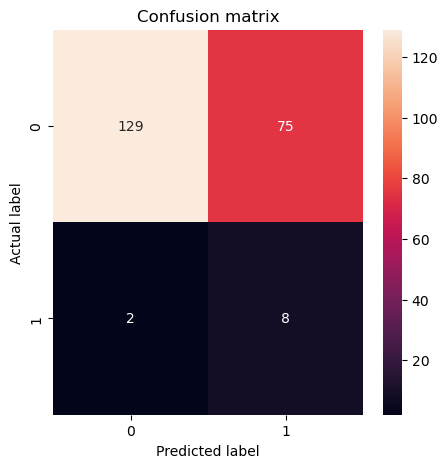

In [44]:
auc_keras,model_keras,predy_keras= dl_kears(X_train, X_test, y_train, y_test)
#model_keras.save('nn_model_new21.h5')

In [25]:
from tensorflow.keras.models import load_model 
model_keras = load_model('nn_model_new21.h5')
predy_keras = model_keras.predict(X_test)[:,0]

7/7 [==============================] - 0s 2ms/step


In [26]:
roc_auc_score(y_test, predy_keras)

0.6985294117647058

### catboost

In [27]:
from catboost import CatBoostRegressor
def cat_boost(x_train_cb , x_test_cb ,y_train_cb,y_test_cb):
    model_cb = CatBoostRegressor(**param_catboost)
    model_cb.fit(x_train_cb, y_train_cb)  
    preds_cb = model_cb.predict(x_test_cb)
    p = get_p(y_test_cb, preds_cb)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(y_test_cb)):
        if  preds_cb[i] > p: 
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(y_test_cb, pred_y_thr)
    print(confusion_matrix(y_test_cb, pred_y_thr))
    print(classification_report(y_test_cb, pred_y_thr, digits=3))
    auc = roc_auc_score(y_test_cb, preds_cb)
    print(f'auc_score  is {auc}')
    return auc,model_cb,preds_cb



0:	learn: 0.2244203	total: 155ms	remaining: 8.85s
1:	learn: 0.2230815	total: 162ms	remaining: 4.52s
2:	learn: 0.2210272	total: 167ms	remaining: 3.07s
3:	learn: 0.2188962	total: 175ms	remaining: 2.36s
4:	learn: 0.2171739	total: 181ms	remaining: 1.92s
5:	learn: 0.2152306	total: 187ms	remaining: 1.62s
6:	learn: 0.2128745	total: 193ms	remaining: 1.41s
7:	learn: 0.2107697	total: 200ms	remaining: 1.25s
8:	learn: 0.2091225	total: 207ms	remaining: 1.13s
9:	learn: 0.2075418	total: 213ms	remaining: 1.02s
10:	learn: 0.2060565	total: 220ms	remaining: 939ms
11:	learn: 0.2044094	total: 226ms	remaining: 867ms
12:	learn: 0.2024676	total: 233ms	remaining: 806ms
13:	learn: 0.2014875	total: 240ms	remaining: 753ms
14:	learn: 0.1999109	total: 246ms	remaining: 705ms
15:	learn: 0.1981916	total: 253ms	remaining: 664ms
16:	learn: 0.1973798	total: 259ms	remaining: 625ms
17:	learn: 0.1959100	total: 266ms	remaining: 591ms
18:	learn: 0.1939010	total: 273ms	remaining: 561ms
19:	learn: 0.1930380	total: 280ms	remaini

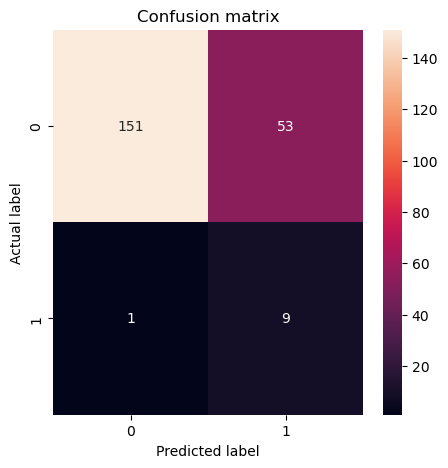

In [28]:
auc_cb,model_cb,predy_cb= cat_boost(X_train, X_test, y_train, y_test)

### Decision tree

In [29]:
from sklearn import tree
def decision_tree(x_train_dt ,x_test_dt , y_train_dt, y_test_dt):
    model_dt = tree.DecisionTreeRegressor(**param_dt)
    model_dt.fit(x_train_dt, y_train_dt)
    preds_dt = model_dt.predict(x_test_dt)
    p = get_p(y_test_dt, preds_dt)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(y_test_dt)):
        if  preds_dt[i] > p: 
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(y_test_dt, pred_y_thr)
    print(confusion_matrix(y_test_dt, pred_y_thr))
    print(classification_report(y_test_dt, pred_y_thr, digits=3))
    auc_dt = roc_auc_score(y_test_dt,preds_dt)
    print(f'auc_score  is {auc_dt}')
    return auc_dt,model_dt,preds_dt

最佳阈值: 0.11800000000000001
[[162  42]
 [  4   6]]
              precision    recall  f1-score   support

         0.0      0.976     0.794     0.876       204
         1.0      0.125     0.600     0.207        10

    accuracy                          0.785       214
   macro avg      0.550     0.697     0.541       214
weighted avg      0.936     0.785     0.844       214

auc_score  is 0.7526960784313725


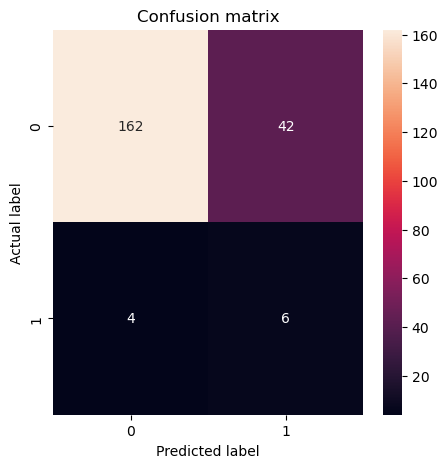

In [30]:
auc_dt,model_dt,predy_dt= decision_tree(X_train, X_test, y_train, y_test)

### SVM

In [31]:
from sklearn import svm
def svm1(x_train_sv ,x_test_sv , y_train_sv, y_test_sv):
    model_sv = svm.SVR(**param_svm)
    model_sv.fit(x_train_sv, y_train_sv)
    preds_sv = model_sv.predict(x_test_sv)
    
    p = get_p(y_test_sv, preds_sv)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(y_test_sv)):
        if  preds_sv[i] > p: 
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(y_test_sv, pred_y_thr)
    print(confusion_matrix(y_test_sv, pred_y_thr))
    print(classification_report(y_test_sv, pred_y_thr, digits=3))
    auc_sv = roc_auc_score(y_test_sv,preds_sv)
    print(f'auc_score  is {auc_sv}')
    return auc_sv,model_sv,preds_sv

最佳阈值: 0.096
[[122  82]
 [  2   8]]
              precision    recall  f1-score   support

         0.0      0.984     0.598     0.744       204
         1.0      0.089     0.800     0.160        10

    accuracy                          0.607       214
   macro avg      0.536     0.699     0.452       214
weighted avg      0.942     0.607     0.717       214

auc_score  is 0.7558823529411764


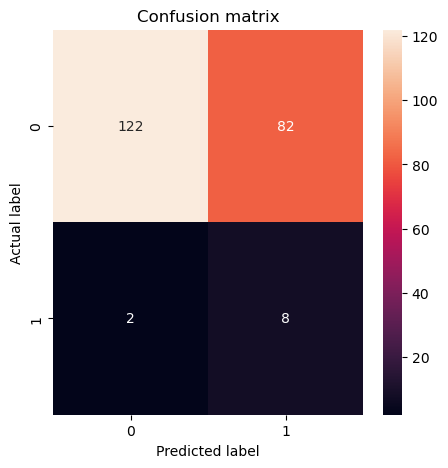

In [32]:
auc_svm,model_svm,predy_svm= svm1(X_train, X_test, y_train, y_test)

### Random forest

In [33]:
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier
def rf(x_train_rf ,x_test_rf, y_train_rf, y_test_rf):
    model_rf = RandomForestRegressor(**param_rf)
    model_rf.fit(x_train_rf, y_train_rf)
    preds_rf = model_rf.predict(x_test_rf)
    p = get_p(y_test_rf, preds_rf)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(y_test_rf)):
        if  preds_rf[i] > p: 
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(y_test_rf, pred_y_thr)
    print(confusion_matrix(y_test_rf, pred_y_thr))
    print(classification_report(y_test_rf, pred_y_thr, digits=3))
    auc_rf = roc_auc_score(y_test_rf,preds_rf)
    print(f'auc_score  is {auc_rf}')
    return auc_rf,model_rf,preds_rf

最佳阈值: 0.232
[[178  26]
 [  4   6]]
              precision    recall  f1-score   support

         0.0      0.978     0.873     0.922       204
         1.0      0.188     0.600     0.286        10

    accuracy                          0.860       214
   macro avg      0.583     0.736     0.604       214
weighted avg      0.941     0.860     0.893       214

auc_score  is 0.7083333333333334


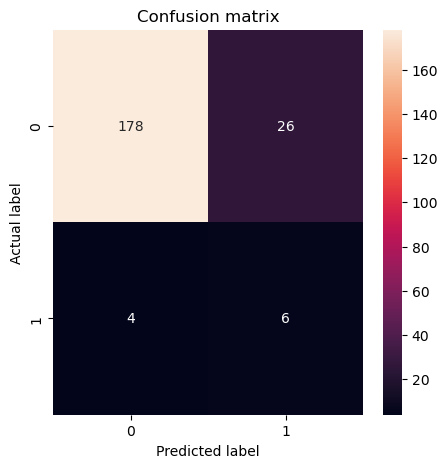

In [34]:
auc_rf,model_rf,predy_rf= rf(X_train, X_test, y_train, y_test)

### KNN

In [35]:
from sklearn.neighbors import KNeighborsRegressor
def kn(x_train_knn ,x_test_knn, y_train_knn, y_test_knn):
    model_knn = KNeighborsRegressor(**param_kn)
    model_knn.fit(x_train_knn, y_train_knn)
    preds_knn = model_knn.predict(x_test_knn)
    p = get_p(y_test_knn, preds_knn)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(y_test_knn)):
        if  preds_knn[i] > p:
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(y_test_knn, pred_y_thr)
    print(confusion_matrix(y_test_knn, pred_y_thr))
    print(classification_report(y_test_knn, pred_y_thr, digits=3))
    auc_knn = roc_auc_score(y_test_knn,preds_knn)
    print(f'auc_score  is {auc_knn}')
    return auc_knn,model_knn,preds_knn

最佳阈值: 0.2
[[155  49]
 [  3   7]]
              precision    recall  f1-score   support

         0.0      0.981     0.760     0.856       204
         1.0      0.125     0.700     0.212        10

    accuracy                          0.757       214
   macro avg      0.553     0.730     0.534       214
weighted avg      0.941     0.757     0.826       214

auc_score  is 0.7142156862745098


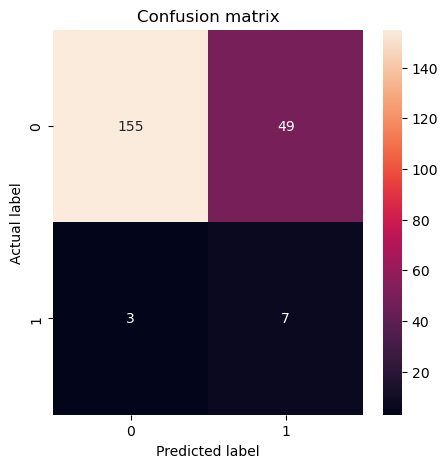

In [36]:
auc_knn,model_knn,predy_knn= kn(X_train, X_test, y_train, y_test)

### NB

In [37]:
from sklearn.naive_bayes import BernoulliNB
def nb(x_train_nb ,x_test_nb, y_train_nb, y_test_nb):
    model_nb = BernoulliNB()
    model_nb.fit(x_train_nb, y_train_nb)
    preds_nb = model_nb.predict(x_test_nb)
    p = get_p(y_test_nb, preds_nb)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(y_test_nb)):
        if  preds_nb[i] > p: 
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(y_test_nb, pred_y_thr)
    print(confusion_matrix(y_test_nb, pred_y_thr))
    print(classification_report(y_test_nb, pred_y_thr, digits=5))
    auc_nb = roc_auc_score(y_test_nb,preds_nb)
    print(f'auc_score  is {auc_nb}')
    return auc_nb,model_nb,preds_nb

In [9]:
auc_nb,model_nb,predy_nb= nb(X_train, X_test, y_train, y_test)

NameError: name 'nb' is not defined

In [191]:
X_test

,Sex,Human_Albumin,Additiv_enzyme_inhibitors,ALB,ALT,ALKP,BU,GLB,TP
0,-0.758014,-0.448155,-0.723923,-0.737751,0.498672,-0.409568,-0.202352,-0.083909,-0.489855
1,-0.758014,2.231372,-0.723923,-0.737751,-0.344234,-0.953960,0.366213,0.450152,-0.168752
2,-0.758014,-0.448155,-0.723923,-0.556525,1.033593,-0.872301,4.546842,-0.795991,-0.810959
3,-0.758014,-0.448155,-0.723923,0.349608,-0.246976,-1.062838,1.704014,-0.617970,-0.168752
4,-0.758014,-0.448155,-0.723923,0.168382,-0.263185,-0.817862,-0.603693,0.094111,0.152352
...,...,...,...,...,...,...,...,...,...
209,-0.758014,-0.448155,1.381363,1.255742,-0.036249,0.243703,-0.302687,-0.083909,0.687525
210,-0.758014,2.231372,1.381363,-0.012845,-0.376653,0.134825,-0.135462,-0.083909,-0.061717
211,-0.758014,-0.448155,-0.723923,1.074515,0.271736,-0.110152,-1.005033,0.094111,0.687525
212,-0.758014,-0.448155,1.381363,0.712062,-0.198346,-0.355128,-0.202352,-0.261929,0.259387


### xgboost

In [39]:
from xgboost import XGBRegressor
def xg(x_train_xg ,x_test_xg, y_train_xg, y_test_xg):
    model_xg = XGBRegressor(**param_xg)
    model_xg.fit(x_train_xg, y_train_xg)
    preds_xg = model_xg.predict(x_test_xg)
    p = get_p(y_test_xg, preds_xg)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(y_test_xg)):
        if  preds_xg[i] > p: 
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(y_test_xg, pred_y_thr)
    print(confusion_matrix(y_test_xg, pred_y_thr))
    print(classification_report(y_test_xg, pred_y_thr, digits=3))
    auc_xg = roc_auc_score(y_test_xg,preds_xg)
    print(f'auc_score  is {auc_xg}')
    return auc_xg,model_xg,preds_xg

最佳阈值: 0.213
[[146  58]
 [  2   8]]
              precision    recall  f1-score   support

         0.0      0.986     0.716     0.830       204
         1.0      0.121     0.800     0.211        10

    accuracy                          0.720       214
   macro avg      0.554     0.758     0.520       214
weighted avg      0.946     0.720     0.801       214

auc_score  is 0.754656862745098


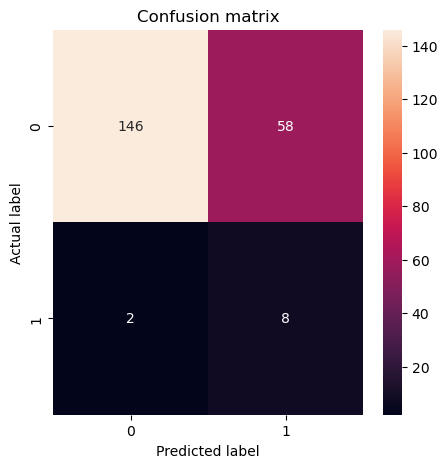

In [40]:
auc_xg,model_xg,predy_xg= xg(X_train, X_test, y_train, y_test)

### GBDT

In [41]:
from sklearn.ensemble import GradientBoostingRegressor
def gbdt(x_train_gbdt ,x_test_gbdt, y_train_gbdt, y_test_gbdt):
    model_gbdt = GradientBoostingRegressor(**param_gb)
    model_gbdt.fit(x_train_gbdt, y_train_gbdt)
    preds_gbdt = model_gbdt.predict(x_test_gbdt)
    p = get_p(y_test_gbdt, preds_gbdt)
    print('Optimal threshold:',p)
    pred_y_thr = []
    for i in range(len(y_test_gbdt)):
        if  preds_gbdt[i] > p: 
            pred_y_thr.append(1)
        else:
            pred_y_thr.append(0)
    plot_cm(y_test_gbdt, pred_y_thr)
    print(confusion_matrix(y_test_gbdt, pred_y_thr))
    print(classification_report(y_test_gbdt, pred_y_thr, digits=3))
    auc_gbdt = roc_auc_score(y_test_gbdt,preds_gbdt)
    print(f'auc_score  is {auc_gbdt}')
    return auc_gbdt,model_gbdt,preds_gbdt

最佳阈值: 0.134
[[118  86]
 [  2   8]]
              precision    recall  f1-score   support

         0.0      0.983     0.578     0.728       204
         1.0      0.085     0.800     0.154        10

    accuracy                          0.589       214
   macro avg      0.534     0.689     0.441       214
weighted avg      0.941     0.589     0.702       214

auc_score  is 0.6730392156862745


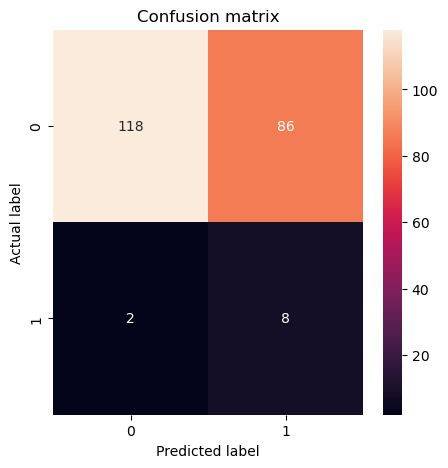

In [42]:
auc_gbdt,model_gbdt,predy_gbdt= gbdt(X_train, X_test, y_train, y_test)

## Model interpretation

## ROC curve plotting

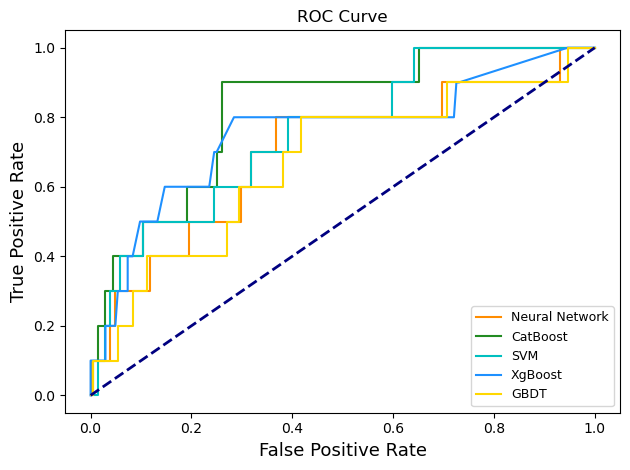

In [49]:
from sklearn.metrics import roc_curve
from sklearn. model_selection import train_test_split
import matplotlib.pyplot as plt

auc_keras = roc_auc_score(y_test,predy_keras)
auc_cb = roc_auc_score(y_test,predy_cb)
#auc_dt = roc_auc_score(y_test,predy_dt)
auc_sv = roc_auc_score(y_test,predy_svm)
#auc_rf = roc_auc_score(y_test,predy_rf)
auc_kn = roc_auc_score(y_test,predy_knn)
#auc_nb = roc_auc_score(y_test,predy_nb)
auc_xg = roc_auc_score(y_test,predy_xg)
auc_gb = roc_auc_score(y_test,predy_gbdt)


fpr,tpr, thresholds = roc_curve(y_test,predy_keras)
fpr2,tpr2, thresholds2 = roc_curve(y_test,predy_cb)
#fpr3,tpr3, thresholds3 = roc_curve(y_test,predy_dt)
fpr4,tpr4, thresholds4 = roc_curve(y_test,predy_svm)
#fpr5,tpr5, thresholds5 = roc_curve(y_test,predy_rf)
#fpr6,tpr6, thresholds6 = roc_curve(y_test,predy_knn)
#fpr7,tpr7, thresholds7 = roc_curve(y_test,predy_nb)
fpr8,tpr8, thresholds8 = roc_curve(y_test,predy_xg)
fpr9,tpr9, thresholds9 = roc_curve(y_test,predy_gbdt)


plt.plot(fpr,tpr,color='darkorange',label='Neural Network')
plt.plot(fpr2,tpr2,color='forestgreen',label='CatBoost')
#plt.plot(fpr3,tpr3,color='tomato',label='Decision Tree')
plt.plot(fpr4,tpr4,color='c',label='SVM')
#plt.plot(fpr5,tpr5,color='y',label='Random Forest')
#plt.plot(fpr6,tpr6,color='skyblue',label='KNN')
#plt.plot(fpr7,tpr7,color='palegreen',label='NB')
plt.plot(fpr8,tpr8,color='dodgerblue',label='XgBoost')
plt.plot(fpr9,tpr9,color='gold',label='GBDT')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate',size = 13)
plt.ylabel('True Positive Rate',size = 13)
plt.title('ROC Curve')
plt.legend(loc="lower right",prop = {'size':9})
plt.tight_layout()
plt.savefig('roc2',dpi=600)

plt.show()

### Decision curve drawing

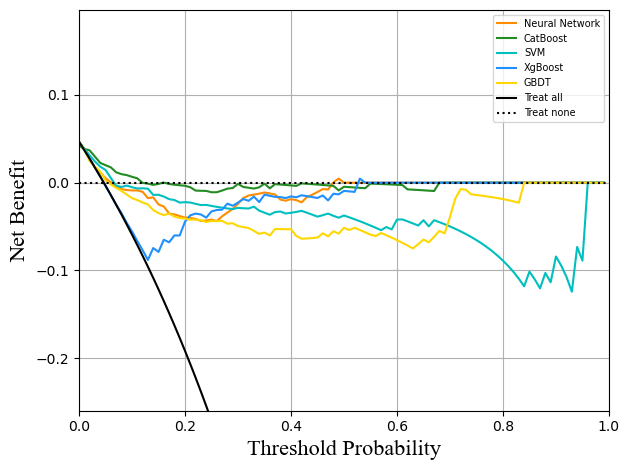

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


def calculate_net_benefit_model(thresh_group, y_pred_score, y_label):
    net_benefit_model = np.array([])
    for thresh in thresh_group:
        y_pred_label = y_pred_score > thresh
        tn, fp, fn, tp = confusion_matrix(y_label, y_pred_label).ravel()
        n = len(y_label)
        net_benefit = (tp / n) - (fp / n) * (thresh / (1 - thresh))
        net_benefit_model = np.append(net_benefit_model, net_benefit)
    return net_benefit_model

def calculate_net_benefit_all(thresh_group, y_label):
    net_benefit_all = np.array([])
    tn, fp, fn, tp = confusion_matrix(y_label, y_label).ravel()
    total = tp + tn
    for thresh in thresh_group:
        net_benefit = (tp / total) - (tn / total) * (thresh / (1 - thresh))
        net_benefit_all = np.append(net_benefit_all, net_benefit)
    return net_benefit_all

if __name__ == '__main__':
    thresh_group = np.arange(0,1,0.01)
    

    net_benefit_model1 = calculate_net_benefit_model(thresh_group, predy_keras, y_test)
    net_benefit_model2 = calculate_net_benefit_model(thresh_group, predy_cb, y_test)
    net_benefit_model3 = calculate_net_benefit_model(thresh_group, predy_dt, y_test)
    net_benefit_model4 = calculate_net_benefit_model(thresh_group, predy_svm,y_test)
    net_benefit_model5 = calculate_net_benefit_model(thresh_group, predy_rf, y_test)
    net_benefit_model6 = calculate_net_benefit_model(thresh_group, predy_knn, y_test)
    net_benefit_model7 = calculate_net_benefit_model(thresh_group, predy_nb, y_test)
    net_benefit_model8 = calculate_net_benefit_model(thresh_group, predy_xg, y_test)
    net_benefit_model9 = calculate_net_benefit_model(thresh_group, predy_gbdt, y_test)
    
    
    net_benefit_all = calculate_net_benefit_all(thresh_group,  y_test)
    
    plt.plot(thresh_group, net_benefit_model1, color = 'darkorange', label = 'Neural Network')
    plt.plot(thresh_group, net_benefit_model2, color = 'forestgreen', label = 'CatBoost')
    #plt.plot(thresh_group, net_benefit_model3, color = 'tomato', label = 'Decision Tree')
    plt.plot(thresh_group, net_benefit_model4, color = 'c', label = 'SVM')
    #plt.plot(thresh_group, net_benefit_model5, color = 'y', label = 'Random Forest')
    #plt.plot(thresh_group, net_benefit_model6, color = 'skyblue', label = 'KNN')
    #plt.plot(thresh_group, net_benefit_model7, color = 'palegreen', label = 'NB')
    plt.plot(thresh_group, net_benefit_model8, color = 'dodgerblue', label = 'XgBoost')
    plt.plot(thresh_group, net_benefit_model9, color = 'gold', label = 'GBDT')
    
    plt.plot(thresh_group, net_benefit_all, color = 'black',label = 'Treat all')
    plt.plot((0, 1), (0, 0), color = 'black', linestyle = ':', label = 'Treat none')
    
    plt.xlim(0,1)
    plt.ylim(net_benefit_model3.min() - 0.15, net_benefit_model3.max() + 0.15)#adjustify the y axis limitation
    plt.xlabel(
        xlabel = 'Threshold Probability', 
        fontdict= {'family': 'Times New Roman', 'fontsize': 16}
        )
    plt.ylabel(
        ylabel = 'Net Benefit', 
        fontdict= {'family': 'Times New Roman', 'fontsize': 16}
        )
    plt.grid('major')
    plt.legend(loc = 'upper right',prop = {'size':7})
    plt.tight_layout()
    plt.tight_layout()
    plt.savefig('juece.png', dpi = 600)
    plt.show()

### Calibration curve drawing

7/7 [==============================] - 0s 998us/step
0.6985294117647058
0.8191176470588235
0.7558823529411764
0.7142156862745098
0.754656862745098
0.6730392156862745


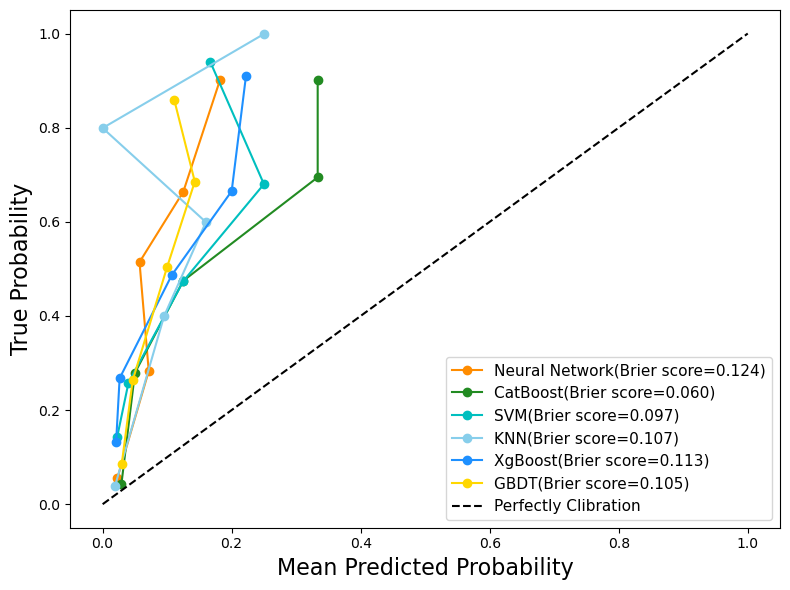

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification as mc
#from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression as LR
from sklearn.metrics import brier_score_loss
from sklearn.calibration import calibration_curve
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from matplotlib.gridspec import GridSpec
from sklearn.calibration import CalibrationDisplay
pre = []
#estimators = [model_keras,model_cb,model_dt,model_svm,model_rf,model_knn,model_nb,model_xg,model_gbdt]
estimators = [model_keras,model_cb,model_svm,model_knn,model_xg,model_gbdt]
#color1 = ['darkorange','forestgreen','tomato','c','y','skyblue','palegreen','dodgerblue','gold']
color1 = ['darkorange','forestgreen','c','skyblue','dodgerblue','gold']
fig, ax = plt.subplots(figsize=(8, 6))
#name = ['Neural Network','CatBoost','Decision Tree','SVM','Random Forest','KNN','NB', 'XgBoost','GBDT']
name = ['Neural Network','CatBoost','SVM','KNN', 'XgBoost','GBDT']

for i, estimator in enumerate(estimators):
        proba = estimator.predict(X_test)
        pre.append(proba)
        scaler = MinMaxScaler(feature_range=(0,0.999))
        proba = scaler.fit_transform(np.reshape(np.array(estimator.predict(X_test)),(-1,1))) 
        trueproba, predproba = calibration_curve(y_test, proba)
        print(roc_auc_score(y_test, proba))
        bls = brier_score_loss(y_test, proba, pos_label=1)
        ax.plot(trueproba, predproba, marker="o",color = color1[i], label='{}(Brier score={:.3f})'.format(name[i], bls))
ax.set_xlabel('Mean Predicted Probability',size = 16)
ax.set_ylabel('True Probability',size = 16)
ax.set_ylim(-0.05, 1.05)
ax.plot([0, 1], [0, 1], '--', c='k', label='Perfectly Clibration')
#ax.legend(loc='best')
ax.legend(loc="best",prop = {'size':11})
plt.tight_layout()
fig.savefig('calibration_df.png', dpi = 600)
plt.show()

### Model interpretation using shap

In [107]:
explainer = shap.SamplingExplainer(model_cb.predict, X_train)
shap_values = explainer(X_test)

100%|████████████████████████████████████████████████████████████████████████████████| 214/214 [01:26<00:00,  2.47it/s]


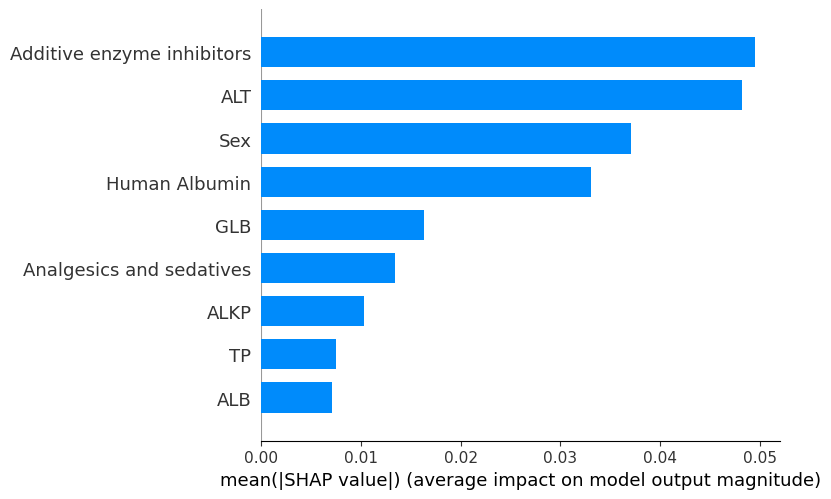

In [109]:
shap.summary_plot(shap_values,X_test,plot_type="bar")

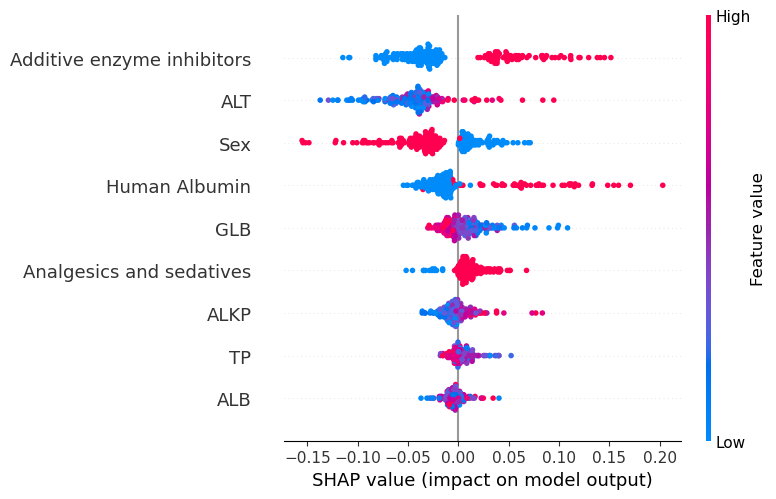

In [110]:
shap.summary_plot(shap_values,X_test)

In [252]:
shap_values.values.sum(axis = 1)

(250,)

### Interpretation of individual samples using shap

In [ ]:
shap.initjs()
#explainer = shap.SamplingExplainer(model_deepforest.predict, X_train)
#shap_values = explainer(X_test)
#shap_values.base_values = shap_values.base_values[0]
shap.plots.waterfall(shap_values[0])

### Interpretation of individual samples using lime

In [112]:
import lime  
from lime import lime_tabular  
from sklearn.ensemble import RandomForestClassifier  

interpretor = lime_tabular.LimeTabularExplainer(  
    training_data=np.array(X_train),  
    feature_names=X_train.columns,  
    mode='regression')  

exp = interpretor.explain_instance(  
    data_row=X_test.iloc[1], 
    predict_fn=model_cb.predict,num_features=9)  
exp.show_in_notebook(show_table=True)  